Hydro powerplant constraints forecast - power blocks by clusering

In this experiment, we attempy at forecasting power blocks by using clustering. Hence regression will be achieved by doing solving a classification probem.

# Initial preparation
## Import libraries

In [117]:
import math
import pandas as pd
import numpy as np
import array as arr
import re 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error, mean_absolute_error
import statistics 
from functools import reduce
from pyclustering.cluster.silhouette import silhouette
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.utils import metric, distance_metric, type_metric

### General helper functions

In [118]:
def computeEnergyPairs(dfInput):
    # Compute prediction energy by pair, i.e. nb of hours times power (from 1 to 8 pairs)
    for i in range(1, 4+1):
        HourIndex = "PrioH"+str(i)
        PwrIndex  = "PrioP"+str(i)
        PowerVar  = dfInput[HourIndex]*dfInput[PwrIndex]
        # Add column to dataframe
        New_Col_Name = "EnergyPair"+str(i)
        dfInput[New_Col_Name] = PowerVar

In [119]:
# helper function to make 24 hour vector out of blocks list
# returns a dataframe with 24 hours vectors as lines in a dataframe , from the blocks received as input
def get24hoursEnergyVector(prefixHour, prefixPower, dfInput, prefixOutputCols = ""):
    # create result dataframe
    resCols = []    
    dfResult = pd.DataFrame(index=dfInput.index, columns = [prefixOutputCols+str(i) for i in range(24)])
    
    for myIndex in dfInput.index:
        iVectorIndex = 0
        resVect = np.zeros(24)
        for iPair in range(1,4+1):
            NbHours = int(dfInput.loc[myIndex,prefixHour+str(iPair)])
            Power = dfInput.loc[myIndex,prefixPower+str(iPair)]   
            resVect[iVectorIndex:iVectorIndex+NbHours] = Power
            iVectorIndex = iVectorIndex + NbHours
        dfResult.loc[myIndex] = resVect  
    return dfResult

In [120]:
# plot stacked bars corresponding to energy blocks with different colors
# saves result in SVG format
def plotEnergyBlocks(dfInput, blockLabel, filename):
    computeEnergyPairs(dfInput)
    fig=plt.figure(figsize=(14, 6), dpi= 80, edgecolor='k')
    plt.bar(dfInput.index, dfInput.EnergyPair1, color = 'b', label=blockLabel+" 1")
    plt.bar(dfInput.index, dfInput.EnergyPair2, color = 'r', bottom = dfInput.EnergyPair1, label=blockLabel+" 2")
    plt.bar(dfInput.index, dfInput.EnergyPair3, color = 'y', bottom = dfInput.EnergyPair1+dfInput.EnergyPair2, label=blockLabel+" 3")
    plt.bar(dfInput.index, dfInput.EnergyPair4, color = 'c', bottom = dfInput.EnergyPair1+dfInput.EnergyPair2+dfInput.EnergyPair3, label=blockLabel+" 4")
    plt.legend(loc='upper right')
    plt.show()
    fig.savefig(filename+'.svg', format='svg')

### Read source file into data frame and display columns

In [121]:
dateparse = lambda x: pd.datetime.strptime(x, '%Y-%m-%d')

df = pd.read_csv("clean_dataframe.csv", parse_dates=['Date'], date_parser=dateparse, index_col="Date.1")
# rename date column 
df.rename(columns={ df.columns[0]: "Date"}, inplace=True)
df.index = df["Date"]

df.rename(columns={ "Variante Prio": "Max prod"}, inplace=True)

### Check first few lines of imported file

In [122]:
df.head()

,Date,Min prod,Inflow lake 1 [m3],Inflow lake 2 [m3],Inflow lake 3 [m3],Inflow lake 4 [m3],Vol lake 1 [%],Max lake 1 [1000m3],Availability plant 1 [%],Availability plant 2 [%],...,Max prod,PrioH1,PrioP1,PrioH2,PrioP2,PrioH3,PrioP3,PrioH4,PrioP4,TotalAvailablePower
Date,,,,,,,,,,,,,,,,,,,,,
2014-04-01,2014-04-01,0.0,31.0,4.0,129.0,107.0,0.16467,30000.0,1.0,1.0,...,902.4,4.0,73.8,4.0,66.0,8.0,42.9,0.0,0.0,77.400
2014-04-02,2014-04-02,150.0,0.0,-14.0,148.0,116.0,0.15557,30000.0,1.0,1.0,...,902.4,4.0,73.8,4.0,66.0,8.0,42.9,0.0,0.0,77.400
2014-04-03,2014-04-03,150.0,10.0,6.0,132.0,118.0,0.14765,30000.0,1.0,1.0,...,902.4,4.0,73.8,4.0,66.0,8.0,42.9,0.0,0.0,59.125
2014-04-04,2014-04-04,150.0,19.0,6.0,150.0,118.0,0.13716,30000.0,1.0,1.0,...,902.4,4.0,73.8,4.0,66.0,8.0,42.9,0.0,0.0,58.050
2014-04-05,2014-04-05,180.0,41.0,15.0,148.0,124.0,0.13091,30000.0,1.0,1.0,...,897.6,4.0,72.6,4.0,66.0,8.0,42.9,0.0,0.0,77.400


In [123]:
# display info about our dataframe, i.e. features types, labels, number of values including NaN indication
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1917 entries, 2014-04-01 to 2019-06-30
Data columns (total 24 columns):
Date                        1917 non-null datetime64[ns]
Min prod                    1917 non-null float64
Inflow lake 1 [m3]          1917 non-null float64
Inflow lake 2 [m3]          1917 non-null float64
Inflow lake 3 [m3]          1917 non-null float64
Inflow lake 4 [m3]          1917 non-null float64
Vol lake 1 [%]              1917 non-null float64
Max lake 1 [1000m3]         1917 non-null float64
Availability plant 1 [%]    1917 non-null float64
Availability plant 2 [%]    1917 non-null float64
Availability plant 3 [%]    1917 non-null float64
Availability plant 4 [%]    1917 non-null float64
SDL [MWh]                   1917 non-null float64
Weekend                     1917 non-null bool
Max prod                    1917 non-null float64
PrioH1                      1917 non-null float64
PrioP1                      1917 non-null float64
PrioH2               

# Targets exploratory analysis

## Plotting

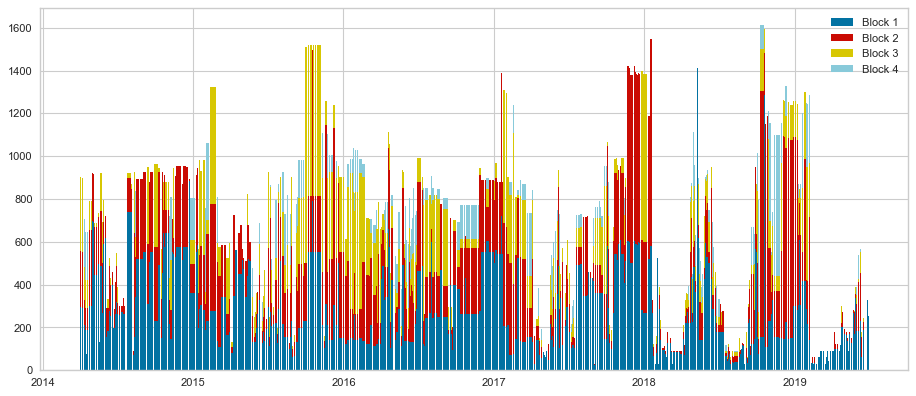

In [124]:
# plot the energy blocks by color (full dataset) 
plotEnergyBlocks(df, "Block", "complete_dataframe")

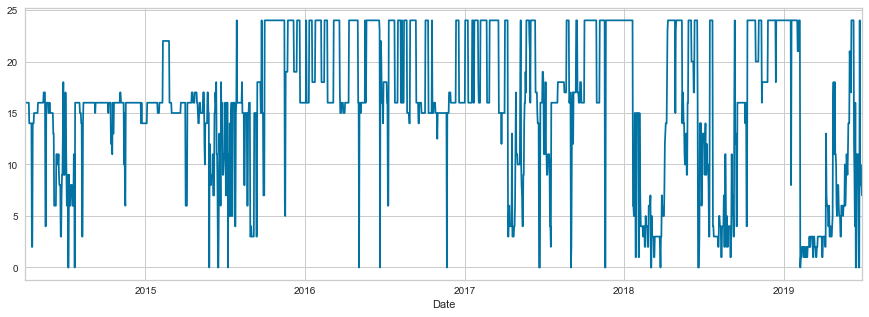

In [125]:
# compute total number of allowed hours (sum of hour component in pairs: Nb Hours 1 + Nb Hours 2+ ...)
SumHours = df.apply(
      lambda row: reduce((lambda x,y: x+y),([row['PrioH'+str(i)] for i in range(1,4+1)] )) 
           ,
        axis=1
      ) 
# Add this as new feature
df["TotalNbHours"] = SumHours

fig_size = plt.rcParams["figure.figsize"]  
fig_size[0] = 15
fig_size[1] = 5
plt.rcParams["figure.figsize"] = fig_size  
SumHours.plot()

In [126]:
#quality check: identify dates when total nb hours = 0 (is this possible?)
display(SumHours[SumHours==0])

Date
2014-07-08    0.0
2014-07-09    0.0
2014-07-23    0.0
2015-05-27    0.0
2015-06-16    0.0
2015-06-17    0.0
2015-07-09    0.0
2016-05-04    0.0
2016-06-21    0.0
2016-11-21    0.0
2017-06-20    0.0
2017-06-21    0.0
2017-06-22    0.0
2017-09-01    0.0
2017-11-18    0.0
2017-11-19    0.0
2018-03-03    0.0
2018-03-04    0.0
2018-03-25    0.0
2018-06-19    0.0
2018-06-20    0.0
2018-06-21    0.0
2019-02-08    0.0
2019-06-15    0.0
2019-06-16    0.0
2019-06-22    0.0
2019-06-23    0.0
dtype: float64

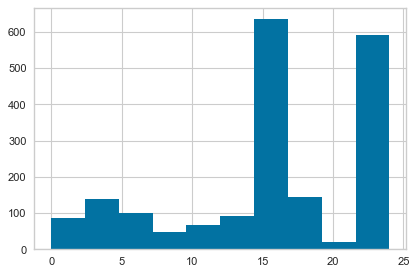

In [127]:
# check distribution of total number of hours
fig=plt.figure(figsize=(6, 4), dpi= 80, facecolor='w', edgecolor='k')
SumHours.hist()

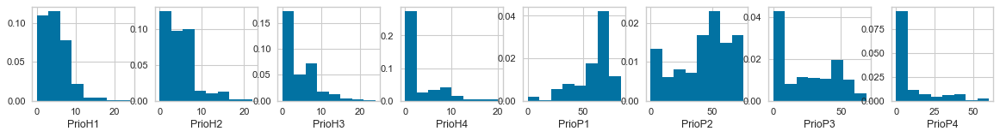

In [128]:
# plot distribution of all pairs values: nb of hours and power

indexPlot = 1
fig=plt.figure(figsize=(18, 4), dpi= 80, facecolor='w', edgecolor='k')
for valType in ["PrioH","PrioP"]:
    for nbHours in range(1,4+1):
        plt.subplot(2,8,indexPlot) # equivalent to: plt.subplot(2, 2, 1)
        plt.hist(df[valType+str(nbHours)], density=True,bins=8)
        plt.xlabel(valType+str(nbHours));
        indexPlot = indexPlot+1

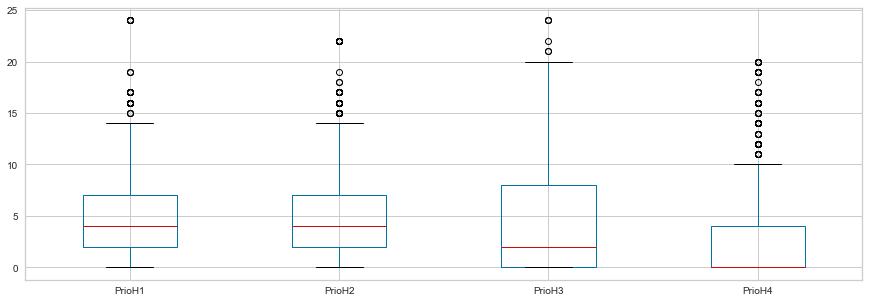

In [129]:
# draw boxplots for nb of hours values
df.boxplot(column= ['PrioH1','PrioH2','PrioH3','PrioH4'])

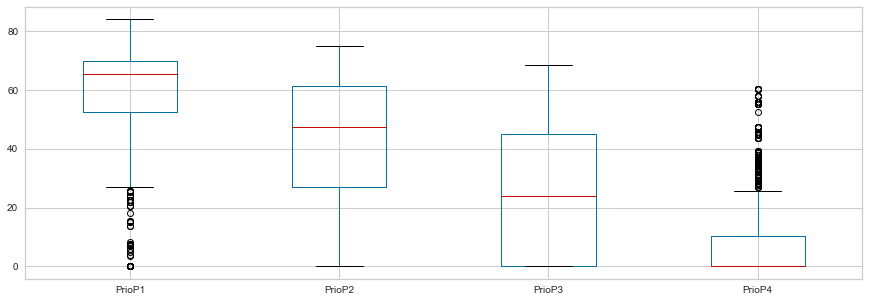

In [130]:
# draw boxplots for power values
df.boxplot(column= ['PrioP1','PrioP2','PrioP3','PrioP4'])

In [131]:
# count number of unique pair combinations
cols =  ['PrioH1','PrioH2','PrioH3','PrioH4', 'PrioP1','PrioP2','PrioP3','PrioP4']
print(df.filter(cols).drop_duplicates().count()) # = 688 ! vs 1917 total number of entries

PrioH1    688
PrioH2    688
PrioH3    688
PrioH4    688
PrioP1    688
PrioP2    688
PrioP3    688
PrioP4    688
dtype: int64


In [132]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
import pylab as pl
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [133]:
#define dataset
df_cluster = df.filter(cols, axis=1) # not including ["TotalNbHours"] in the list

df_cluster.head()

,PrioH1,PrioH2,PrioH3,PrioH4,PrioP1,PrioP2,PrioP3,PrioP4
Date,,,,,,,,
2014-04-01,4.0,4.0,8.0,0.0,73.8,66.0,42.9,0.0
2014-04-02,4.0,4.0,8.0,0.0,73.8,66.0,42.9,0.0
2014-04-03,4.0,4.0,8.0,0.0,73.8,66.0,42.9,0.0
2014-04-04,4.0,4.0,8.0,0.0,73.8,66.0,42.9,0.0
2014-04-05,4.0,4.0,8.0,0.0,72.6,66.0,42.9,0.0


In [134]:
# check basic statistics
display(round(df_cluster.describe(),2))

,PrioH1,PrioH2,PrioH3,PrioH4,PrioP1,PrioP2,PrioP3,PrioP4
count,1917.00,1917.00,1917.00,1917.00,1917.00,1917.00,1917.00,1917.00
mean,4.68,4.87,3.86,2.52,59.03,42.46,24.06,8.06
std,3.32,3.95,4.31,4.16,16.40,21.27,21.59,14.10
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,2.00,2.00,0.00,0.00,52.50,27.00,0.00,0.00
50%,4.00,4.00,2.00,0.00,65.40,47.40,24.00,0.00
75%,7.00,7.00,8.00,4.00,69.90,61.50,45.00,10.50
max,24.00,22.00,24.00,20.00,84.00,75.00,68.65,60.30


In [135]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2).fit_transform(df_cluster)
# Save components to a DataFrame
PCA_components = pd.DataFrame(pca)

([<matplotlib.axis.XTick at 0x1fb5d9c2d30>,
 <a list of 8 Text xticklabel objects>)

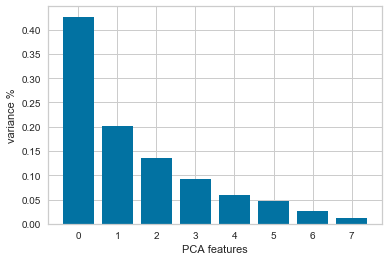

In [136]:
#PCA_components
from sklearn.preprocessing import StandardScaler
# Standardize the data to have a mean of ~0 and a variance of 1
X_std = StandardScaler().fit_transform(df_cluster)

# Create a PCA instance: pca
pca = PCA(n_components=8)
principalComponents = pca.fit_transform(X_std)
# Plot the explained variances
features = range(pca.n_components_)
plt.bar(features, pca.explained_variance_ratio_)
plt.xlabel('PCA features')
plt.ylabel('variance %')
plt.xticks(features)


Text(0, 0.5, 'PCA 2')

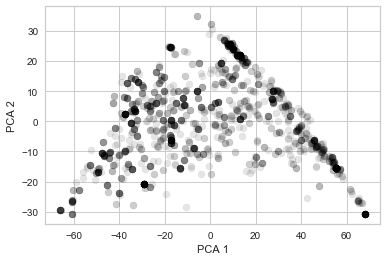

In [137]:
plt.scatter(PCA_components[0], PCA_components[1], alpha=.1, color='black')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')

In [138]:
#standardize the data to normal distribution
from sklearn.preprocessing import MinMaxScaler

mms = MinMaxScaler()
mms.fit(df_cluster)
data_transformed = mms.transform(df_cluster)

In [139]:
Sum_of_squared_distances = []
SilouhetteAvg = []
K = range(1,50)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(data_transformed)
    Sum_of_squared_distances.append(km.inertia_)
    #silhouette_avg = silhouette_score(df_cluster, km)
    #SilouhetteAvg.append(silhouette_avg) 

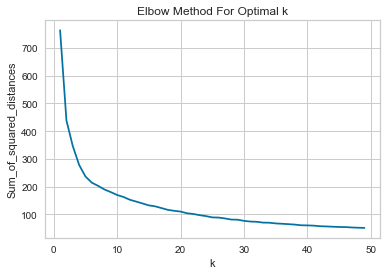

In [140]:
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

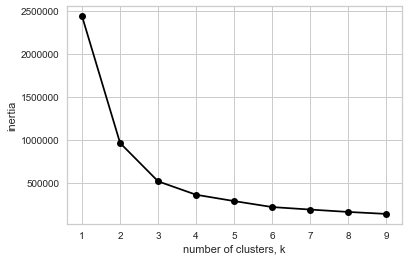

In [141]:
# ref: https://medium.com/@dmitriy.kavyazin/principal-component-analysis-and-k-means-clustering-to-visualize-a-high-dimensional-dataset-577b2a7a5fe2
ks = range(1, 10)
inertias = []
for k in ks:
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters=k)
    
    # Fit model to samples
    model.fit(PCA_components.iloc[:,:3])
    
    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
    
plt.plot(ks, inertias, '-o', color='black')
plt.xlabel('number of clusters, k')
plt.ylabel('inertia')
plt.xticks(ks)
plt.show()

## k-medoids clustering method implementation


In [142]:
df_cluster.head()

,PrioH1,PrioH2,PrioH3,PrioH4,PrioP1,PrioP2,PrioP3,PrioP4
Date,,,,,,,,
2014-04-01,4.0,4.0,8.0,0.0,73.8,66.0,42.9,0.0
2014-04-02,4.0,4.0,8.0,0.0,73.8,66.0,42.9,0.0
2014-04-03,4.0,4.0,8.0,0.0,73.8,66.0,42.9,0.0
2014-04-04,4.0,4.0,8.0,0.0,73.8,66.0,42.9,0.0
2014-04-05,4.0,4.0,8.0,0.0,72.6,66.0,42.9,0.0


In [143]:
# define number of clusters
ClusterNb = 8
IndexStep = int(round(1917/ClusterNb))

# Set random initial medoids.
initial_medoids = [i*IndexStep for i in range(1,ClusterNb)]

# use the scaled input values
cluster_input = data_transformed 

# Create instance of K-Medoids algorithm.
kmedoids_instance = kmedoids(cluster_input, initial_medoids)
# Run cluster analysis and obtain results.
kmedoids_instance.process()
clusters = kmedoids_instance.get_clusters()
centers = kmedoids_instance.get_medoids()
print(centers)
#print(cluster_input[centers])
# build list of cluster ID to assign back to dataframe
cluster_allocation = np.zeros(len(df_cluster.index))
for clust_nb in range(len(clusters)):
    for i in range(len(clusters[clust_nb])):
        #print("Cluster nr %i, element nr %i, valeur %i" %(clust_nb, i, clusters[clust_nb][i]))
        cluster_allocation[clusters[clust_nb][i]] = int(clust_nb)

cluster_allocation = cluster_allocation.astype(int)
df_cluster["k_medoids"] = cluster_allocation
df_cluster.index = df_cluster["k_medoids"]

[249, 692, 622, 9, 1197, 1137, 742]


In [144]:
df_cluster.index.get_level_values('k_medoids')

Int64Index([1, 1, 1, 1, 1, 1, 1, 1, 1, 3,
            ...
            5, 5, 5, 5, 5, 5, 5, 5, 5, 5],
           dtype='int64', name='k_medoids', length=1917)

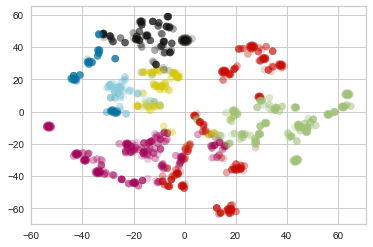

In [145]:
# plot the resulting cluster allocation with TSNE algorithm
from sklearn.manifold import TSNE
import matplotlib.colors

np.random.seed(42) # set seed for reproducibility

color_list = 'rgbkymc' 
cluster_values = sorted(df_cluster.index.get_level_values('k_medoids').unique())

tsne = TSNE()
results_tsne = tsne.fit_transform(data_transformed) #df_cluster)

cmap = matplotlib.colors.LinearSegmentedColormap.from_list(cluster_values, color_list)

plt.scatter(results_tsne[:,0], results_tsne[:,1],
    c=df_cluster.index.get_level_values('k_medoids'),
    cmap=cmap, 
    alpha=0.2, 
    )


In [146]:
df_cluster.index.get_level_values('k_medoids').unique()

Int64Index([1, 3, 5, 0, 4, 2, 6], dtype='int64', name='k_medoids')

In [147]:
df_cluster.index.get_level_values('k_medoids')

Int64Index([1, 1, 1, 1, 1, 1, 1, 1, 1, 3,
            ...
            5, 5, 5, 5, 5, 5, 5, 5, 5, 5],
           dtype='int64', name='k_medoids', length=1917)

In [148]:
# PLot silhouette scores
def plotSilhouette(data_transformed, clusters, cluster_allocation, centers, usedMetric=""):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(12, 15)

    labels = cluster_allocation 
    centroids = centers 

    # Get silhouette scores
    silhouette_vals =silhouette(data_transformed, clusters).process().get_score()

    my_colors = 'rgbkymcrgbkymc'

    # Silhouette plot
    y_ticks = []
    y_lower, y_upper = 0, 0
    for i, cluster in enumerate(np.unique(labels)):
        cluster_silhouette_vals = [i for (i, v) in zip(silhouette_vals, labels) if v==cluster]
        cluster_silhouette_vals.sort()
        y_upper += len(cluster_silhouette_vals)
        ax1.barh(range(y_lower, y_upper), cluster_silhouette_vals, edgecolor='none', height=1, 
                 color = my_colors[cluster] )
        ax1.text(-0.03, (y_lower + y_upper) / 2, str(i + 1))
        y_lower += len(cluster_silhouette_vals)

    # Get the average silhouette score and plot it
    avg_score = np.mean(silhouette_vals)
    ax1.axvline(avg_score, linestyle='--', linewidth=2, color='green')
    ax1.set_yticks([])
    ax1.set_xlim([-0.1, 1])
    ax1.set_xlabel('Silhouette coefficient values')
    ax1.set_ylabel('Cluster labels')
    ax1.set_title('Silhouette plot for the various clusters', y=1.02);

    # Scatter plot of data colored with labels, along PCA axis

    ax2.scatter(PCA_components[0], PCA_components[1], alpha=.1, cmap=cmap, 
                c = [my_colors[i] for i in cluster_allocation]  )
    ax2.set_xlabel('PCA 1')
    ax2.set_ylabel('PCA 2')

    #ax2.scatter(X_std[:, 0], X_std[:, 1], c=labels)
    #ax2.scatter(centroids[:, 0], centroids[:, 1], marker='*', c='r', s=250)

    ax2.set_title('Visualization of clustered data', y=1.02)
    ax2.set_aspect('equal')
    plt.tight_layout()
    plt.suptitle('Silhouette analysis');

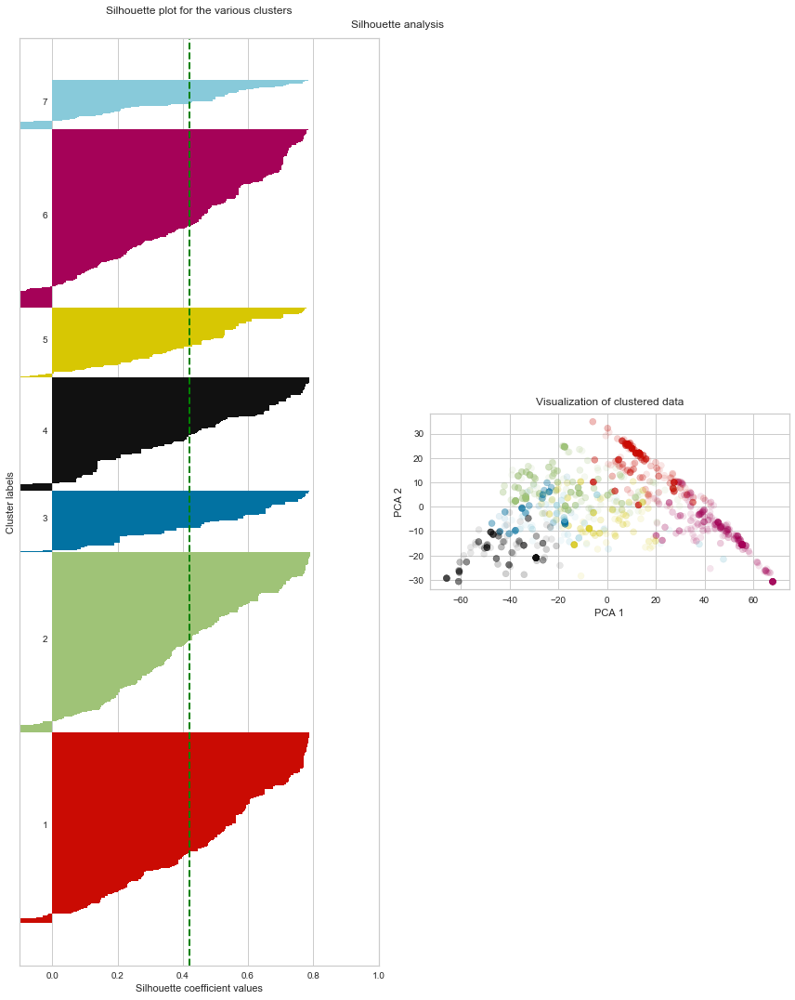

In [149]:
# plot
plotSilhouette(data_transformed, clusters, cluster_allocation, centers)

# Classification problem to predict typical power blocks
 <a name='ClusterClassif' /> </a>

In [150]:
df_cluster = df.filter(cols, axis=1) # power and no of hours columns

# define number of culsters
ClusterNb = 10
IndexStep = int(round(1917/ClusterNb))
# Set random initial medoids.
initial_medoids = [i*IndexStep for i in range(1,ClusterNb)] # initial centroids distributed evenly
# transform data frame into list (of lists)
cluster_input = df_cluster.values
# Create instance of K-Medoids algorithm.
kmedoids_instance = kmedoids(cluster_input, initial_medoids)
# Run cluster analysis and obtain results.
kmedoids_instance.process()
clusters = kmedoids_instance.get_clusters()
centers = kmedoids_instance.get_medoids()
print(centers)
#print(cluster_input[centers])
# build list of cluster ID to assign back to dataframe
cluster_allocation = np.zeros(len(df_cluster.index))
for clust_nb in range(len(clusters)):
    for i in range(len(clusters[clust_nb])):
        #print("Cluster nr %i, element nr %i, valeur %i" %(clust_nb, i, clusters[clust_nb][i]))
        cluster_allocation[clusters[clust_nb][i]] = int(clust_nb)

df_cluster["cluster_id"] = cluster_allocation
df_cluster["cluster_id"] = df_cluster["cluster_id"].astype(int)

[363, 1420, 483, 667, 9, 1627, 231, 650, 724]


In [151]:
df_cluster.iloc[centers[5]]

PrioH1         4.0
PrioH2         5.0
PrioH3         4.0
PrioH4         0.0
PrioP1        55.5
PrioP2        28.8
PrioP3        12.6
PrioP4         0.0
cluster_id     5.0
Name: 2018-09-14 00:00:00, dtype: float64

In [152]:
# check cluster "quality", i.e. delta of values towards medoids. 
# Check energy value for first pair, find occurence where difference lies beyond threshold
nbGtThreshold = 0
colCluster = 8
for index, row in df_cluster.iterrows():
    #print(row.values)
    deltaP1 = row["PrioH1"]*row["PrioP1"]- (df_cluster.iloc[centers[int(row[colCluster])]]["PrioH1"]*
                                      df_cluster.iloc[centers[int(row[colCluster])]]["PrioP1"]) 
    
    if (deltaP1> 50):
        #print(round(deltaP1))
        nbGtThreshold = nbGtThreshold+1
    
print("Nb of values beyond threshold:",nbGtThreshold)

Nb of values beyond threshold: 668


In [153]:
# import maximum production energy best forecast, to use as input variable
# but only in the prediction part, of course
df_MLPprediction = pd.read_csv("ForecastMax prodMLP (10,7,1) Act(lin, relu, relu) Dropout (0.0,0.0)+noneexport_dataframe.csv", parse_dates=['Date'], date_parser=dateparse, index_col="Date")
# rename first column 
df_MLPprediction.rename(columns={ df_MLPprediction.columns[0]: "Prediction"}, inplace=True)

df_MLPprediction.head()

,Prediction,Ground truth,Mean train values,Baseline
Date,,,,
2018-12-21,935.94086,1241.052632,727.020546,855.1
2018-12-22,864.19230,1241.052632,727.020546,853.5
2018-12-23,861.32270,1241.052632,727.020546,824.0
2018-12-24,1002.55360,1241.052632,727.020546,924.7
2018-12-25,910.25616,1241.052632,727.020546,868.5


In [154]:
# splits the input dataframe into train, test for target and input features, using the provided ratio
def GetDataSplit(df_input, regressors, target_feature, target_baseline, ratio):
    # We split using a 90/10 ratio (parameter), but keeping the data in chronological order
    CutPoint = round(len(df.index)*ratio)
    df_model = df_input.filter(regressors, axis=1)
    
    xTrain = df_model.iloc[:CutPoint, :] 
    xTest  = df_model.iloc[CutPoint:, :]
    yTrain = df[target_feature][:CutPoint]   
    yTest  = df[target_feature][CutPoint:]
    yBaseLine = df[target_baseline][CutPoint:] if target_baseline != [] else []
    return [xTrain, xTest, yTrain, yTest, yBaseLine ]

In [155]:
df_cluster.head()

,PrioH1,PrioH2,PrioH3,PrioH4,PrioP1,PrioP2,PrioP3,PrioP4,cluster_id
Date,,,,,,,,,
2014-04-01,4.0,4.0,8.0,0.0,73.8,66.0,42.9,0.0,2
2014-04-02,4.0,4.0,8.0,0.0,73.8,66.0,42.9,0.0,2
2014-04-03,4.0,4.0,8.0,0.0,73.8,66.0,42.9,0.0,2
2014-04-04,4.0,4.0,8.0,0.0,73.8,66.0,42.9,0.0,2
2014-04-05,4.0,4.0,8.0,0.0,72.6,66.0,42.9,0.0,2


In [156]:
# define regression target and explainatory variables
target_feature = 'cluster_id'
regressors = ['Inflow lake 1 [m3]', \
           'Inflow lake 2 [m3]', 'Inflow lake 3 [m3]', 'Inflow lake 4 [m3]', \
           'Vol lake 1 [%]', 'Max lake 1 [1000m3]', 'Availability plant 1 [%]', \
           'Availability plant 2 [%]', 'Availability plant 3 [%]', \
           'Availability plant 4 [%]','Weekend','Max prod']

# implement mutli-output random forest
fullRegressors = regressors

# add cluster allocation column to our dataset
df["cluster_id"] = df_cluster["cluster_id"]

xTrain, xTest, yTrain, yTest, yBaseline =  GetDataSplit(df, fullRegressors, target_feature,[],0.9)

# for the prediction part, replace the max energy with the forecasted value
xTest["Max prod"] = df_MLPprediction["Prediction"]
xTest.head()

,Inflow lake 1 [m3],Inflow lake 2 [m3],Inflow lake 3 [m3],Inflow lake 4 [m3],Vol lake 1 [%],Max lake 1 [1000m3],Availability plant 1 [%],Availability plant 2 [%],Availability plant 3 [%],Availability plant 4 [%],Weekend,Max prod
Date,,,,,,,,,,,,
2018-12-21,51.0,22.9,68.7,41.4,0.34519,30000.0,1.0,1.0,1.0,1.0,False,935.94086
2018-12-22,55.0,28.3,63.5,44.6,0.34262,30000.0,1.0,1.0,1.0,1.0,True,864.19230
2018-12-23,43.0,30.3,58.4,42.2,0.34089,30000.0,1.0,1.0,1.0,1.0,True,861.32270
2018-12-24,96.0,23.3,172.7,194.6,0.34020,30000.0,1.0,1.0,1.0,1.0,False,1002.55360
2018-12-25,69.0,32.0,78.1,95.2,0.34089,30000.0,1.0,1.0,1.0,1.0,False,910.25616


## Hourly Error measure

In [157]:
# compute hourly error. Build first an hourly dataframe, then fill it up with hourly power values
def hourlyErrorMeasure (dfPred, dfGroundTruth):
    # rounding function is ceiling function (not needed for clustering part)
    rounding_func = round 

    # Compute hourly metrics for baseline
    
    # create an hourly dataframe over same period
    # compute hourly values filling up a 24 hours vector
    df_hourly = pd.DataFrame(
            {'Hours': pd.date_range(dfGroundTruth.index.min(), dfGroundTruth.index.max(), freq='1H', closed='left')}
         )
    df_hourly.index = df_hourly['Hours']
    
    # hourly dataframe to store restults, out of complete one
    df_hourly_pred = df_hourly 

    for mydf, mylabel in zip([dfPred, dfGroundTruth],["Pred","GT"]):
                             
        firstDate = mydf.index.min()
        powerHours = np.zeros((len(dfPred.index)-1)*24)
        # loop over all date
        for myDate in dfPred.index:
            # index is date difference times 24
            index = (myDate-firstDate).days * 24
            # compute hourly vector of original values, using the 4 pairs (power/nb of hours)
            currHour = index

            for iPair in range(1,4+1):
                pwrValue = mydf.loc[myDate, "PrioP"+str(iPair)]
                nbHours = int(rounding_func(mydf.loc[myDate, "PrioH"+str(iPair)]))
                if pwrValue > 0:
                    #print("Date %s, Pair %i, Pwr %d, Hours %f" %(myDate, iPair, pwrValue, nbHours))
                    powerHours[currHour:currHour+nbHours] = pwrValue
                    currHour = currHour + nbHours
        df_hourly_pred[mylabel+"Power"]= powerHours

    RMSE = round(math.sqrt(metrics.mean_squared_error(df_hourly_pred["PredPower"],df_hourly_pred["GTPower"])),2)
    MAE = round(metrics.mean_absolute_error(df_hourly_pred["PredPower"],df_hourly_pred["GTPower"]),2)
    R2 = round(metrics.r2_score( df_hourly_pred["PredPower"],df_hourly_pred["GTPower"])*100, 2)
    
    # compute error metrics over hourly values calculated above
    print('Hourly comparison: prediction vs. actual values')
    print('RMSE :'+ str(RMSE))
    print('MAE :'+ str(MAE))
    print('R^2 :'+ str(R2))
    
    # Compute error towards daily energy as well
    # add column with total daily energy to input dataframe, computed back from blocks
    dfPred["DailyMaxEnergy"] = 0
    for i in range (1,4+1):
        dfPred["DailyMaxEnergy"] +=  dfPred["PrioP"+str(i)]*dfPred["PrioH"+str(i)]
 
    DailyRMSE = round(math.sqrt(metrics.mean_squared_error(dfGroundTruth["Max prod"],dfPred["DailyMaxEnergy"])),2)
    DailyMAE = round(metrics.mean_absolute_error(dfGroundTruth["Max prod"],dfPred["DailyMaxEnergy"]),2)
    DailyR2 = round(metrics.r2_score(dfGroundTruth["Max prod"],dfPred["DailyMaxEnergy"])*100, 2)
  
    print('Daily comparison (max prod): prediction vs. actual values')
    print('RMSE :'+ str(DailyRMSE))
    print('MAE :'+ str(DailyMAE))
    print('R^2 :'+ str(DailyR2))
    
    return [RMSE, MAE, R2, DailyRMSE, DailyMAE, DailyR2]

In [158]:
# Import labraries for classification problem

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import classification_report
from sklearn import metrics
from sklearn.ensemble.forest import RandomForestClassifier

In [159]:
# classification algorithm

np.random.seed(42) # set seed for reproducibility
cols = ['PrioH1','PrioH2','PrioH3','PrioH4', 'PrioP1','PrioP2','PrioP3','PrioP4']

# Forecast using Random Forest (1000 trees)
RFmodel = RandomForestClassifier(n_estimators=1000)

# Forecast using k-NN (4 neighbours)
kNNmodel = KNeighborsClassifier(n_neighbors=4)

for myModel in [kNNmodel, RFmodel]:
    # Fit the RF model with features and labels.
    classifyModel = myModel.fit(xTrain, yTrain)

    # predictions
    xPredict = classifyModel.predict(xTest)

    report = classification_report(yTest, xPredict)
    print(myModel)
    print(report)    
    
    # assign the predicted power blocks from the corresponding clusters
    dfxPredict = pd.DataFrame(index=xTest.index, columns=cols)
    dfxPredict["clustedId"] = xPredict
   
    for prefix in ["PrioP","PrioH"]:
        for iPair in range(1,4+1):
            res = np.zeros(len(xPredict))
            for myIndex in range(len(xPredict)):
                res[myIndex] =  df.iloc[centers[xPredict[myIndex]]][prefix+str(iPair)]
            dfxPredict[prefix+str(iPair)] = res
            
    # compute error metrics on hourly values, using the prediction
    hourlyErrorMeasure(dfxPredict, df.iloc[1917-192:,])

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=4, p=2,
                     weights='uniform')
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.10      0.19       125
           2       0.00      0.00      0.00         0
           3       0.00      0.00      0.00         6
           4       0.40      0.25      0.31        16
           5       0.17      0.15      0.16        20
           6       0.00      0.00      0.00         2
           7       0.00      0.00      0.00         0
           8       1.00      0.09      0.16        23

    accuracy                           0.11       192
   macro avg       0.29      0.07      0.09       192
weighted avg       0.82      0.11      0.18       192

Hourly comparison: prediction vs. actual values
RMSE :29.32
MAE :22.11
R^2 :-37.24
Daily comparison (max pro

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
              precision    recall  f1-score   support

           1       0.98      0.68      0.80       125
           2       0.00      0.00      0.00         0
           3       0.00      0.00      0.00         6
           4       0.45      0.62      0.53        16
           5       0.28      0.80      0.42        20
           6       0.00      0.00      0.00         2
           8       1.00      0.09      0.16        23

    accuracy                           0.59       192
   macro avg       0

In [160]:
# performs clustering on input data filtered by provided columns
def clusterCreation (iNbClusters, dfOrig, cols, targetType="", plotSil=False):
    
    df_cluster = dfOrig.filter(cols, axis=1) # filter on columns used for clustering
        
    mms = MinMaxScaler()
    mms.fit(df_cluster)
    cluster_input = mms.transform(df_cluster)
    
    # define number of culsters
    ClusterNb = iNbClusters
    IndexStep = int(round(len(dfOrig.index)/ClusterNb))
    # Set random initial medoids.
    initial_medoids = [i*IndexStep for i in range(1,ClusterNb)] # initial centroids distributed evenly

    # transform data frame into list (of lists)
    #cluster_input = df_cluster.values
    
    # depending on the target type, we use a different metric
    if ("targetType" == "Vector"):
        metric = distance_metric(type_metric.MANHATTAN)
    else:
        metric = distance_metric(type_metric.EUCLIDEAN)
        
    # Create instance of K-Medoids algorithm.
    kmedoids_instance = kmedoids(cluster_input, initial_medoids,metric = metric)
    # Run cluster analysis and obtain results.
    kmedoids_instance.process()
    clusters = kmedoids_instance.get_clusters()
    centers = kmedoids_instance.get_medoids()
    print("Nb of clusters %i" %(len(clusters)))
    print("Nb of centers %i, list:%s" %(len(centers),centers))
    
    # build list of cluster ID to assign back to dataframe 
    #NB: cluster ids are indexes of data points in the dataframe
    cluster_allocation = np.zeros(len(df_cluster.index))
    for clust_nb in range(len(clusters)):
        for i in range(len(clusters[clust_nb])):
            #print("Cluster nr %i, element nr %i, valeur %i" %(clust_nb, i, clusters[clust_nb][i]))
            cluster_allocation[clusters[clust_nb][i]] = int(clust_nb)

    cluster_allocation = cluster_allocation.astype(int)
    df_cluster["cluster_id"] = cluster_allocation
    df_cluster["cluster_id"] = df_cluster["cluster_id"].astype(int) # force type
    
    if plotSil:
        plotSilhouette(cluster_input, clusters, cluster_allocation, centers, metric)
        
    return [df_cluster, centers]

## Cluster classification 

In [161]:
def clusterClassification (modelList, modelNameList, xTrain, yTrain, xTest, yTest, 
                           dfFull, dfCentroids, targetType):
    # create dataframe to store results
    resDf = pd.DataFrame(columns=["Algorithm", "Target Type", "NbClusters", "RMSE", "MAE", "R^2",
                                  "Daily RMSE", "Daily MAE", "Daily R2"])
    
    for myModel, MyModelName in zip(modelList,modelNameList): #[kNNmodel, RFmodel]
        print("**** "+MyModelName+" classification *****")           

        # Fit model with features and labels.
        classifyModel = myModel.fit(xTrain, yTrain)

        # predictions
        xPredict = classifyModel.predict(xTest)

        report = classification_report(yTest, xPredict, output_dict=True)
        print("Result of classification with "+MyModelName)
        print("**** accuracy *****",report['accuracy'])    
        
        # assign the predicted power blocks from the corresponding clusters
        # we resize back the power values using the predicted energy!
        dfxPredict = pd.DataFrame(index=xTest.index, columns=cols)
        dfxPredict["clustedId"] = xPredict
        
        for prefix in ["PrioP","PrioH"]:
            for iPair in range(1,4+1):
                res = np.zeros(len(xPredict))
                for myIndex in range(len(xPredict)):
                    res[myIndex] = dfCentroids.iloc[xPredict[myIndex]][prefix+str(iPair)]
                if prefix == "PrioP": #  resize power columns
                    res = res*xTest["Max prod"]
                dfxPredict[prefix+str(iPair)] = res
        
        # plot enrgy block values
        nbCluster = len(dfCentroids.index)
        plotEnergyBlocks(dfxPredict, "Block", "PredBlocksClust"+targetType+str(nbCluster)+MyModelName)
        plotEnergyBlocks(dfFull.iloc[1917-192:,], "Block", "TruthClust"+str(nbCluster))
        
        # compute error metrics on hourly values, using the prediction
        RSME, MAE, R2, DailyRMSE, DailyMAE, DailyR2 = \
                                hourlyErrorMeasure(dfxPredict, dfFull.iloc[1917-192:,])
        resDf = resDf.append({'Algorithm':MyModelName  , "Target Type": targetType, "NbClusters": str(nbCluster), 
                              "Accuracy": report['accuracy'] , 
                              "RMSE":RSME, "MAE":MAE, "R^2": R2, "Daily RMSE": DailyRMSE, 
                              "Daily MAE":DailyMAE, "Daily R2":DailyR2 } , ignore_index=True)
        
    return resDf

In [162]:
df.head()

,Date,Min prod,Inflow lake 1 [m3],Inflow lake 2 [m3],Inflow lake 3 [m3],Inflow lake 4 [m3],Vol lake 1 [%],Max lake 1 [1000m3],Availability plant 1 [%],Availability plant 2 [%],...,PrioP3,PrioH4,PrioP4,TotalAvailablePower,EnergyPair1,EnergyPair2,EnergyPair3,EnergyPair4,TotalNbHours,cluster_id
Date,,,,,,,,,,,,,,,,,,,,,
2014-04-01,2014-04-01,0.0,31.0,4.0,129.0,107.0,0.16467,30000.0,1.0,1.0,...,42.9,0.0,0.0,77.400,295.2,264.0,343.2,0.0,16.0,2
2014-04-02,2014-04-02,150.0,0.0,-14.0,148.0,116.0,0.15557,30000.0,1.0,1.0,...,42.9,0.0,0.0,77.400,295.2,264.0,343.2,0.0,16.0,2
2014-04-03,2014-04-03,150.0,10.0,6.0,132.0,118.0,0.14765,30000.0,1.0,1.0,...,42.9,0.0,0.0,59.125,295.2,264.0,343.2,0.0,16.0,2
2014-04-04,2014-04-04,150.0,19.0,6.0,150.0,118.0,0.13716,30000.0,1.0,1.0,...,42.9,0.0,0.0,58.050,295.2,264.0,343.2,0.0,16.0,2
2014-04-05,2014-04-05,180.0,41.0,15.0,148.0,124.0,0.13091,30000.0,1.0,1.0,...,42.9,0.0,0.0,77.400,290.4,264.0,343.2,0.0,16.0,2


### Grid search fo best number of clusters 
<a name='ClusterGridSearch' /> </a>

************************************
** clustering Power-Nohours with 5 clusters **
Nb of clusters 4
Nb of centers 4, list:[657, 766, 1367, 667]
Number of centers: 4
**** RF classification *****
Result of classification with RF
**** accuracy ***** 0.7291666666666666


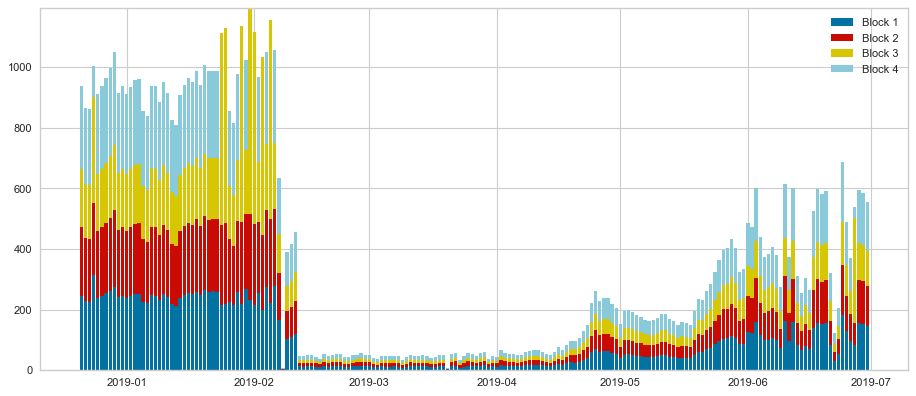

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


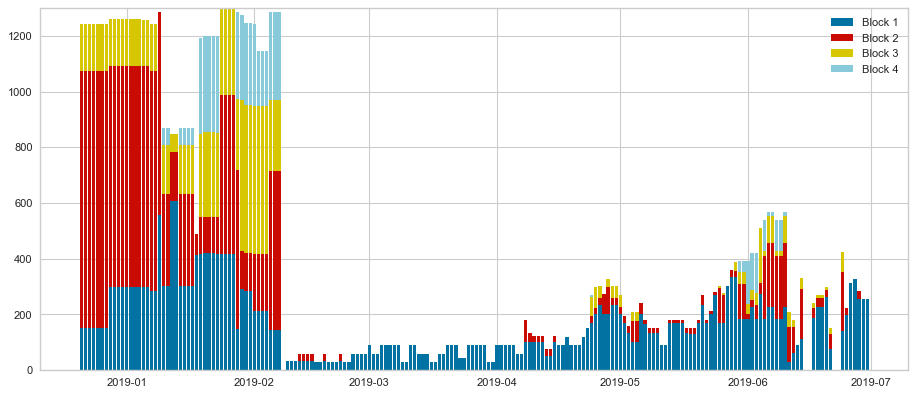

Hourly comparison: prediction vs. actual values
RMSE :15.6
MAE :9.85
R^2 :59.75
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.7291666666666666


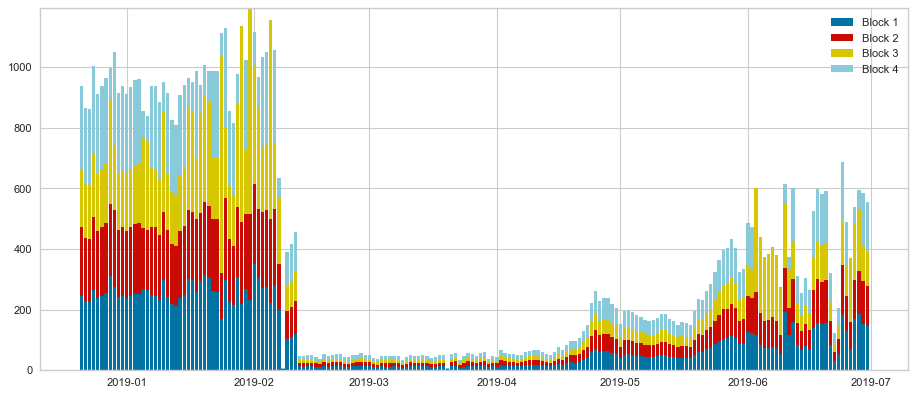

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


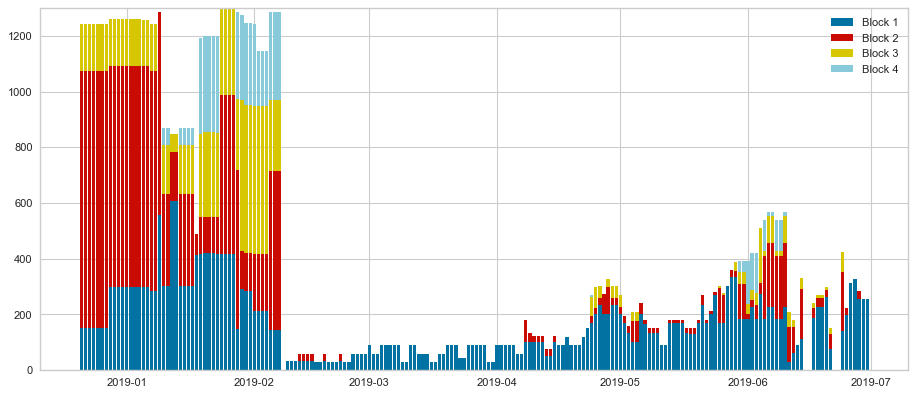

Hourly comparison: prediction vs. actual values
RMSE :15.0
MAE :9.53
R^2 :60.35
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Power-Nohours with 6 clusters **
Nb of clusters 5
Nb of centers 5, list:[1367, 629, 960, 1683, 1590]
Number of centers: 5
**** RF classification *****
Result of classification with RF
**** accuracy ***** 0.7083333333333334


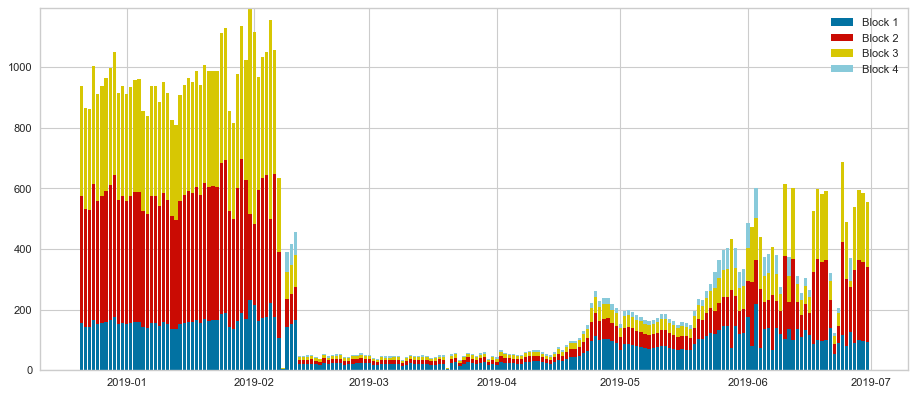

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


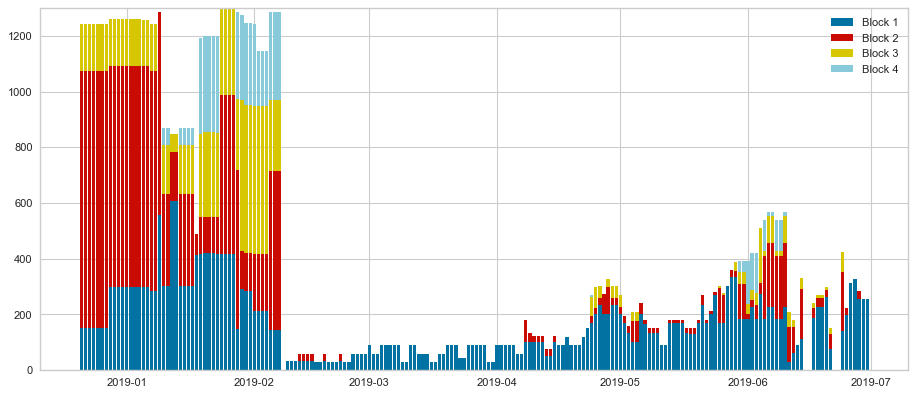

Hourly comparison: prediction vs. actual values
RMSE :14.26
MAE :8.04
R^2 :67.06
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.6770833333333334


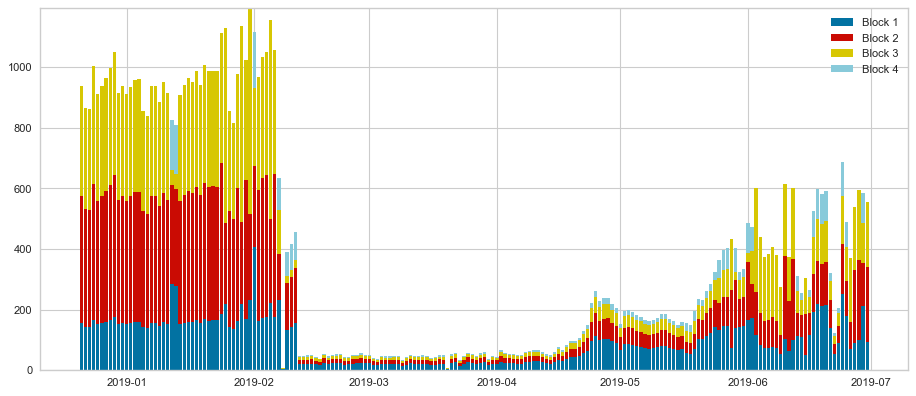

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


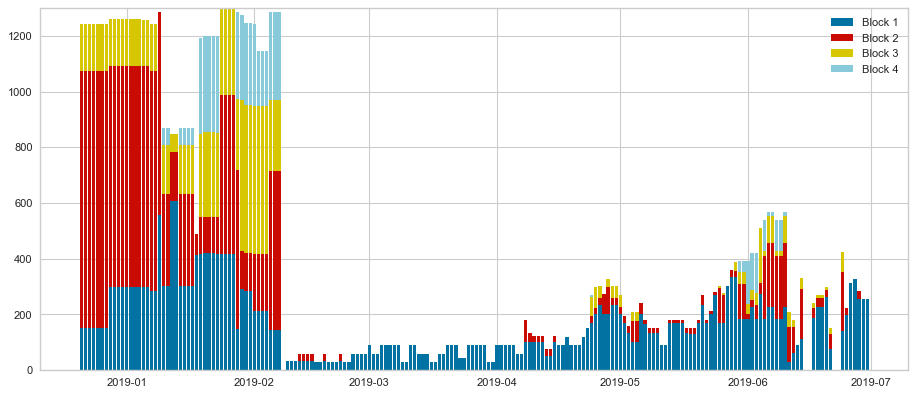

Hourly comparison: prediction vs. actual values
RMSE :14.25
MAE :8.19
R^2 :66.38
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Power-Nohours with 7 clusters **
Nb of clusters 6
Nb of centers 6, list:[455, 1329, 531, 1590, 1891, 161]
Number of centers: 6
**** RF classification *****
Result of classification with RF
**** accuracy ***** 0.5


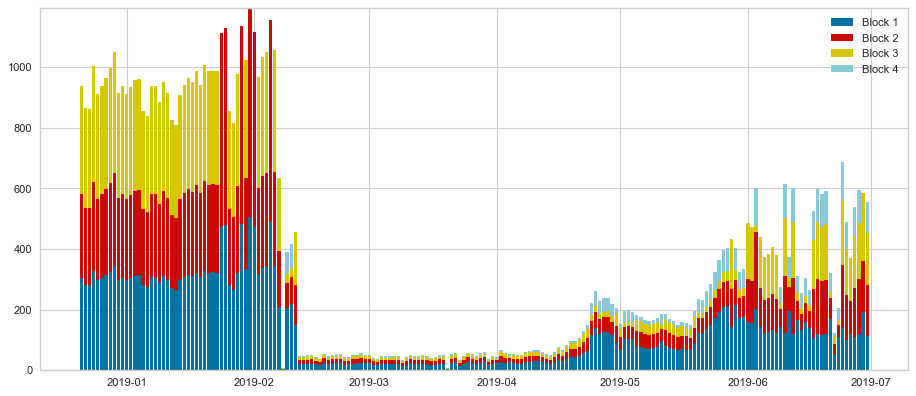

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


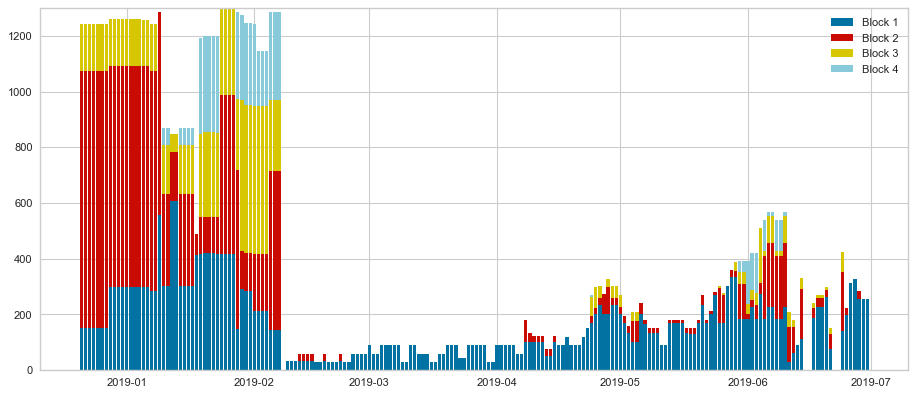

Hourly comparison: prediction vs. actual values
RMSE :12.99
MAE :7.58
R^2 :69.85
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.546875


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


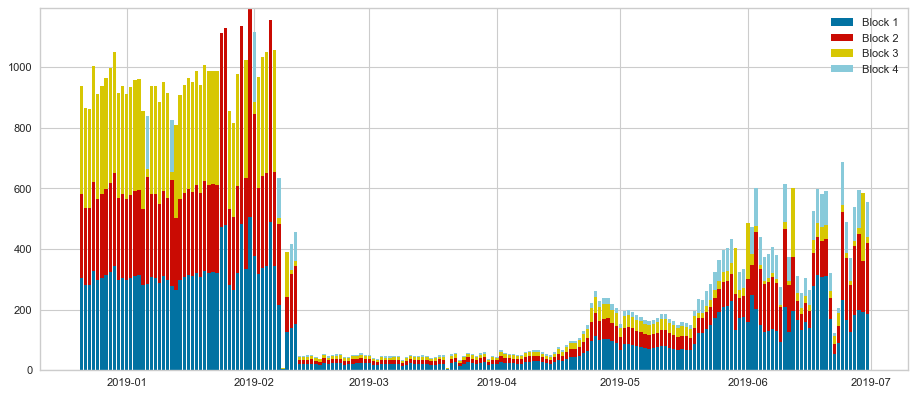

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


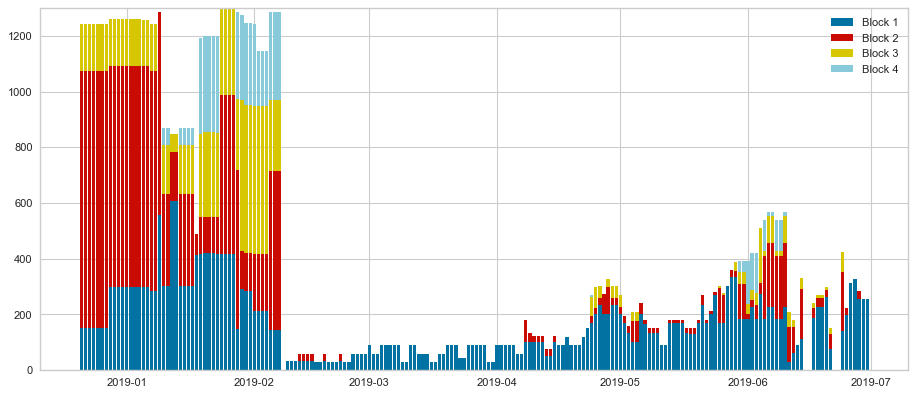

Hourly comparison: prediction vs. actual values
RMSE :13.57
MAE :7.83
R^2 :68.74
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Power-Nohours with 8 clusters **
Nb of clusters 7
Nb of centers 7, list:[629, 1590, 1367, 960, 455, 1440, 667]
Number of centers: 7
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.4583333333333333


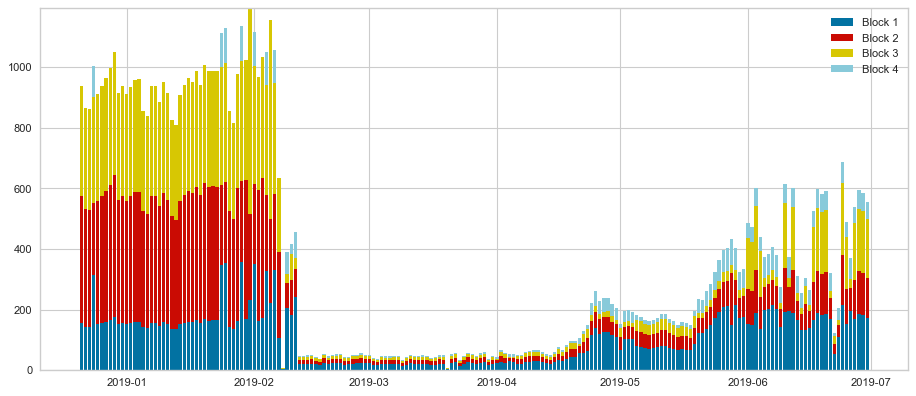

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


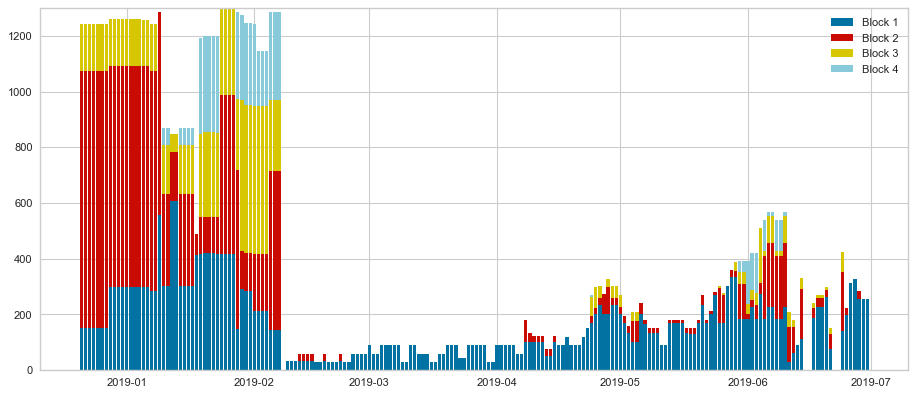

Hourly comparison: prediction vs. actual values
RMSE :13.18
MAE :7.54
R^2 :70.15
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.46875


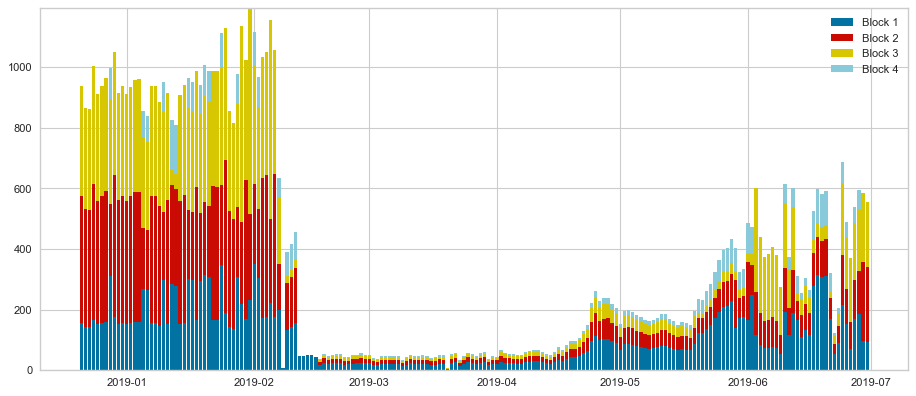

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


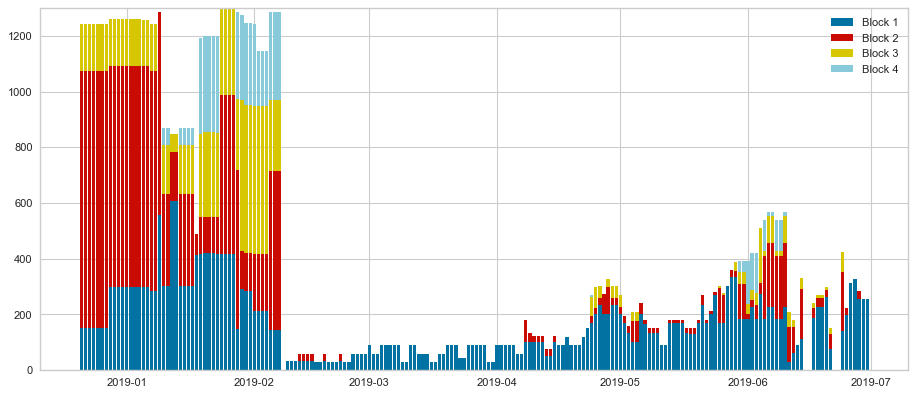

Hourly comparison: prediction vs. actual values
RMSE :13.79
MAE :7.77
R^2 :67.74
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Power-Nohours with 9 clusters **
Nb of clusters 8
Nb of centers 8, list:[1885, 1590, 639, 290, 1065, 923, 1355, 710]
Number of centers: 8
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.5260416666666666


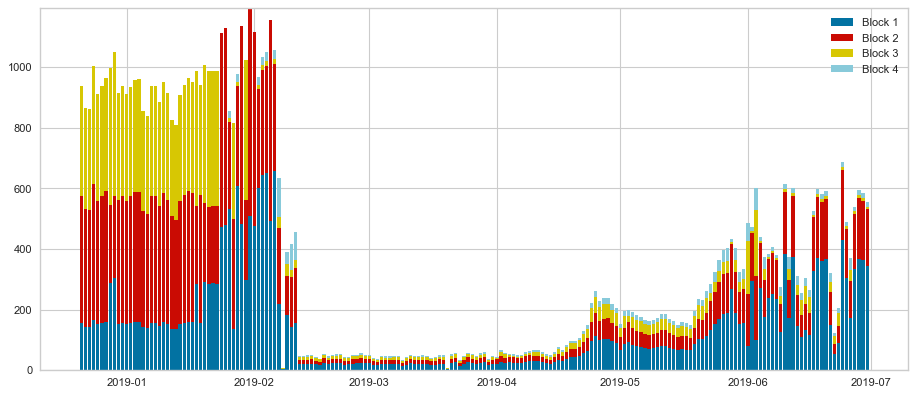

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


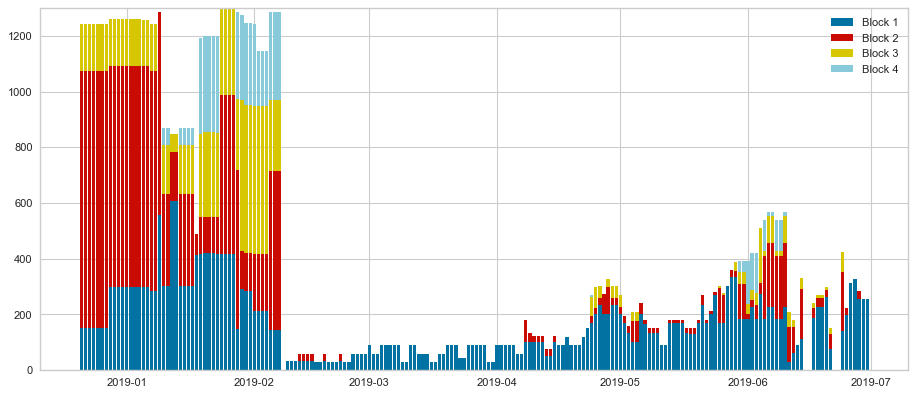

Hourly comparison: prediction vs. actual values
RMSE :13.59
MAE :7.77
R^2 :67.61
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.5520833333333334


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


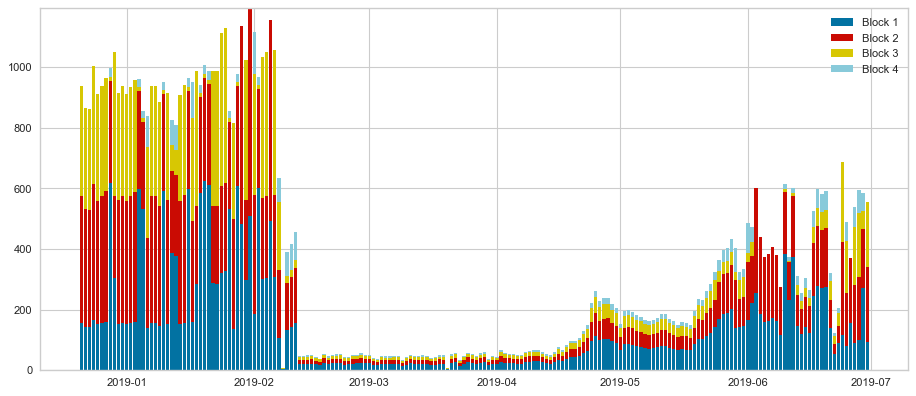

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


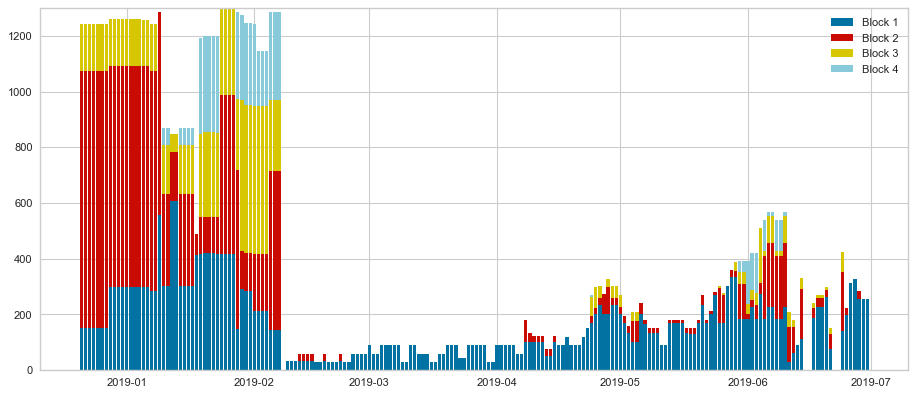

Hourly comparison: prediction vs. actual values
RMSE :14.26
MAE :8.08
R^2 :66.15
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Power-Nohours with 10 clusters **
Nb of clusters 9
Nb of centers 9, list:[436, 259, 576, 1590, 960, 1765, 1367, 778, 622]
Number of centers: 9
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.5364583333333334


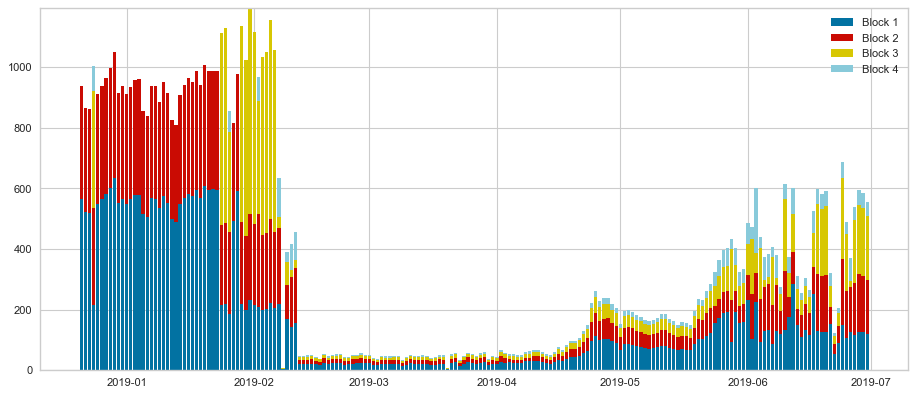

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


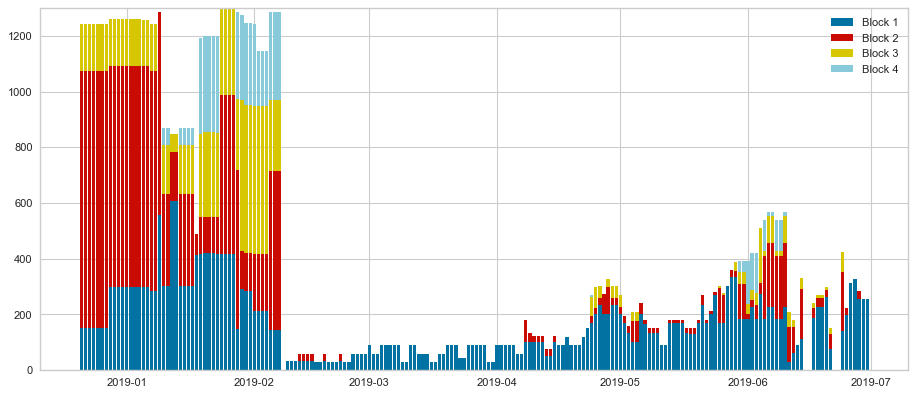

Hourly comparison: prediction vs. actual values
RMSE :13.85
MAE :7.75
R^2 :65.65
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.5989583333333334


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


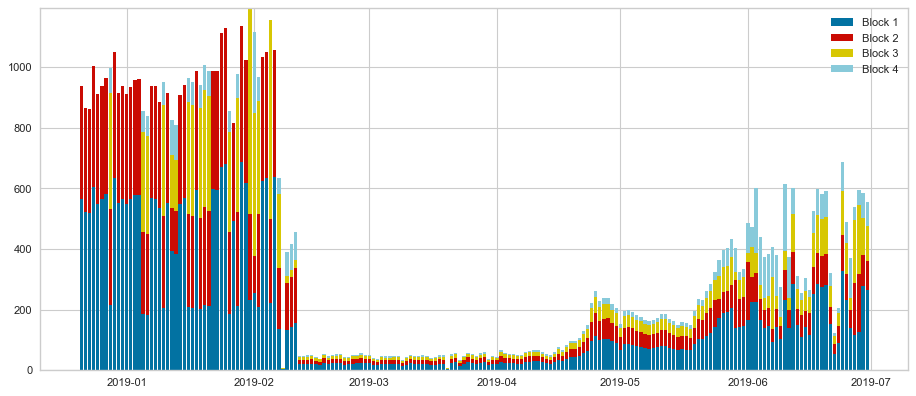

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


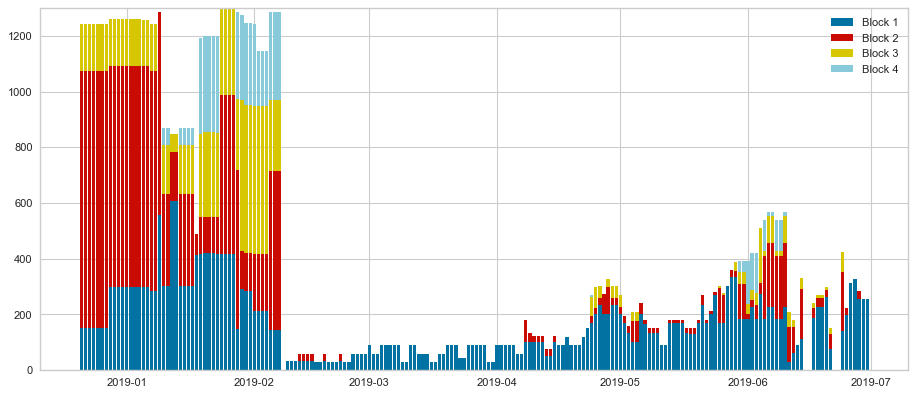

Hourly comparison: prediction vs. actual values
RMSE :13.86
MAE :7.87
R^2 :67.86
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Power-Nohours with 11 clusters **
Nb of clusters 10
Nb of centers 10, list:[134, 923, 1817, 293, 531, 667, 1218, 1548, 1621, 1367]
Number of centers: 10
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.4010416666666667


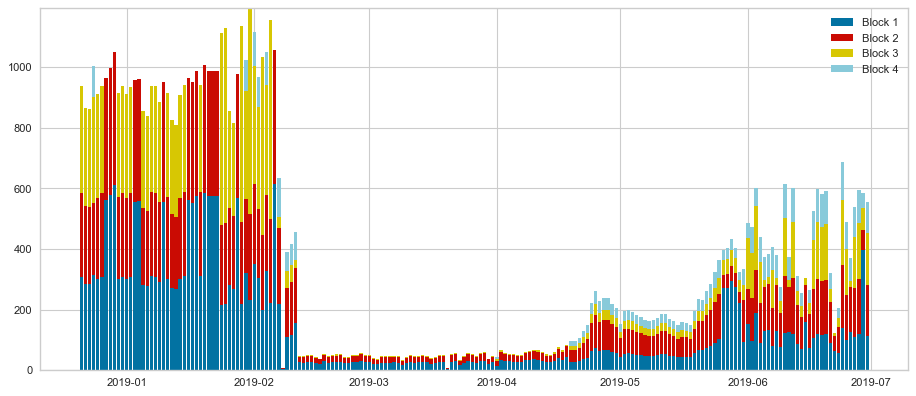

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


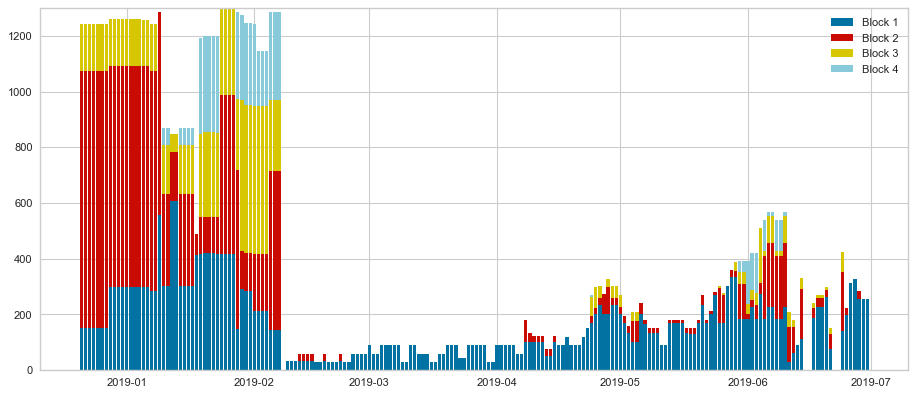

Hourly comparison: prediction vs. actual values
RMSE :13.19
MAE :7.2
R^2 :68.91
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.3489583333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


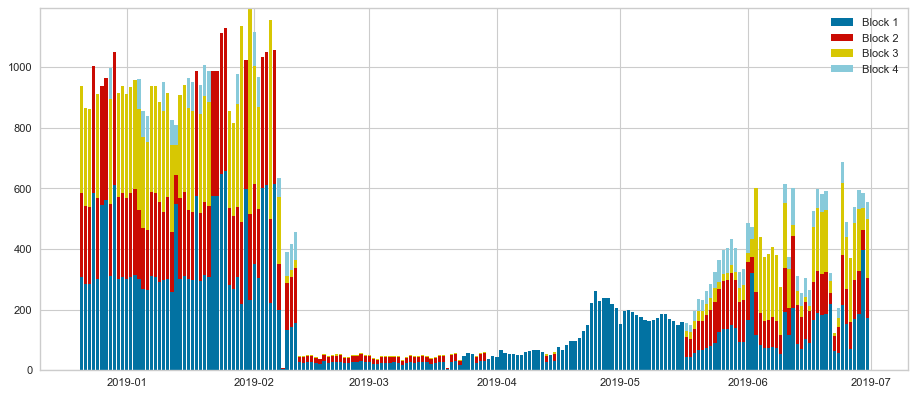

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


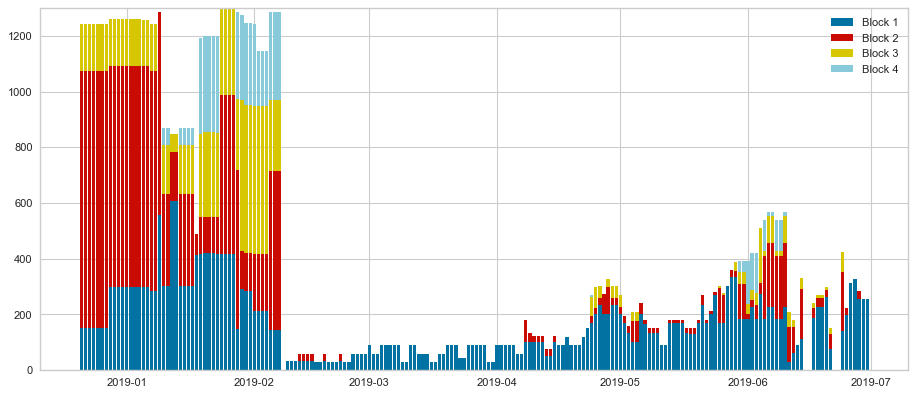

Hourly comparison: prediction vs. actual values
RMSE :13.21
MAE :7.66
R^2 :68.62
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Power-Nohours with 12 clusters **
Nb of clusters 11
Nb of centers 11, list:[539, 320, 1107, 640, 667, 960, 1817, 1626, 98, 1446, 1355]
Number of centers: 11
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.3385416666666667


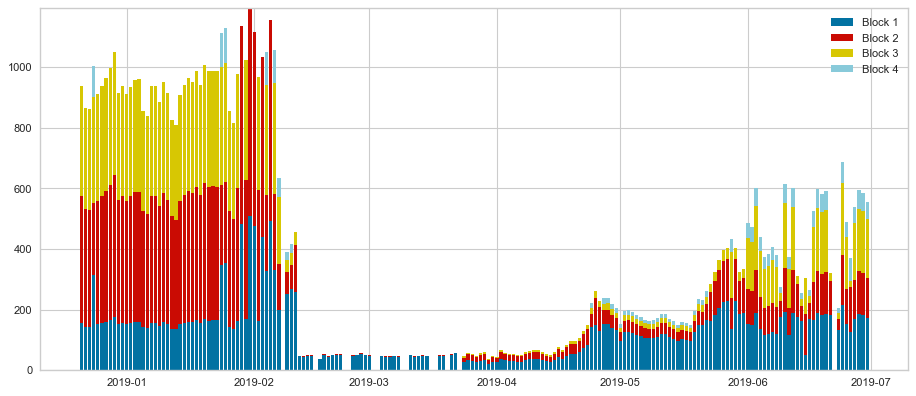

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


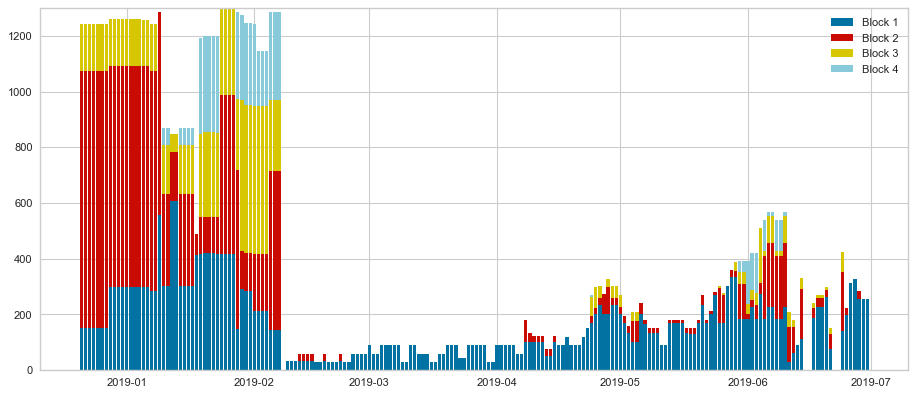

Hourly comparison: prediction vs. actual values
RMSE :12.56
MAE :7.35
R^2 :70.51
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :121.54
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.2552083333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


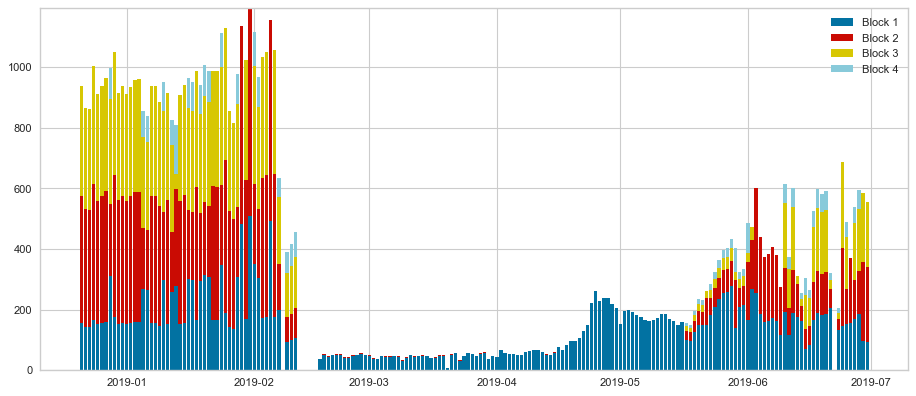

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


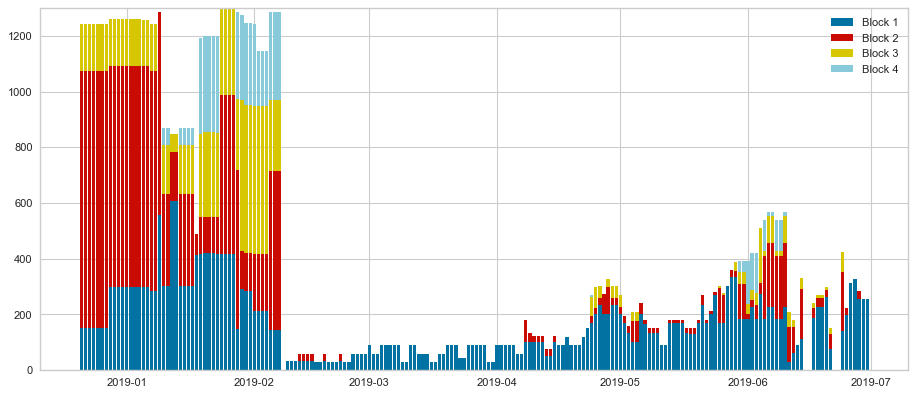

Hourly comparison: prediction vs. actual values
RMSE :13.44
MAE :7.9
R^2 :68.36
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :121.35
R^2 :85.01
************************************
** clustering Power-Nohours with 13 clusters **
Nb of clusters 12
Nb of centers 12, list:[648, 692, 1116, 622, 1215, 923, 1329, 1176, 531, 778, 1431, 1765]
Number of centers: 12
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.4375


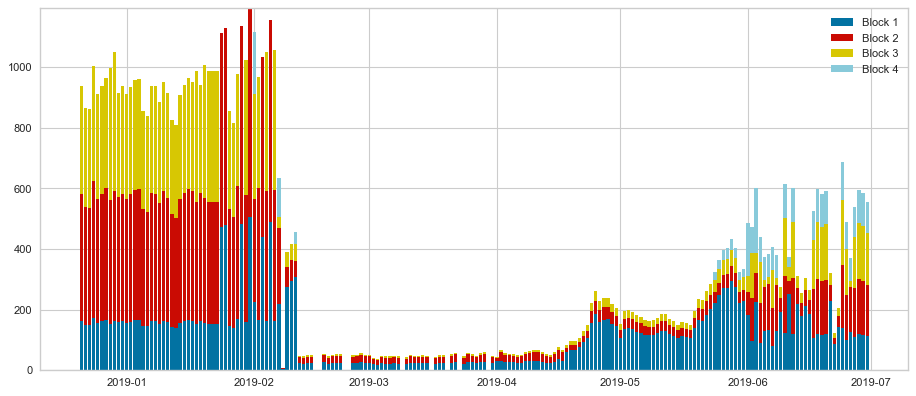

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


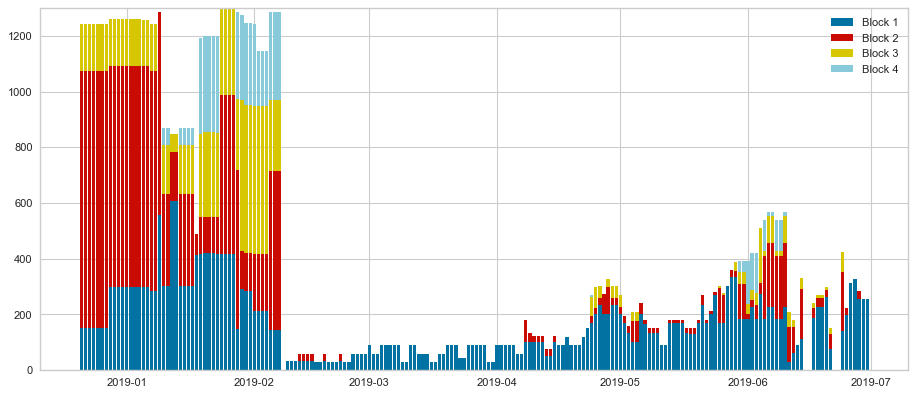

Hourly comparison: prediction vs. actual values
RMSE :13.11
MAE :7.27
R^2 :69.13
Daily comparison (max prod): prediction vs. actual values
RMSE :179.03
MAE :121.85
R^2 :84.98
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.359375


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


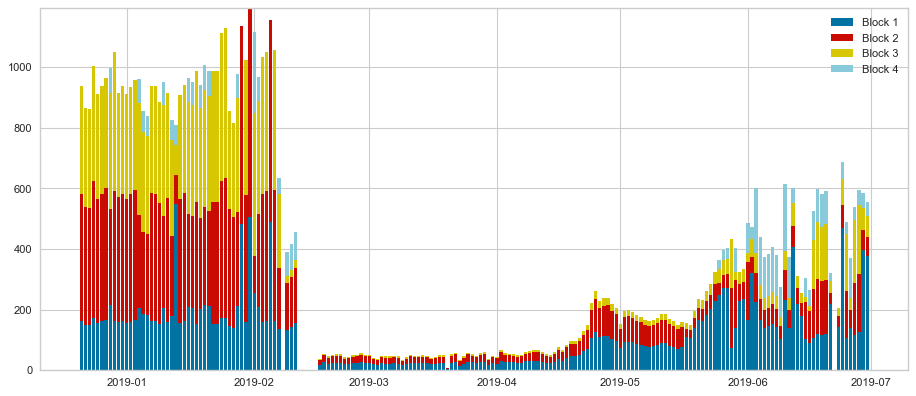

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


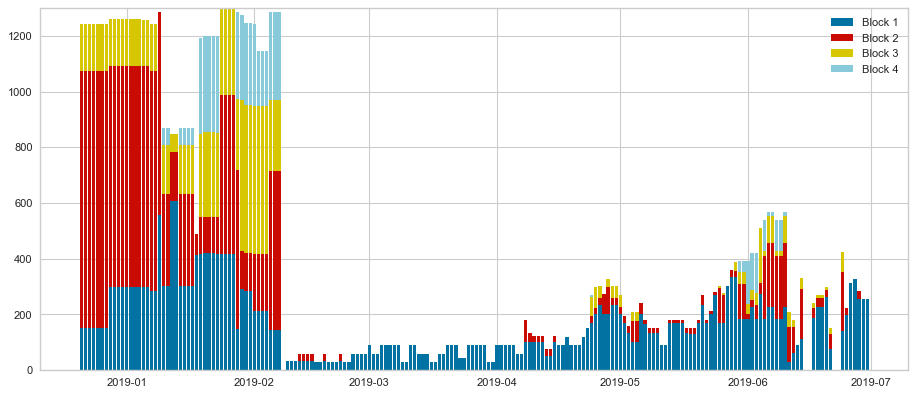

Hourly comparison: prediction vs. actual values
RMSE :13.84
MAE :7.78
R^2 :67.22
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :121.35
R^2 :85.01
************************************
** clustering Power-Nohours with 14 clusters **
Nb of clusters 13
Nb of centers 13, list:[648, 274, 74, 555, 752, 657, 959, 342, 1219, 1362, 1107, 703, 515]
Number of centers: 13
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.5052083333333334


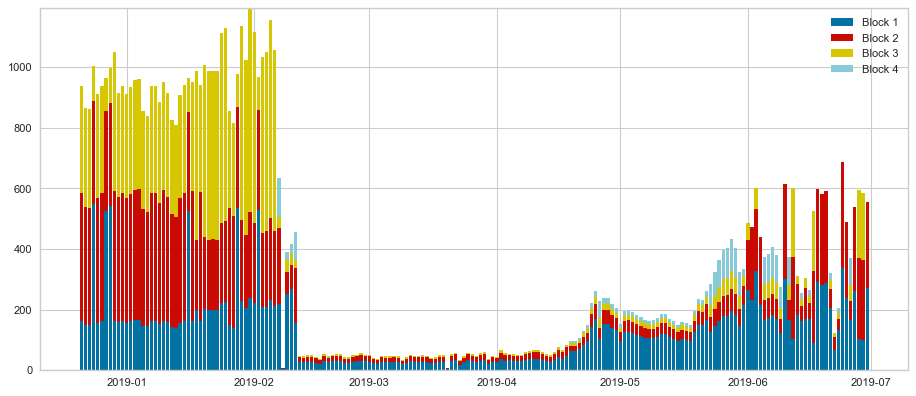

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


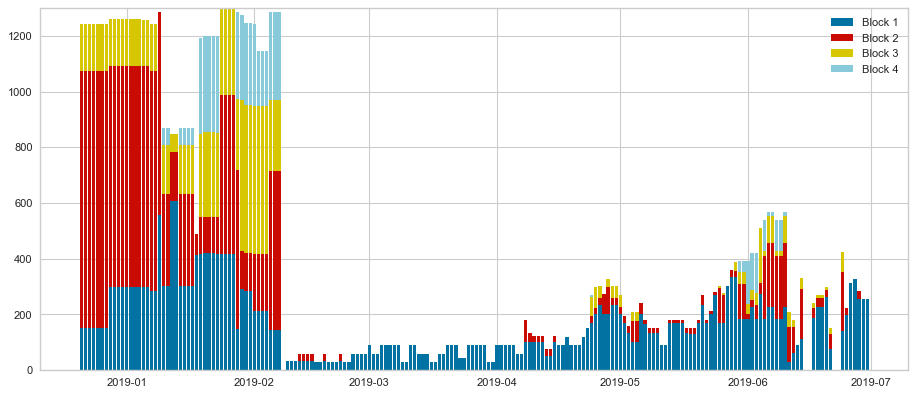

Hourly comparison: prediction vs. actual values
RMSE :12.64
MAE :7.05
R^2 :67.94
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.4583333333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


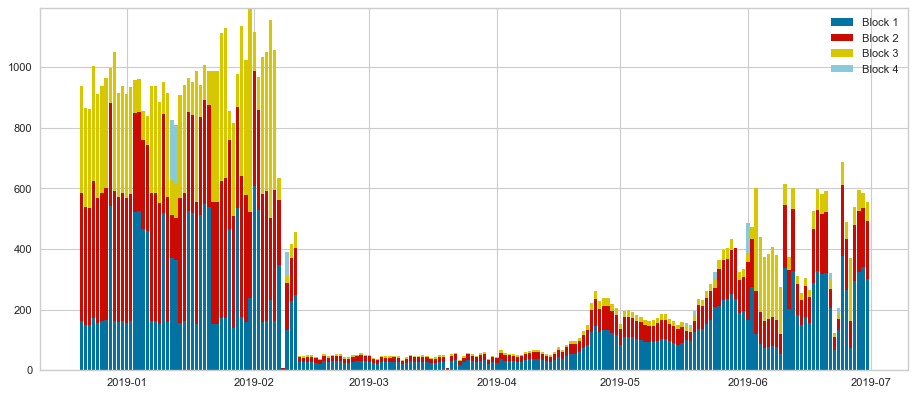

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


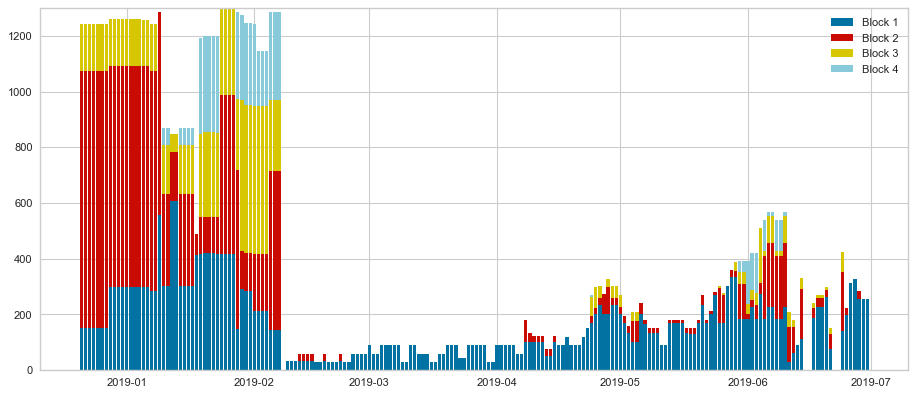

Hourly comparison: prediction vs. actual values
RMSE :13.98
MAE :7.76
R^2 :66.29
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Power-Nohours with 15 clusters **
Nb of clusters 14
Nb of centers 14, list:[265, 134, 1306, 1649, 692, 923, 896, 1355, 1700, 71, 1107, 792, 1656, 515]
Number of centers: 14
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.4375


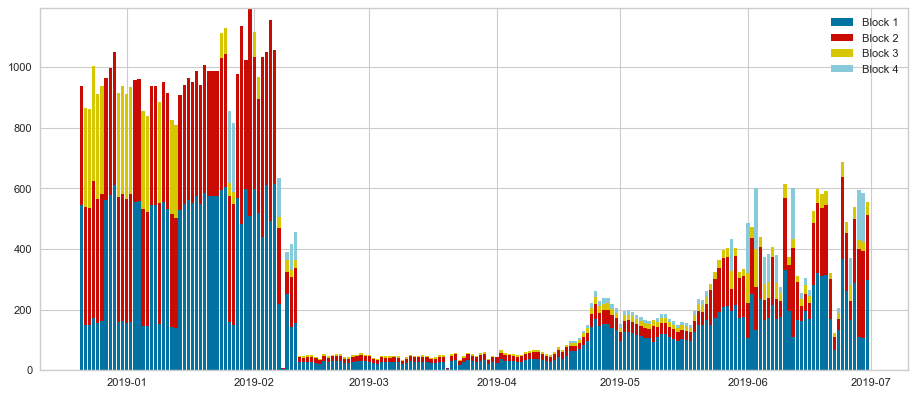

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


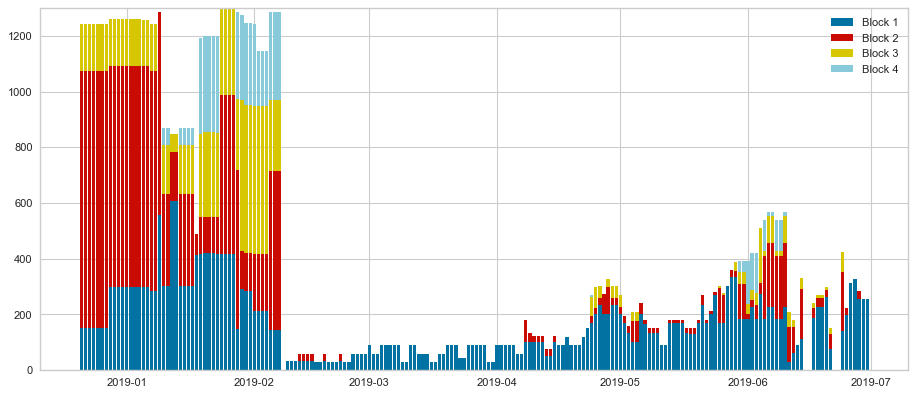

Hourly comparison: prediction vs. actual values
RMSE :12.49
MAE :7.02
R^2 :71.86
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.3854166666666667


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


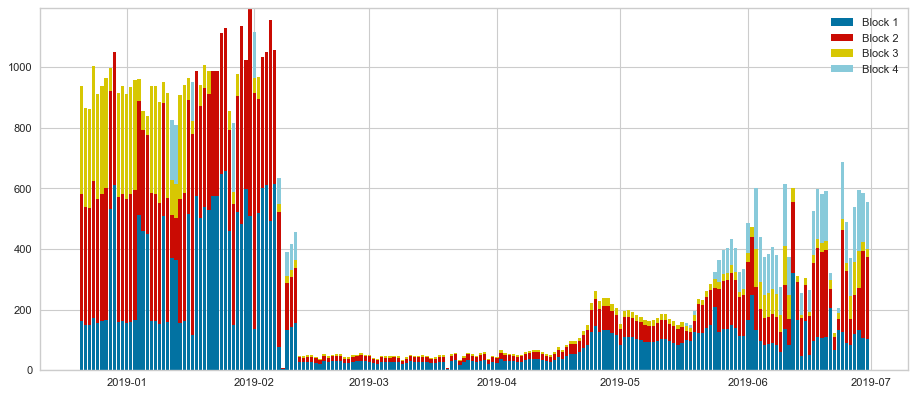

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


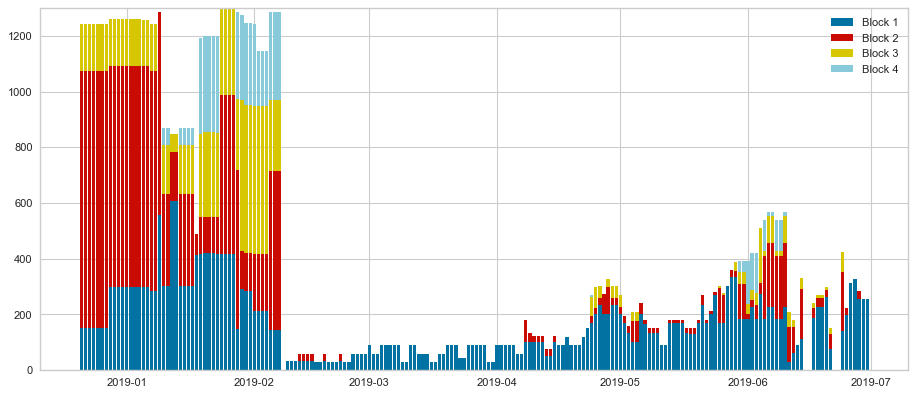

Hourly comparison: prediction vs. actual values
RMSE :13.79
MAE :7.7
R^2 :67.36
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Power-Nohours with 16 clusters **
Nb of clusters 15
Nb of centers 15, list:[120, 230, 1649, 1598, 531, 1252, 1891, 960, 1329, 74, 622, 98, 1551, 265, 1817]
Number of centers: 15
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.21875


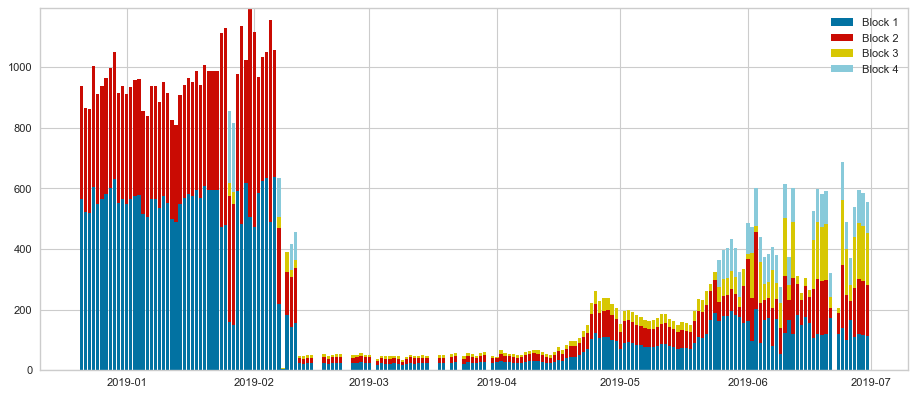

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


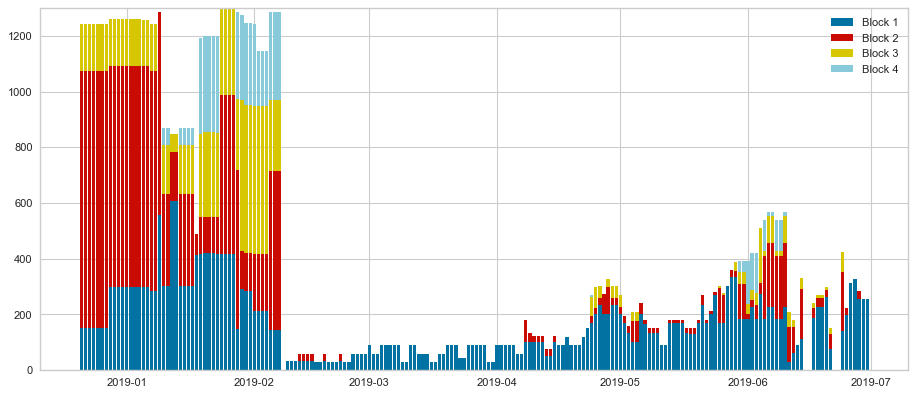

Hourly comparison: prediction vs. actual values
RMSE :14.2
MAE :7.87
R^2 :66.05
Daily comparison (max prod): prediction vs. actual values
RMSE :178.86
MAE :121.38
R^2 :85.01
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.265625


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


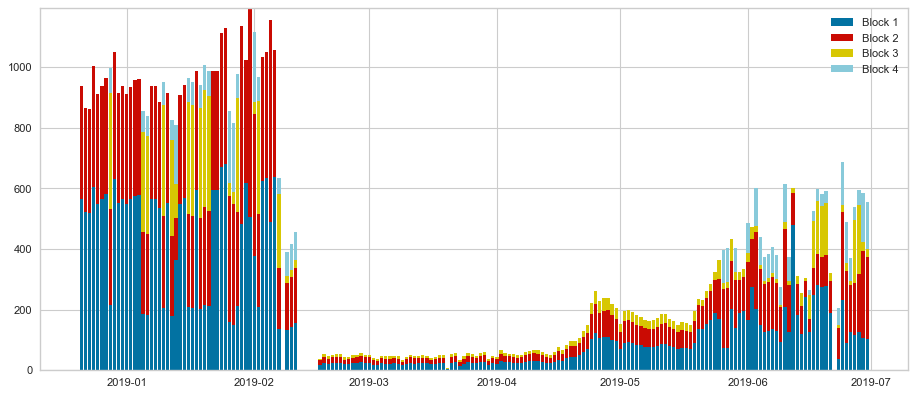

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


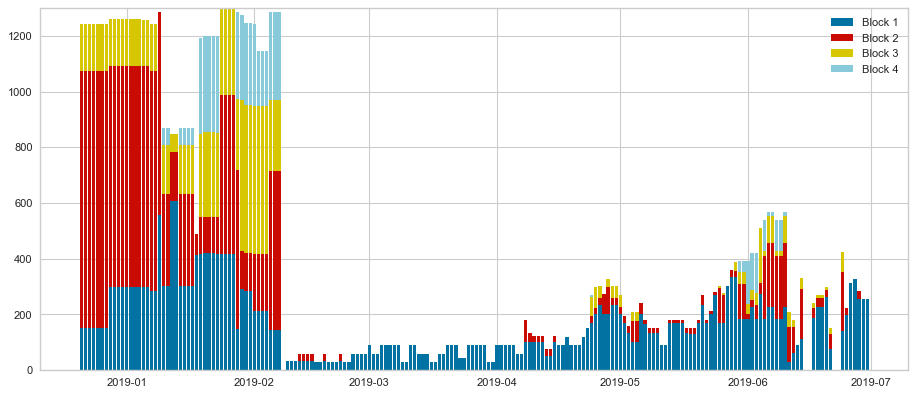

Hourly comparison: prediction vs. actual values
RMSE :13.91
MAE :7.76
R^2 :66.88
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :121.35
R^2 :85.01
************************************
** clustering Power-Nohours with 17 clusters **
Nb of clusters 16
Nb of centers 16, list:[113, 74, 923, 1107, 555, 657, 1891, 765, 230, 1130, 622, 1367, 1551, 1817, 1695, 1446]
Number of centers: 16
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.2604166666666667


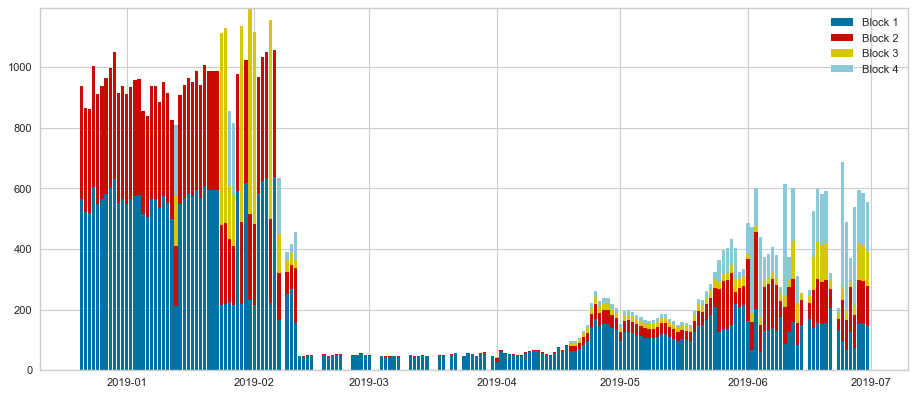

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


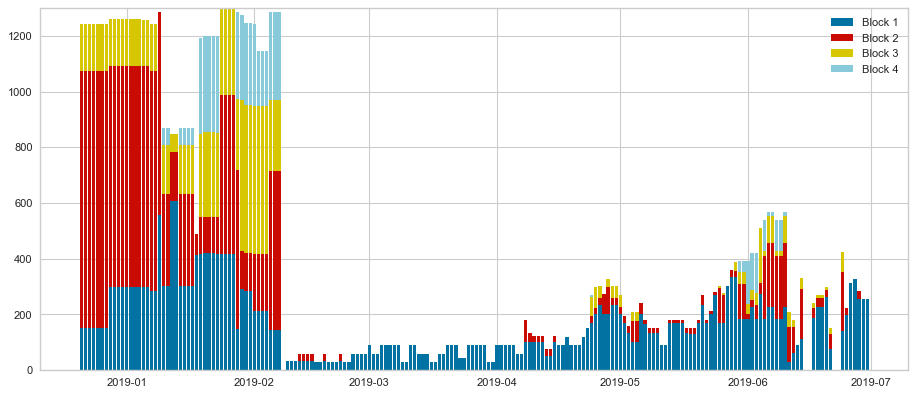

Hourly comparison: prediction vs. actual values
RMSE :12.89
MAE :7.16
R^2 :70.92
Daily comparison (max prod): prediction vs. actual values
RMSE :177.59
MAE :120.19
R^2 :85.22
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.3020833333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


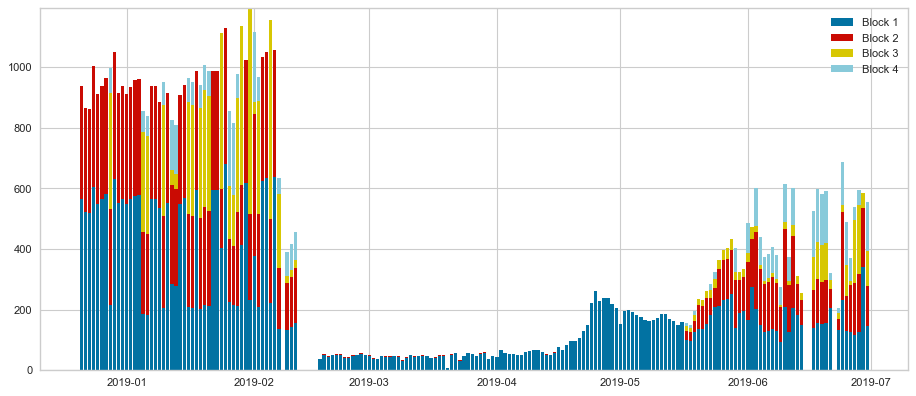

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


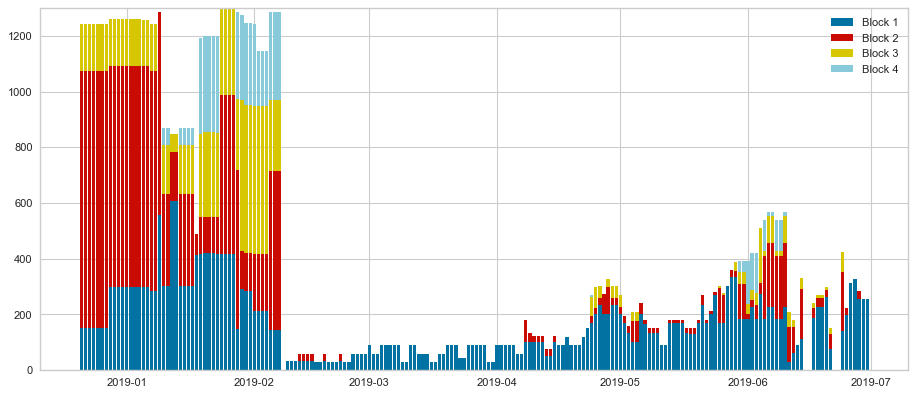

Hourly comparison: prediction vs. actual values
RMSE :12.93
MAE :7.3
R^2 :70.77
Daily comparison (max prod): prediction vs. actual values
RMSE :176.54
MAE :118.4
R^2 :85.4
************************************
** clustering Power-Nohours with 18 clusters **
Nb of clusters 17
Nb of centers 17, list:[1107, 212, 318, 74, 480, 636, 710, 1281, 954, 1649, 804, 657, 1351, 1732, 1621, 1219, 1817]
Number of centers: 17
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.2916666666666667


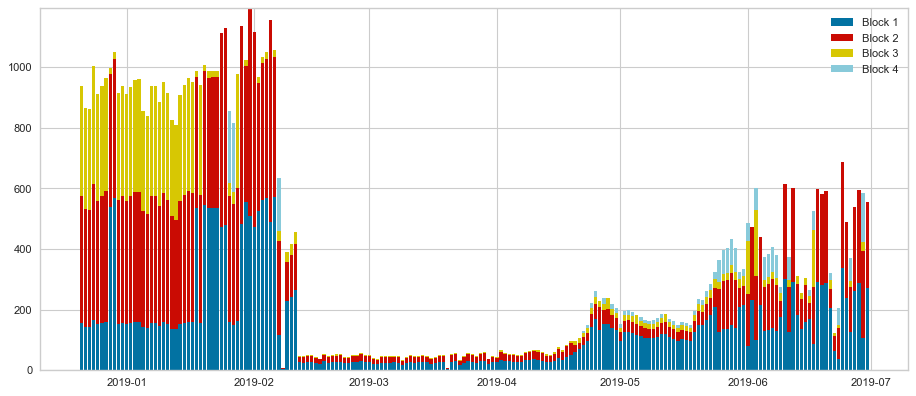

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


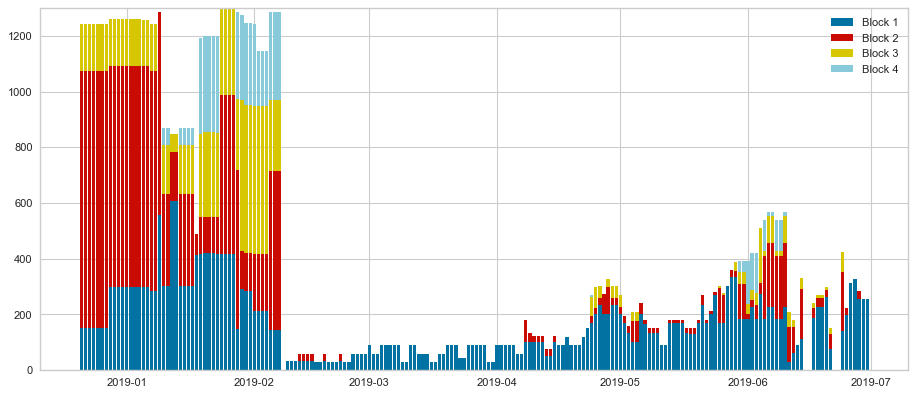

Hourly comparison: prediction vs. actual values
RMSE :13.01
MAE :7.1
R^2 :69.5
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.2552083333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


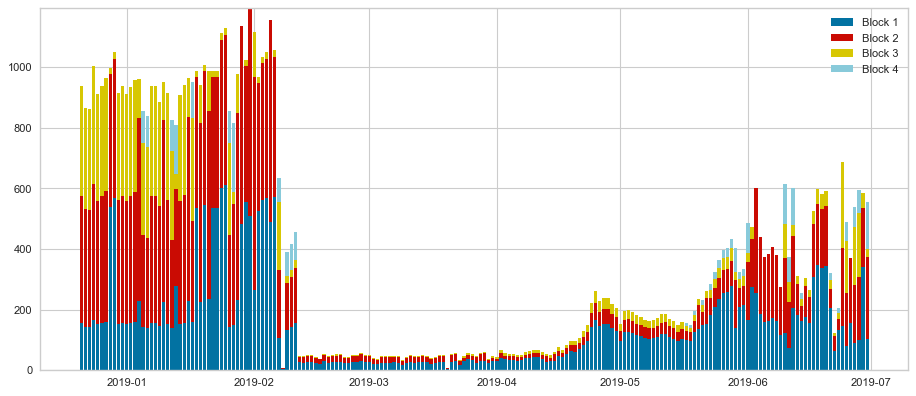

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


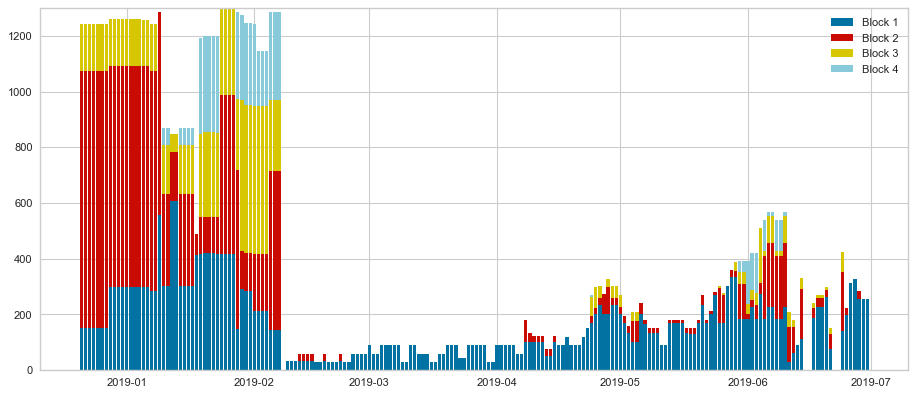

Hourly comparison: prediction vs. actual values
RMSE :13.26
MAE :7.47
R^2 :68.91
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Power-Nohours with 19 clusters **
Nb of clusters 18
Nb of centers 18, list:[1107, 1551, 539, 342, 923, 622, 589, 778, 265, 531, 98, 1212, 629, 1817, 74, 1596, 1348, 1446]
Number of centers: 18
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.25


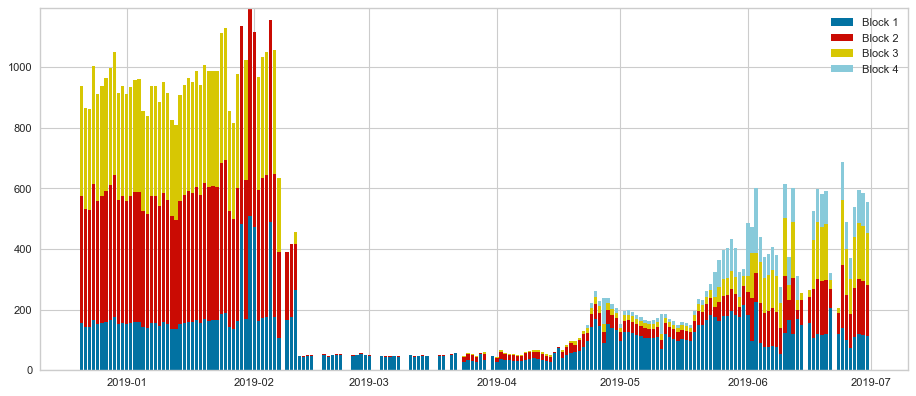

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


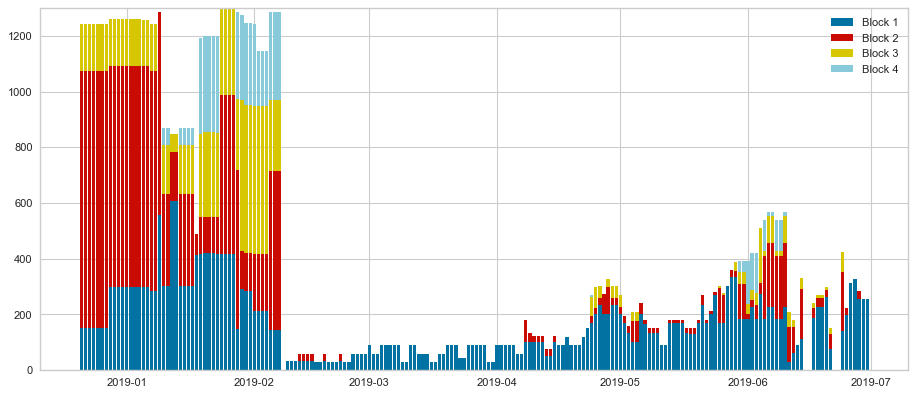

Hourly comparison: prediction vs. actual values
RMSE :12.64
MAE :7.4
R^2 :70.98
Daily comparison (max prod): prediction vs. actual values
RMSE :177.59
MAE :120.19
R^2 :85.22
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.18229166666666666


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


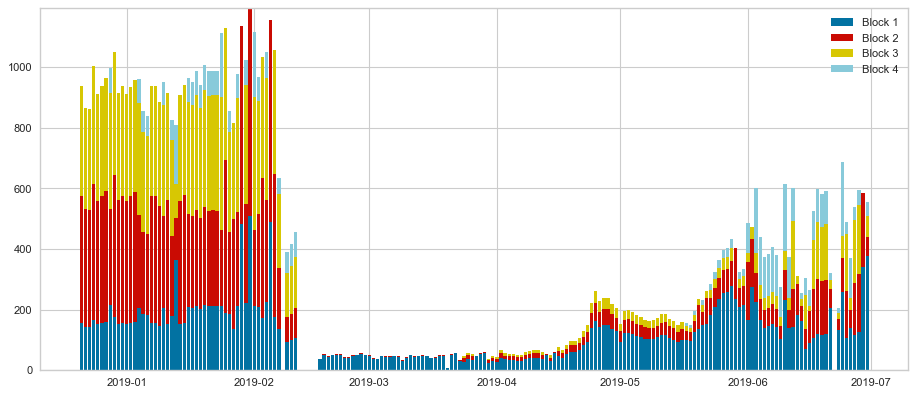

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


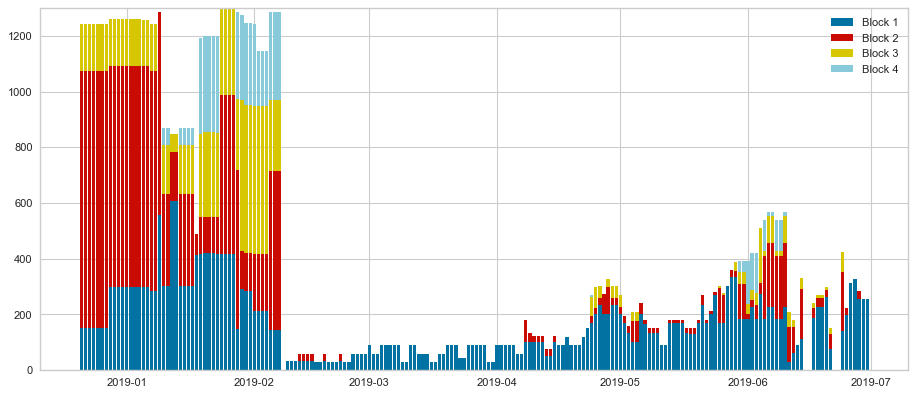

Hourly comparison: prediction vs. actual values
RMSE :12.84
MAE :7.41
R^2 :70.28
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :121.35
R^2 :85.01
************************************
** clustering Power-Nohours with 20 clusters **
Nb of clusters 19
Nb of centers 19, list:[1549, 114, 692, 384, 518, 576, 710, 1885, 864, 960, 315, 1765, 231, 1367, 98, 778, 1204, 622, 1824]
Number of centers: 19
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.4114583333333333


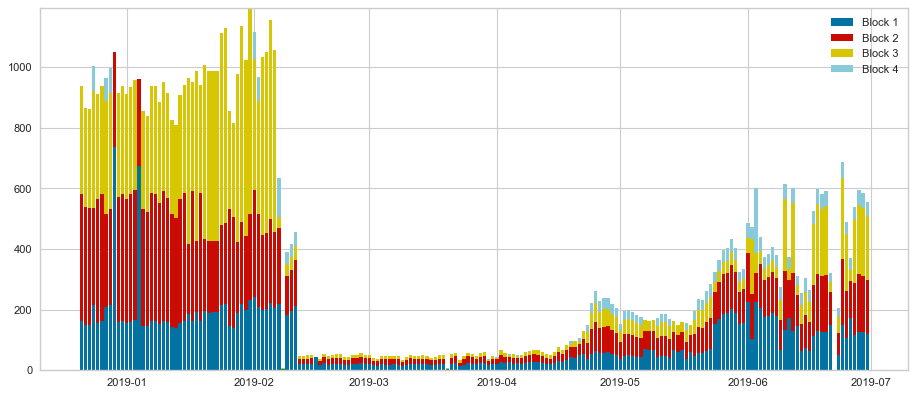

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


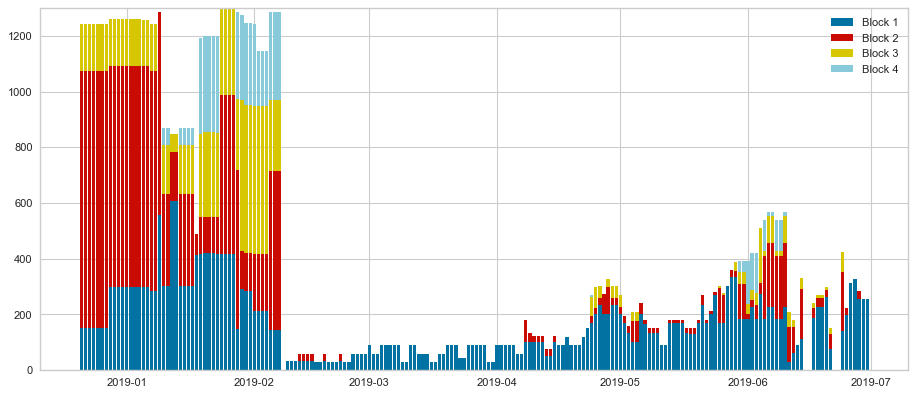

Hourly comparison: prediction vs. actual values
RMSE :12.05
MAE :7.09
R^2 :70.14
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.3802083333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


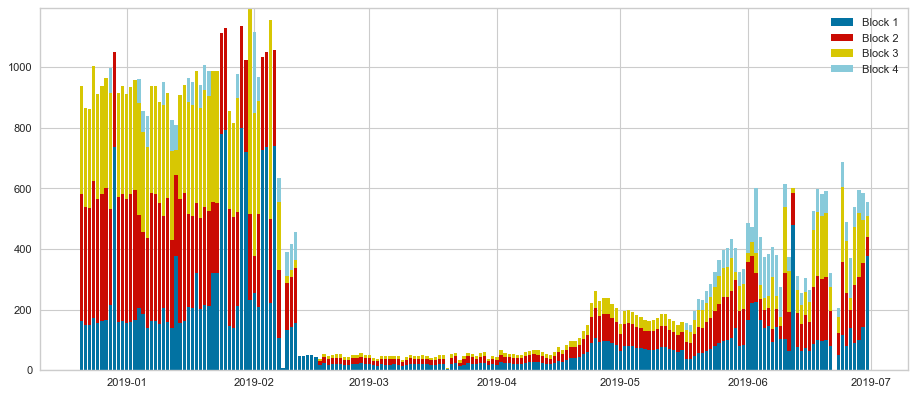

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


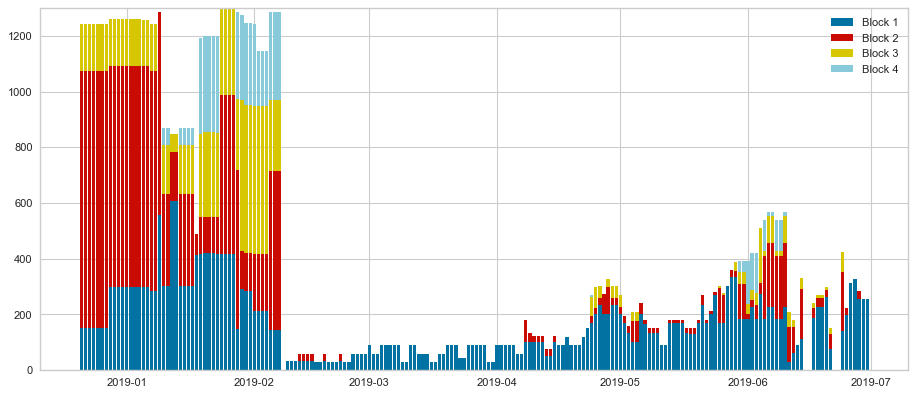

Hourly comparison: prediction vs. actual values
RMSE :13.68
MAE :7.64
R^2 :68.34
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Power-Nohours with 21 clusters **
Nb of clusters 20
Nb of centers 20, list:[1107, 290, 273, 772, 71, 440, 153, 539, 1173, 342, 974, 923, 769, 203, 1367, 1621, 1551, 1204, 667, 1817]
Number of centers: 20
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.3802083333333333


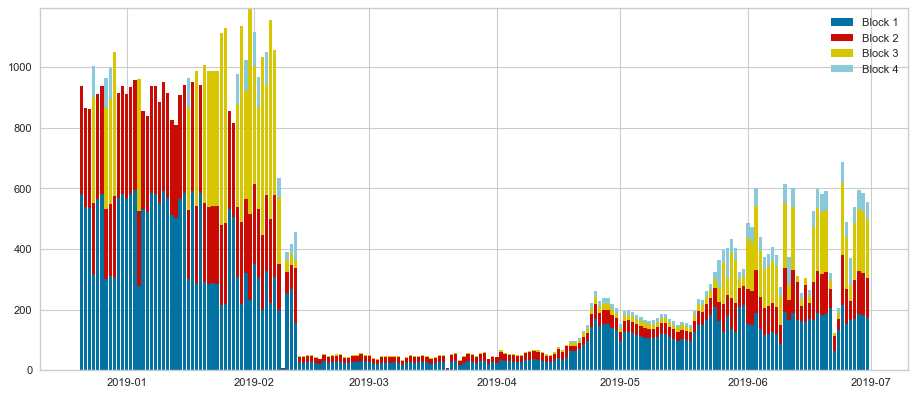

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


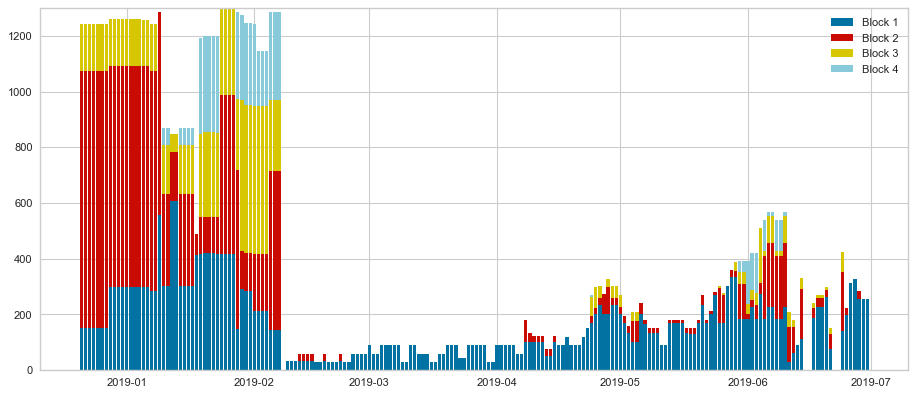

Hourly comparison: prediction vs. actual values
RMSE :12.73
MAE :7.06
R^2 :69.65
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.2708333333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


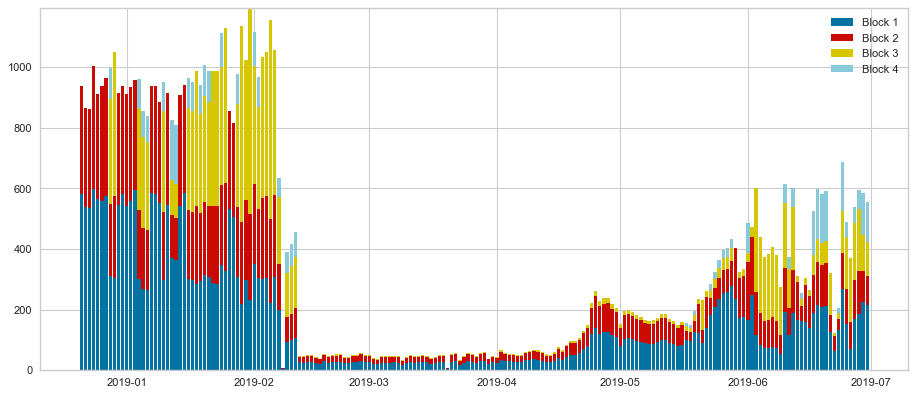

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


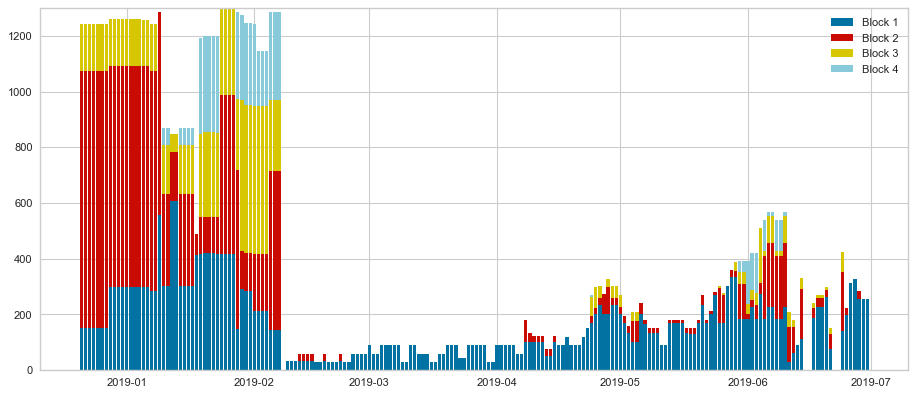

Hourly comparison: prediction vs. actual values
RMSE :14.35
MAE :7.98
R^2 :65.46
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Power-Nohours with 22 clusters **
Nb of clusters 21
Nb of centers 21, list:[531, 290, 153, 348, 1252, 1596, 609, 293, 1722, 839, 957, 1074, 71, 1204, 1305, 1548, 1479, 1621, 1329, 1891, 1817]
Number of centers: 21
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.2916666666666667


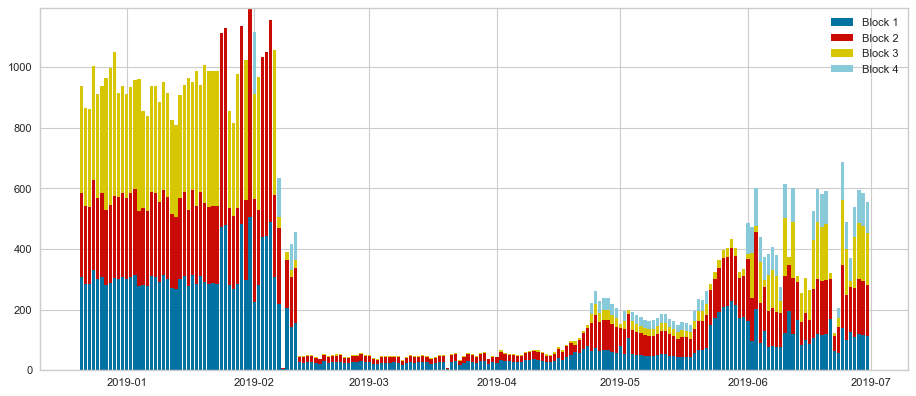

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


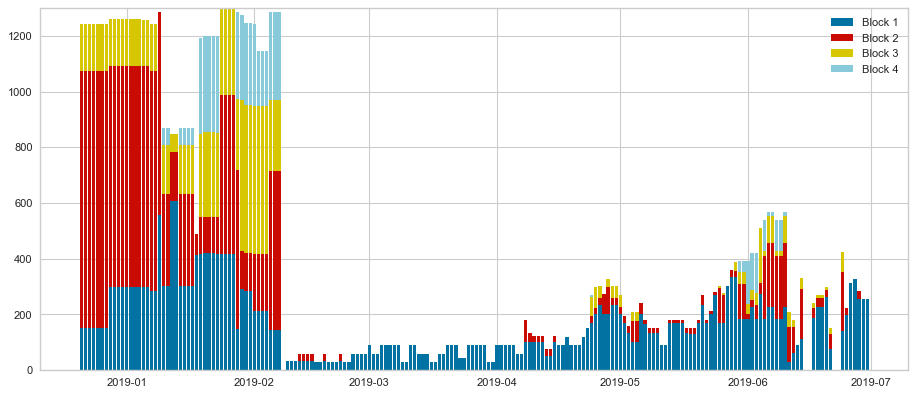

Hourly comparison: prediction vs. actual values
RMSE :12.53
MAE :7.13
R^2 :70.44
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.23958333333333334


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


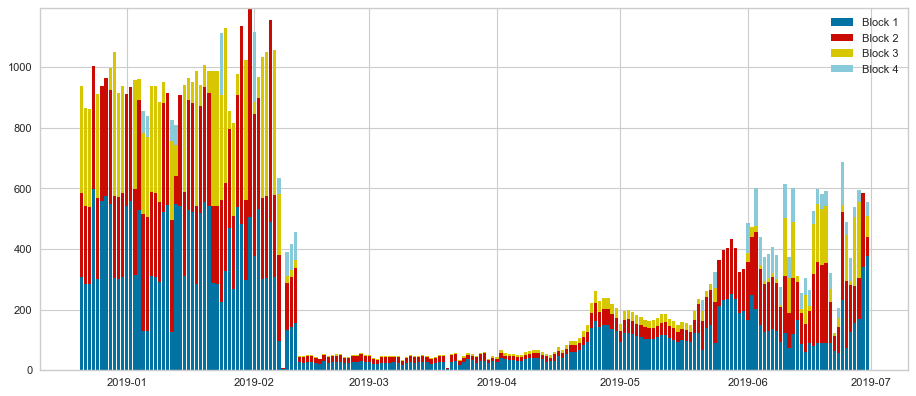

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


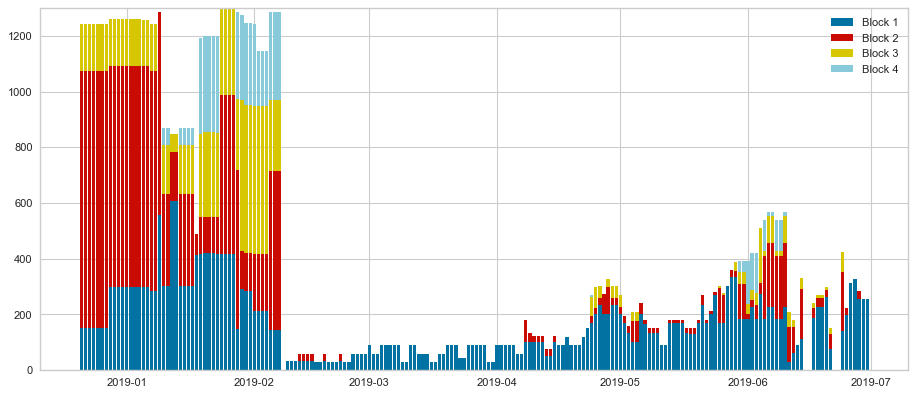

Hourly comparison: prediction vs. actual values
RMSE :12.5
MAE :7.21
R^2 :70.8
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Power-Nohours with 23 clusters **
Nb of clusters 22
Nb of centers 22, list:[74, 166, 153, 734, 1885, 923, 1049, 668, 917, 1408, 342, 996, 1303, 1149, 290, 1328, 1410, 742, 1446, 1329, 1740, 1817]
Number of centers: 22
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.21354166666666666


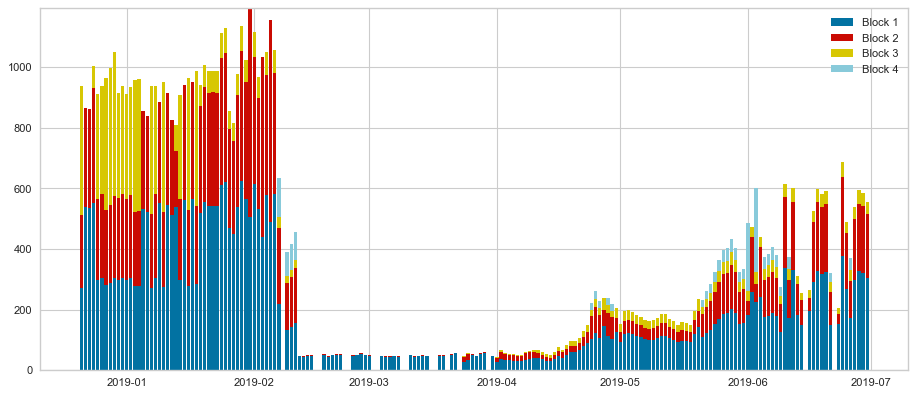

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


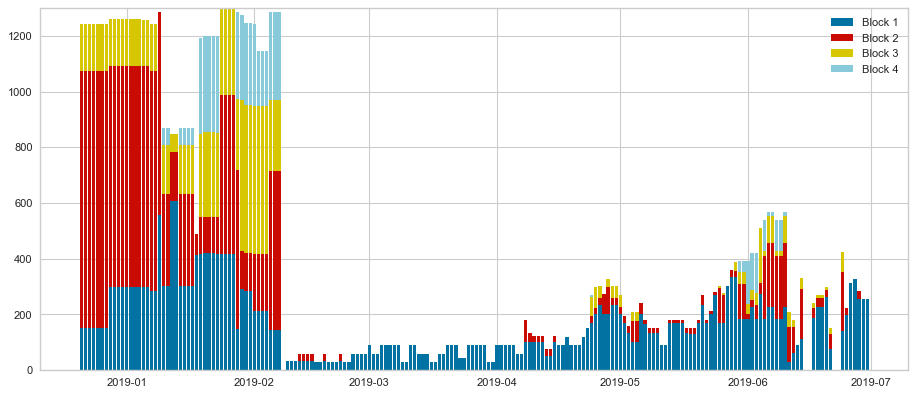

Hourly comparison: prediction vs. actual values
RMSE :11.97
MAE :6.93
R^2 :72.66
Daily comparison (max prod): prediction vs. actual values
RMSE :177.59
MAE :120.19
R^2 :85.22
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.16145833333333334


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


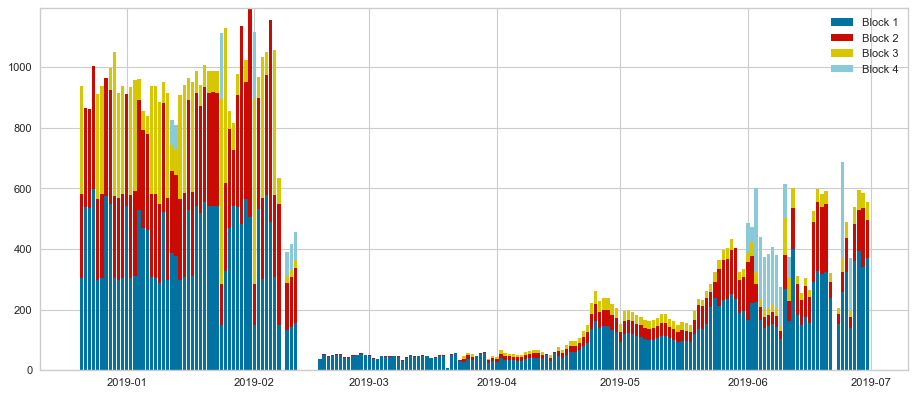

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


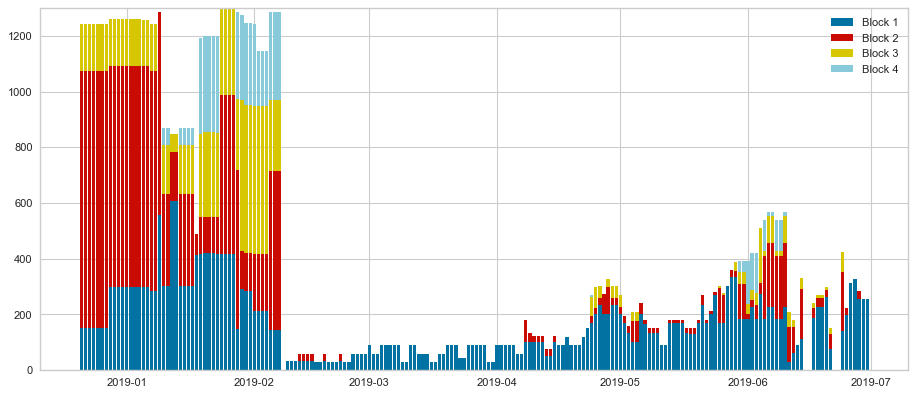

Hourly comparison: prediction vs. actual values
RMSE :12.6
MAE :7.16
R^2 :71.31
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :121.35
R^2 :85.01
************************************
** clustering Power-Nohours with 24 clusters **
Nb of clusters 23
Nb of centers 23, list:[1859, 539, 153, 320, 1649, 1596, 560, 692, 531, 778, 265, 960, 290, 81, 71, 202, 1367, 98, 622, 1446, 1507, 668, 1548]
Number of centers: 23
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.2552083333333333


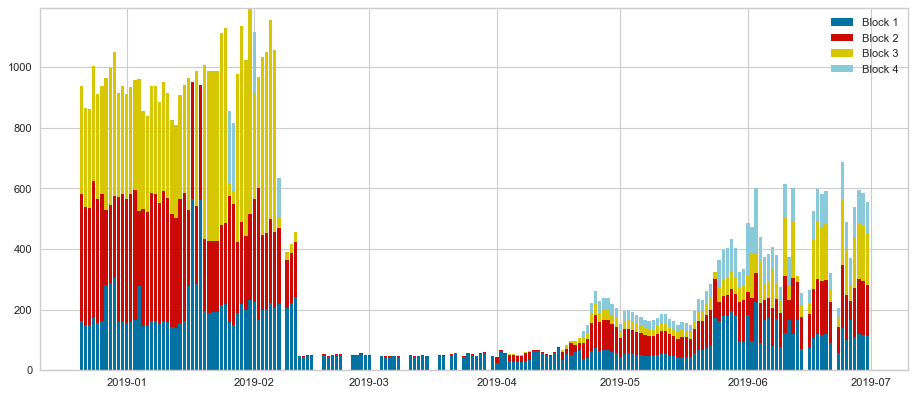

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


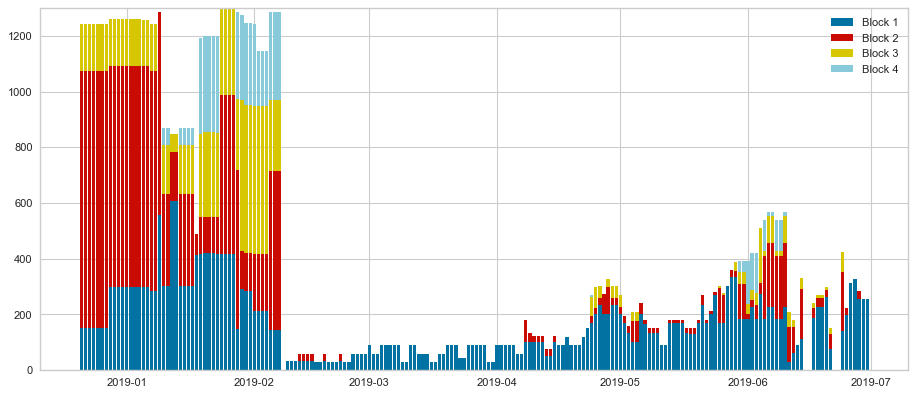

Hourly comparison: prediction vs. actual values
RMSE :12.5
MAE :7.06
R^2 :69.7
Daily comparison (max prod): prediction vs. actual values
RMSE :177.59
MAE :120.19
R^2 :85.22
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.17708333333333334


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


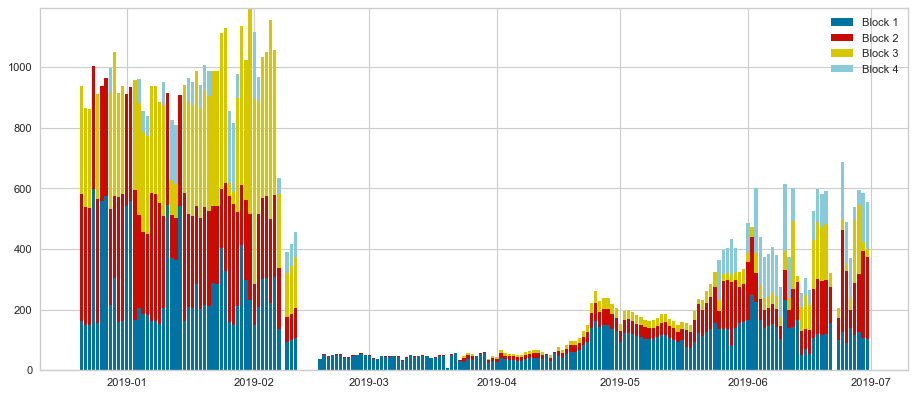

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


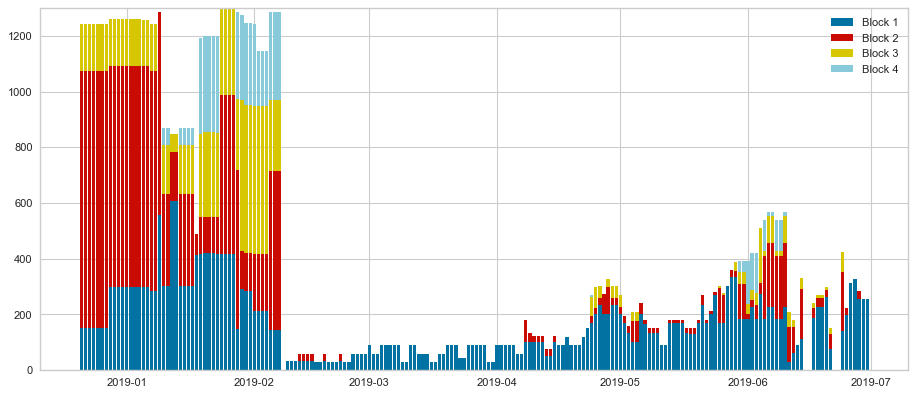

Hourly comparison: prediction vs. actual values
RMSE :12.55
MAE :7.23
R^2 :70.73
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :121.35
R^2 :85.01
************************************
** clustering Power-Nohours with 25 clusters **
Nb of clusters 24
Nb of centers 24, list:[74, 230, 134, 290, 377, 114, 539, 616, 161, 1506, 606, 924, 1001, 1074, 1521, 1219, 1649, 1329, 1446, 98, 1107, 657, 1891, 1817]
Number of centers: 24
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.21875


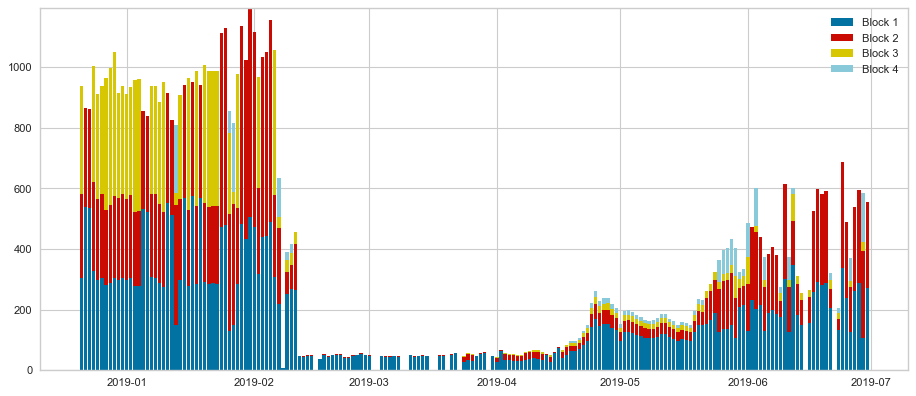

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


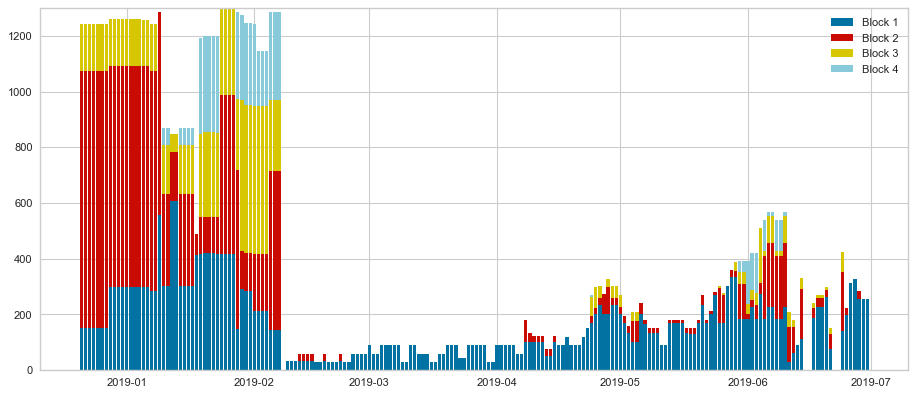

Hourly comparison: prediction vs. actual values
RMSE :12.83
MAE :7.23
R^2 :68.83
Daily comparison (max prod): prediction vs. actual values
RMSE :177.56
MAE :119.93
R^2 :85.23
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.21354166666666666


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


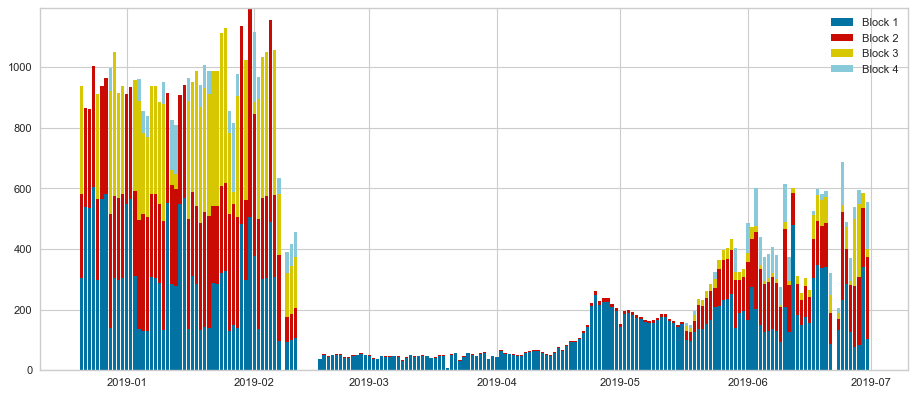

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


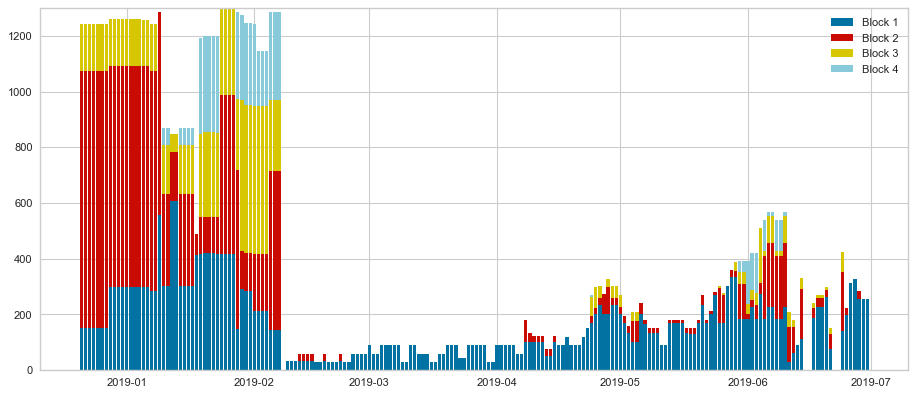

Hourly comparison: prediction vs. actual values
RMSE :13.94
MAE :7.61
R^2 :66.86
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :121.35
R^2 :85.01
************************************
** clustering Power-Nohours with 26 clusters **
Nb of clusters 25
Nb of centers 25, list:[74, 648, 472, 629, 1548, 196, 1446, 665, 1303, 1204, 315, 888, 962, 794, 1817, 615, 531, 1332, 539, 804, 1551, 1596, 1722, 98, 1525]
Number of centers: 25
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.20833333333333334


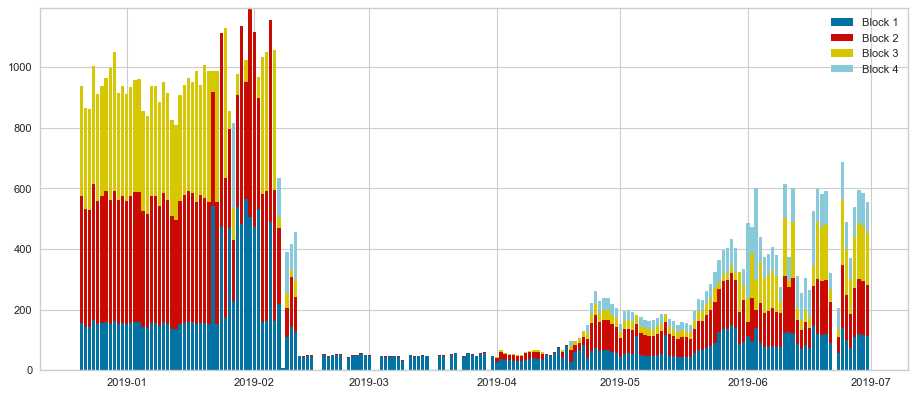

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


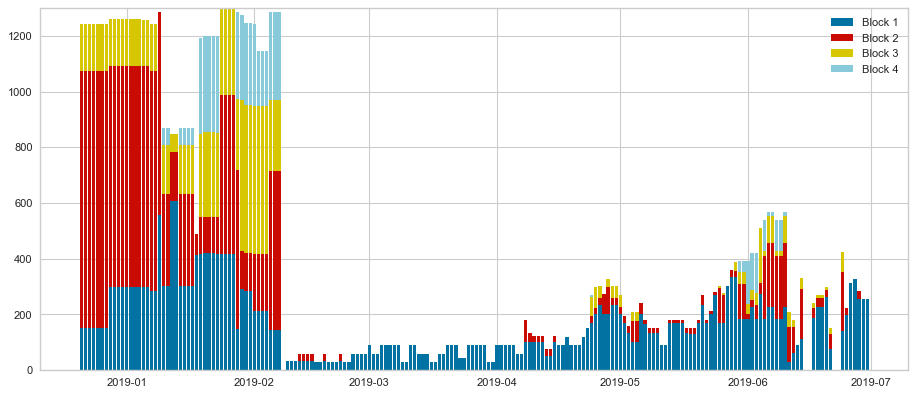

Hourly comparison: prediction vs. actual values
RMSE :12.5
MAE :7.2
R^2 :70.91
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :121.58
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.13541666666666666


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


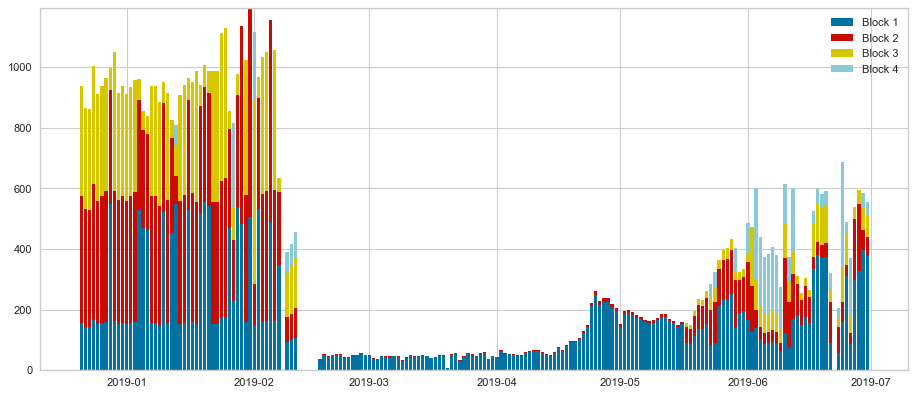

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


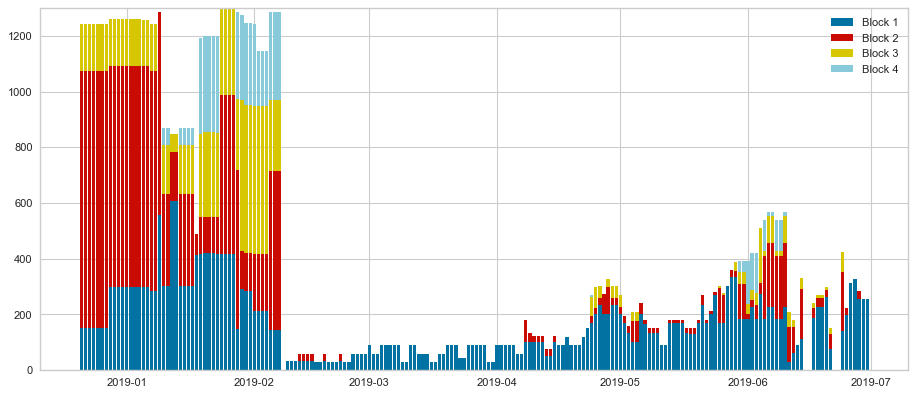

Hourly comparison: prediction vs. actual values
RMSE :13.96
MAE :7.7
R^2 :67.33
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :121.35
R^2 :85.01
************************************
** clustering Power-Nohours with 27 clusters **
Nb of clusters 26
Nb of centers 26, list:[465, 142, 213, 974, 355, 97, 524, 568, 230, 752, 778, 290, 923, 1686, 602, 443, 1204, 1278, 1367, 1430, 1755, 1551, 769, 668, 98, 1543]
Number of centers: 26
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.328125


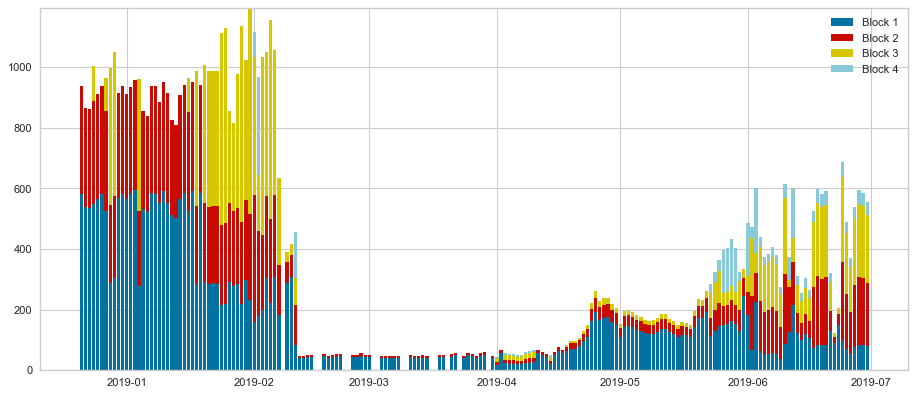

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


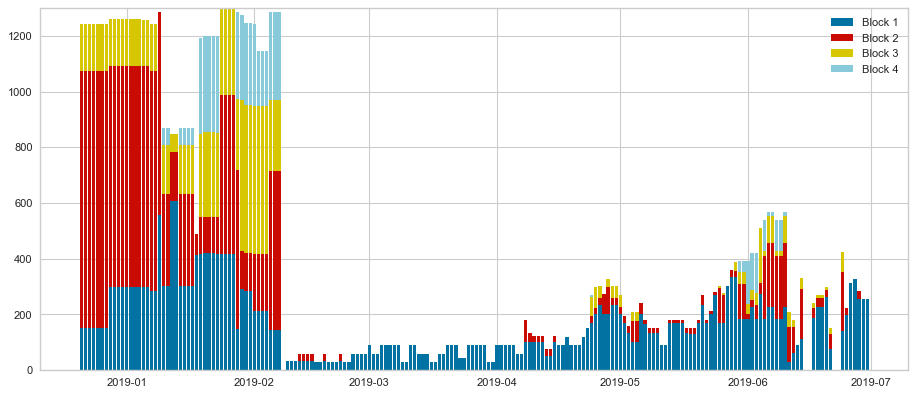

Hourly comparison: prediction vs. actual values
RMSE :12.97
MAE :7.34
R^2 :68.87
Daily comparison (max prod): prediction vs. actual values
RMSE :179.14
MAE :122.4
R^2 :84.96
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.2916666666666667


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


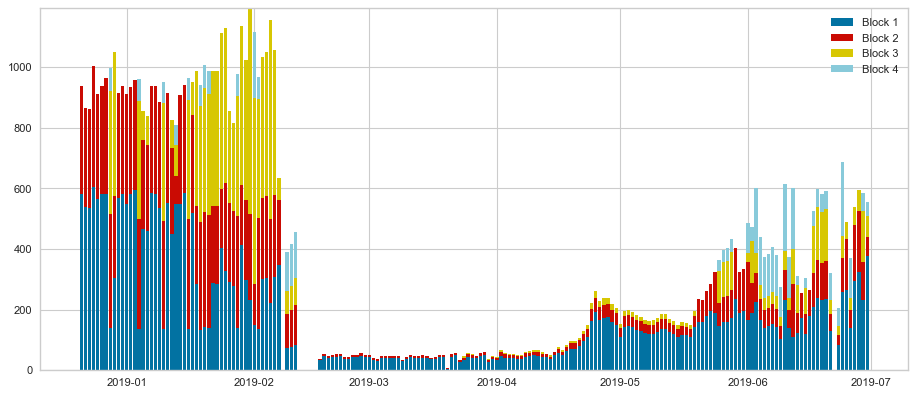

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


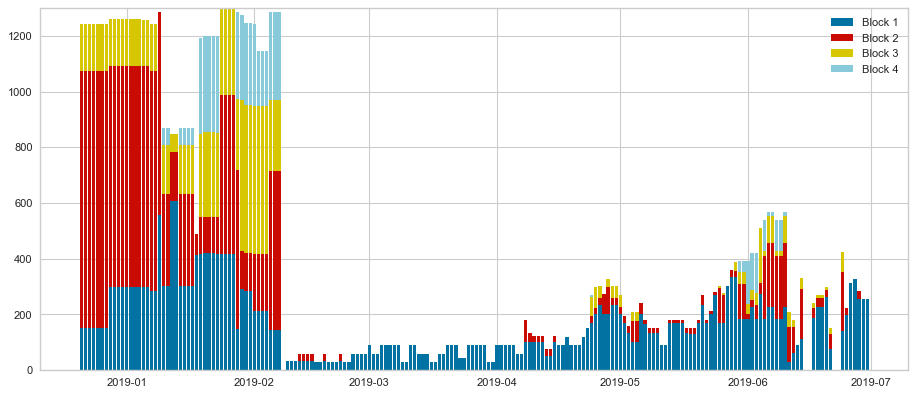

Hourly comparison: prediction vs. actual values
RMSE :12.31
MAE :7.06
R^2 :71.96
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :121.35
R^2 :85.01
************************************
** clustering Power-Nohours with 28 clusters **
Nb of clusters 27
Nb of centers 27, list:[68, 153, 290, 272, 1197, 1247, 476, 544, 1306, 657, 690, 1208, 884, 952, 974, 342, 895, 1224, 1149, 1348, 1107, 1283, 74, 55, 1700, 315, 1579]
Number of centers: 27
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.3645833333333333


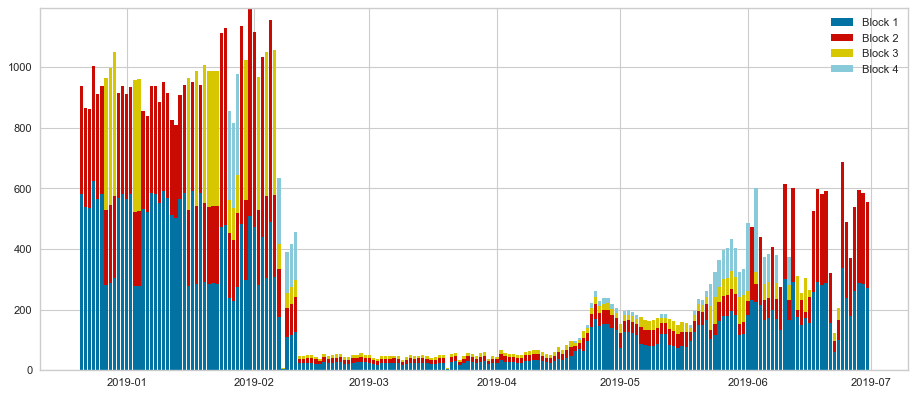

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


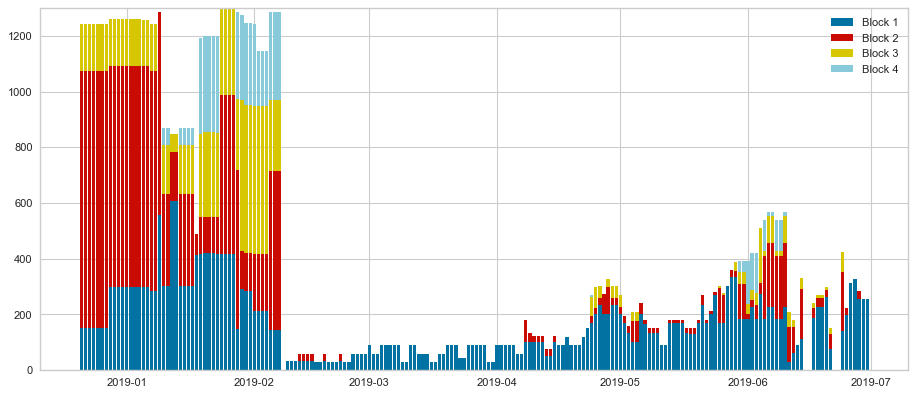

Hourly comparison: prediction vs. actual values
RMSE :12.93
MAE :7.41
R^2 :69.11
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.4010416666666667


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


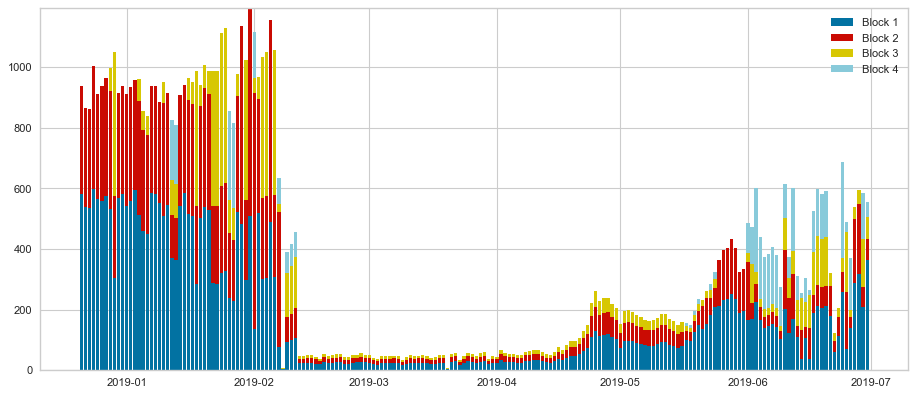

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


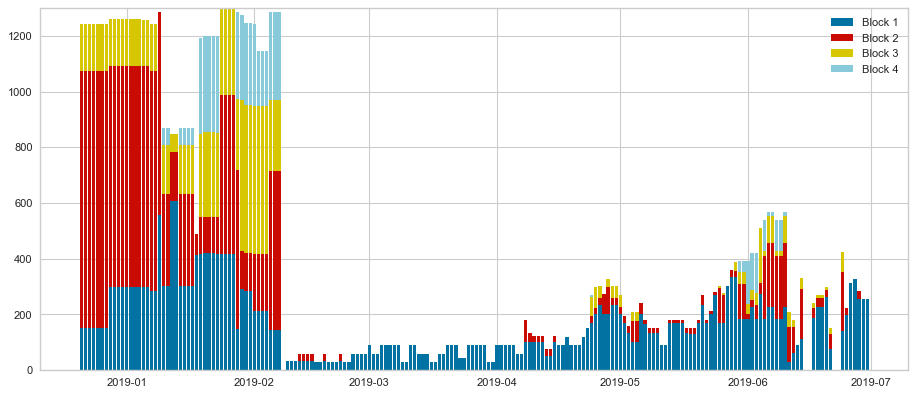

Hourly comparison: prediction vs. actual values
RMSE :13.66
MAE :7.51
R^2 :68.31
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Power-Nohours with 29 clusters **
Nb of clusters 28
Nb of centers 28, list:[66, 265, 1254, 134, 692, 412, 114, 539, 1430, 531, 769, 778, 834, 924, 990, 1056, 1851, 455, 1551, 1042, 1329, 1446, 1521, 1817, 734, 668, 98, 473]
Number of centers: 28
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.16666666666666666


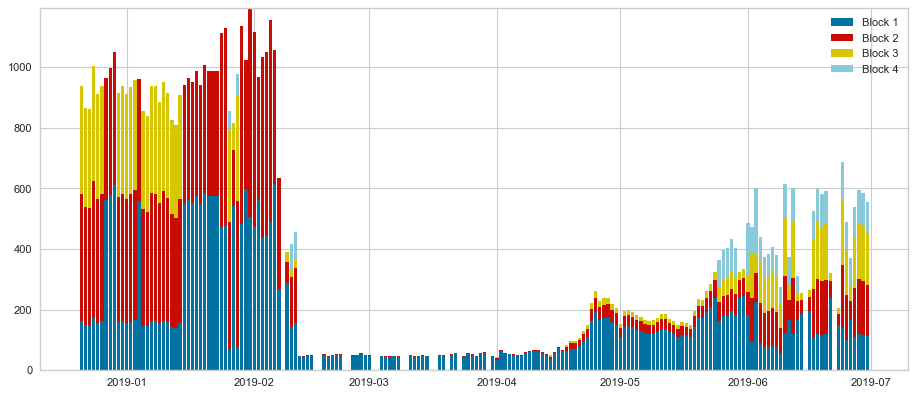

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


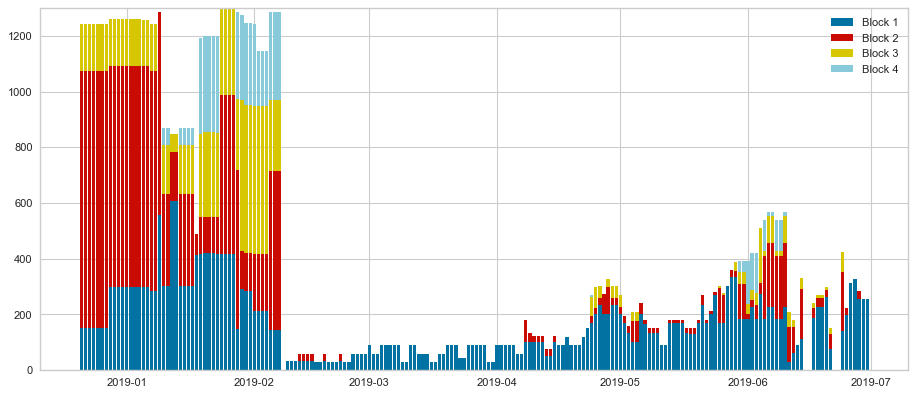

Hourly comparison: prediction vs. actual values
RMSE :12.96
MAE :7.26
R^2 :69.32
Daily comparison (max prod): prediction vs. actual values
RMSE :177.59
MAE :120.19
R^2 :85.22
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.140625


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


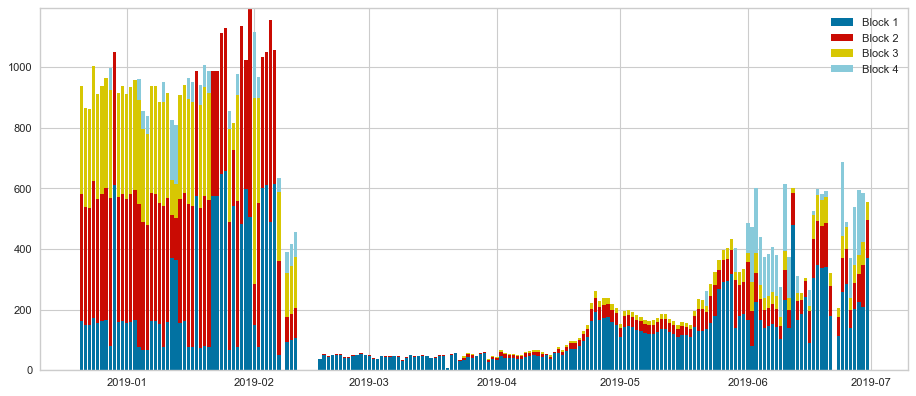

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


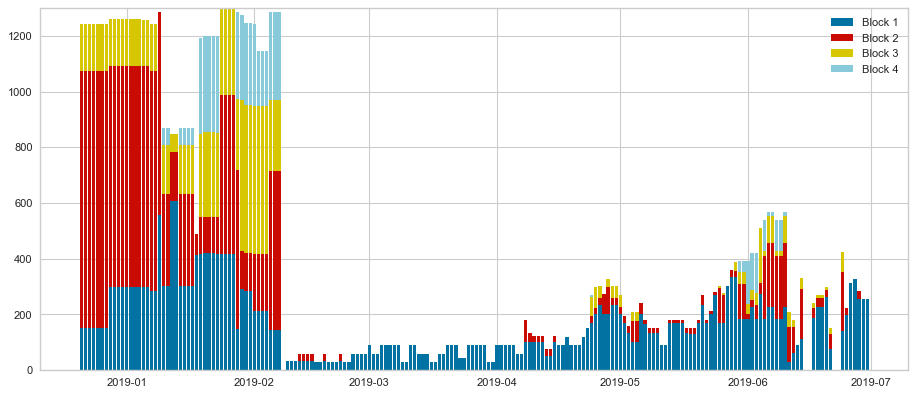

Hourly comparison: prediction vs. actual values
RMSE :13.02
MAE :7.56
R^2 :70.35
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :121.35
R^2 :85.01
************************************
** clustering Power-Nohours with 30 clusters **
Nb of clusters 29
Nb of centers 29, list:[1512, 265, 114, 153, 320, 290, 531, 724, 576, 974, 472, 335, 1303, 896, 960, 1029, 1088, 1754, 1204, 742, 1355, 1107, 1568, 792, 1817, 1656, 1732, 1621, 74]
Number of centers: 29
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.3072916666666667


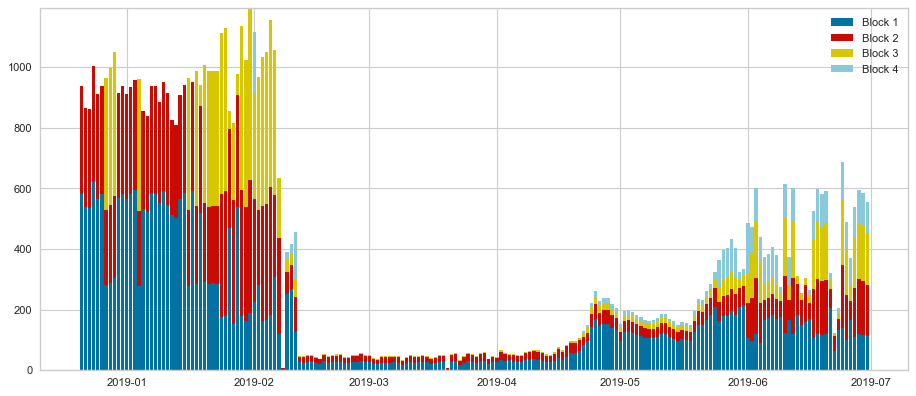

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


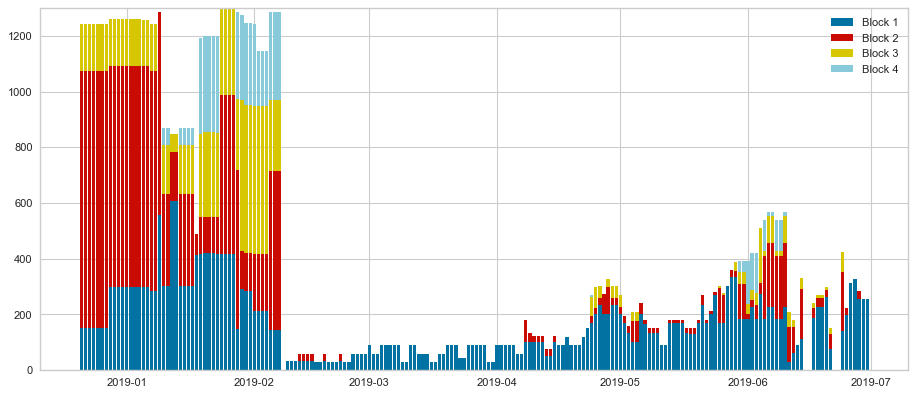

Hourly comparison: prediction vs. actual values
RMSE :13.0
MAE :7.1
R^2 :68.96
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.296875


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


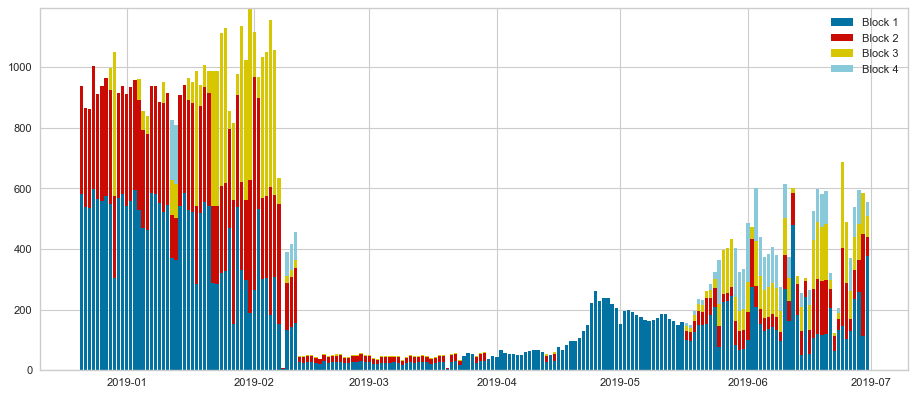

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


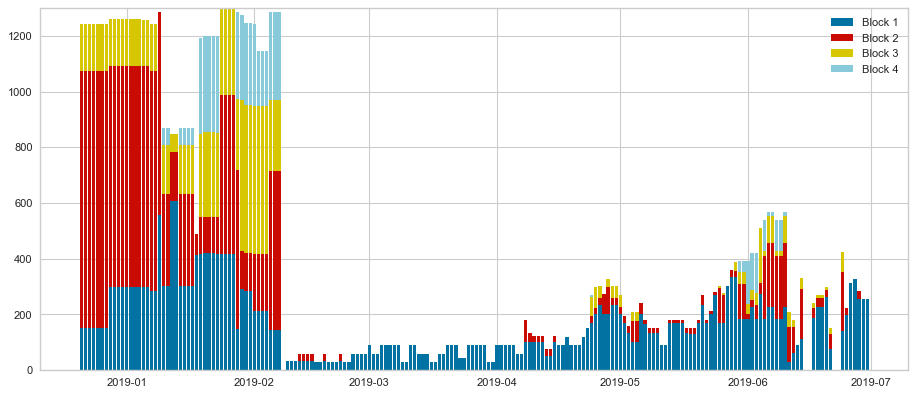

Hourly comparison: prediction vs. actual values
RMSE :13.25
MAE :7.57
R^2 :68.78
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Power-Nohours with 31 clusters **
Nb of clusters 30
Nb of centers 30, list:[62, 124, 153, 293, 290, 377, 1204, 657, 1665, 620, 1232, 1283, 778, 839, 930, 265, 1755, 1435, 1178, 1240, 1042, 1354, 1426, 1551, 465, 1430, 1674, 1740, 1817, 1859]
Number of centers: 30
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.18229166666666666


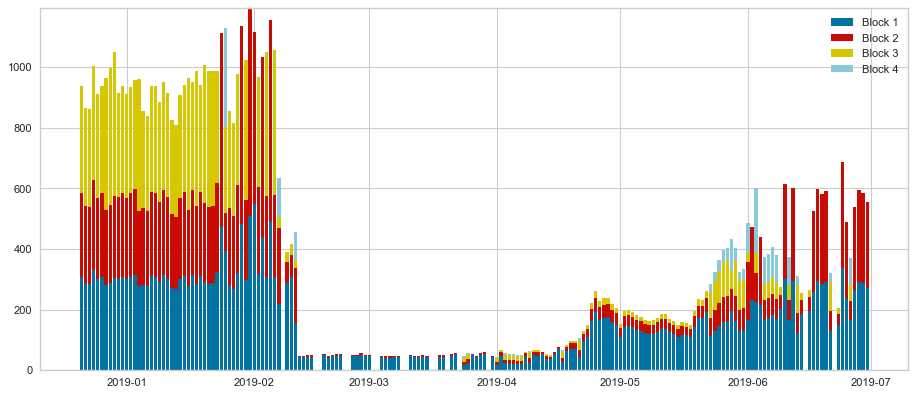

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


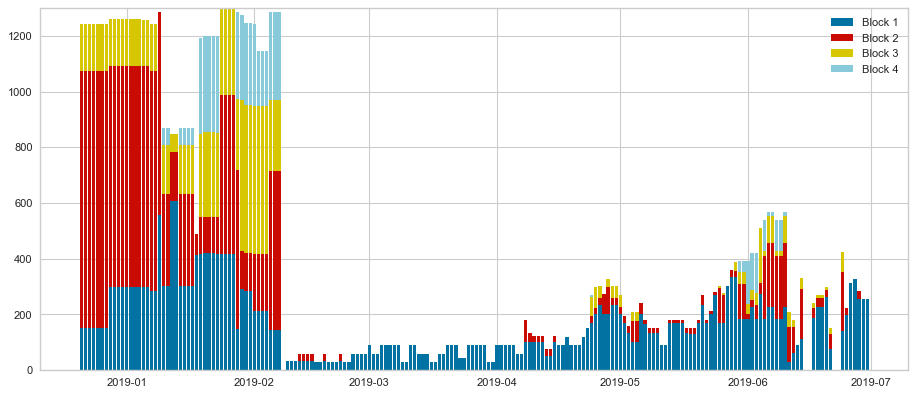

Hourly comparison: prediction vs. actual values
RMSE :13.11
MAE :7.35
R^2 :69.26
Daily comparison (max prod): prediction vs. actual values
RMSE :177.59
MAE :120.19
R^2 :85.22
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.041666666666666664


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


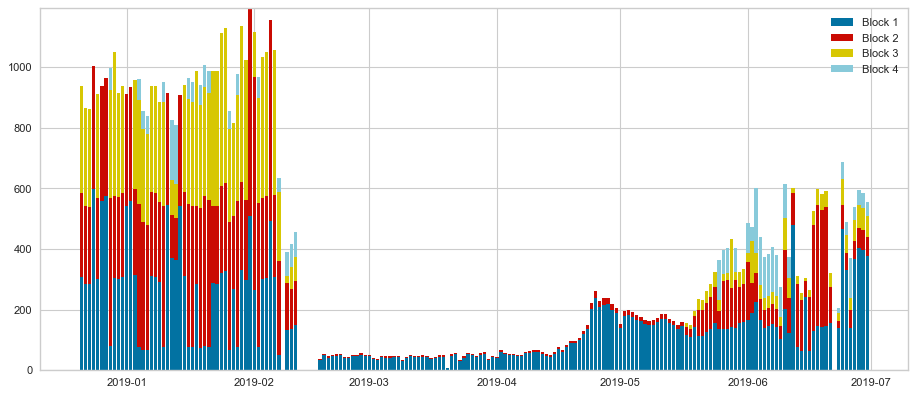

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


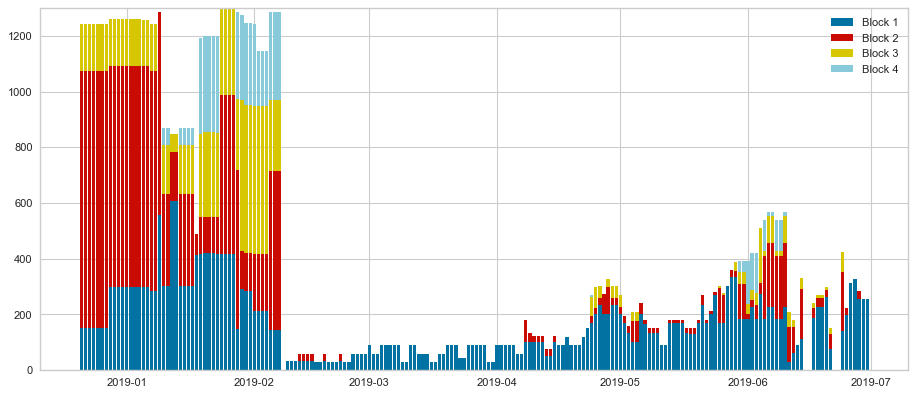

Hourly comparison: prediction vs. actual values
RMSE :13.82
MAE :7.78
R^2 :67.44
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :121.35
R^2 :85.01
************************************
** clustering Power-Nohours with 32 clusters **
Nb of clusters 31
Nb of centers 31, list:[60, 120, 134, 240, 290, 772, 1571, 1446, 540, 615, 531, 388, 780, 840, 265, 960, 974, 711, 97, 465, 1260, 1320, 1490, 98, 1329, 1550, 1107, 1504, 1740, 1817, 1860]
Number of centers: 31
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.20833333333333334


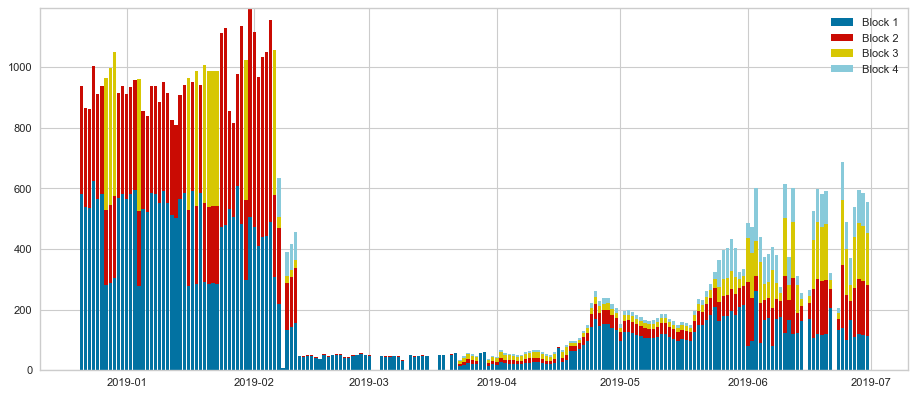

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


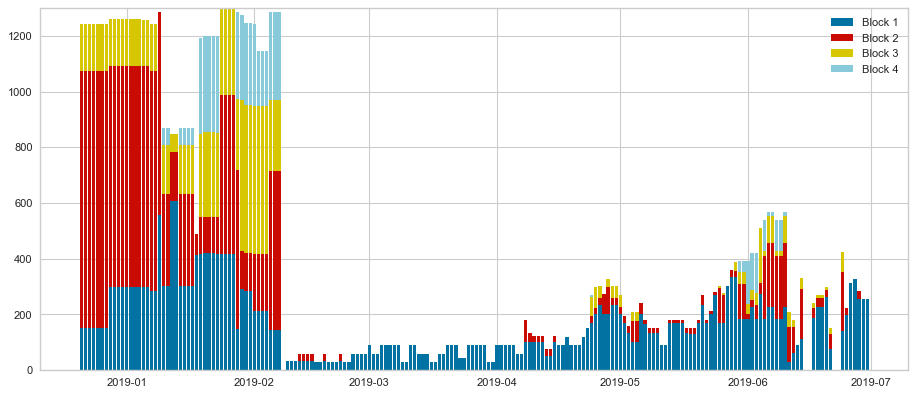

Hourly comparison: prediction vs. actual values
RMSE :12.72
MAE :7.43
R^2 :69.1
Daily comparison (max prod): prediction vs. actual values
RMSE :177.49
MAE :119.43
R^2 :85.24
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.140625


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


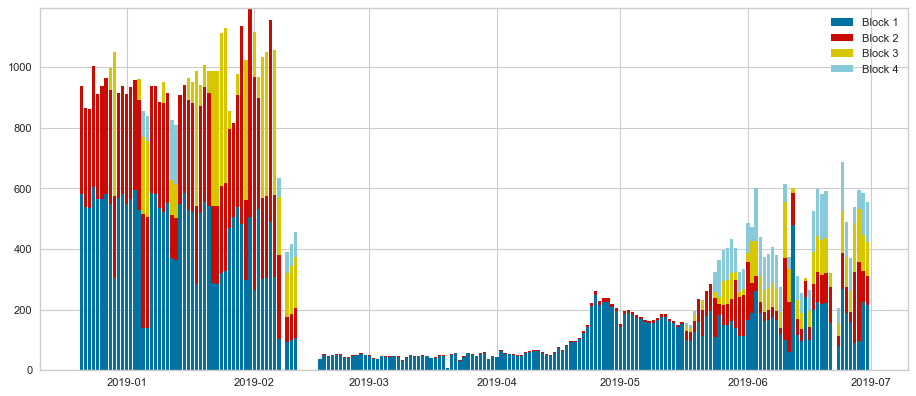

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


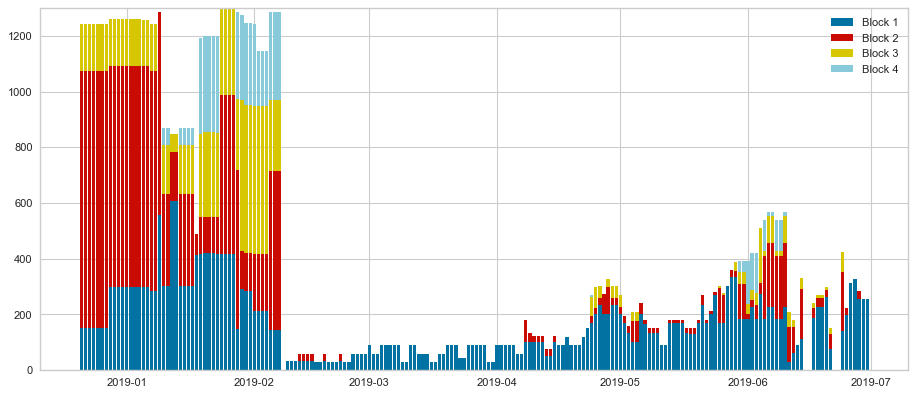

Hourly comparison: prediction vs. actual values
RMSE :13.94
MAE :7.78
R^2 :66.33
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :121.35
R^2 :85.01
************************************
** clustering Power-Nohours with 33 clusters **
Nb of clusters 32
Nb of centers 32, list:[60, 116, 230, 134, 290, 348, 406, 464, 522, 580, 974, 472, 794, 812, 839, 928, 265, 1044, 1289, 531, 1204, 203, 1367, 1109, 1446, 1551, 1423, 1107, 1283, 1700, 1795, 71]
Number of centers: 32
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.21875


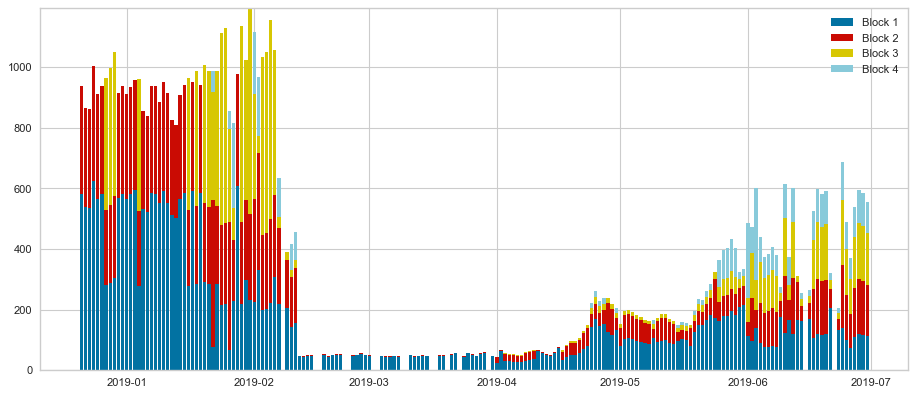

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


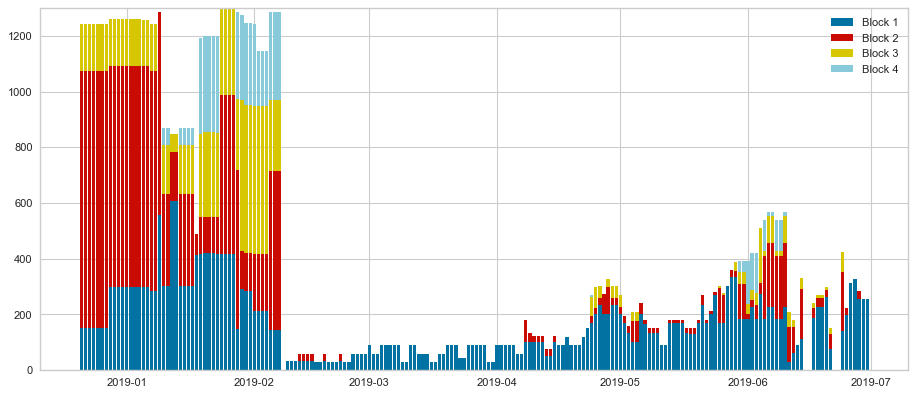

Hourly comparison: prediction vs. actual values
RMSE :12.66
MAE :7.36
R^2 :69.34
Daily comparison (max prod): prediction vs. actual values
RMSE :177.59
MAE :120.19
R^2 :85.22
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.15625


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


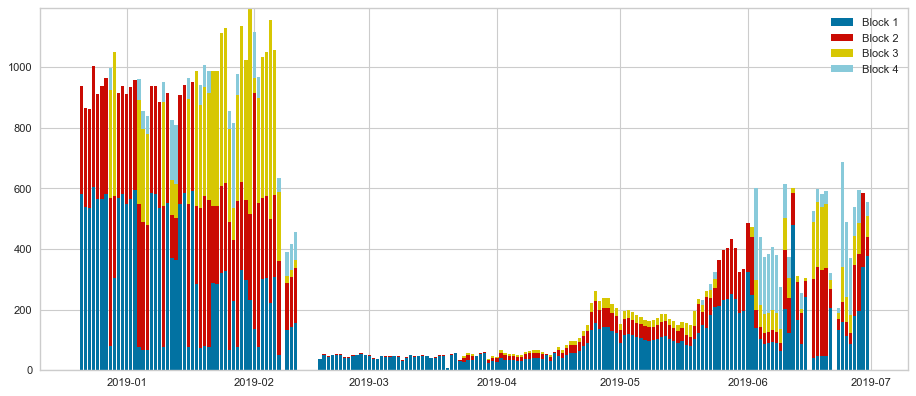

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


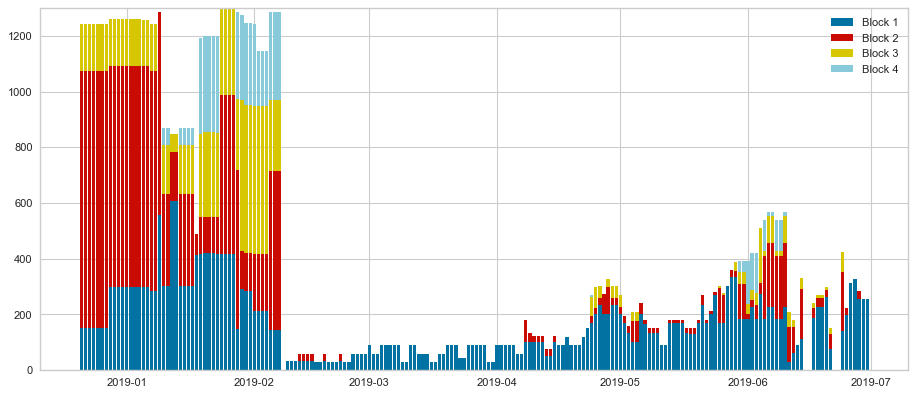

Hourly comparison: prediction vs. actual values
RMSE :12.72
MAE :7.36
R^2 :70.89
Daily comparison (max prod): prediction vs. actual values
RMSE :177.88
MAE :119.98
R^2 :85.18
************************************
** clustering Power-Nohours with 34 clusters **
Nb of clusters 33
Nb of centers 33, list:[724, 71, 134, 1208, 692, 336, 392, 657, 342, 560, 616, 794, 539, 1303, 840, 896, 952, 650, 1074, 1817, 1176, 1219, 1283, 1367, 1400, 1435, 1512, 1568, 443, 265, 1722, 1792, 1107]
Number of centers: 33
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.171875


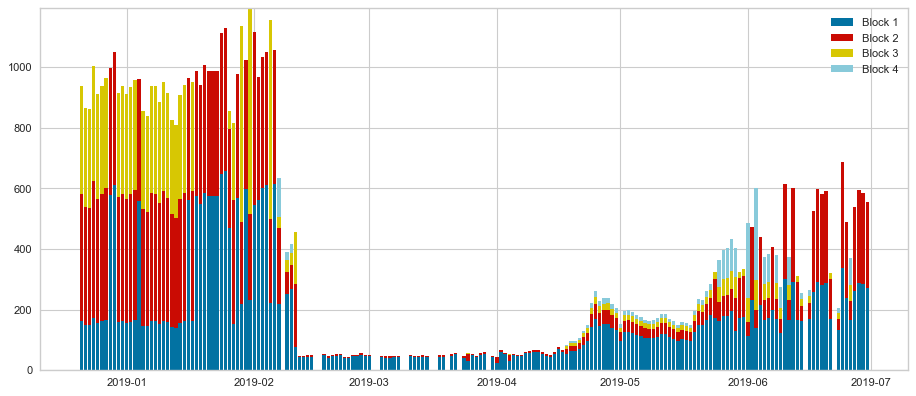

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


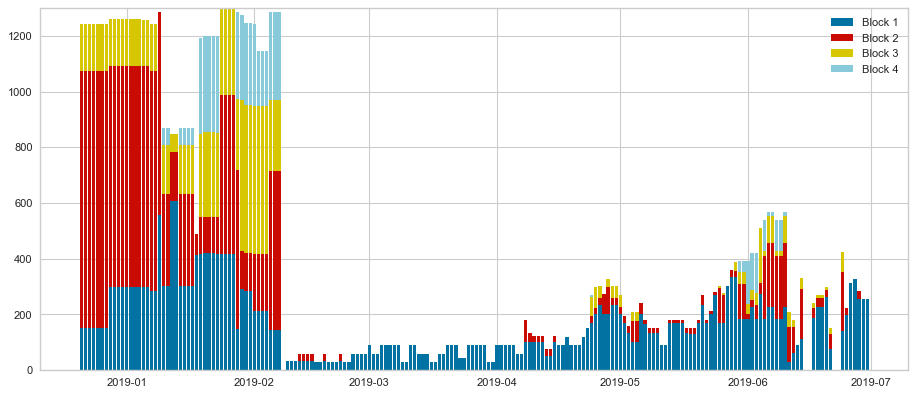

Hourly comparison: prediction vs. actual values
RMSE :12.82
MAE :7.08
R^2 :70.82
Daily comparison (max prod): prediction vs. actual values
RMSE :177.57
MAE :120.01
R^2 :85.23
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.18229166666666666


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


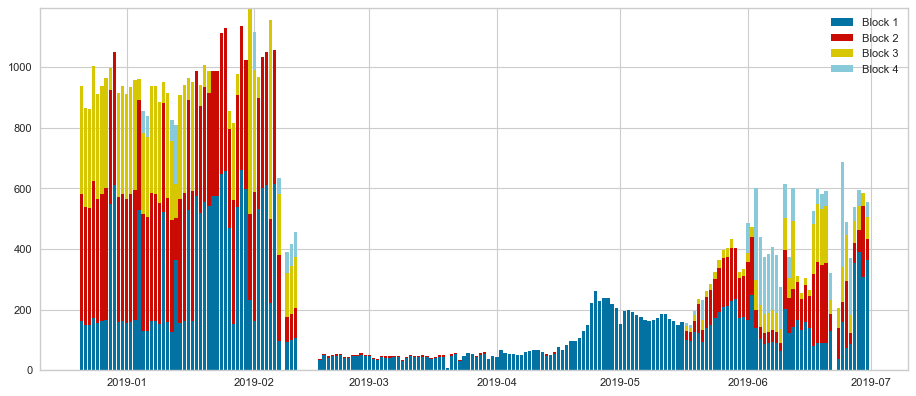

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


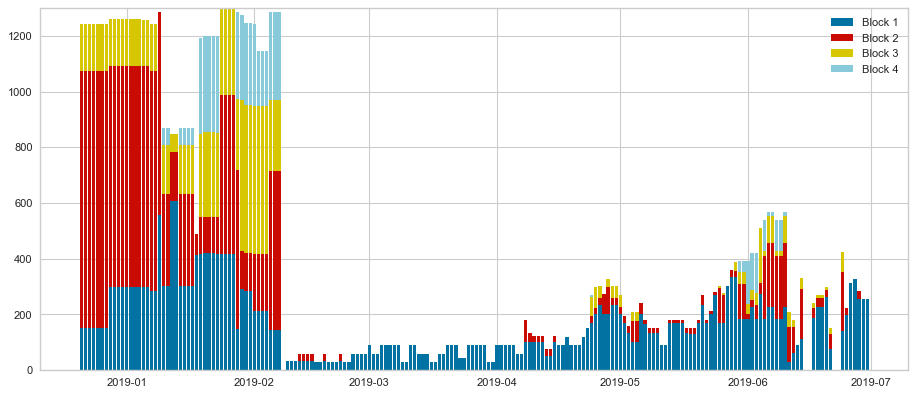

Hourly comparison: prediction vs. actual values
RMSE :13.07
MAE :7.48
R^2 :70.36
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :121.35
R^2 :85.01
************************************
** clustering Power-Nohours with 35 clusters **
Nb of clusters 34
Nb of centers 34, list:[55, 110, 250, 219, 1885, 203, 290, 74, 134, 555, 1722, 657, 1283, 1539, 531, 265, 1649, 990, 1045, 1074, 1571, 923, 1265, 602, 1375, 1596, 315, 1540, 1446, 1204, 668, 1490, 1817, 1408]
Number of centers: 34
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.18229166666666666


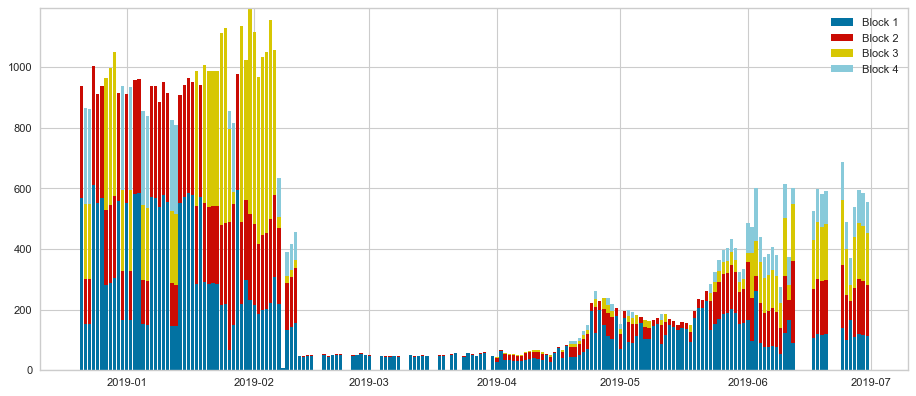

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


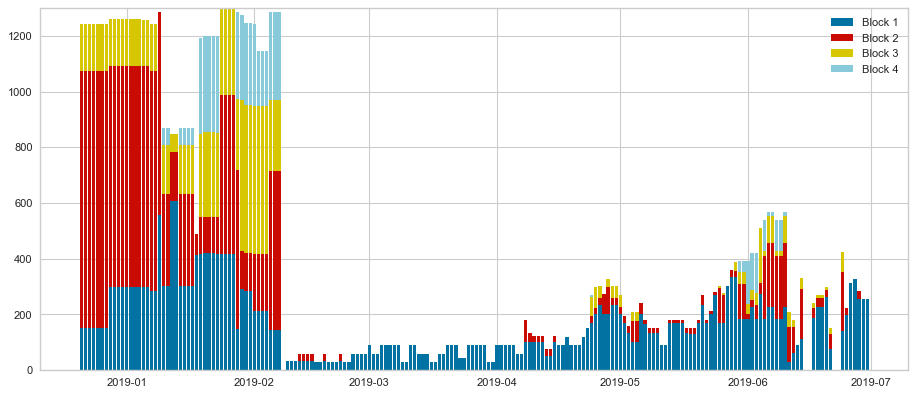

Hourly comparison: prediction vs. actual values
RMSE :12.46
MAE :7.21
R^2 :69.51
Daily comparison (max prod): prediction vs. actual values
RMSE :176.76
MAE :118.3
R^2 :85.36
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.11979166666666667


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


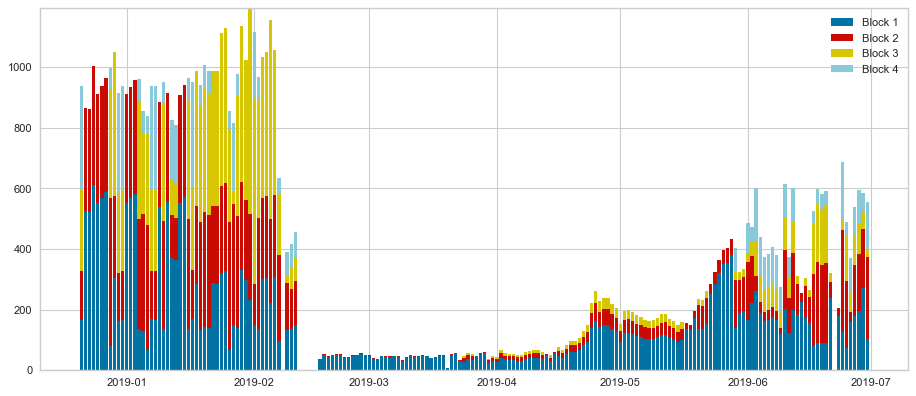

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


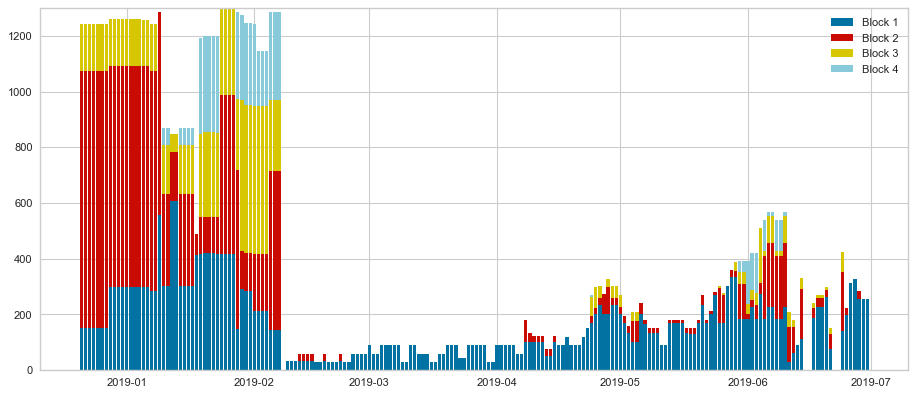

Hourly comparison: prediction vs. actual values
RMSE :13.2
MAE :7.47
R^2 :69.45
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :121.35
R^2 :85.01
************************************
** clustering Power-Nohours with 36 clusters **
Nb of clusters 35
Nb of centers 35, list:[1084, 1555, 159, 212, 265, 318, 1156, 1859, 769, 1105, 1329, 1022, 1322, 742, 795, 290, 13, 954, 650, 1649, 1113, 917, 1219, 657, 1303, 1755, 1107, 1184, 778, 1621, 1686, 1696, 1722, 1802, 465]
Number of centers: 35
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.28125


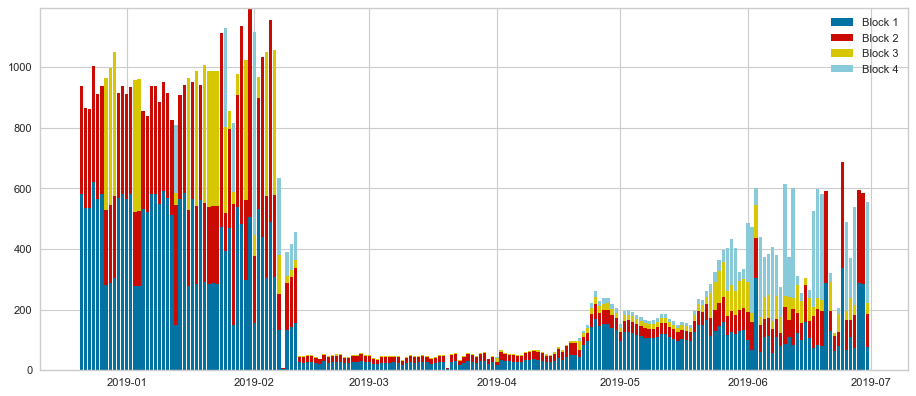

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


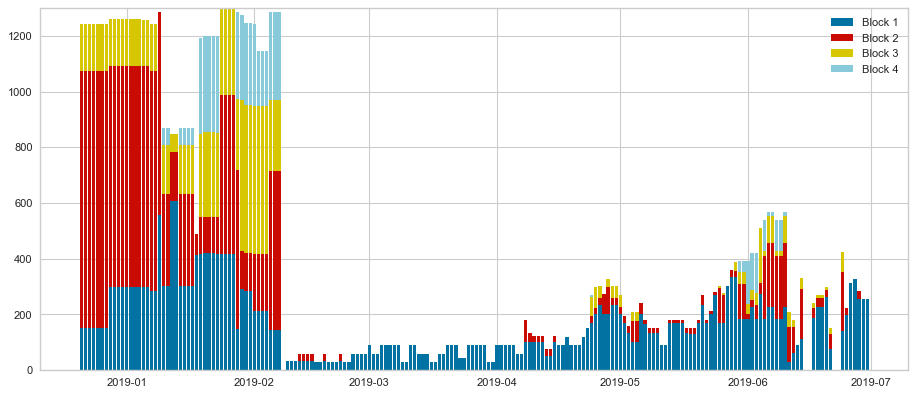

Hourly comparison: prediction vs. actual values
RMSE :12.52
MAE :6.94
R^2 :70.64
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.17708333333333334


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


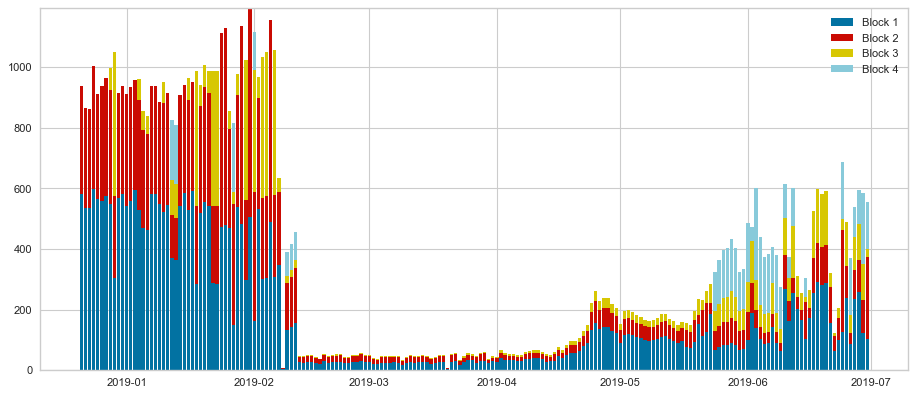

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


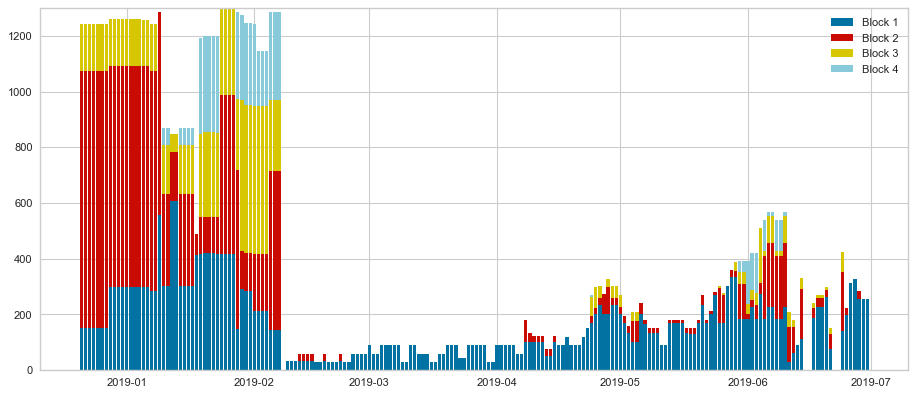

Hourly comparison: prediction vs. actual values
RMSE :12.48
MAE :7.28
R^2 :71.06
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Power-Nohours with 37 clusters **
Nb of clusters 36
Nb of centers 36, list:[52, 443, 153, 208, 974, 290, 1156, 1884, 265, 520, 572, 667, 1891, 20, 1252, 1303, 884, 1649, 1283, 181, 923, 769, 71, 489, 839, 1367, 98, 1446, 1504, 1550, 1596, 1653, 531, 1521, 81, 1107]
Number of centers: 36
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.234375


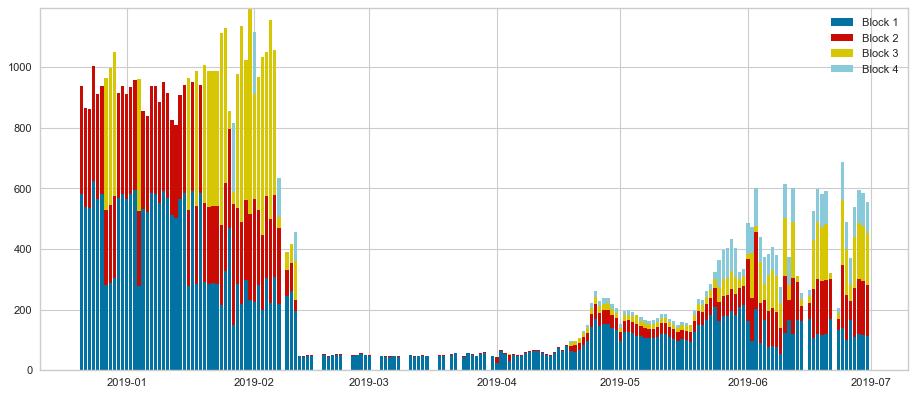

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


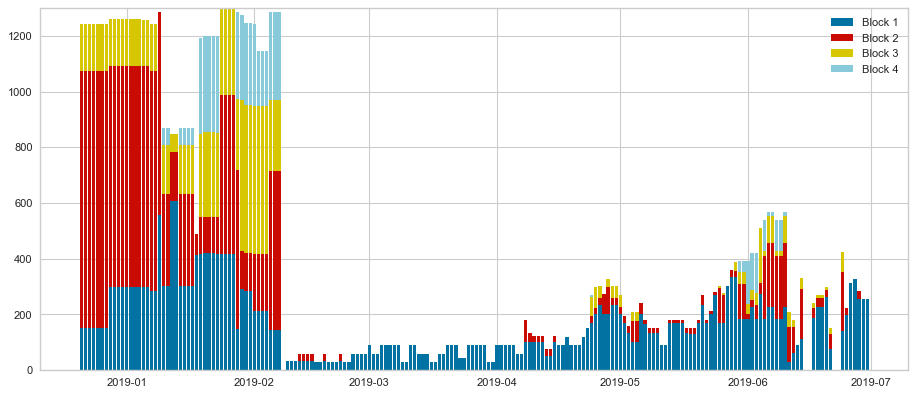

Hourly comparison: prediction vs. actual values
RMSE :13.0
MAE :7.02
R^2 :69.78
Daily comparison (max prod): prediction vs. actual values
RMSE :177.59
MAE :120.19
R^2 :85.22
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.15625


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


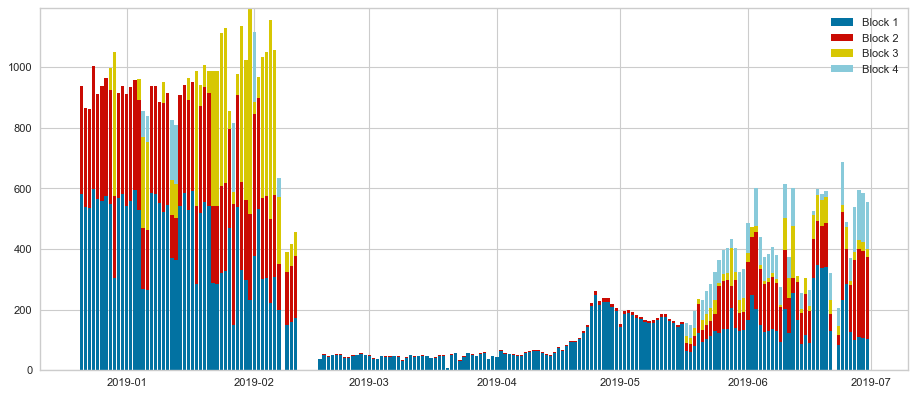

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


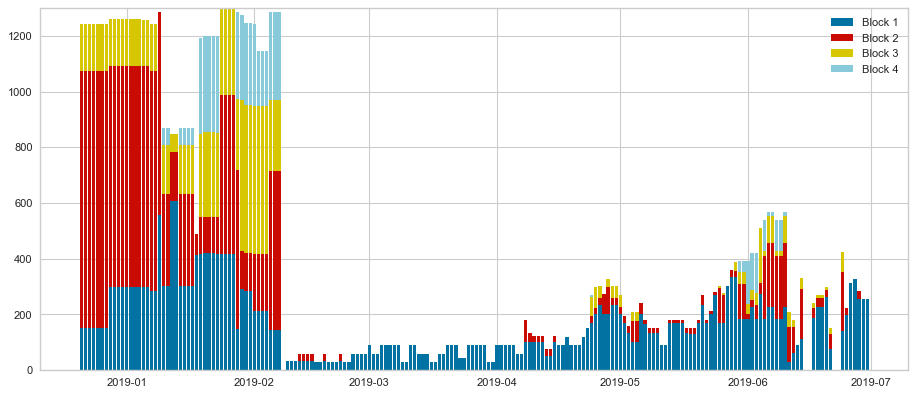

Hourly comparison: prediction vs. actual values
RMSE :13.95
MAE :7.77
R^2 :66.93
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :121.35
R^2 :85.01
************************************
** clustering Power-Nohours with 38 clusters **
Nb of clusters 37
Nb of centers 37, list:[203, 1107, 150, 1156, 230, 307, 350, 512, 196, 524, 555, 1219, 650, 161, 1074, 1283, 850, 265, 950, 1000, 315, 1100, 1150, 71, 98, 602, 1367, 1571, 1450, 557, 1551, 1600, 1650, 1722, 657, 1817, 1146]
Number of centers: 37
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.18229166666666666


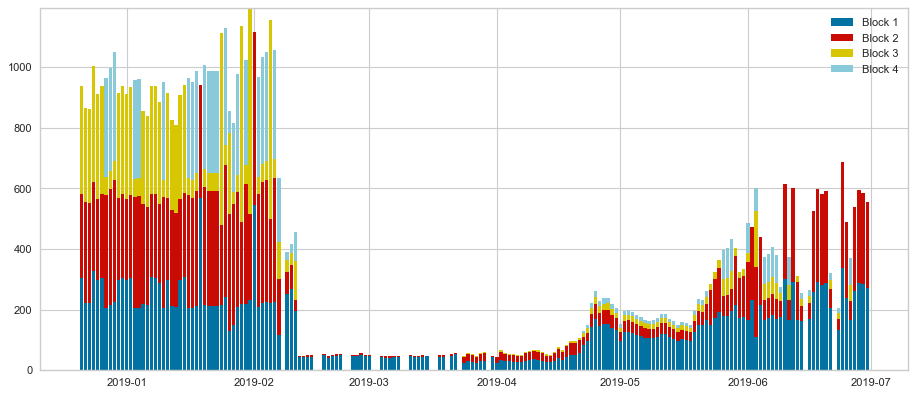

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


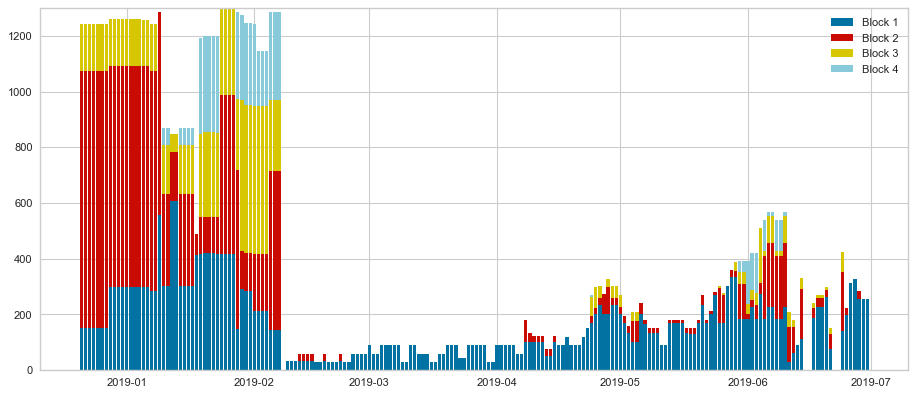

Hourly comparison: prediction vs. actual values
RMSE :12.93
MAE :7.26
R^2 :69.56
Daily comparison (max prod): prediction vs. actual values
RMSE :177.59
MAE :120.19
R^2 :85.22
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.09375


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


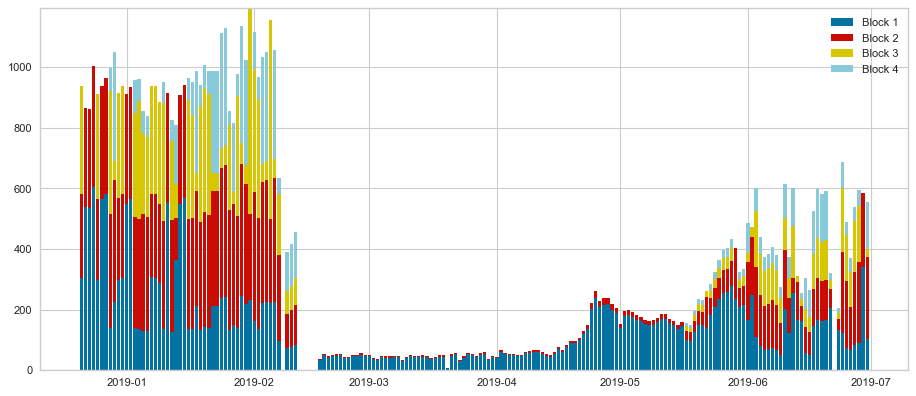

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


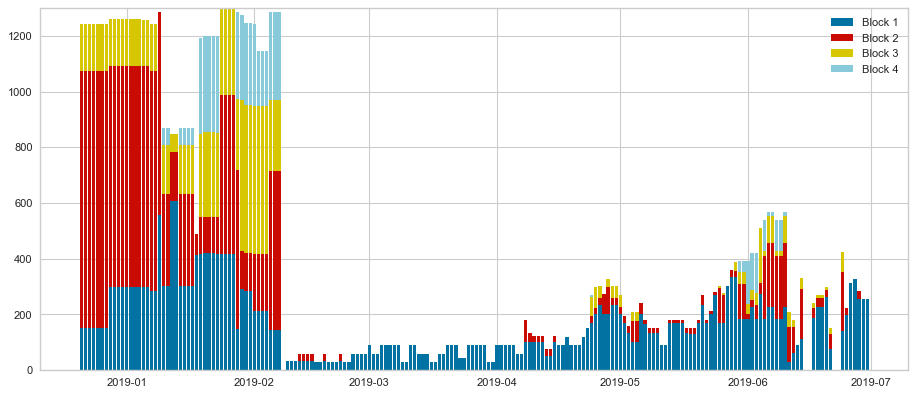

Hourly comparison: prediction vs. actual values
RMSE :14.2
MAE :7.84
R^2 :66.79
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :121.35
R^2 :85.01
************************************
** clustering Power-Nohours with 39 clusters **
Nb of clusters 38
Nb of centers 38, list:[203, 1397, 147, 1551, 245, 1156, 342, 392, 441, 290, 923, 1283, 161, 686, 1649, 1722, 602, 882, 794, 980, 1029, 1070, 71, 1176, 531, 265, 1323, 1348, 1817, 1471, 815, 1571, 443, 1666, 1715, 1765, 1446, 1107]
Number of centers: 38
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.21875


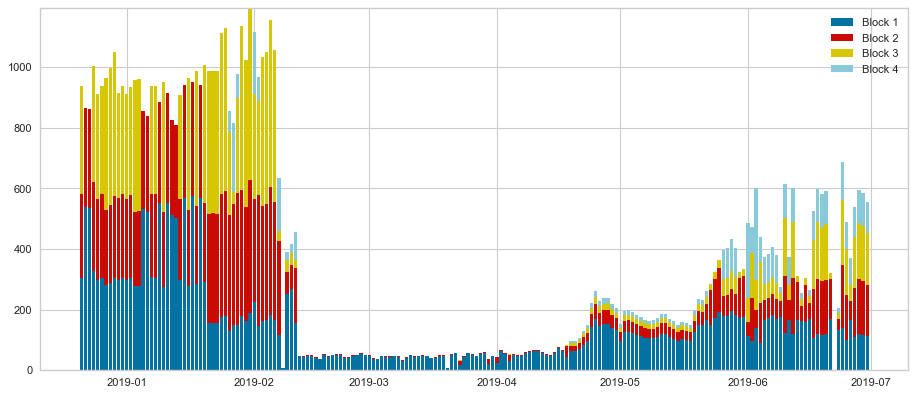

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


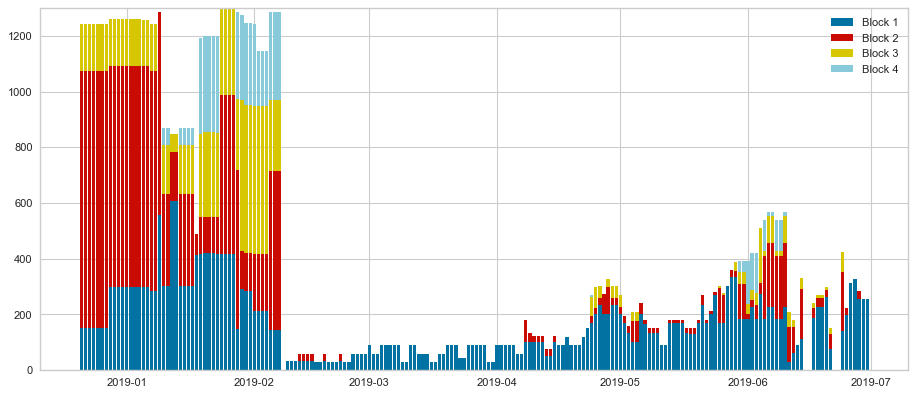

Hourly comparison: prediction vs. actual values
RMSE :12.26
MAE :6.82
R^2 :70.62
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.19791666666666666


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


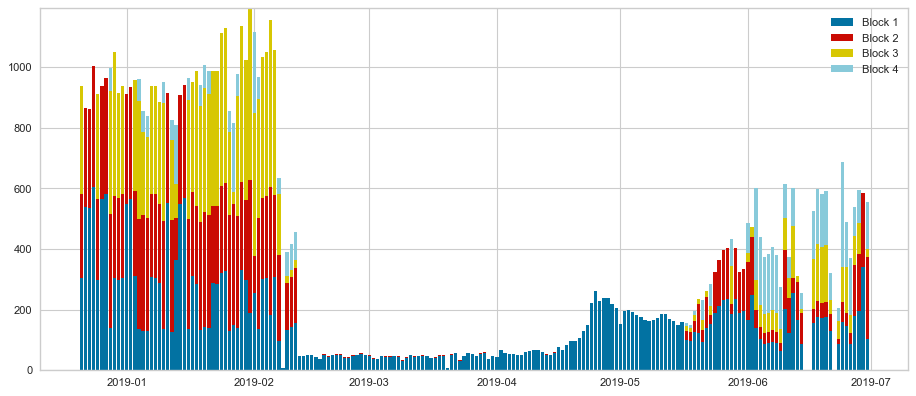

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


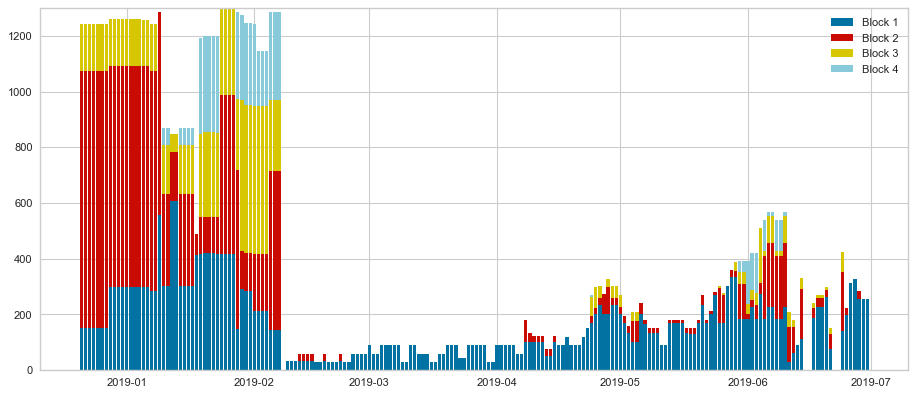

Hourly comparison: prediction vs. actual values
RMSE :12.74
MAE :7.25
R^2 :71.11
Daily comparison (max prod): prediction vs. actual values
RMSE :176.32
MAE :117.34
R^2 :85.44
************************************
** clustering Power-Nohours with 40 clusters **
Nb of clusters 39
Nb of centers 39, list:[203, 1548, 144, 114, 250, 286, 336, 384, 440, 1596, 20, 576, 1306, 668, 531, 1395, 1204, 864, 342, 960, 650, 315, 1104, 1490, 71, 29, 710, 1367, 1817, 98, 1550, 793, 1446, 1632, 265, 1728, 1776, 1824, 1872]
Number of centers: 39
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.19791666666666666


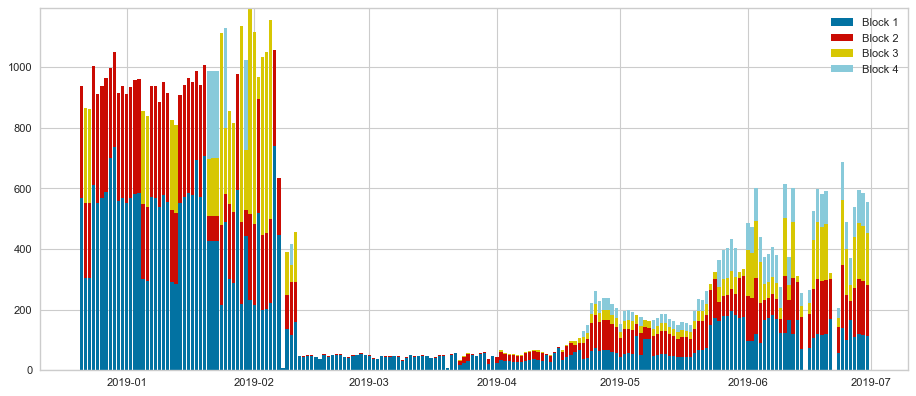

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


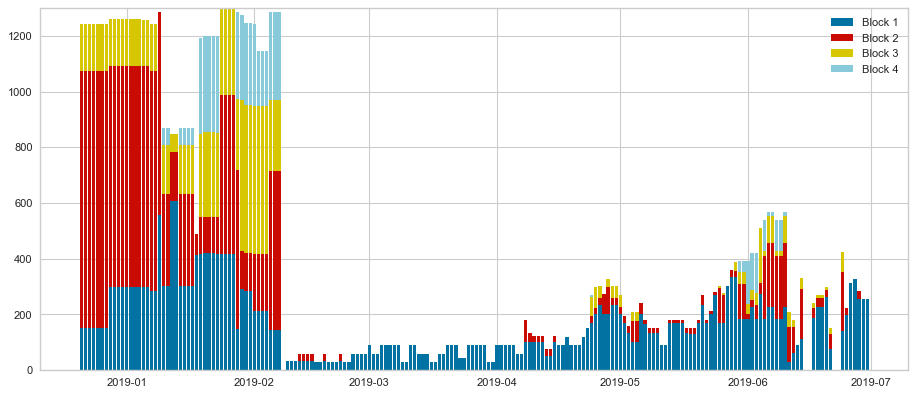

Hourly comparison: prediction vs. actual values
RMSE :12.43
MAE :7.11
R^2 :69.94
Daily comparison (max prod): prediction vs. actual values
RMSE :177.35
MAE :118.72
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.11458333333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


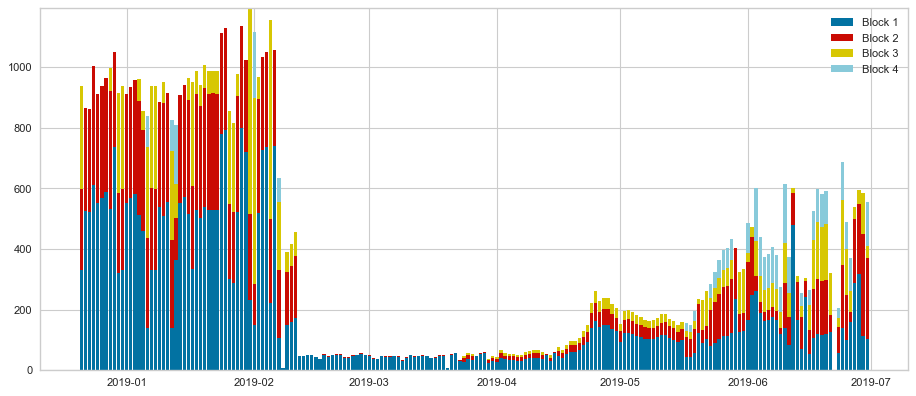

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


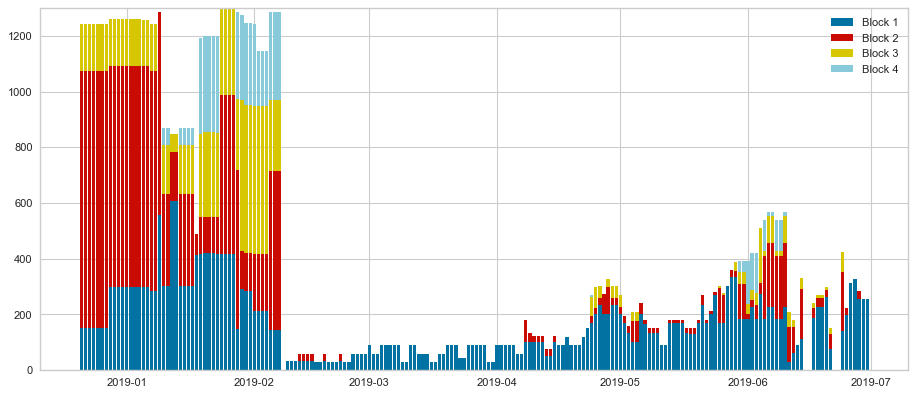

Hourly comparison: prediction vs. actual values
RMSE :13.11
MAE :7.47
R^2 :69.32
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Power-Nohours with 41 clusters **
Nb of clusters 40
Nb of centers 40, list:[47, 94, 141, 188, 235, 161, 329, 307, 423, 1107, 1817, 555, 602, 658, 974, 1322, 1149, 846, 893, 940, 265, 1755, 1070, 1128, 1175, 1222, 765, 1283, 1367, 480, 15, 1504, 1551, 1117, 203, 1692, 1722, 1786, 196, 1197]
Number of centers: 40
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.11458333333333333


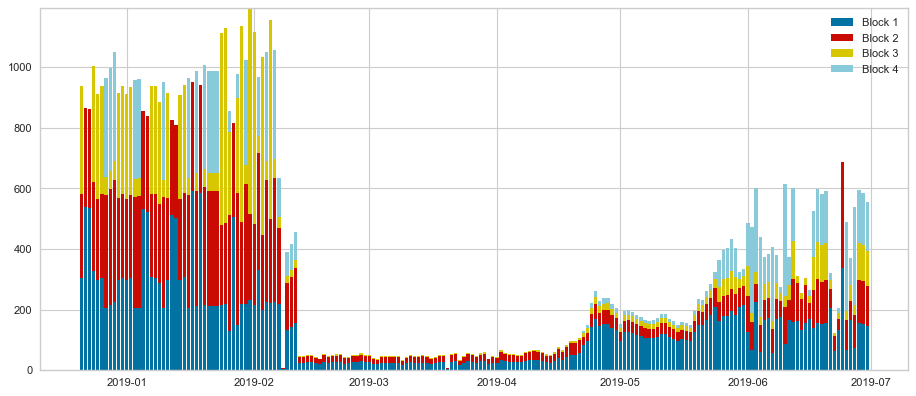

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


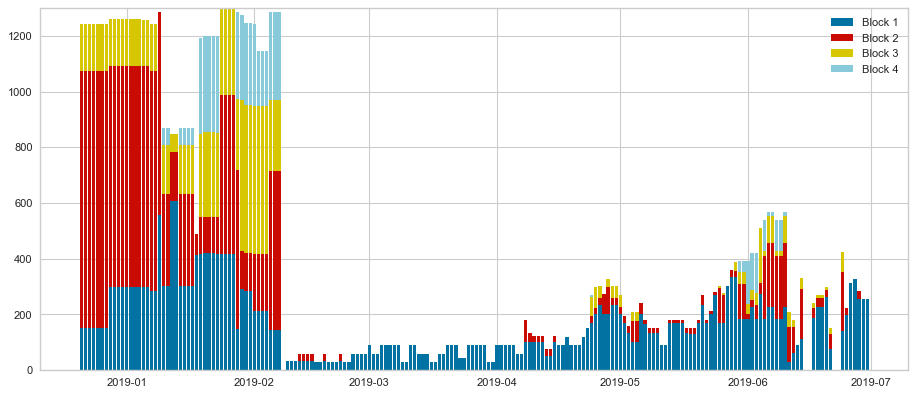

Hourly comparison: prediction vs. actual values
RMSE :13.08
MAE :7.11
R^2 :69.93
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.026041666666666668


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


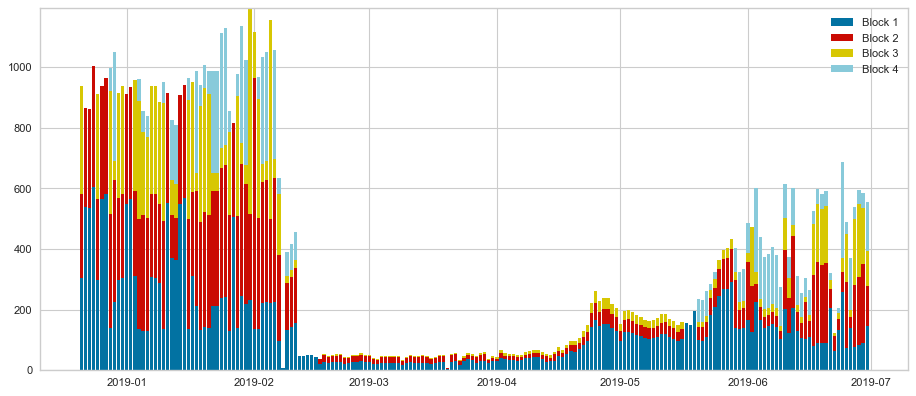

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


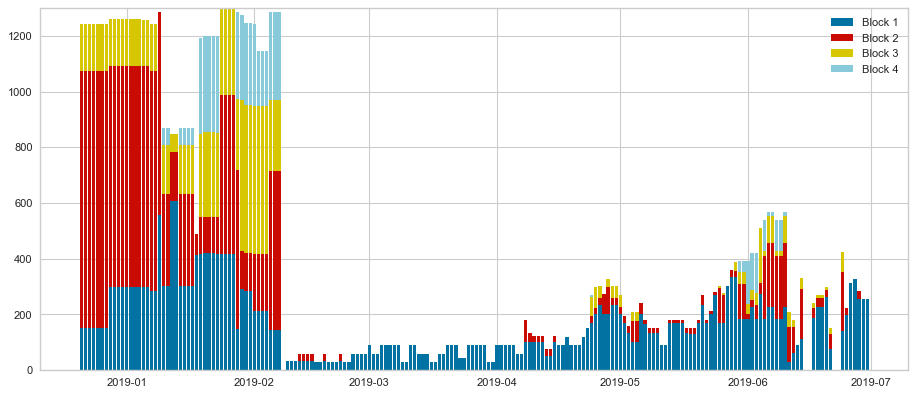

Hourly comparison: prediction vs. actual values
RMSE :12.99
MAE :7.36
R^2 :70.39
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Power-Nohours with 42 clusters **
Nb of clusters 41
Nb of centers 41, list:[1596, 1252, 134, 230, 692, 276, 322, 98, 1884, 440, 539, 555, 615, 769, 531, 1208, 794, 290, 342, 1283, 966, 1070, 1649, 1104, 1764, 71, 606, 1571, 1367, 1380, 1621, 1472, 1521, 1555, 1817, 1656, 1702, 388, 1794, 1548, 1551]
Number of centers: 41
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.140625


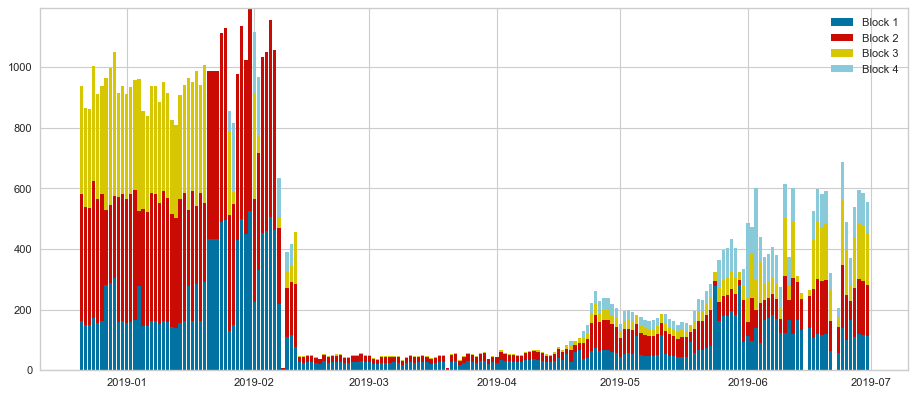

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


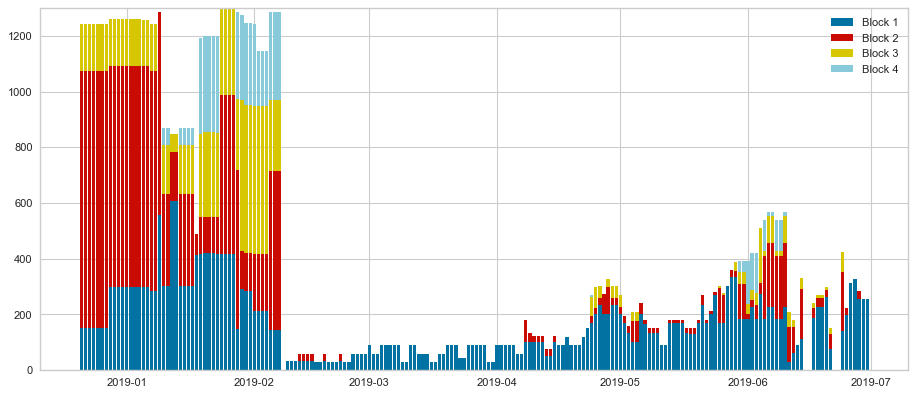

Hourly comparison: prediction vs. actual values
RMSE :12.29
MAE :6.79
R^2 :70.9
Daily comparison (max prod): prediction vs. actual values
RMSE :177.35
MAE :118.72
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.13541666666666666


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


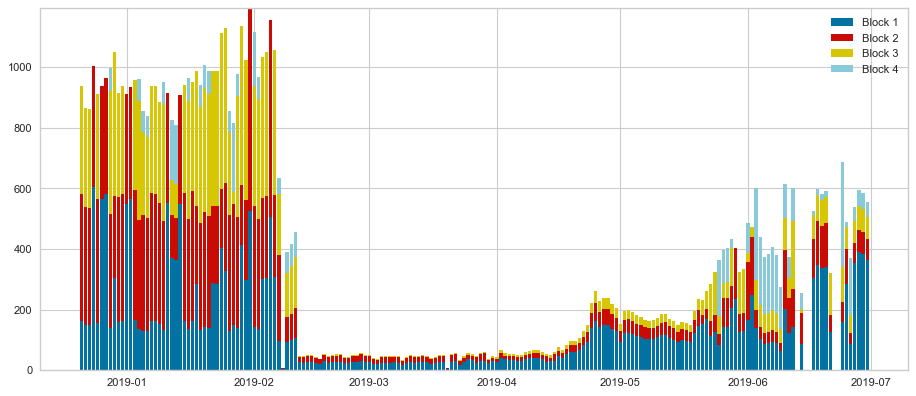

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


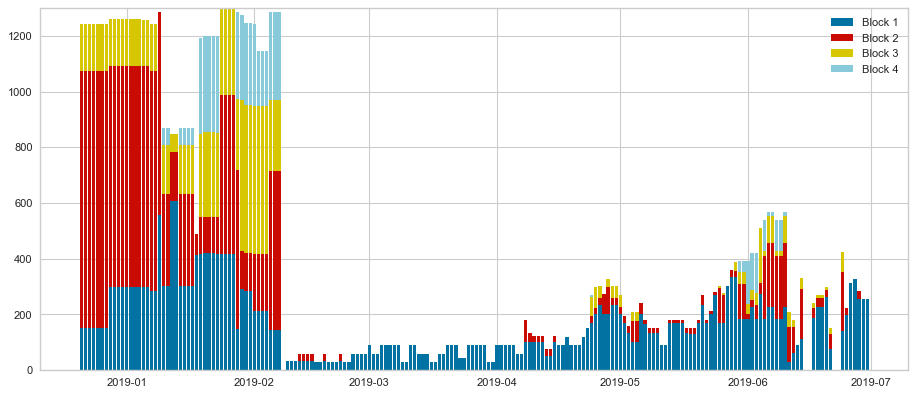

Hourly comparison: prediction vs. actual values
RMSE :12.35
MAE :7.03
R^2 :72.08
Daily comparison (max prod): prediction vs. actual values
RMSE :175.09
MAE :115.59
R^2 :85.64
************************************
** clustering Power-Nohours with 43 clusters **
Nb of clusters 42
Nb of centers 42, list:[657, 97, 135, 180, 1630, 270, 315, 360, 342, 1550, 290, 540, 881, 974, 675, 531, 769, 796, 855, 13, 945, 990, 1035, 711, 465, 1170, 1204, 388, 1305, 1350, 1289, 1440, 615, 1530, 1117, 1107, 1665, 1722, 1755, 1596, 1817, 1252]
Number of centers: 42
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.20833333333333334


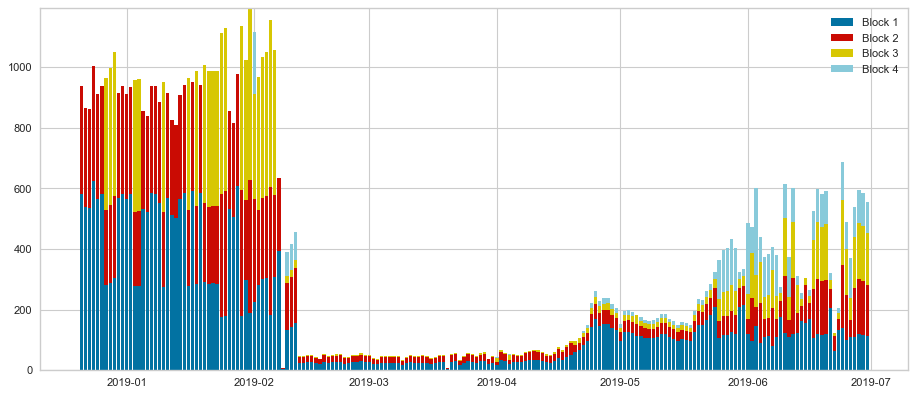

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


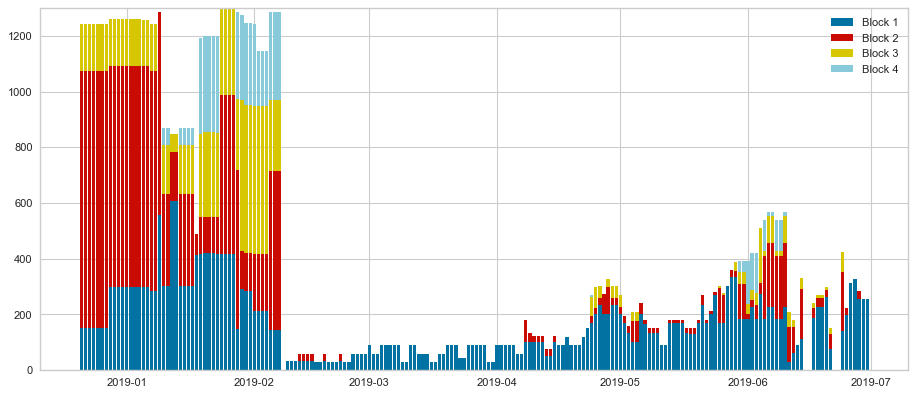

Hourly comparison: prediction vs. actual values
RMSE :12.82
MAE :7.05
R^2 :70.47
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.10416666666666667


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


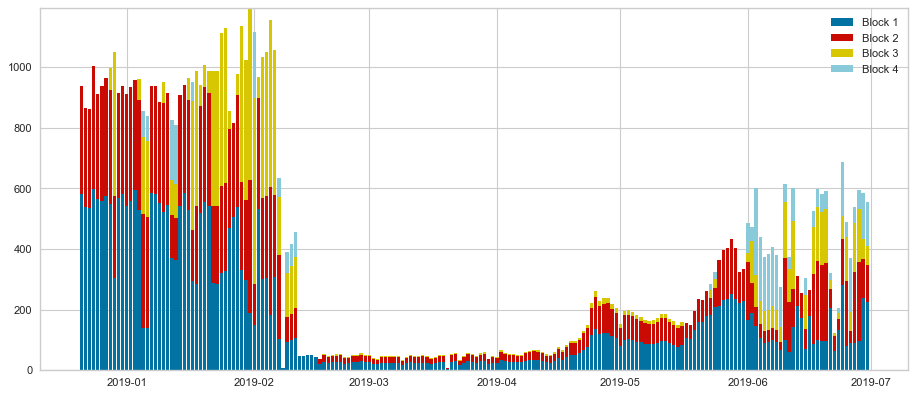

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


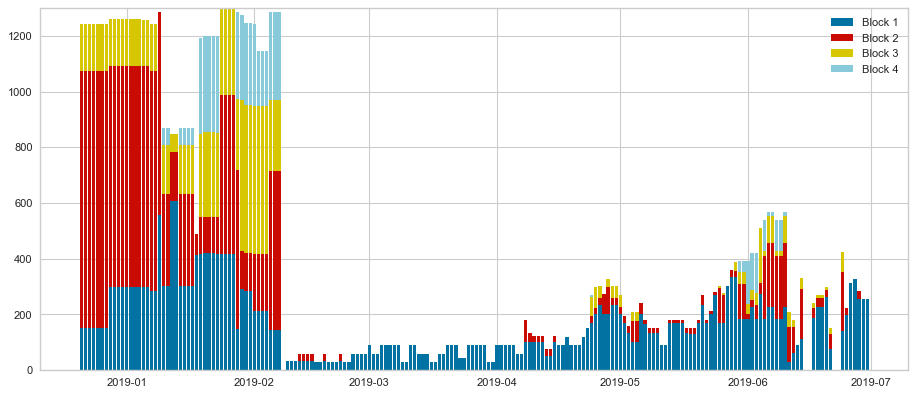

Hourly comparison: prediction vs. actual values
RMSE :13.96
MAE :7.76
R^2 :67.19
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Power-Nohours with 44 clusters **
Nb of clusters 43
Nb of centers 43, list:[1252, 97, 13, 134, 472, 230, 290, 352, 1884, 440, 557, 539, 572, 616, 660, 974, 690, 793, 1149, 265, 924, 968, 1745, 315, 1070, 769, 1188, 1219, 203, 602, 1367, 1408, 1446, 1283, 1540, 1817, 1410, 1673, 1722, 1765, 1804, 469, 1892]
Number of centers: 43
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.140625


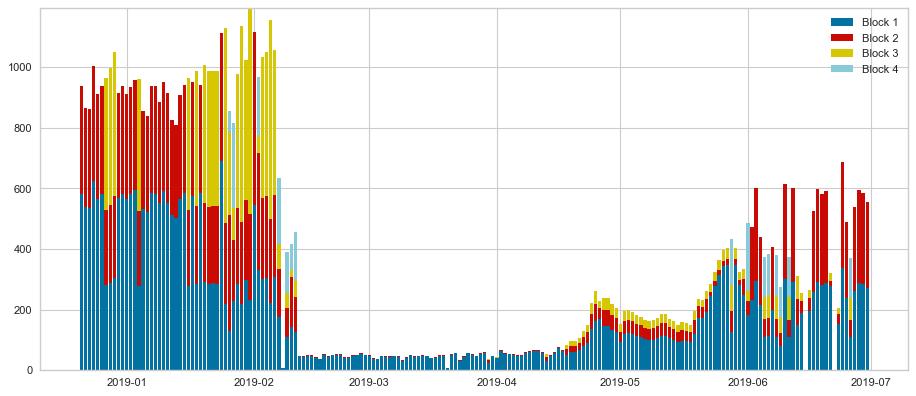

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


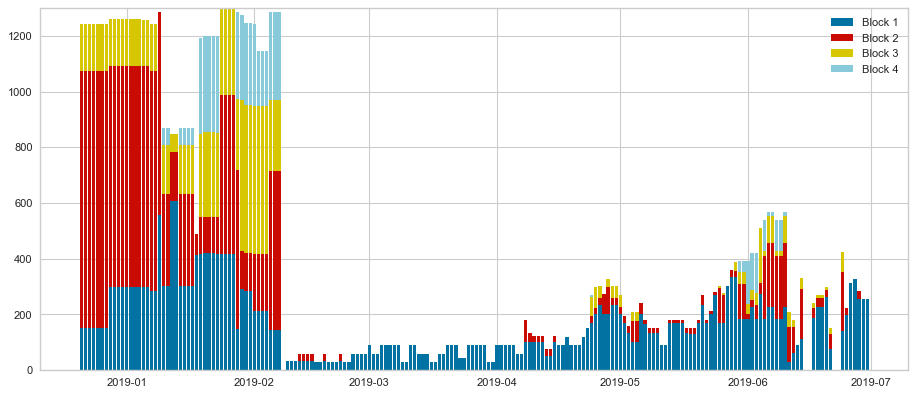

Hourly comparison: prediction vs. actual values
RMSE :12.84
MAE :7.22
R^2 :70.44
Daily comparison (max prod): prediction vs. actual values
RMSE :177.35
MAE :118.72
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.10416666666666667


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


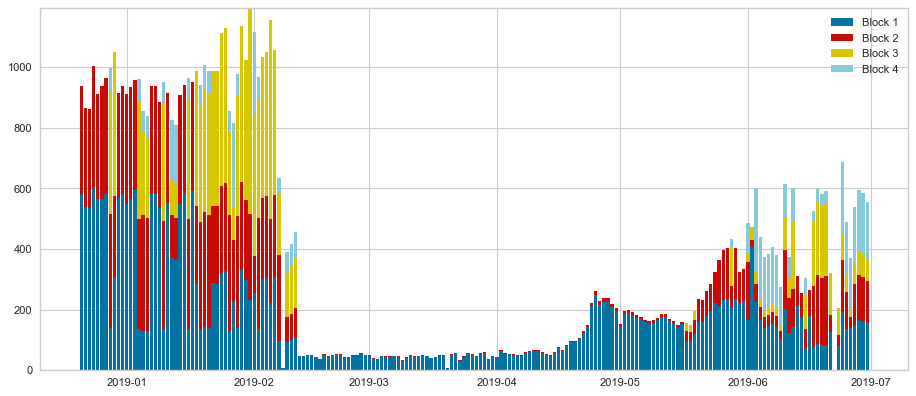

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


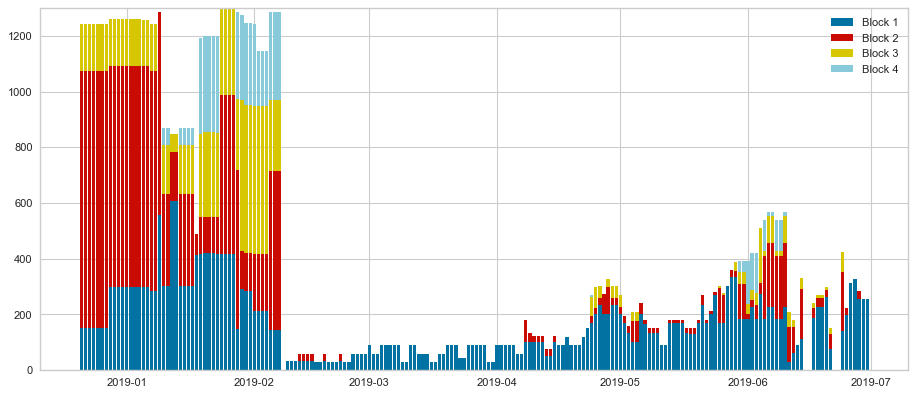

Hourly comparison: prediction vs. actual values
RMSE :14.08
MAE :7.82
R^2 :66.79
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Power-Nohours with 45 clusters **
Nb of clusters 44
Nb of centers 44, list:[1252, 1551, 265, 153, 215, 974, 301, 344, 377, 1859, 473, 98, 557, 606, 55, 531, 539, 774, 817, 860, 356, 946, 989, 1378, 1075, 1435, 796, 1204, 388, 1290, 555, 1376, 1419, 1462, 1146, 1548, 1596, 1634, 1677, 1322, 668, 1817, 465, 315]
Number of centers: 44
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.15625


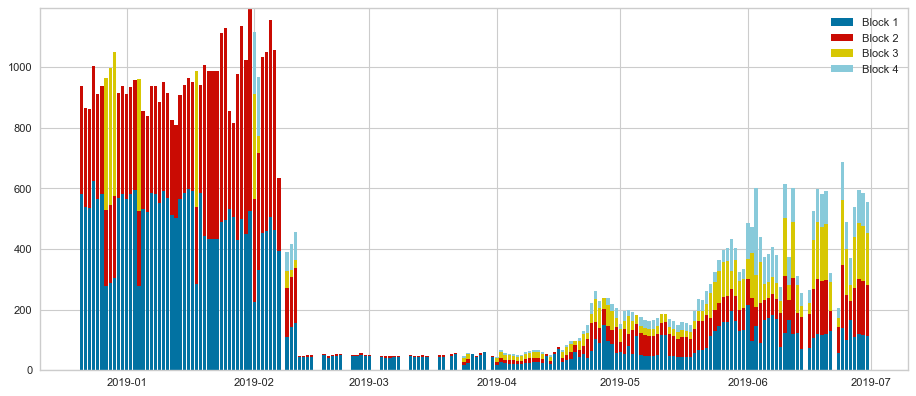

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


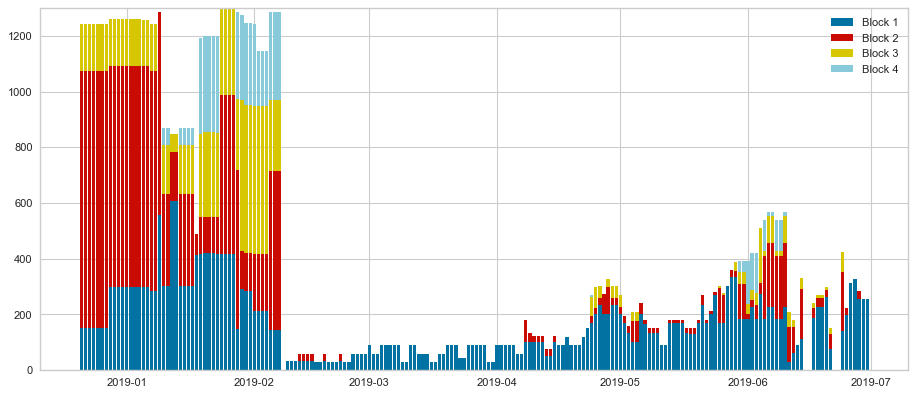

Hourly comparison: prediction vs. actual values
RMSE :12.3
MAE :6.98
R^2 :70.21
Daily comparison (max prod): prediction vs. actual values
RMSE :177.59
MAE :120.19
R^2 :85.22
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.057291666666666664


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


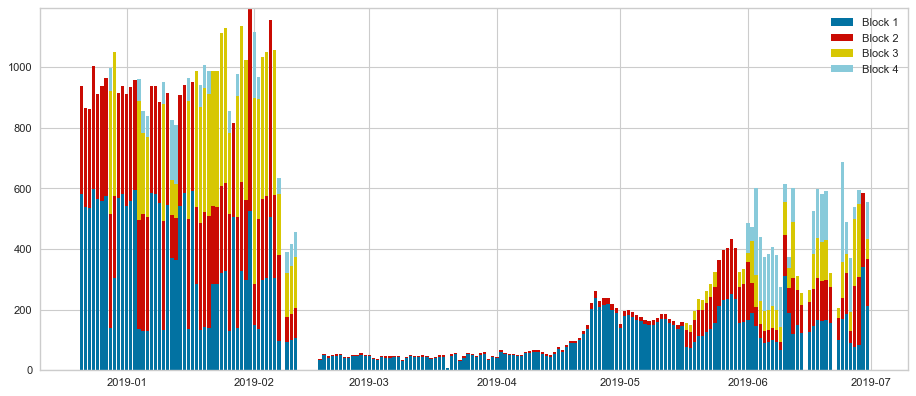

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


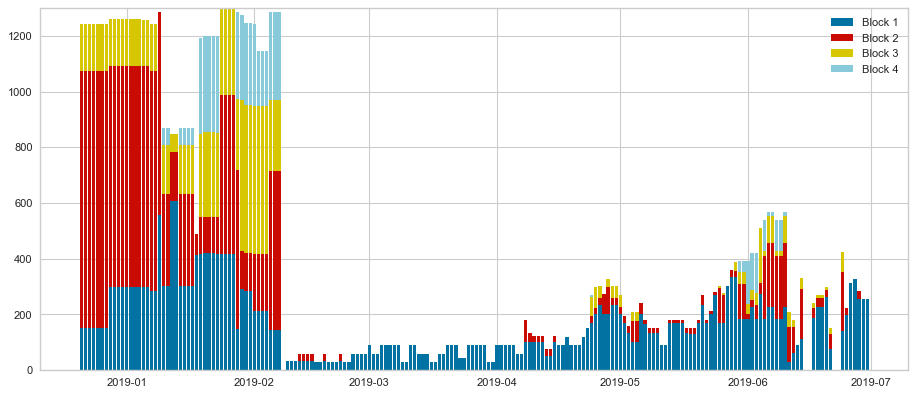

Hourly comparison: prediction vs. actual values
RMSE :13.79
MAE :7.58
R^2 :67.97
Daily comparison (max prod): prediction vs. actual values
RMSE :177.57
MAE :119.78
R^2 :85.23
************************************
** clustering Power-Nohours with 46 clusters **
Nb of clusters 45
Nb of centers 45, list:[388, 74, 126, 134, 210, 252, 472, 336, 290, 895, 462, 342, 440, 588, 974, 1532, 714, 1283, 794, 840, 882, 924, 966, 650, 315, 1092, 557, 1397, 1204, 531, 1042, 1367, 555, 1430, 1568, 1254, 1551, 1117, 1638, 265, 1722, 1765, 1817, 1408, 417]
Number of centers: 45
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.15625


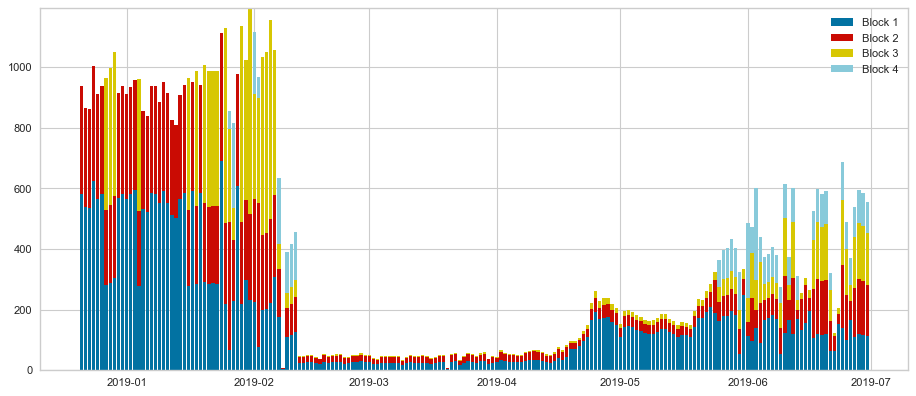

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


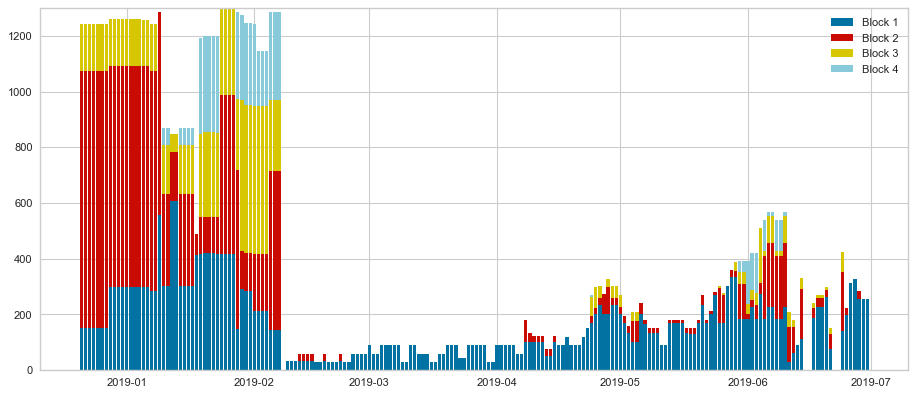

Hourly comparison: prediction vs. actual values
RMSE :13.04
MAE :7.3
R^2 :69.19
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.16666666666666666


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


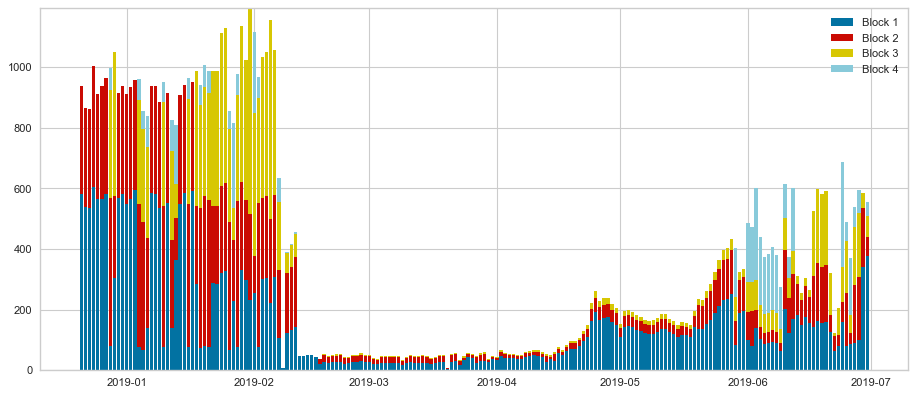

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


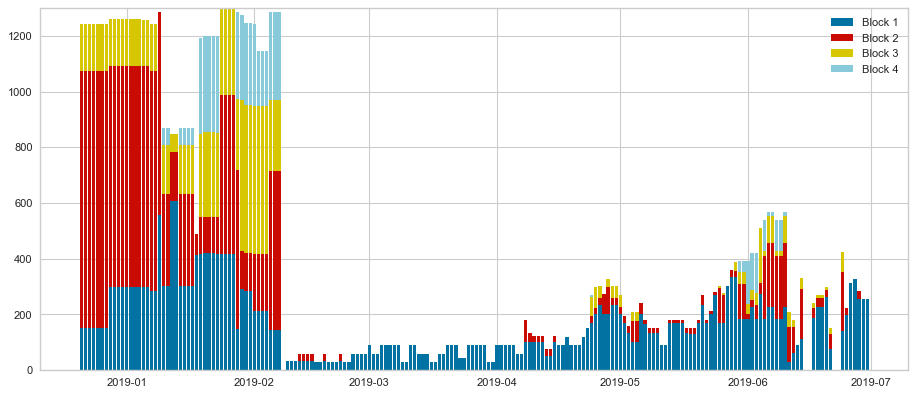

Hourly comparison: prediction vs. actual values
RMSE :12.45
MAE :7.12
R^2 :72.09
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Power-Nohours with 47 clusters **
Nb of clusters 46
Nb of centers 46, list:[923, 1105, 20, 164, 114, 246, 219, 328, 1596, 71, 203, 492, 820, 574, 615, 881, 697, 1204, 779, 678, 290, 902, 1550, 984, 1378, 1303, 1107, 794, 342, 1230, 690, 1649, 1367, 98, 1446, 1289, 769, 94, 440, 1640, 1283, 1722, 668, 1804, 81, 265]
Number of centers: 46
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.23958333333333334


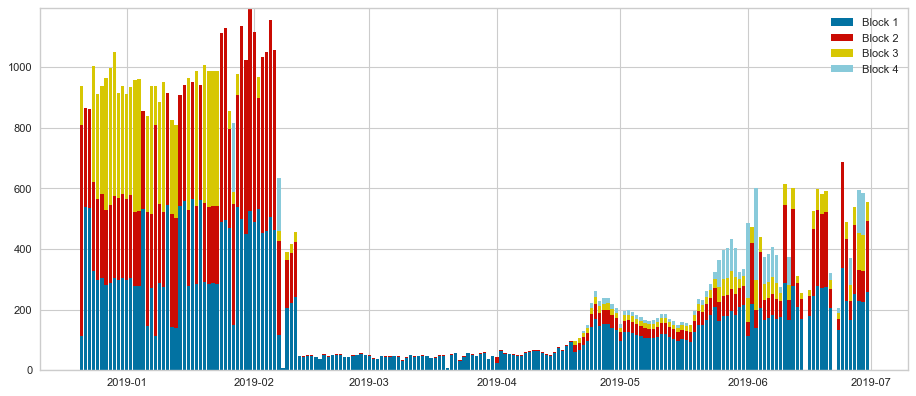

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


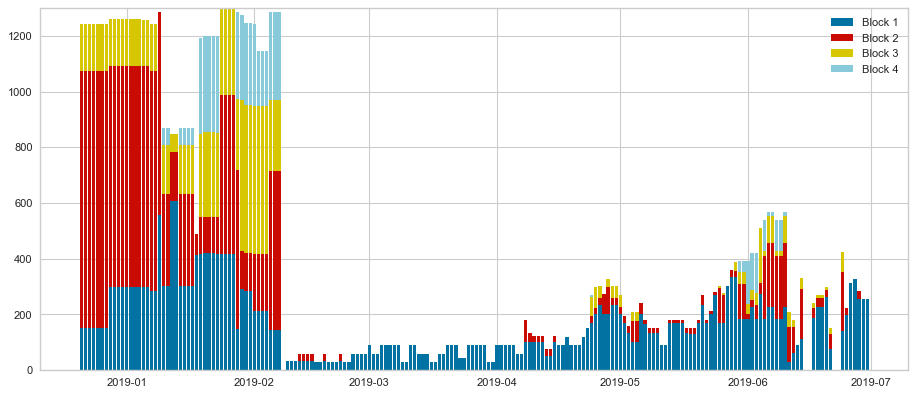

Hourly comparison: prediction vs. actual values
RMSE :12.11
MAE :6.74
R^2 :72.05
Daily comparison (max prod): prediction vs. actual values
RMSE :177.35
MAE :118.72
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.13541666666666666


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


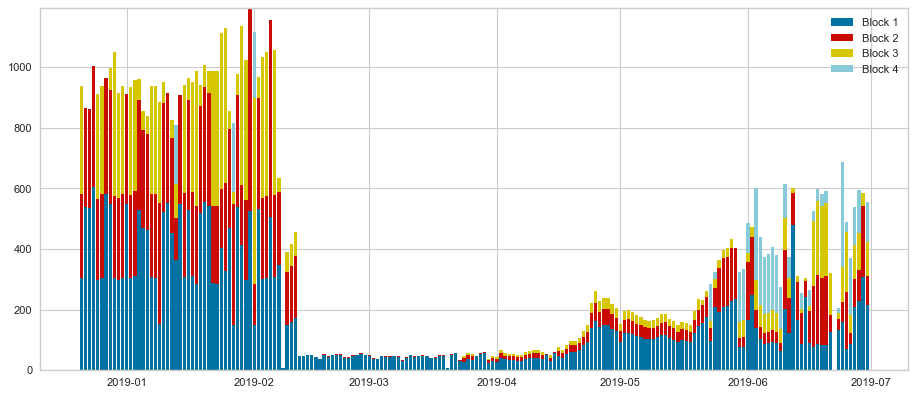

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


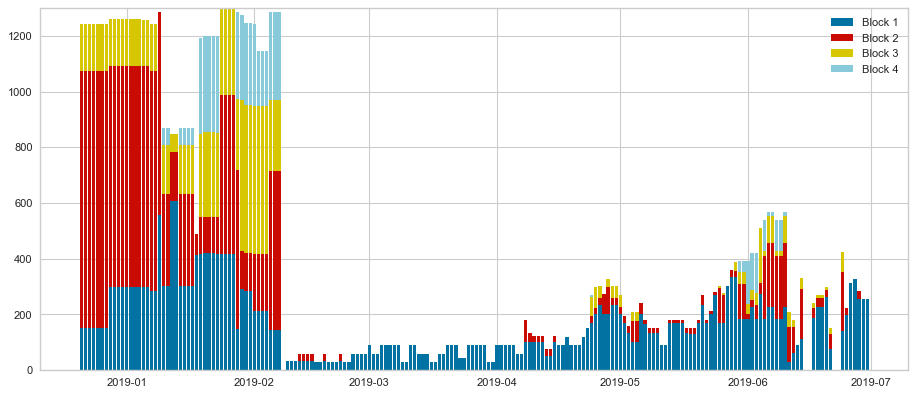

Hourly comparison: prediction vs. actual values
RMSE :12.54
MAE :7.19
R^2 :71.18
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Power-Nohours with 48 clusters **
Nb of clusters 47
Nb of centers 47, list:[203, 1859, 120, 539, 290, 240, 629, 320, 1156, 1649, 440, 1410, 520, 560, 615, 293, 531, 1252, 760, 742, 1722, 265, 804, 960, 1000, 181, 1080, 1590, 686, 94, 839, 202, 1306, 1367, 1400, 98, 1571, 1521, 1550, 1446, 134, 1504, 1714, 1765, 81, 1107, 1880]
Number of centers: 47
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.24479166666666666


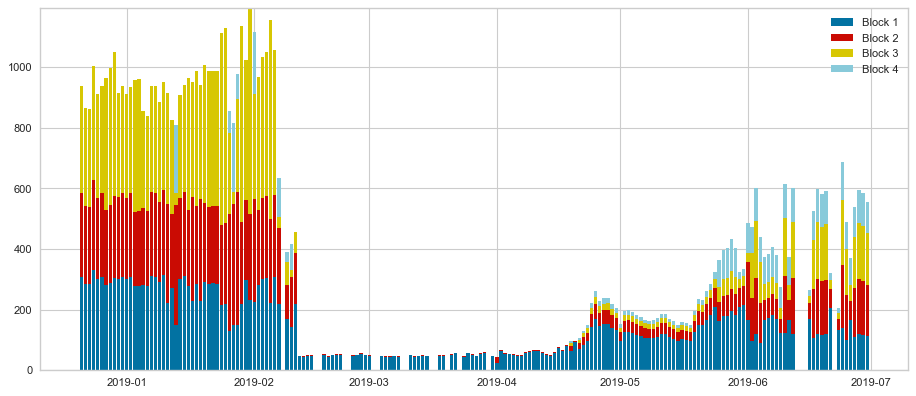

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


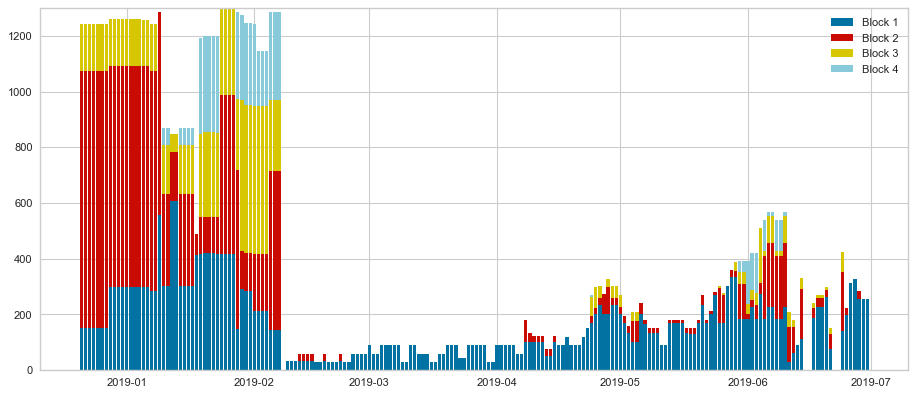

Hourly comparison: prediction vs. actual values
RMSE :12.84
MAE :6.99
R^2 :70.48
Daily comparison (max prod): prediction vs. actual values
RMSE :178.51
MAE :120.83
R^2 :85.07
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.125


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


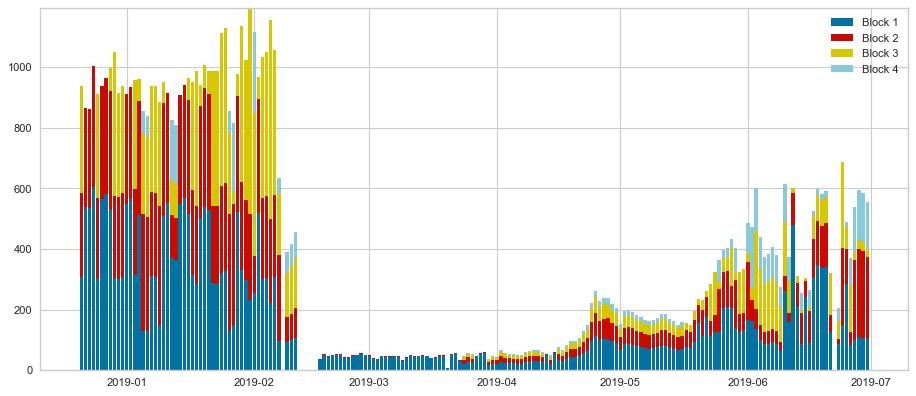

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


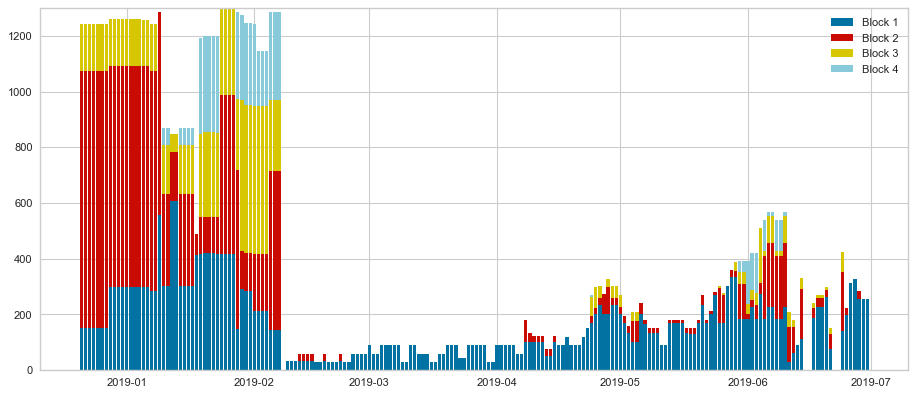

Hourly comparison: prediction vs. actual values
RMSE :12.95
MAE :7.36
R^2 :69.78
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :121.35
R^2 :85.01
************************************
** clustering Power-Nohours with 49 clusters **
Nb of clusters 48
Nb of centers 48, list:[39, 1514, 117, 1639, 195, 234, 273, 290, 351, 390, 1187, 13, 923, 443, 881, 783, 531, 293, 1283, 1252, 1504, 858, 897, 724, 975, 1014, 315, 1092, 1131, 1170, 1209, 489, 1571, 1665, 1354, 98, 1435, 755, 1521, 1254, 1817, 1638, 1677, 668, 1490, 1794, 1512, 1430]
Number of centers: 48
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.203125


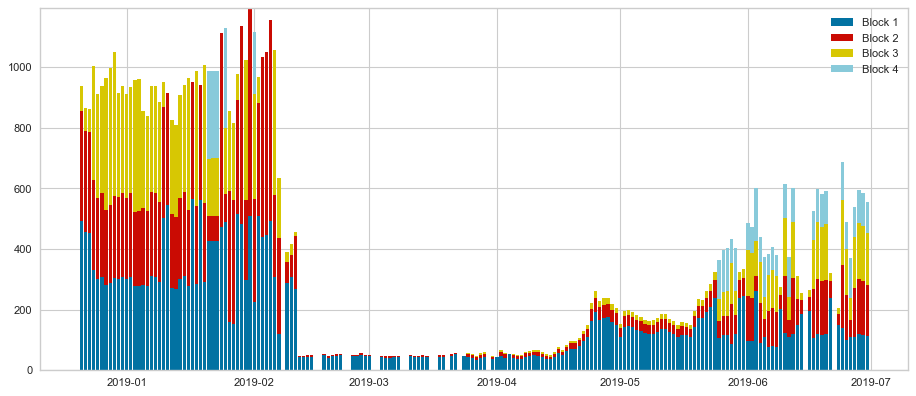

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


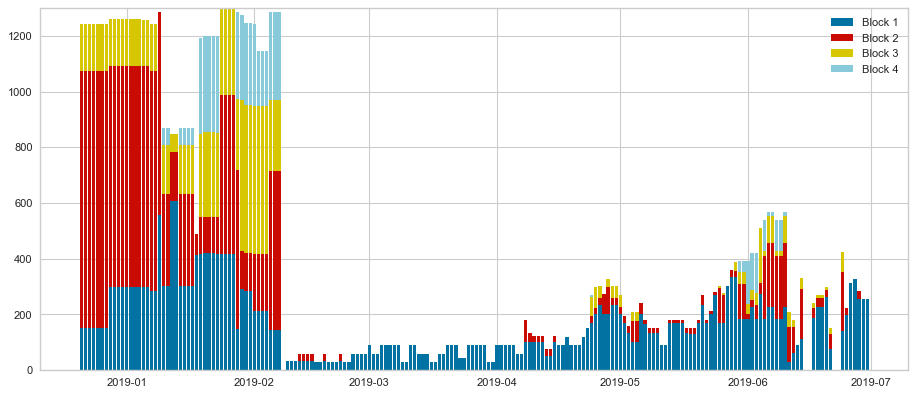

Hourly comparison: prediction vs. actual values
RMSE :13.05
MAE :7.29
R^2 :68.17
Daily comparison (max prod): prediction vs. actual values
RMSE :177.59
MAE :120.19
R^2 :85.22
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.07291666666666667


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


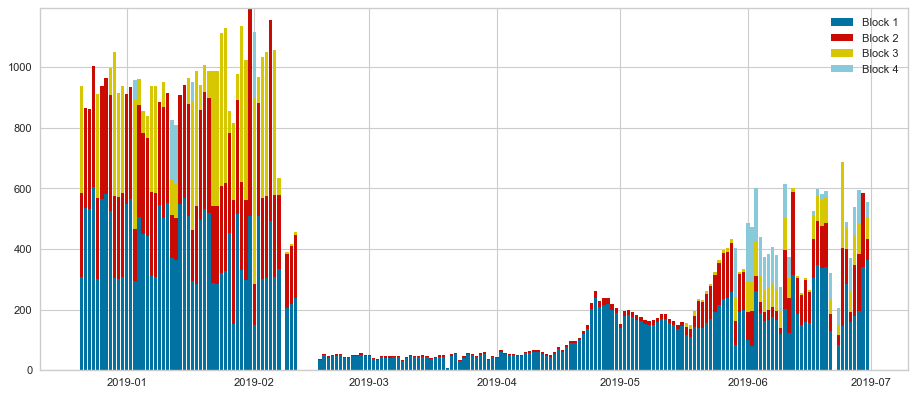

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


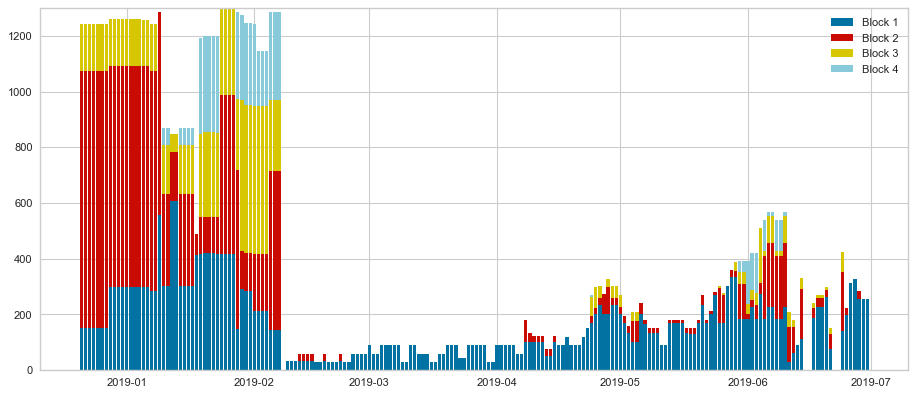

Hourly comparison: prediction vs. actual values
RMSE :13.67
MAE :7.63
R^2 :67.7
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :121.35
R^2 :85.01
************************************
** clustering Power-Nohours with 50 clusters **
Nb of clusters 49
Nb of centers 49, list:[38, 1127, 114, 153, 190, 443, 13, 497, 342, 290, 1146, 1187, 494, 1687, 570, 602, 55, 657, 20, 760, 794, 1532, 1084, 912, 950, 265, 703, 1072, 1568, 1515, 1178, 1204, 1550, 1292, 1367, 1755, 1406, 1446, 917, 1322, 1558, 1817, 1634, 1673, 1722, 388, 1786, 1824, 1107]
Number of centers: 49
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.203125


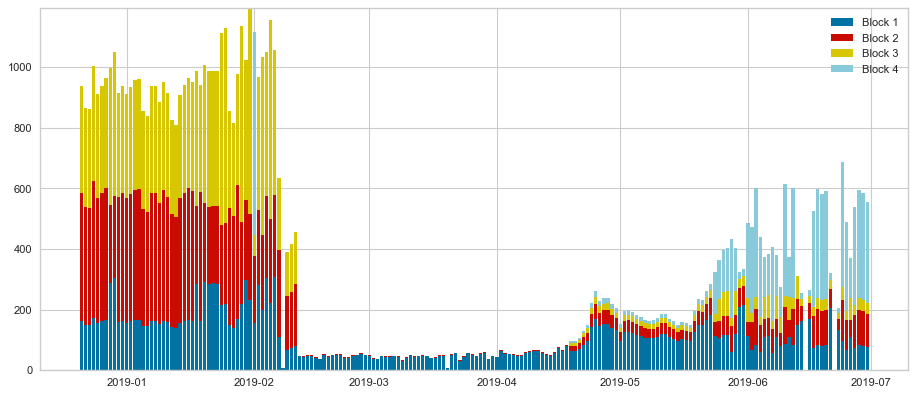

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


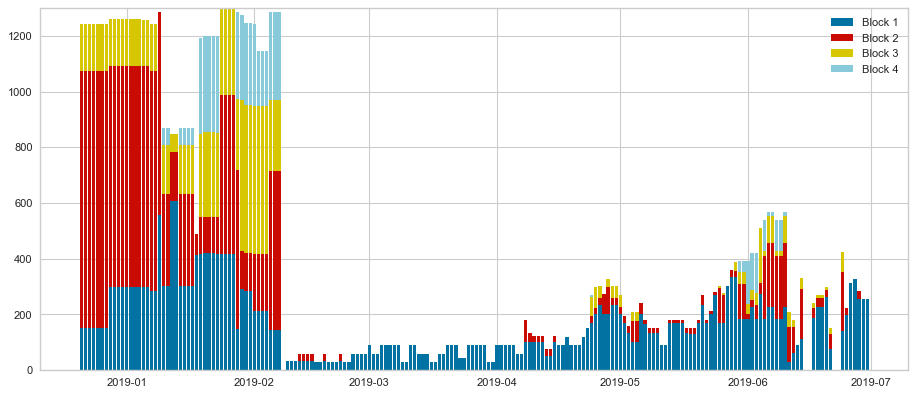

Hourly comparison: prediction vs. actual values
RMSE :12.54
MAE :7.09
R^2 :71.01
Daily comparison (max prod): prediction vs. actual values
RMSE :177.35
MAE :118.72
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.11458333333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


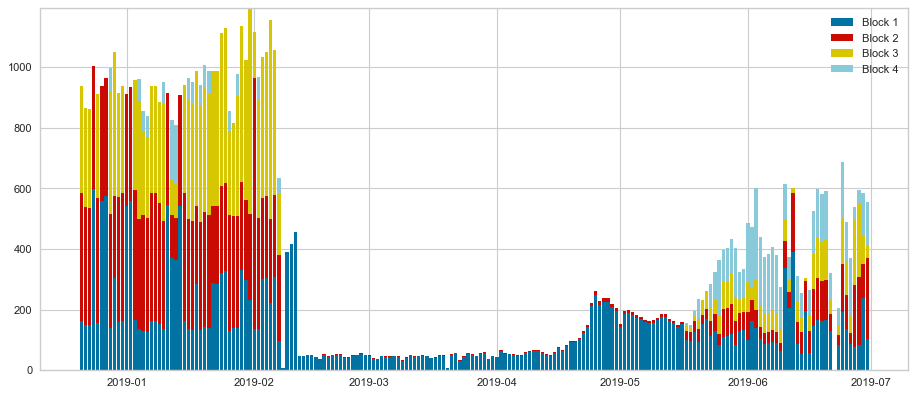

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


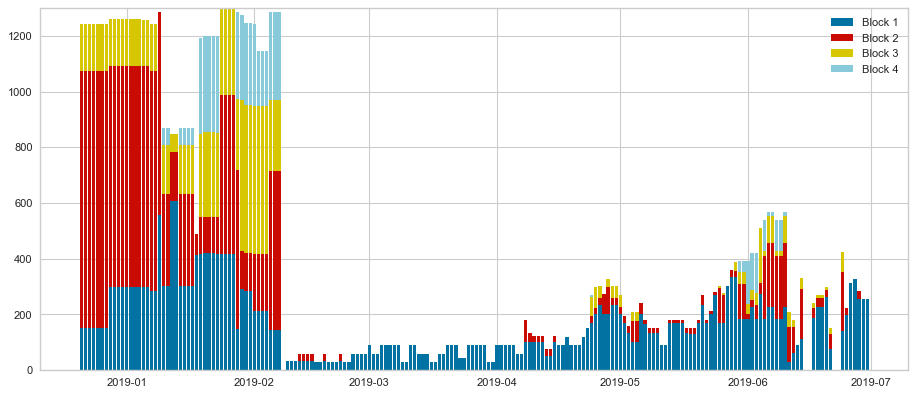

Hourly comparison: prediction vs. actual values
RMSE :14.14
MAE :7.82
R^2 :67.09
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Power-Nohours with 51 clusters **
Nb of clusters 50
Nb of centers 50, list:[38, 1127, 114, 153, 190, 443, 13, 497, 342, 384, 1146, 1187, 846, 1687, 570, 602, 55, 657, 20, 760, 794, 1532, 1084, 912, 950, 265, 703, 1072, 1568, 1515, 1178, 1204, 1550, 1292, 1367, 1755, 1406, 1446, 917, 1322, 1558, 1817, 1634, 1673, 1722, 388, 1786, 1824, 1107, 203]
Number of centers: 50
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.19791666666666666


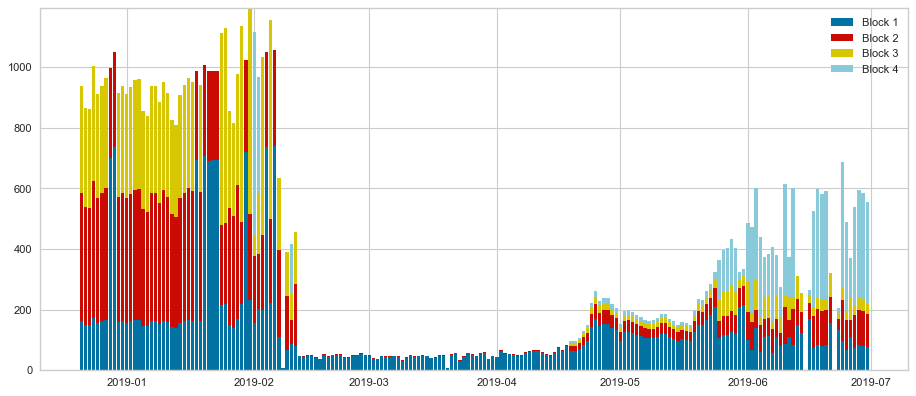

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


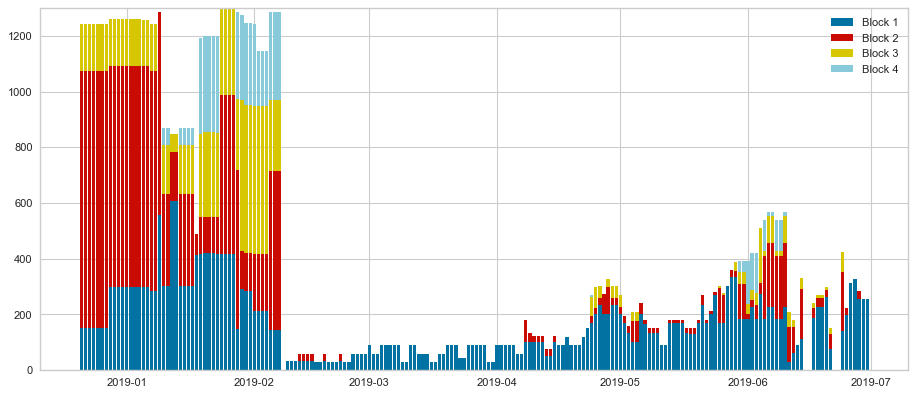

Hourly comparison: prediction vs. actual values
RMSE :12.62
MAE :7.16
R^2 :70.71
Daily comparison (max prod): prediction vs. actual values
RMSE :177.35
MAE :118.72
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.11458333333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


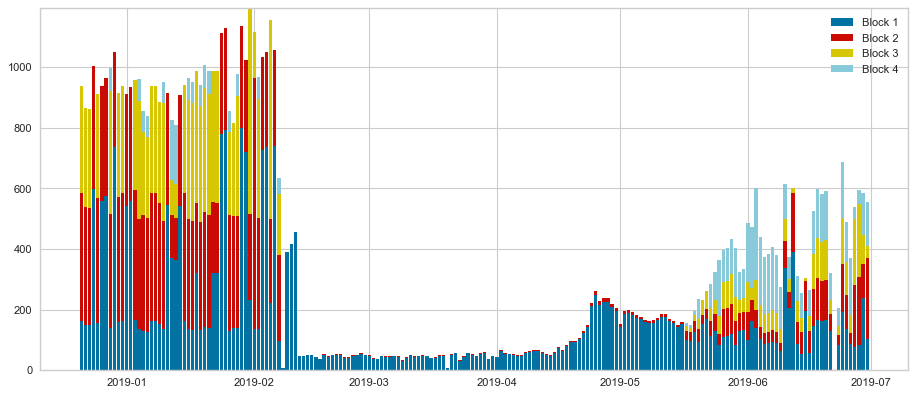

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


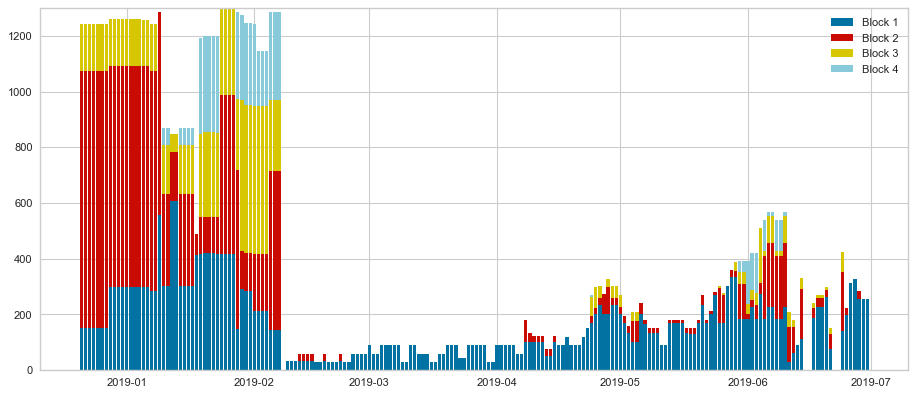

Hourly comparison: prediction vs. actual values
RMSE :14.15
MAE :7.86
R^2 :67.03
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Power-Nohours with 52 clusters **
Nb of clusters 51
Nb of centers 51, list:[114, 74, 440, 148, 185, 286, 230, 161, 1208, 1548, 388, 196, 480, 1817, 555, 668, 629, 710, 692, 265, 777, 315, 290, 888, 925, 962, 999, 1755, 1042, 1610, 1149, 1184, 531, 1258, 602, 1332, 1369, 539, 1443, 1283, 769, 1551, 98, 101, 557, 650, 1722, 1776, 1813, 1530, 1673]
Number of centers: 51
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.08333333333333333


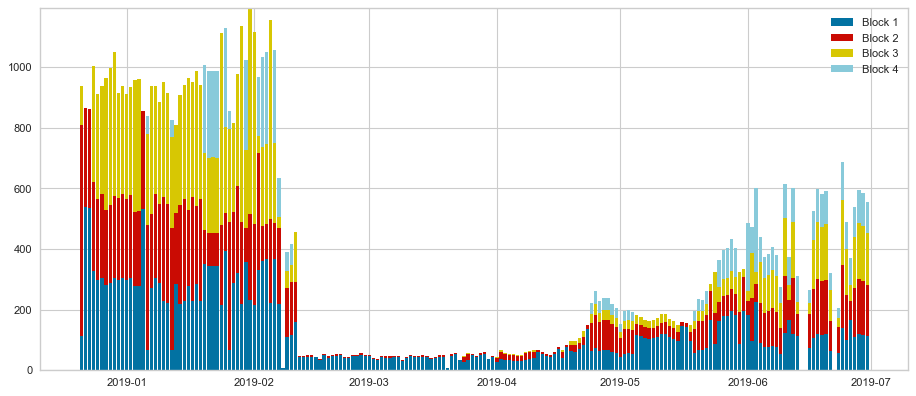

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


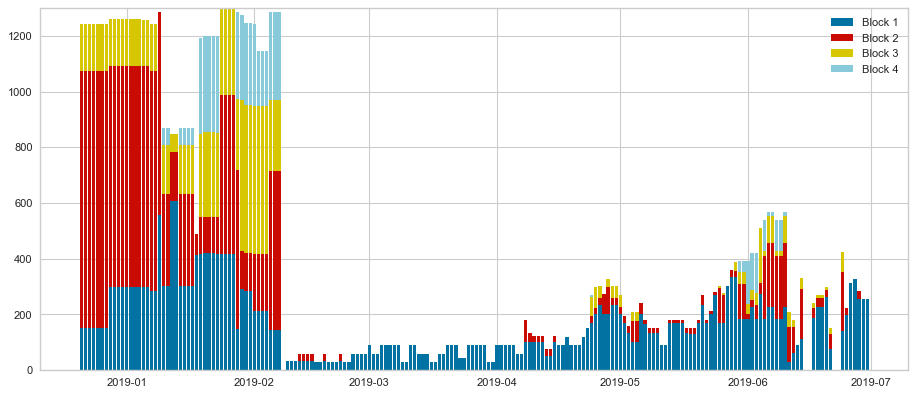

Hourly comparison: prediction vs. actual values
RMSE :12.2
MAE :6.83
R^2 :70.63
Daily comparison (max prod): prediction vs. actual values
RMSE :178.87
MAE :120.05
R^2 :85.01
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.0625


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


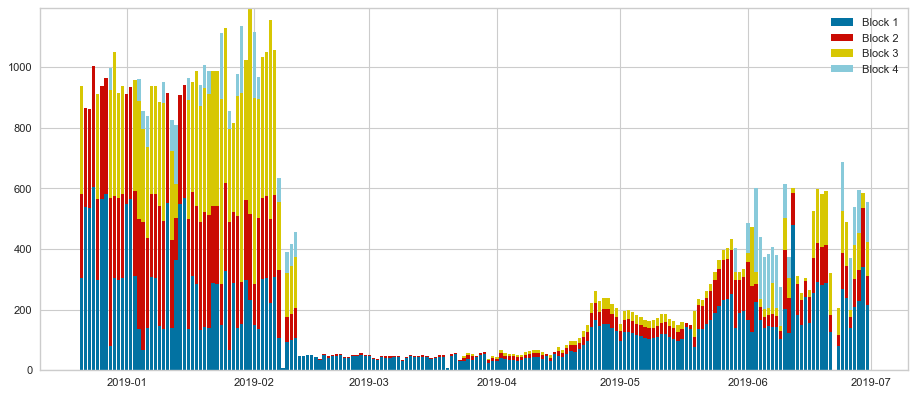

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


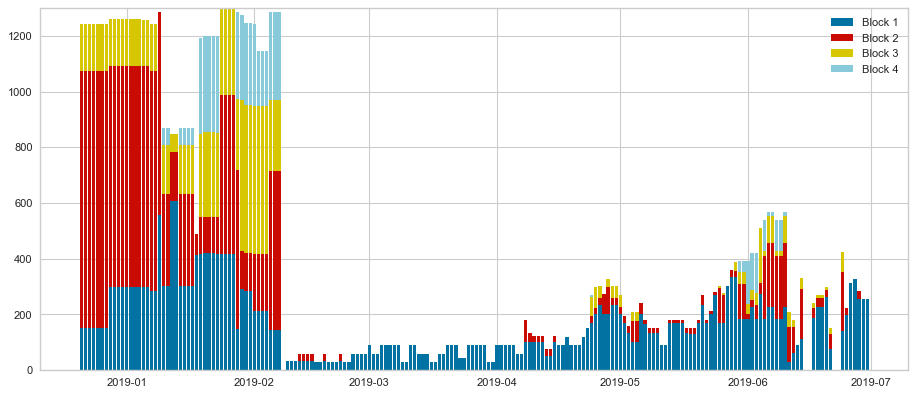

Hourly comparison: prediction vs. actual values
RMSE :12.42
MAE :7.08
R^2 :72.11
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Power-Nohours with 53 clusters **
Nb of clusters 52
Nb of centers 52, list:[114, 72, 101, 144, 230, 216, 974, 512, 324, 1156, 1884, 1859, 265, 923, 20, 576, 602, 307, 657, 1146, 756, 1283, 29, 864, 13, 1649, 388, 881, 1044, 1080, 1446, 794, 1188, 1224, 1260, 1322, 1332, 1362, 98, 1440, 1568, 1551, 66, 1105, 440, 1656, 1692, 1728, 668, 81, 508, 469]
Number of centers: 52
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.11979166666666667


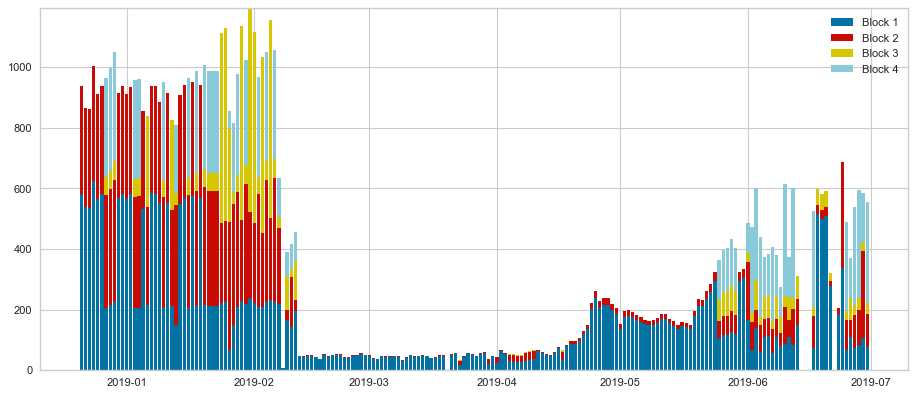

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


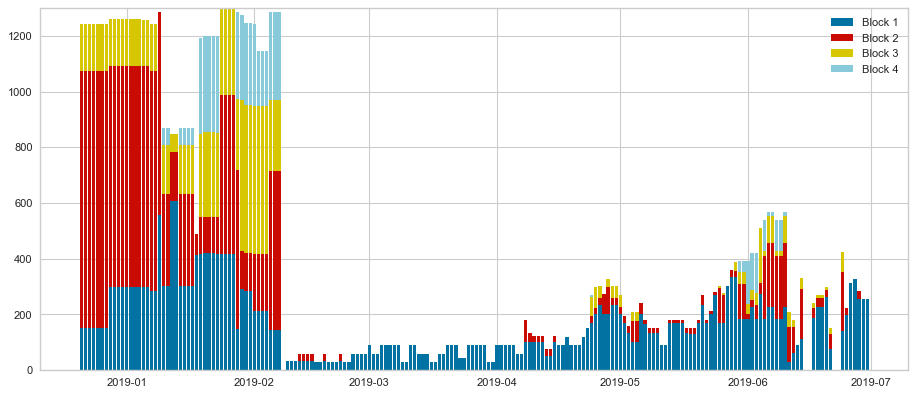

Hourly comparison: prediction vs. actual values
RMSE :12.61
MAE :7.23
R^2 :70.74
Daily comparison (max prod): prediction vs. actual values
RMSE :177.86
MAE :118.7
R^2 :85.18
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.125


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


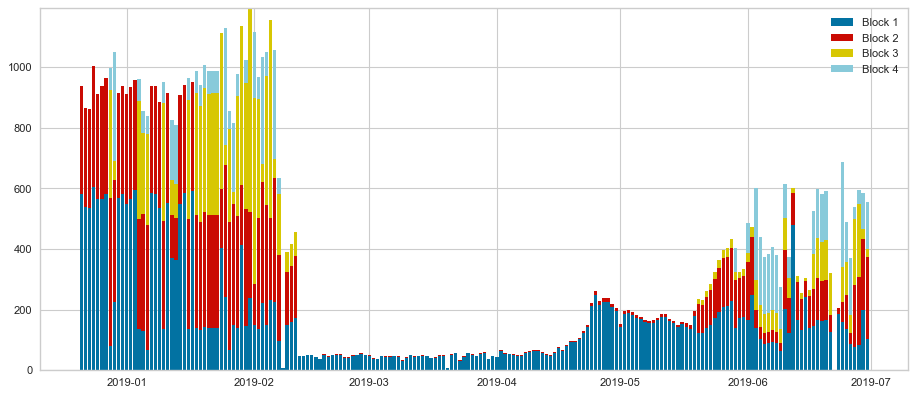

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


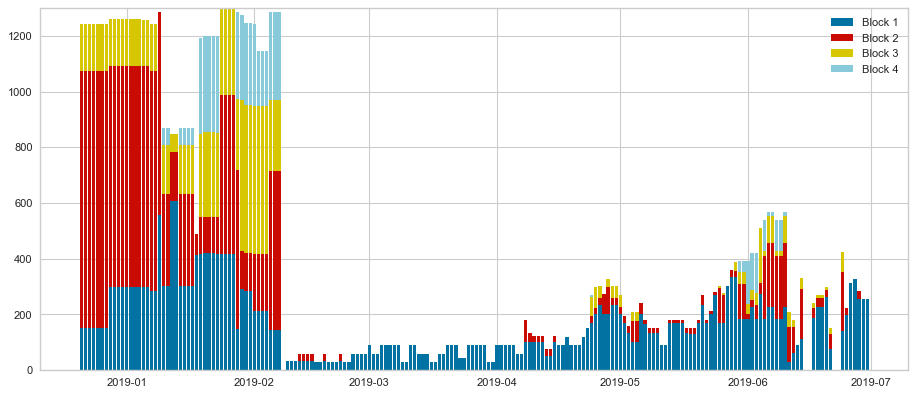

Hourly comparison: prediction vs. actual values
RMSE :13.78
MAE :7.58
R^2 :67.4
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Power-Nohours with 54 clusters **
Nb of clusters 53
Nb of centers 53, list:[114, 72, 101, 144, 230, 216, 974, 512, 324, 1156, 1884, 1859, 265, 923, 20, 576, 602, 307, 657, 1146, 756, 1283, 29, 864, 13, 1649, 388, 881, 1044, 1080, 1446, 794, 1188, 1224, 1260, 1322, 1332, 1362, 1404, 1440, 1568, 1551, 66, 1105, 440, 1656, 1692, 1728, 668, 81, 508, 469, 1908]
Number of centers: 53
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.11979166666666667


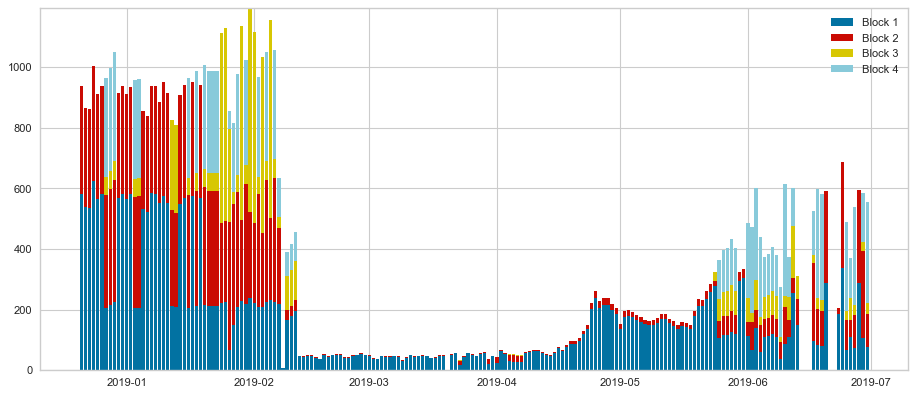

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


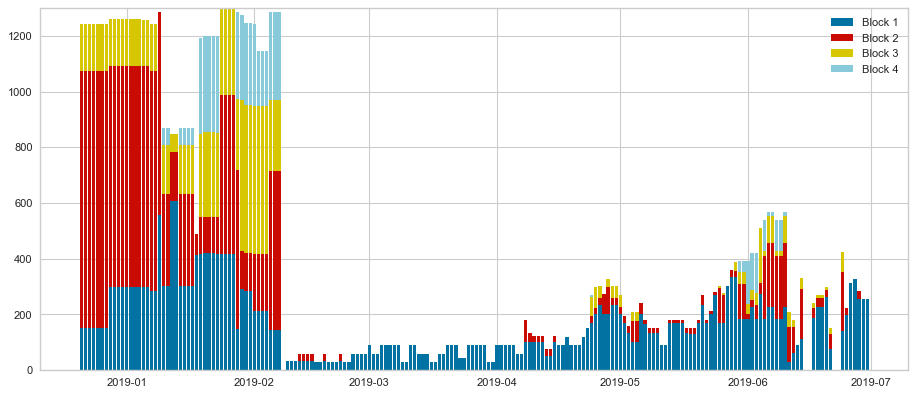

Hourly comparison: prediction vs. actual values
RMSE :12.5
MAE :7.11
R^2 :71.01
Daily comparison (max prod): prediction vs. actual values
RMSE :177.76
MAE :118.59
R^2 :85.2
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.125


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


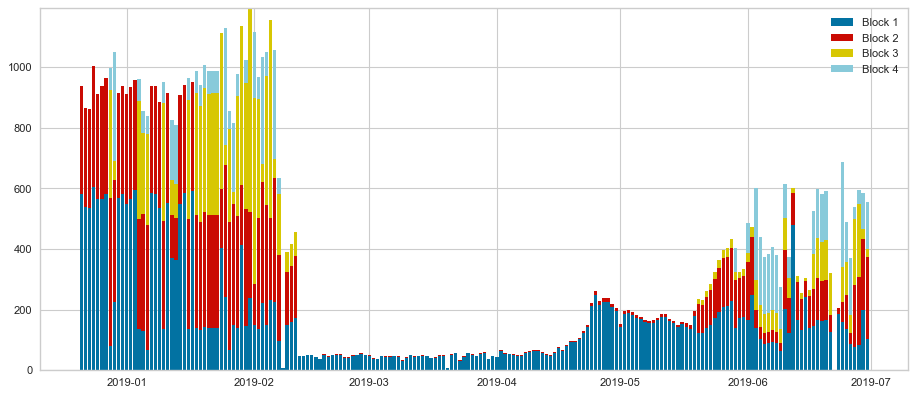

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


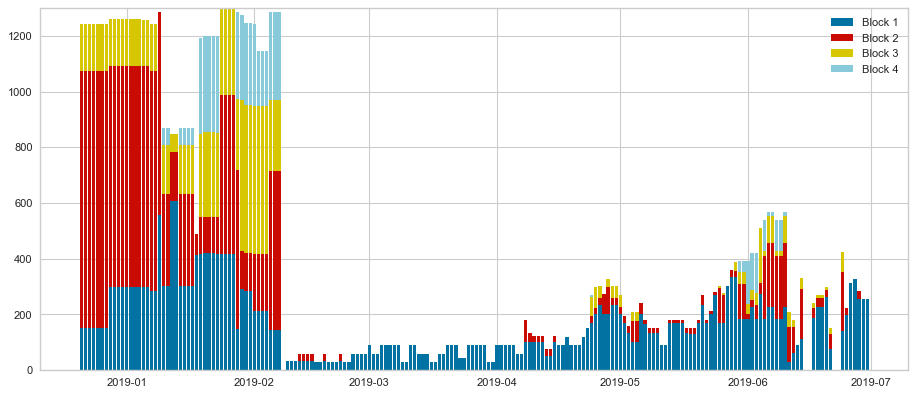

Hourly comparison: prediction vs. actual values
RMSE :13.78
MAE :7.58
R^2 :67.4
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Power-Nohours with 55 clusters **
Nb of clusters 54
Nb of centers 54, list:[114, 70, 1137, 140, 175, 210, 245, 280, 315, 350, 307, 420, 455, 846, 539, 560, 473, 630, 668, 293, 735, 770, 1283, 602, 335, 910, 945, 980, 1015, 1152, 1085, 1410, 1521, 1512, 531, 1260, 667, 1330, 1365, 1400, 1446, 1571, 1505, 1540, 1590, 1610, 1273, 265, 1322, 1750, 1785, 1817, 226, 217]
Number of centers: 54
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.11979166666666667


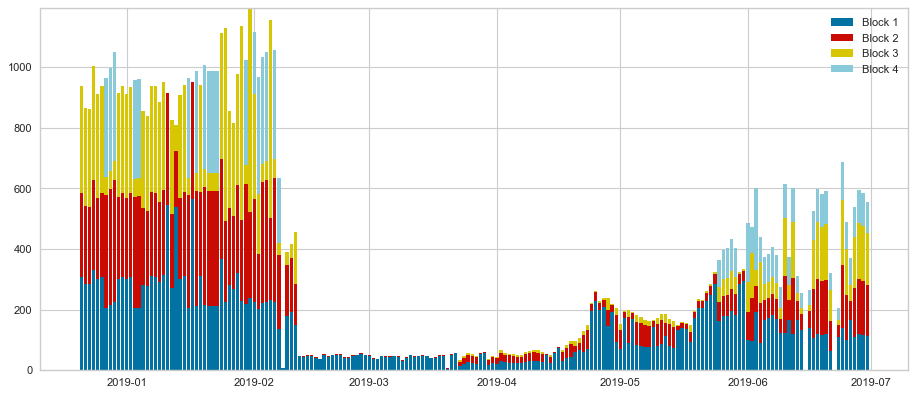

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


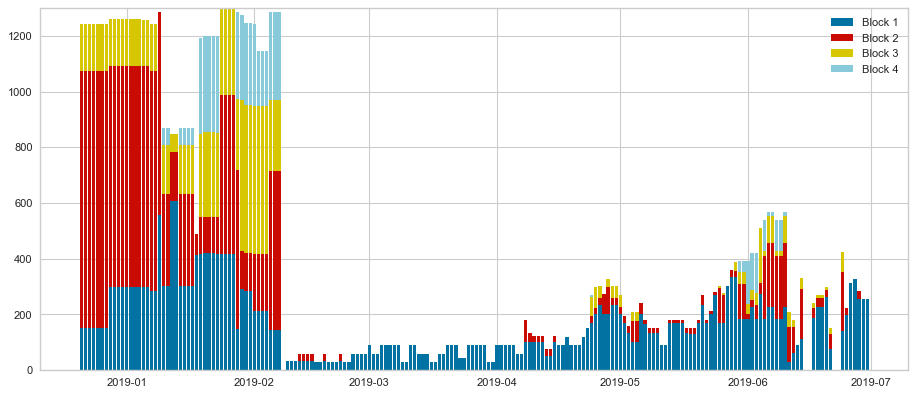

Hourly comparison: prediction vs. actual values
RMSE :12.92
MAE :7.58
R^2 :69.43
Daily comparison (max prod): prediction vs. actual values
RMSE :177.35
MAE :118.72
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.11458333333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


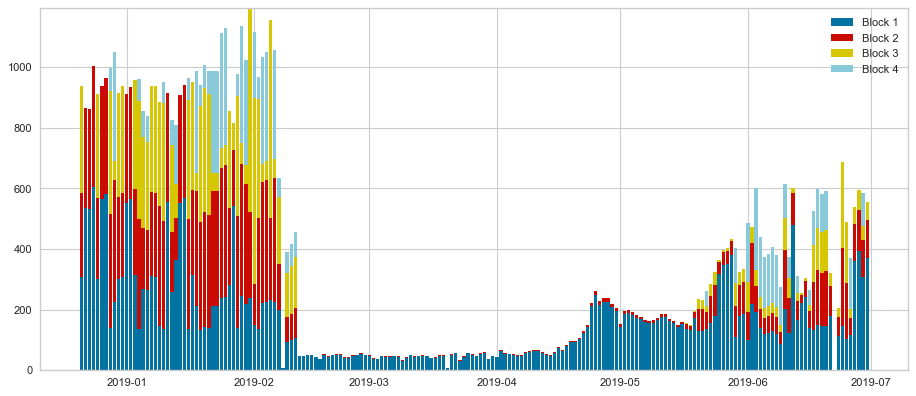

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


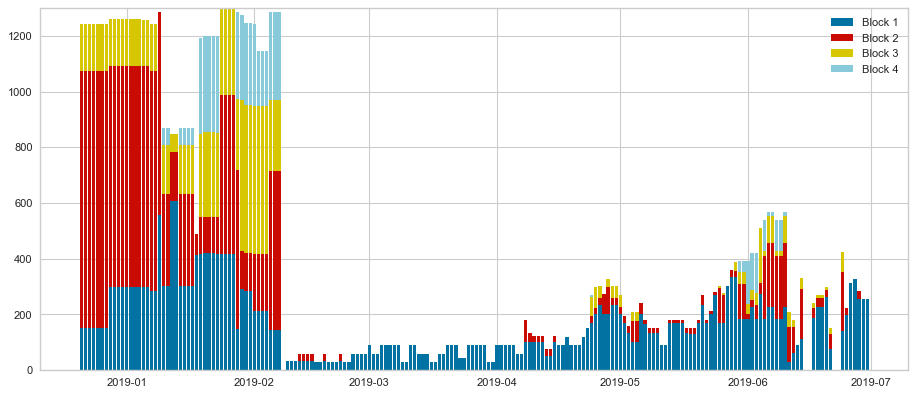

Hourly comparison: prediction vs. actual values
RMSE :14.48
MAE :7.94
R^2 :66.12
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Power-Nohours with 56 clusters **
Nb of clusters 55
Nb of centers 55, list:[114, 68, 102, 136, 489, 203, 238, 272, 497, 340, 307, 388, 442, 476, 1084, 20, 578, 602, 55, 657, 1070, 690, 796, 1204, 850, 884, 1283, 952, 986, 974, 1755, 342, 465, 1156, 1551, 1224, 1258, 1571, 1326, 1367, 1397, 440, 1446, 1532, 1530, 97, 480, 1632, 1336, 668, 1722, 1673, 1817, 1836, 1870]
Number of centers: 55
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.15104166666666666


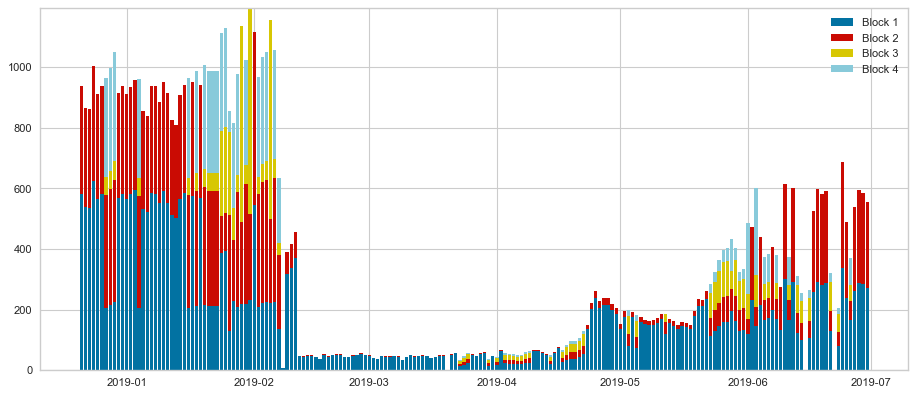

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


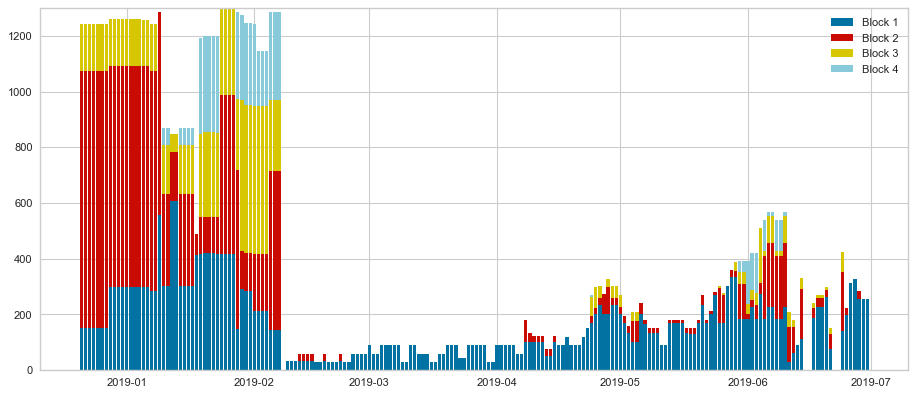

Hourly comparison: prediction vs. actual values
RMSE :13.04
MAE :7.11
R^2 :69.46
Daily comparison (max prod): prediction vs. actual values
RMSE :177.37
MAE :118.76
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.10416666666666667


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


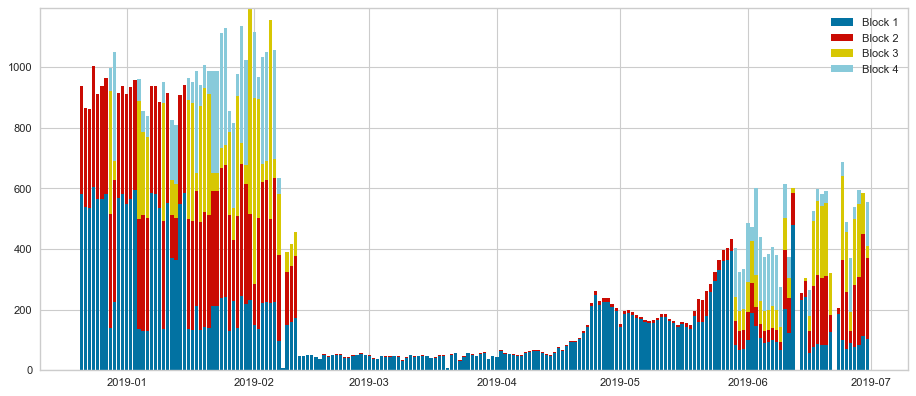

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


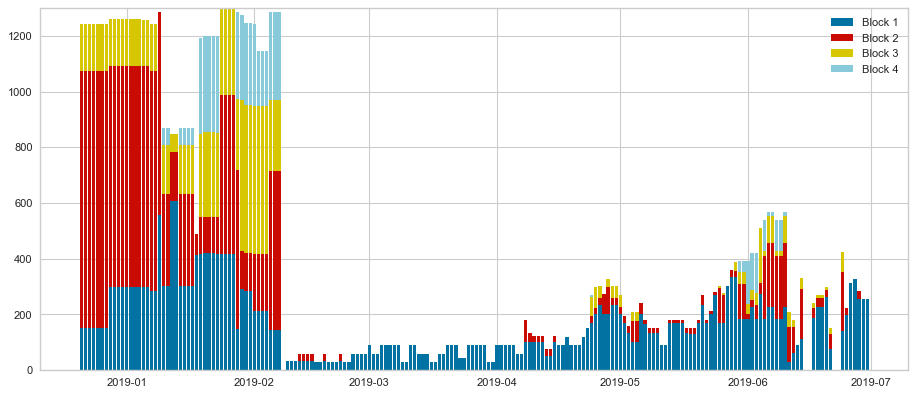

Hourly comparison: prediction vs. actual values
RMSE :14.46
MAE :7.93
R^2 :65.61
Daily comparison (max prod): prediction vs. actual values
RMSE :178.1
MAE :119.61
R^2 :85.14
************************************
** clustering Power-Nohours with 57 clusters **
Nb of clusters 56
Nb of centers 56, list:[114, 68, 102, 136, 489, 203, 238, 272, 497, 340, 307, 388, 442, 476, 1084, 20, 578, 602, 55, 657, 1070, 690, 796, 1204, 850, 884, 1283, 952, 986, 974, 1755, 342, 465, 1156, 1551, 1224, 1258, 1571, 1326, 1367, 1397, 440, 1446, 1532, 1530, 1555, 480, 1632, 1336, 668, 1722, 1673, 1817, 1836, 1870, 1859]
Number of centers: 56
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.14583333333333334


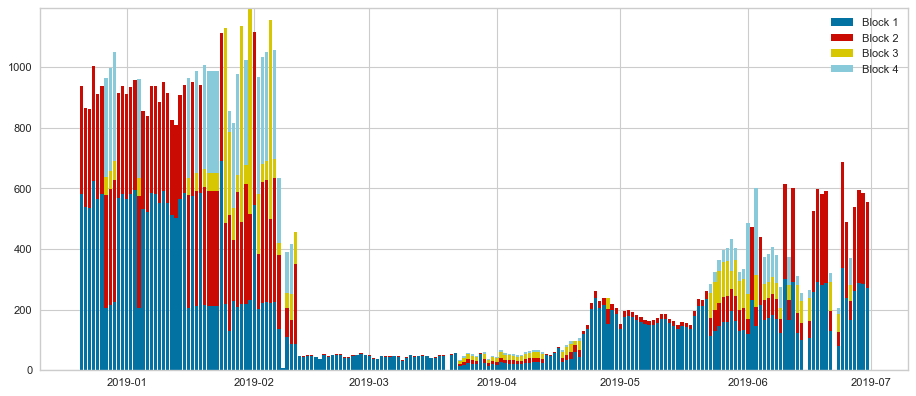

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


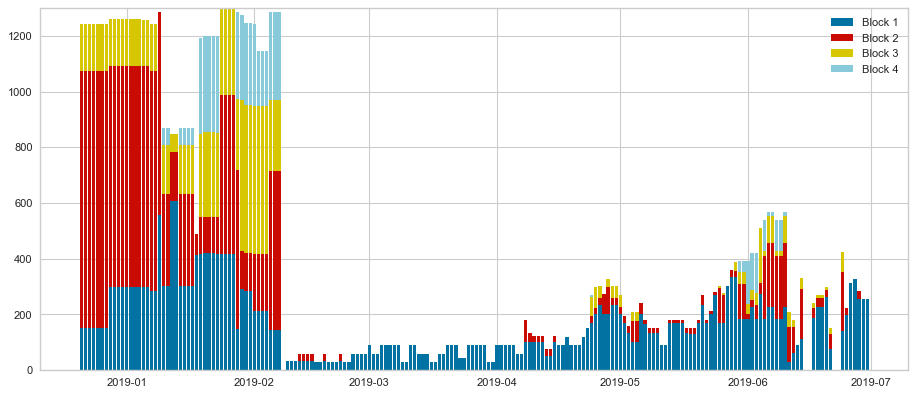

Hourly comparison: prediction vs. actual values
RMSE :12.64
MAE :7.32
R^2 :70.71
Daily comparison (max prod): prediction vs. actual values
RMSE :177.37
MAE :118.76
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.10416666666666667


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


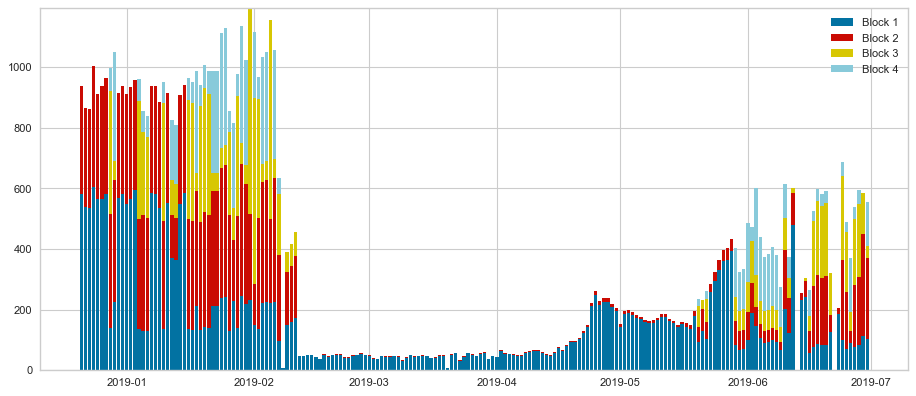

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


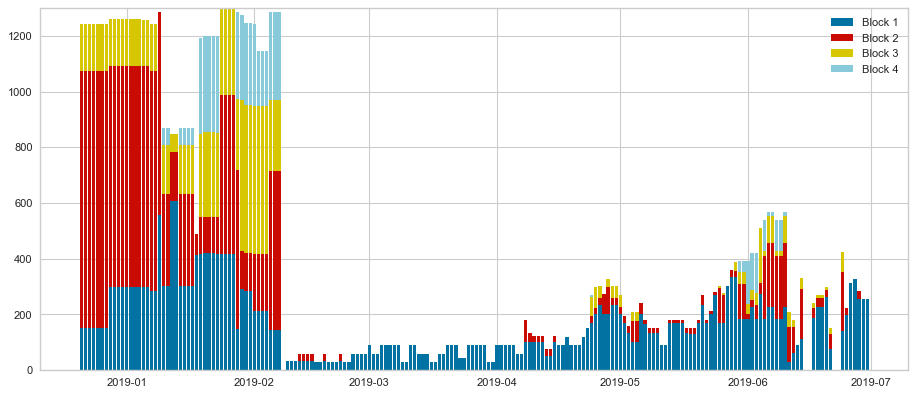

Hourly comparison: prediction vs. actual values
RMSE :14.46
MAE :7.94
R^2 :65.55
Daily comparison (max prod): prediction vs. actual values
RMSE :178.1
MAE :119.61
R^2 :85.14
************************************
** clustering Power-Nohours with 58 clusters **
Nb of clusters 57
Nb of centers 57, list:[203, 66, 99, 265, 161, 198, 134, 230, 1686, 330, 1156, 412, 445, 114, 290, 20, 561, 1628, 1722, 660, 974, 55, 759, 794, 825, 858, 891, 924, 957, 990, 1378, 315, 342, 1127, 813, 1188, 1221, 422, 1568, 1042, 1367, 557, 1419, 1435, 1673, 690, 1551, 517, 1548, 1204, 1283, 668, 388, 1782, 1817, 1858, 1514]
Number of centers: 57
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.046875


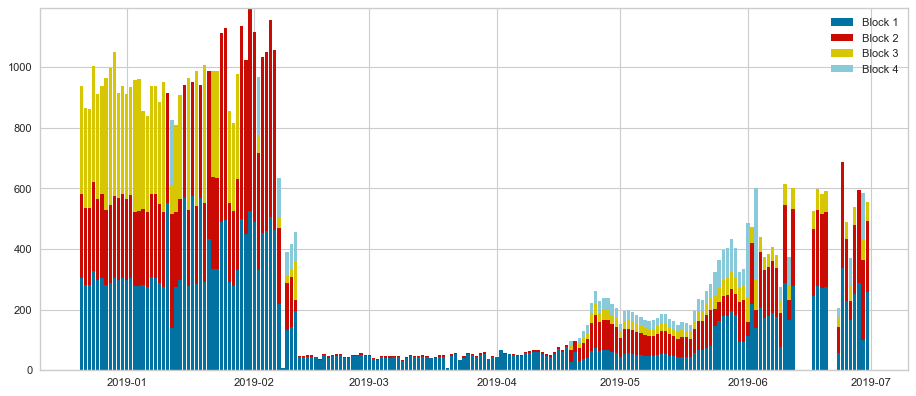

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


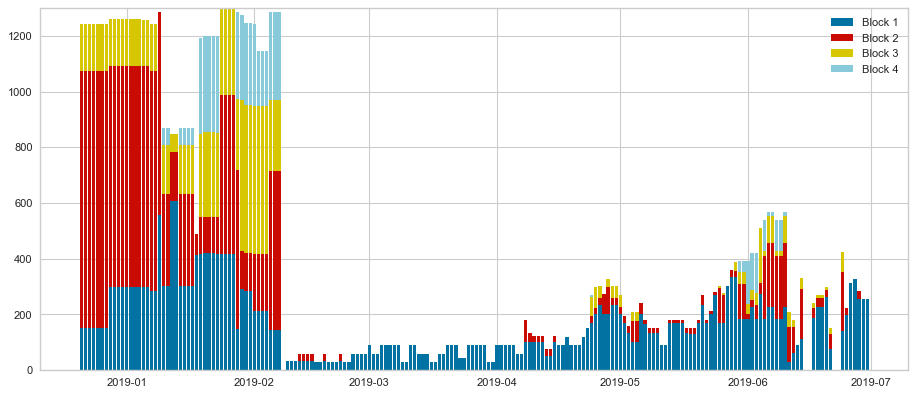

Hourly comparison: prediction vs. actual values
RMSE :12.14
MAE :6.84
R^2 :71.88
Daily comparison (max prod): prediction vs. actual values
RMSE :177.14
MAE :117.87
R^2 :85.3
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.041666666666666664


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


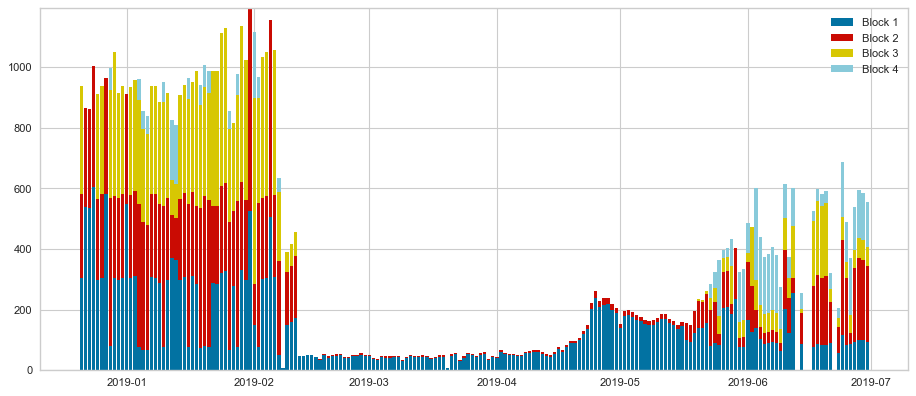

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


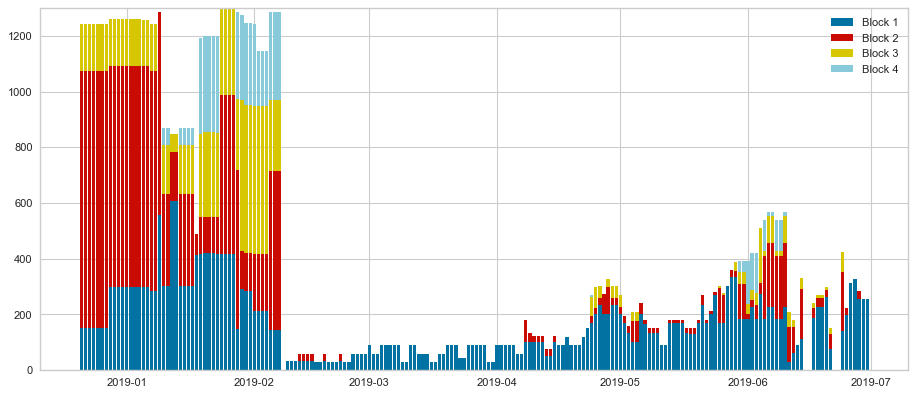

Hourly comparison: prediction vs. actual values
RMSE :13.82
MAE :7.67
R^2 :67.72
Daily comparison (max prod): prediction vs. actual values
RMSE :175.71
MAE :116.66
R^2 :85.54
************************************
** clustering Power-Nohours with 59 clusters **
Nb of clusters 58
Nb of centers 58, list:[203, 1512, 1137, 265, 160, 114, 224, 153, 472, 320, 352, 384, 1884, 690, 1596, 1057, 544, 576, 839, 640, 710, 974, 55, 335, 742, 1042, 864, 896, 928, 960, 992, 1029, 1056, 1088, 1817, 1152, 815, 1204, 489, 1280, 1312, 1344, 1376, 1408, 98, 1472, 1504, 792, 1571, 1435, 1632, 1656, 531, 1728, 668, 1792, 1824, 74]
Number of centers: 58
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.06770833333333333


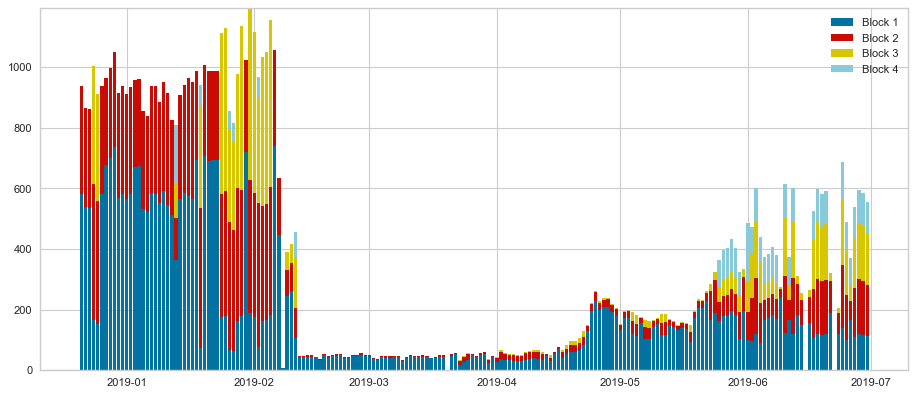

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


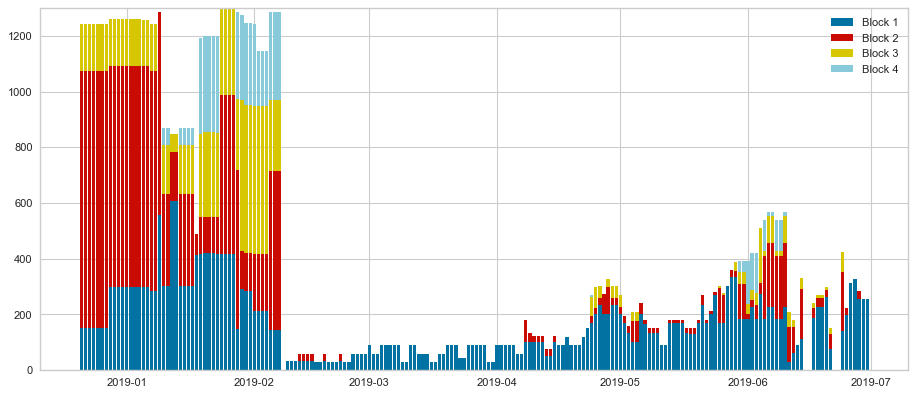

Hourly comparison: prediction vs. actual values
RMSE :12.85
MAE :7.25
R^2 :69.14
Daily comparison (max prod): prediction vs. actual values
RMSE :177.37
MAE :118.76
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.046875


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


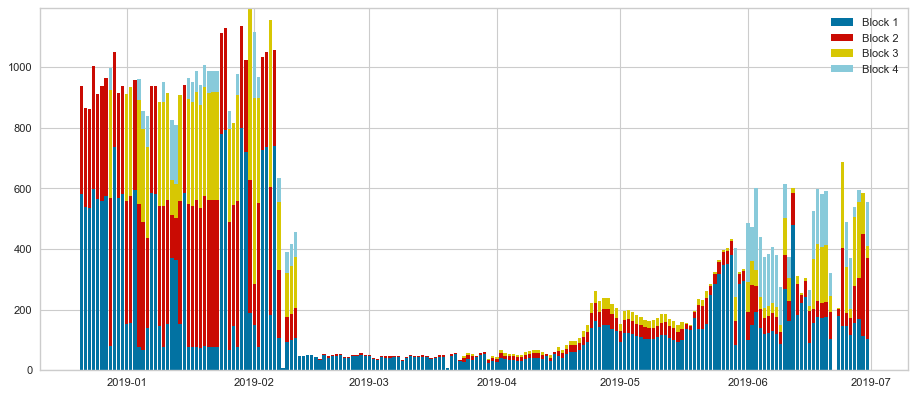

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


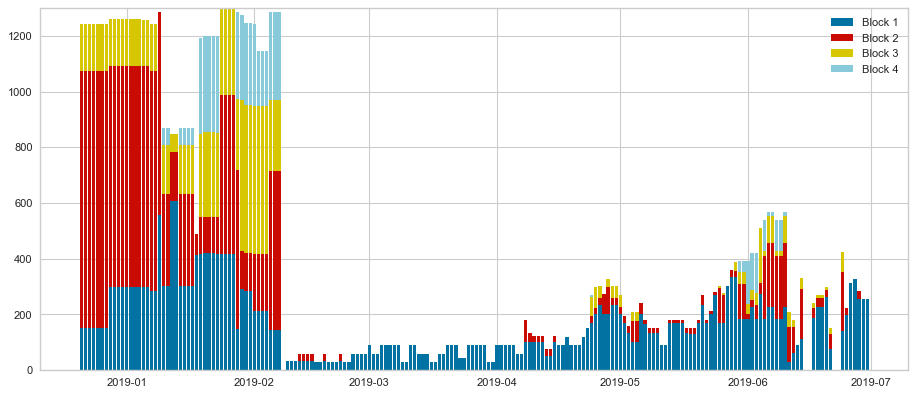

Hourly comparison: prediction vs. actual values
RMSE :12.99
MAE :7.47
R^2 :70.25
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Vector with 5 clusters **
Nb of clusters 4
Nb of centers 4, list:[259, 1190, 792, 780]
Number of centers: 4
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.6145833333333334


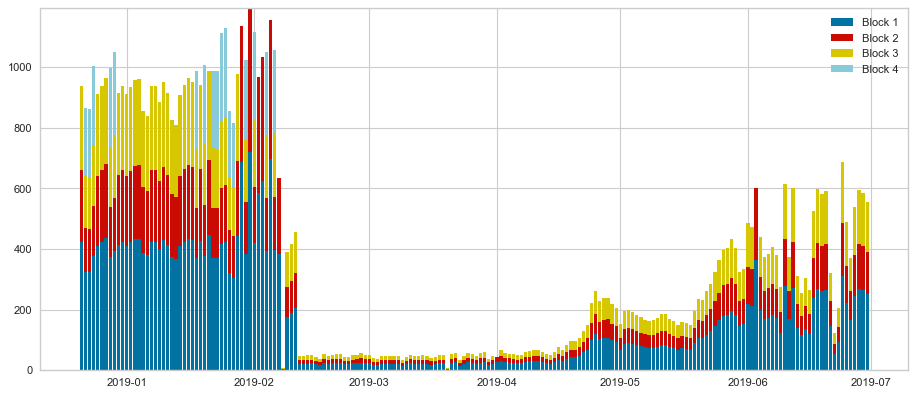

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


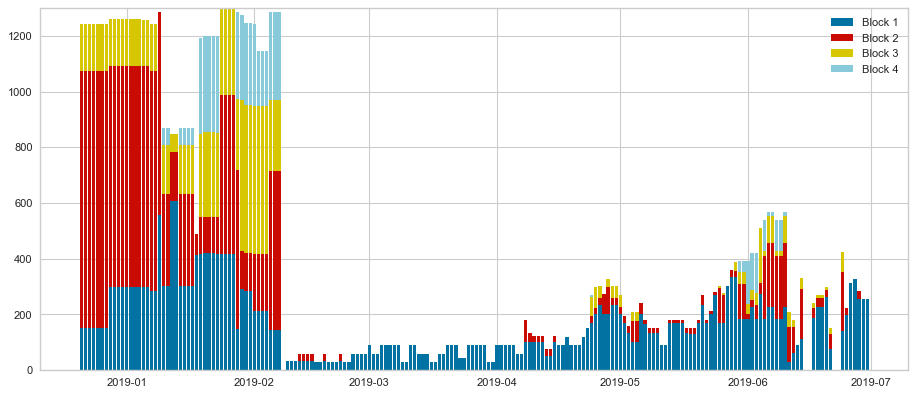

Hourly comparison: prediction vs. actual values
RMSE :18.81
MAE :11.0
R^2 :54.72
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.6979166666666666


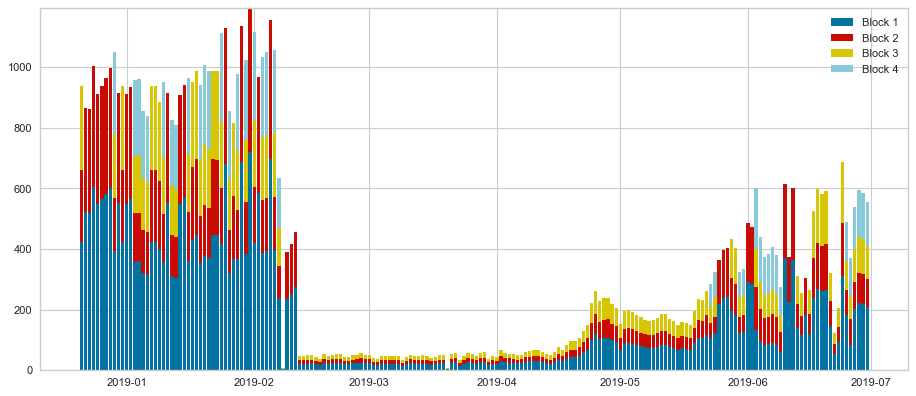

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


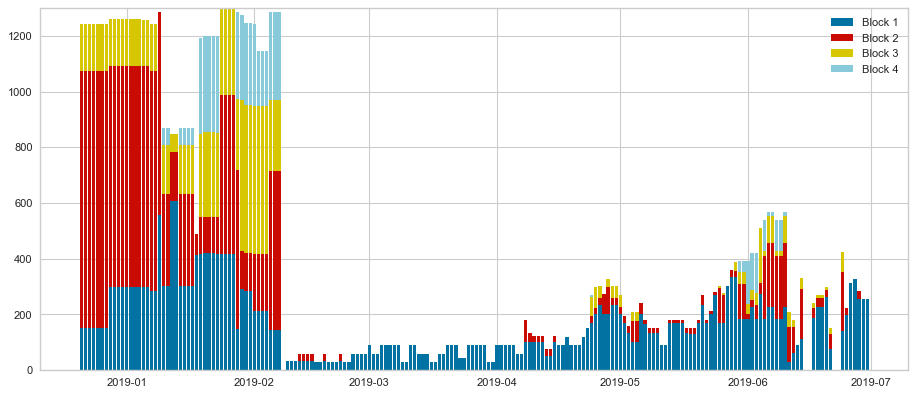

Hourly comparison: prediction vs. actual values
RMSE :15.52
MAE :9.51
R^2 :62.18
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 6 clusters **
Nb of clusters 5
Nb of centers 5, list:[512, 259, 504, 622, 1609]
Number of centers: 5
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.59375


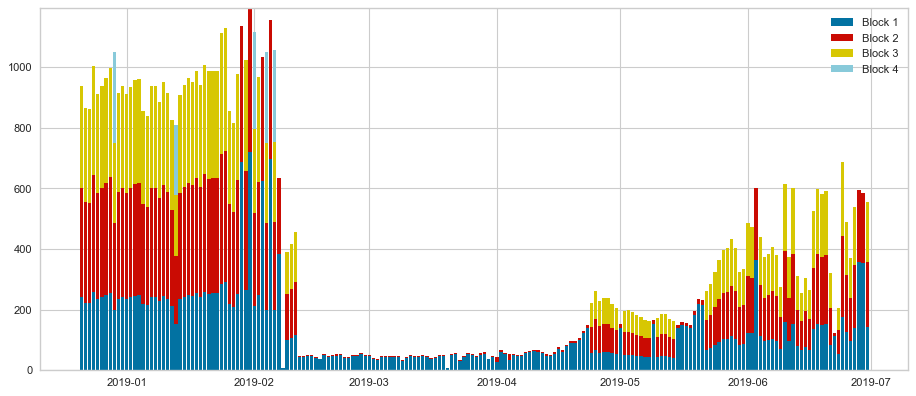

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


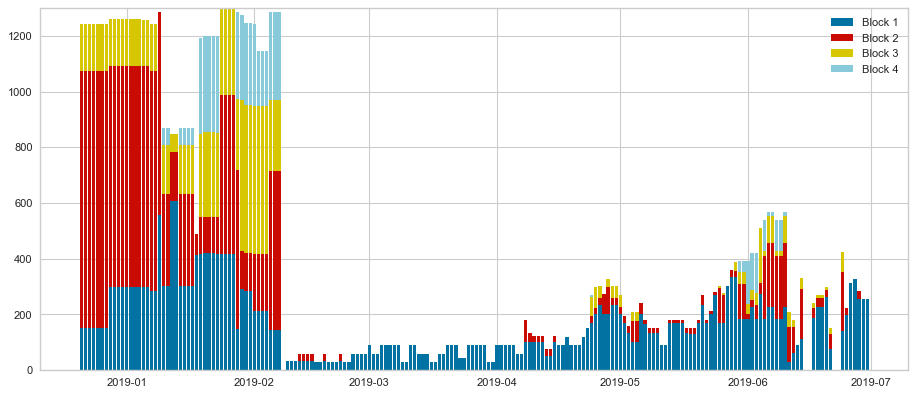

Hourly comparison: prediction vs. actual values
RMSE :13.6
MAE :8.48
R^2 :68.06
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.40625


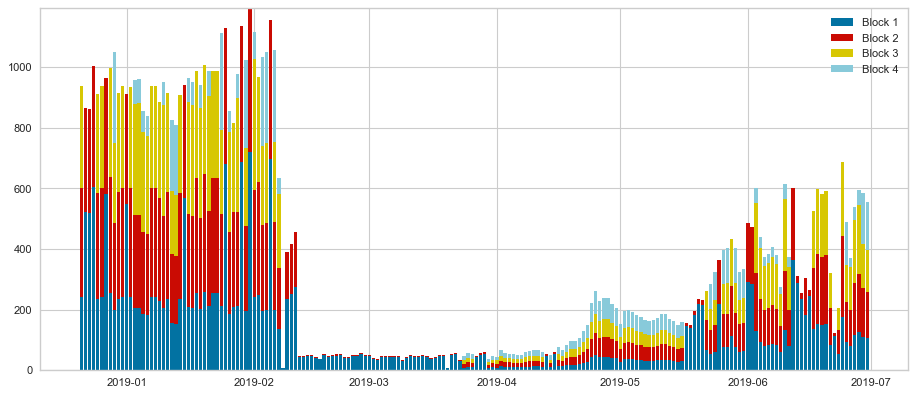

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


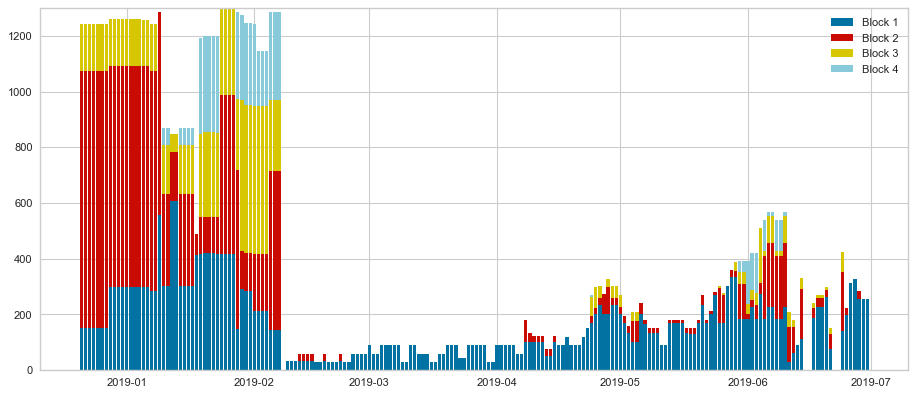

Hourly comparison: prediction vs. actual values
RMSE :13.54
MAE :8.52
R^2 :66.29
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 7 clusters **
Nb of clusters 6
Nb of centers 6, list:[504, 1362, 1609, 622, 512, 259]
Number of centers: 6
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.5729166666666666


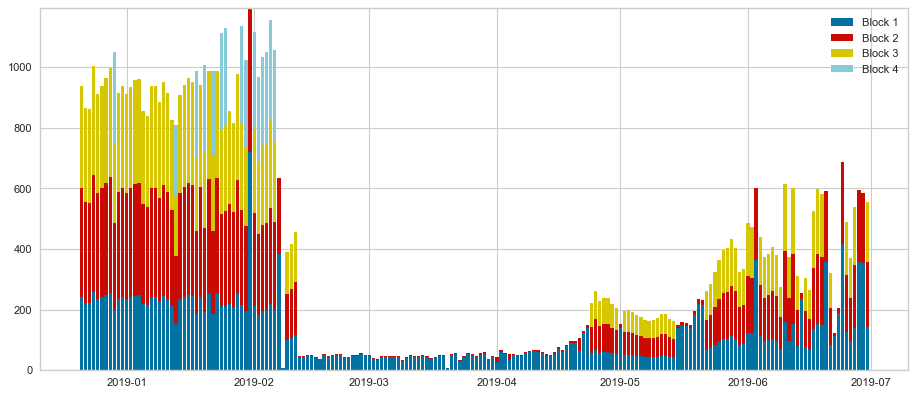

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


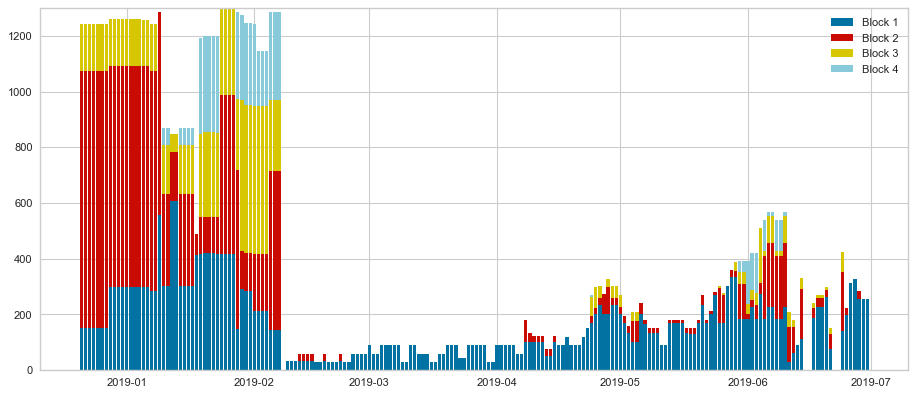

Hourly comparison: prediction vs. actual values
RMSE :13.99
MAE :8.67
R^2 :67.13
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.4114583333333333


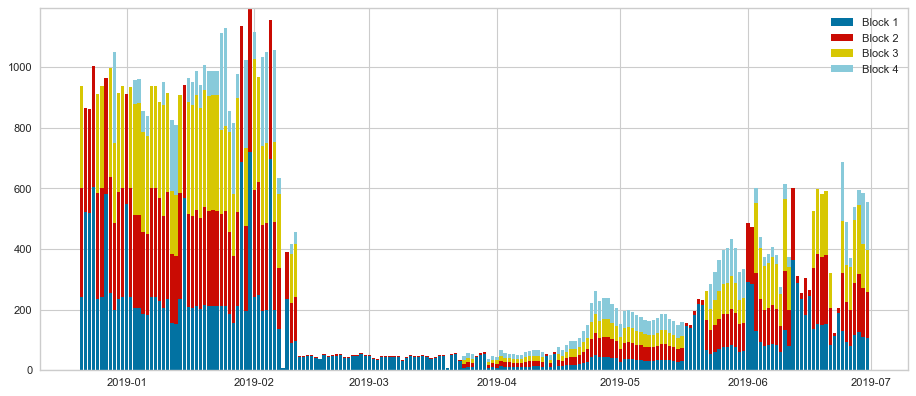

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


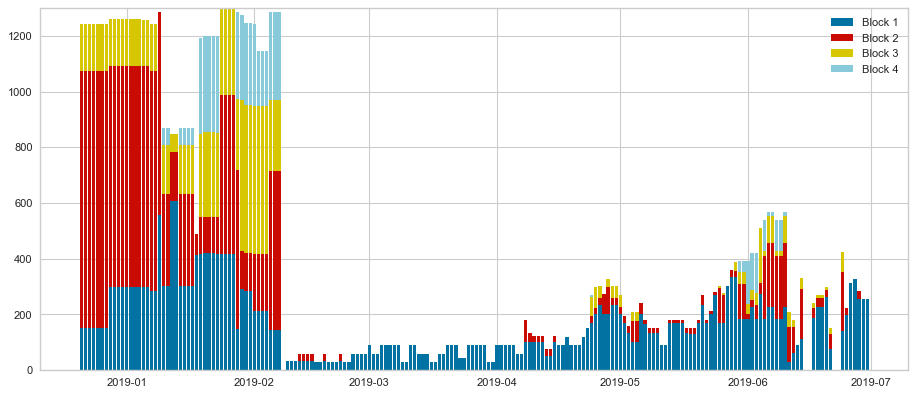

Hourly comparison: prediction vs. actual values
RMSE :13.51
MAE :8.46
R^2 :66.09
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 8 clusters **
Nb of clusters 7
Nb of centers 7, list:[250, 1109, 286, 960, 472, 1440, 622]
Number of centers: 7
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.4270833333333333


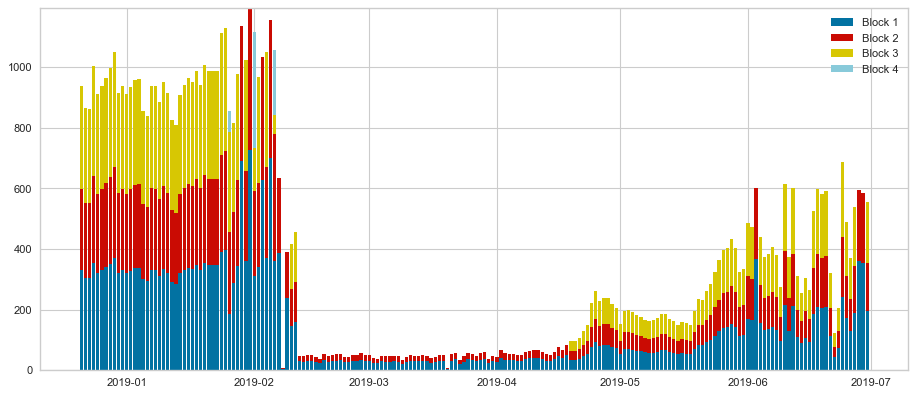

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


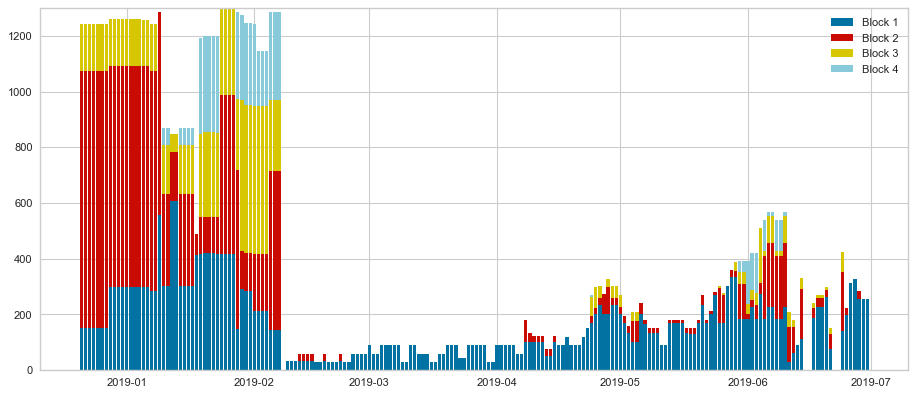

Hourly comparison: prediction vs. actual values
RMSE :13.9
MAE :9.34
R^2 :64.76
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.16145833333333334


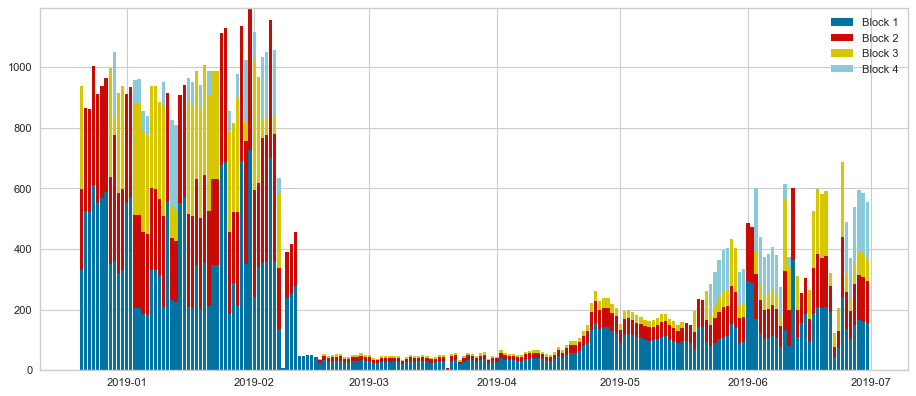

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


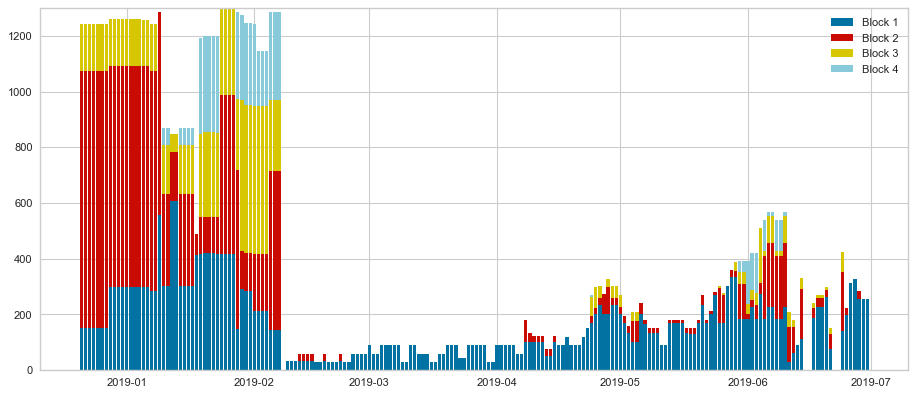

Hourly comparison: prediction vs. actual values
RMSE :13.03
MAE :7.95
R^2 :70.16
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 9 clusters **
Nb of clusters 8
Nb of centers 8, list:[114, 1609, 692, 1184, 230, 489, 1889, 622]
Number of centers: 8
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.6041666666666666


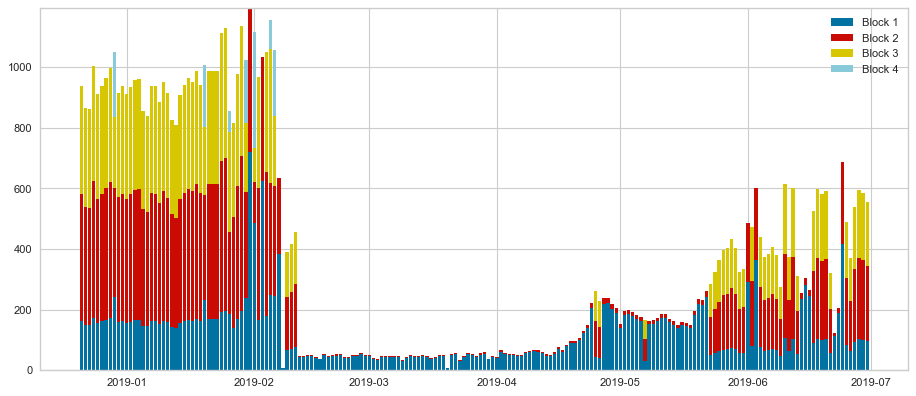

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


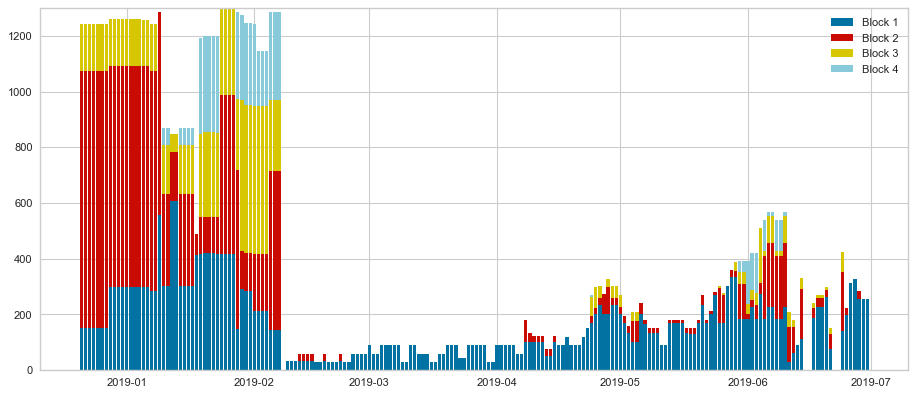

Hourly comparison: prediction vs. actual values
RMSE :13.87
MAE :8.18
R^2 :68.06
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.5364583333333334


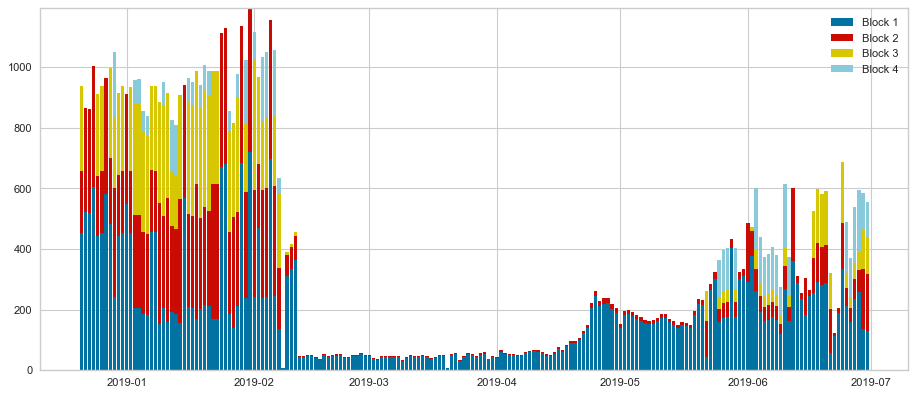

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


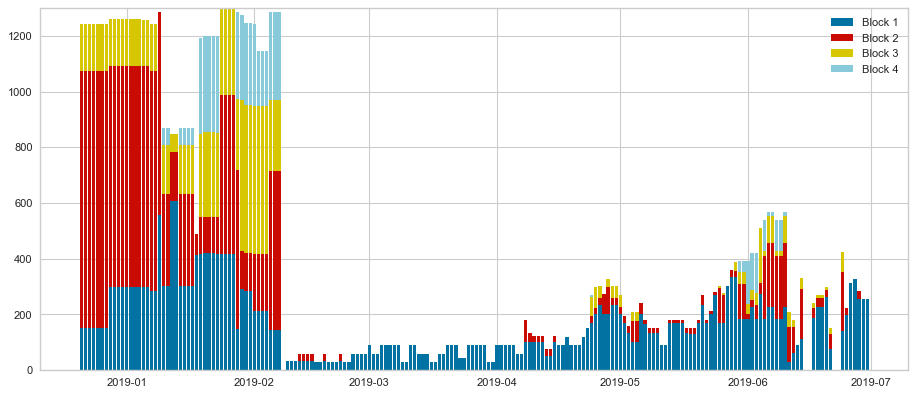

Hourly comparison: prediction vs. actual values
RMSE :14.58
MAE :8.51
R^2 :65.28
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 10 clusters **
Nb of clusters 9
Nb of centers 9, list:[1852, 395, 161, 472, 960, 622, 1744, 792, 1759]
Number of centers: 9
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.4895833333333333


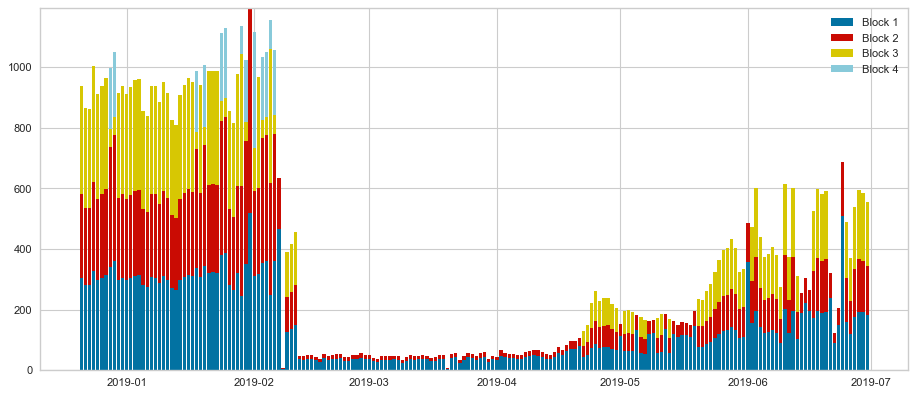

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


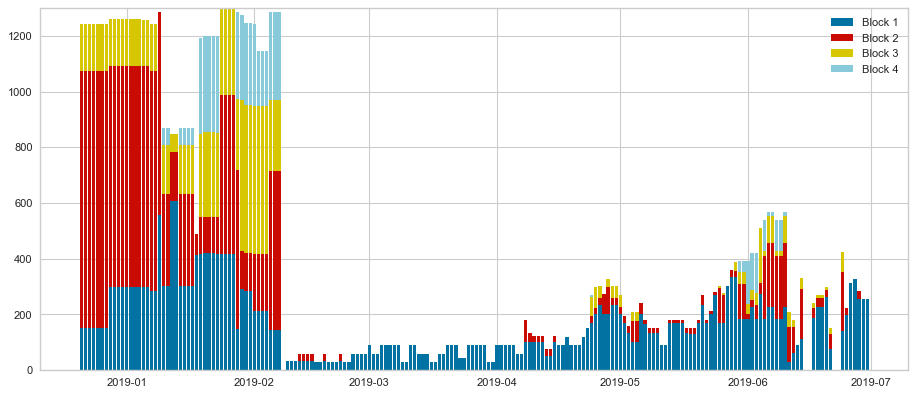

Hourly comparison: prediction vs. actual values
RMSE :13.64
MAE :8.72
R^2 :65.84
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.19791666666666666


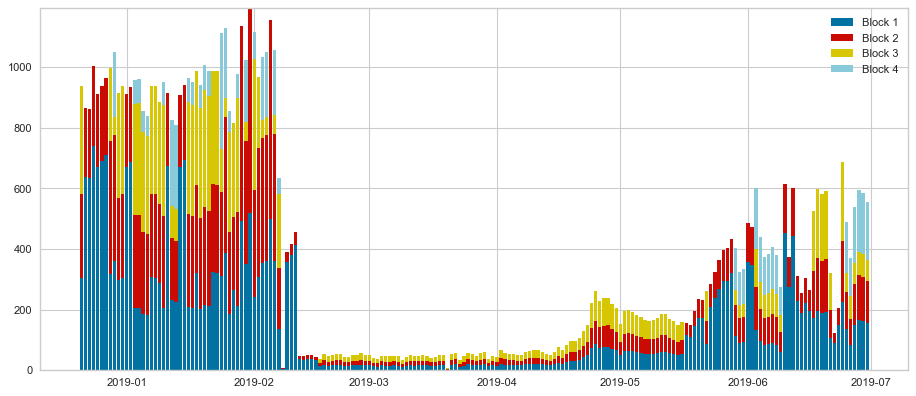

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


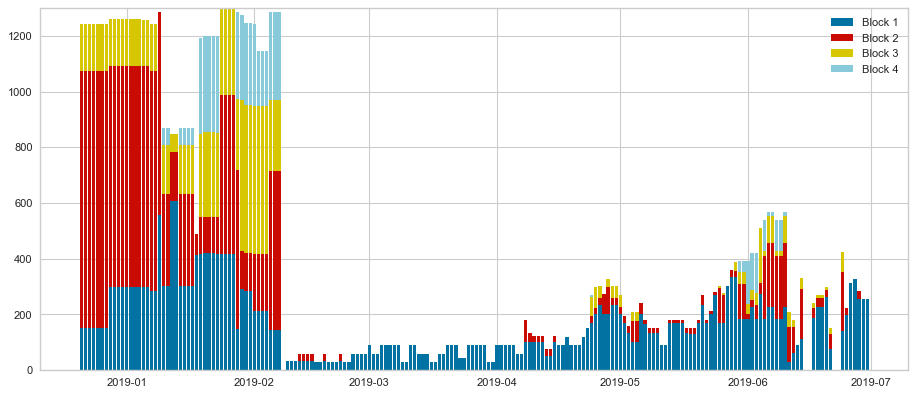

Hourly comparison: prediction vs. actual values
RMSE :15.73
MAE :9.72
R^2 :57.57
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 11 clusters **
Nb of clusters 10
Nb of centers 10, list:[259, 1386, 1596, 293, 742, 622, 504, 1621, 1609, 1759]
Number of centers: 10
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.453125


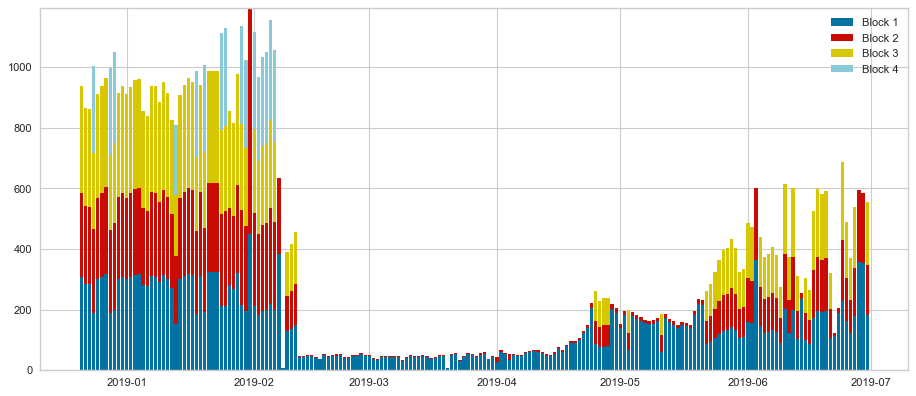

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


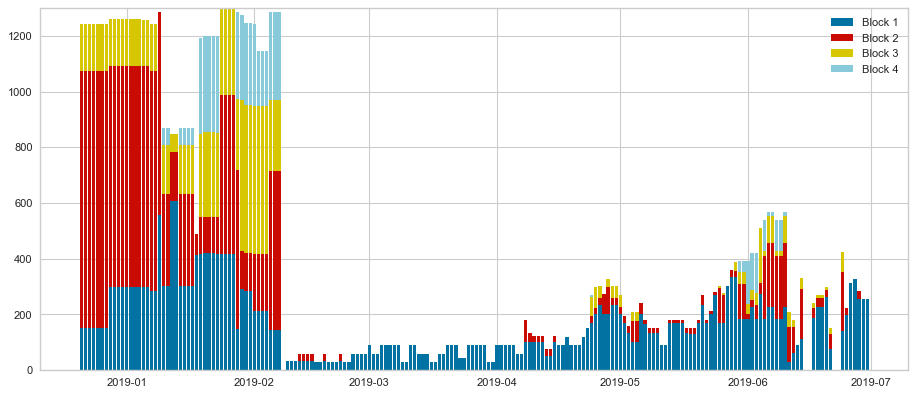

Hourly comparison: prediction vs. actual values
RMSE :13.95
MAE :8.41
R^2 :67.9
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.16145833333333334


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


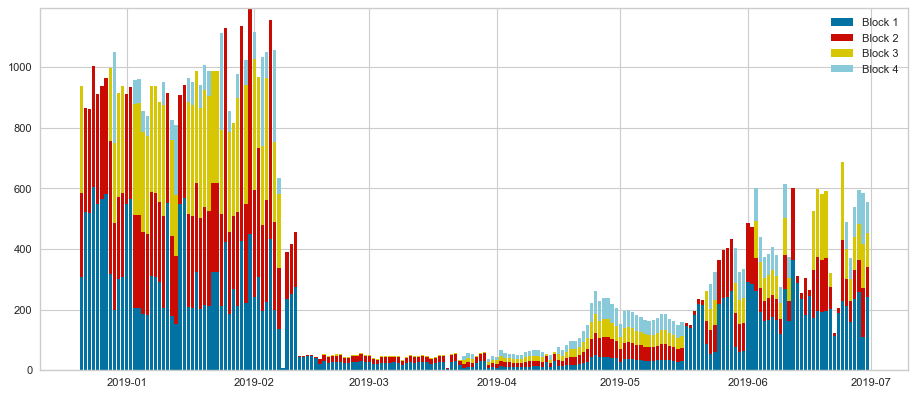

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


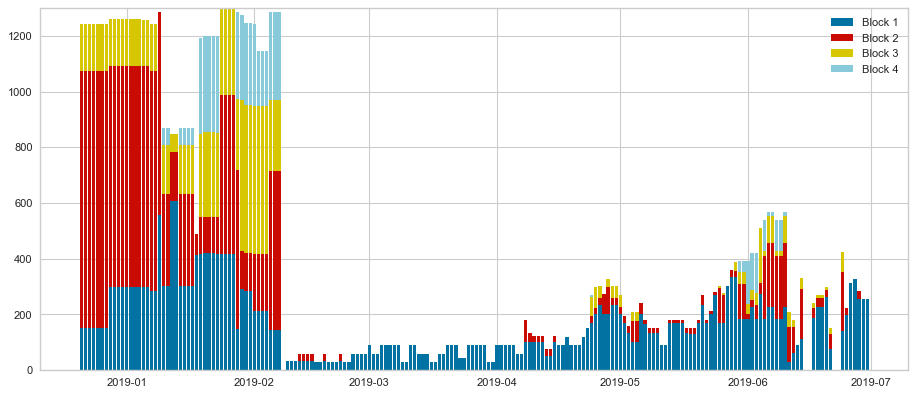

Hourly comparison: prediction vs. actual values
RMSE :12.88
MAE :7.92
R^2 :66.91
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 12 clusters **
Nb of clusters 11
Nb of centers 11, list:[259, 1362, 1109, 181, 742, 504, 1590, 622, 1440, 1420, 1534]
Number of centers: 11
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.28125


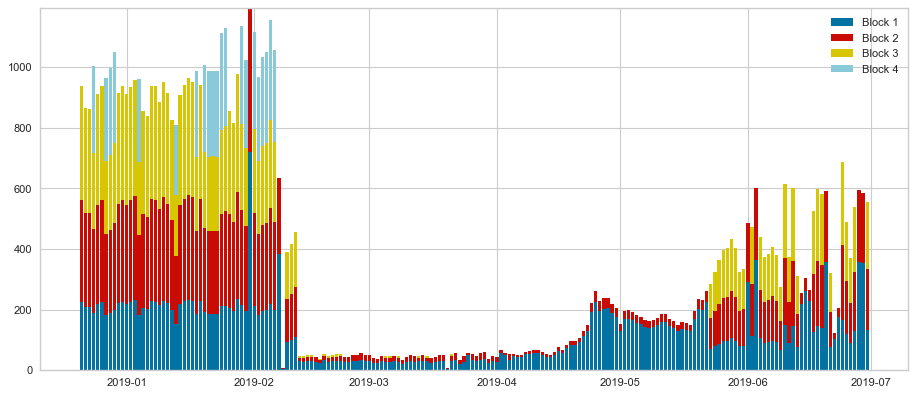

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


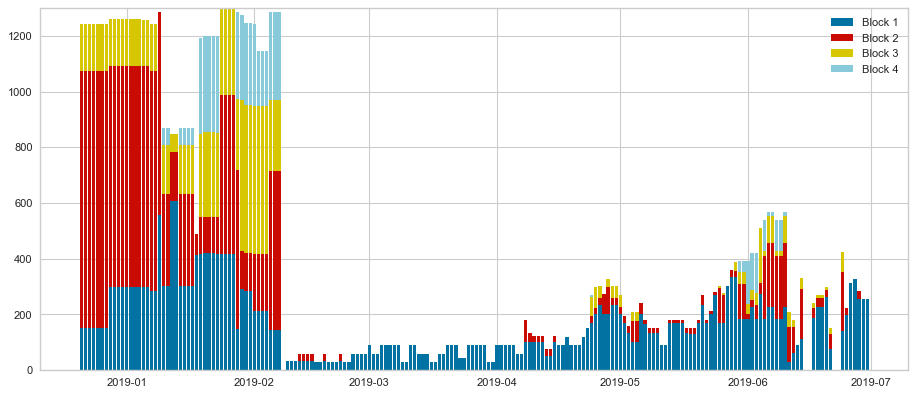

Hourly comparison: prediction vs. actual values
RMSE :14.43
MAE :8.71
R^2 :66.46
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.13541666666666666


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


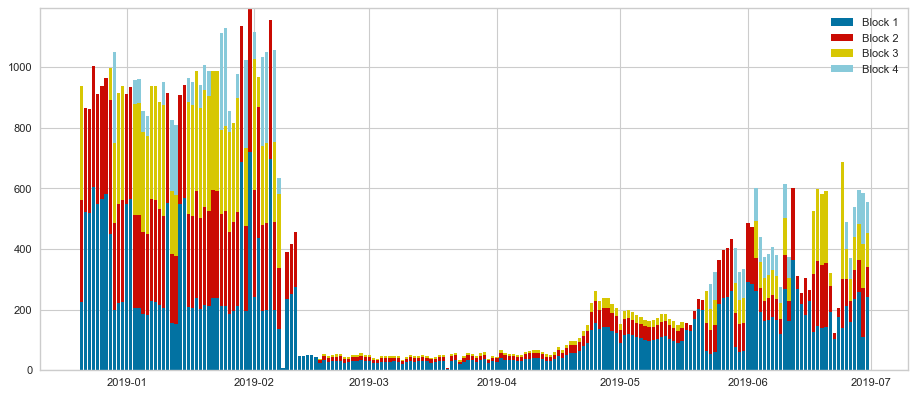

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


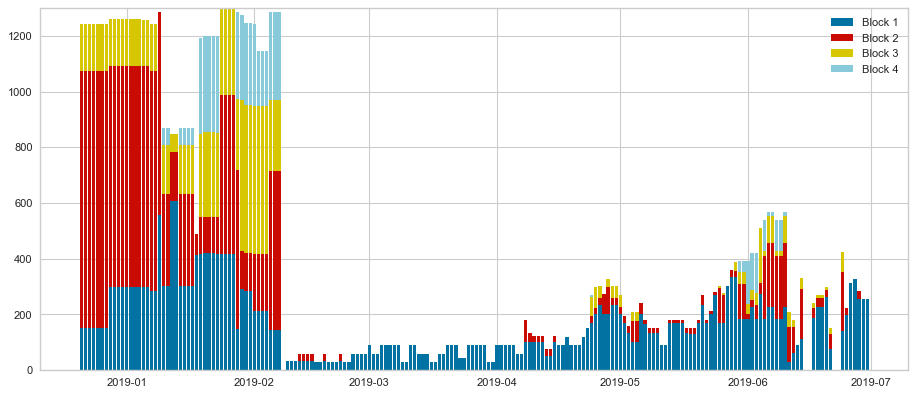

Hourly comparison: prediction vs. actual values
RMSE :13.36
MAE :7.84
R^2 :69.04
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 13 clusters **
Nb of clusters 12
Nb of centers 12, list:[230, 181, 1446, 1303, 1906, 622, 1362, 1176, 816, 1386, 1109, 1084]
Number of centers: 12
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.21875


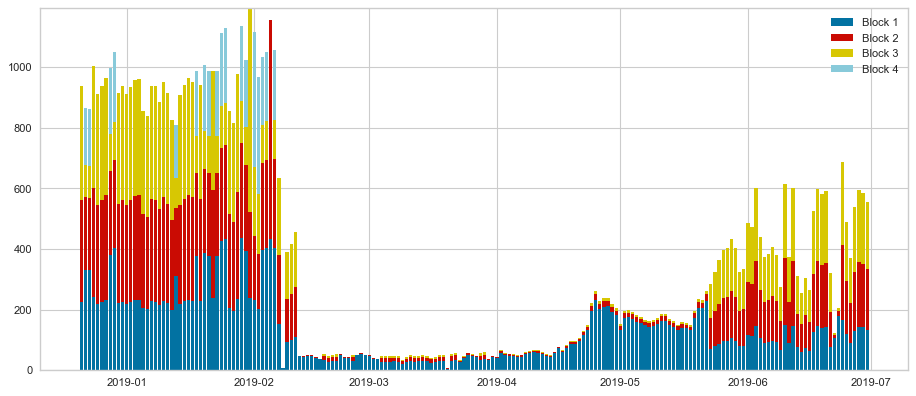

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


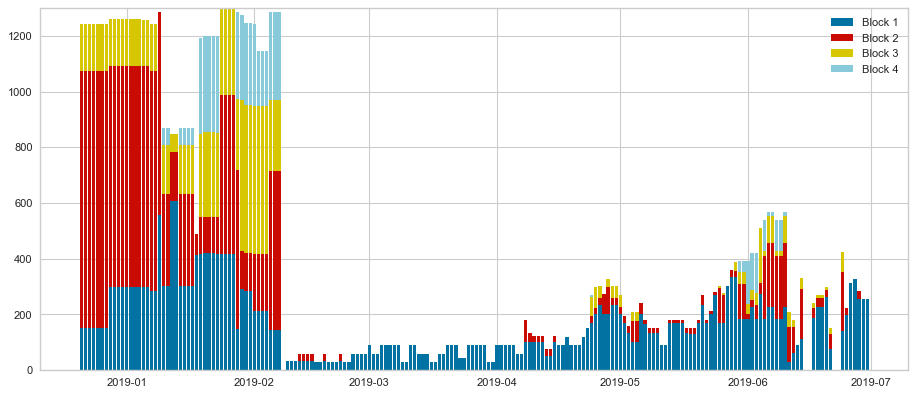

Hourly comparison: prediction vs. actual values
RMSE :13.14
MAE :8.04
R^2 :68.77
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.13541666666666666


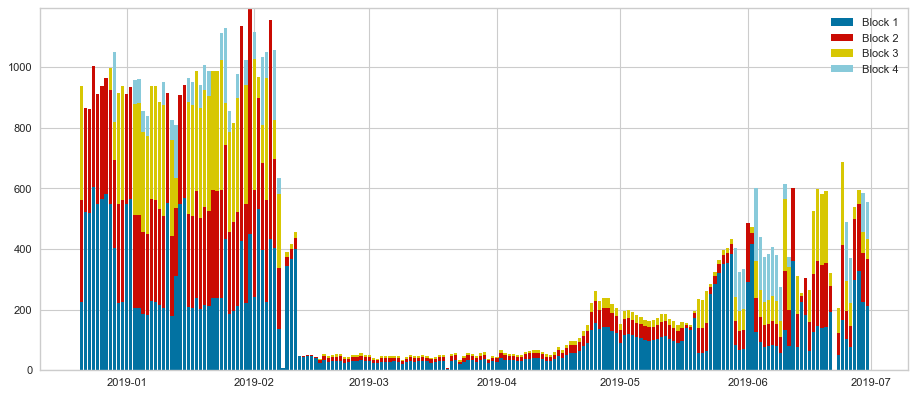

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


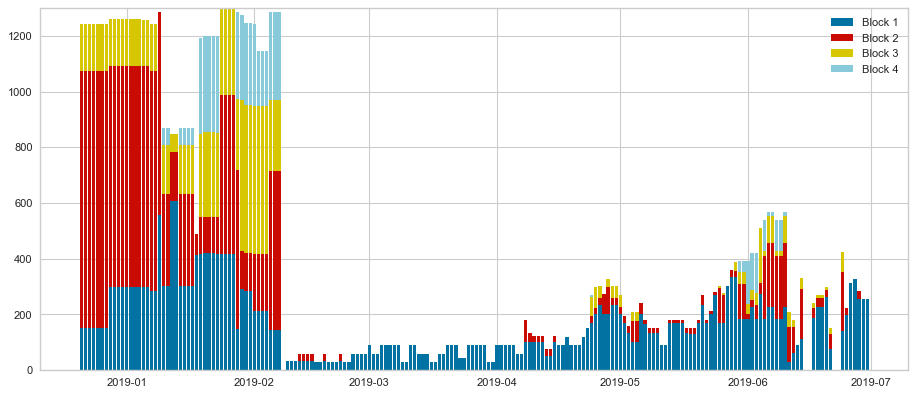

Hourly comparison: prediction vs. actual values
RMSE :12.65
MAE :7.47
R^2 :70.51
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Vector with 14 clusters **
Nb of clusters 13
Nb of centers 13, list:[231, 274, 1609, 1362, 622, 87, 959, 917, 1386, 0, 472, 974, 1109]
Number of centers: 13
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.4739583333333333


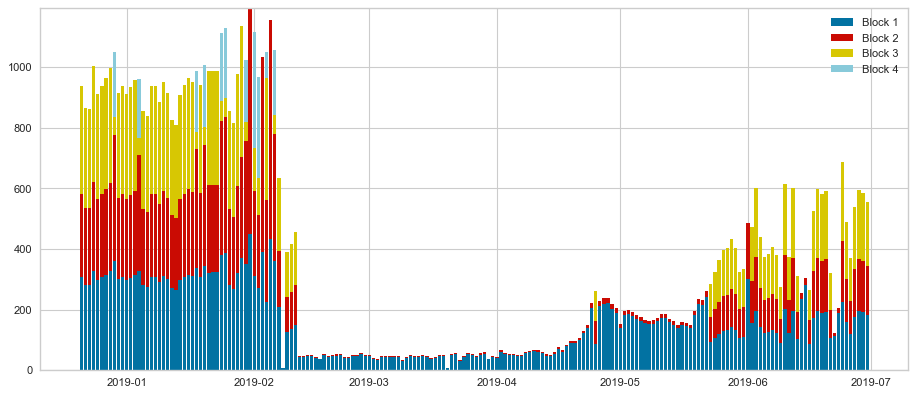

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


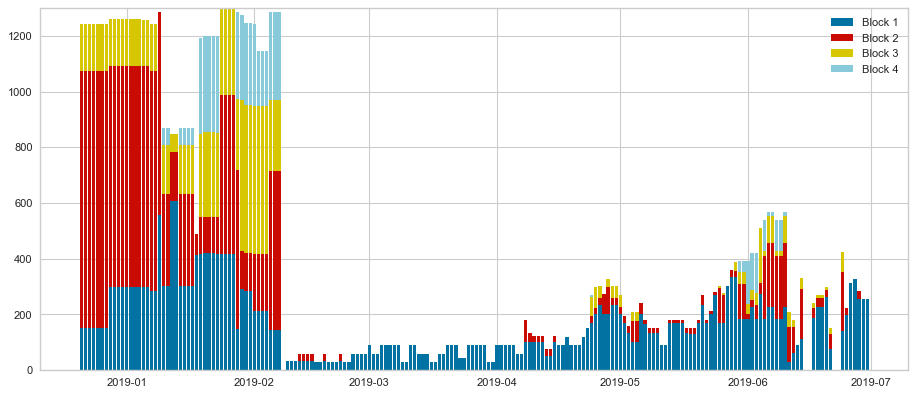

Hourly comparison: prediction vs. actual values
RMSE :13.79
MAE :8.14
R^2 :67.9
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.14583333333333334


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


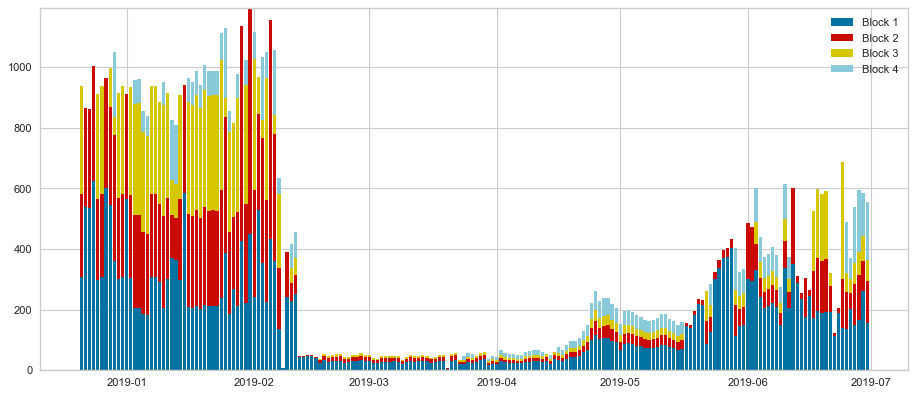

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


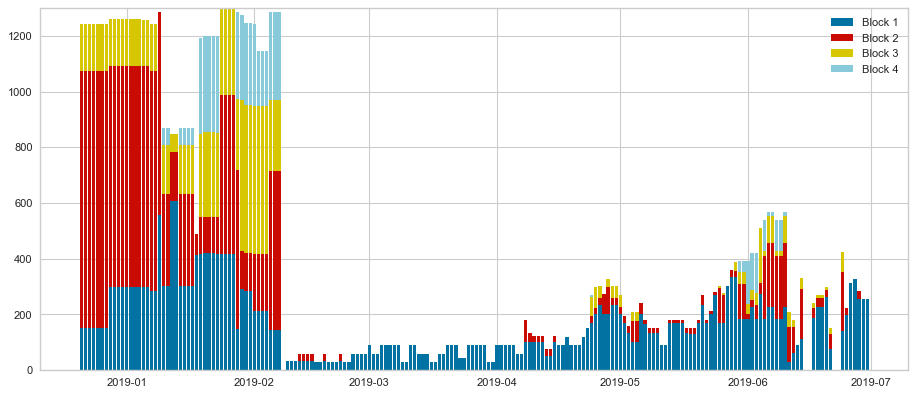

Hourly comparison: prediction vs. actual values
RMSE :14.18
MAE :8.49
R^2 :63.48
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 15 clusters **
Nb of clusters 14
Nb of centers 14, list:[87, 256, 78, 0, 692, 497, 356, 1386, 742, 622, 1109, 778, 381, 1446]
Number of centers: 14
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.25


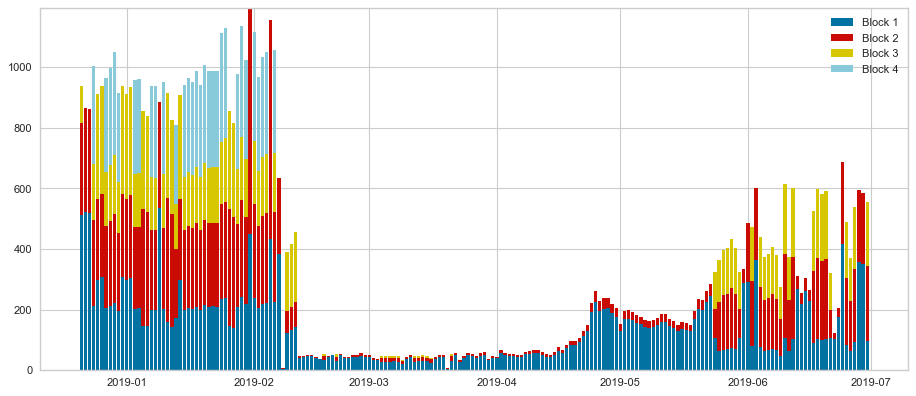

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


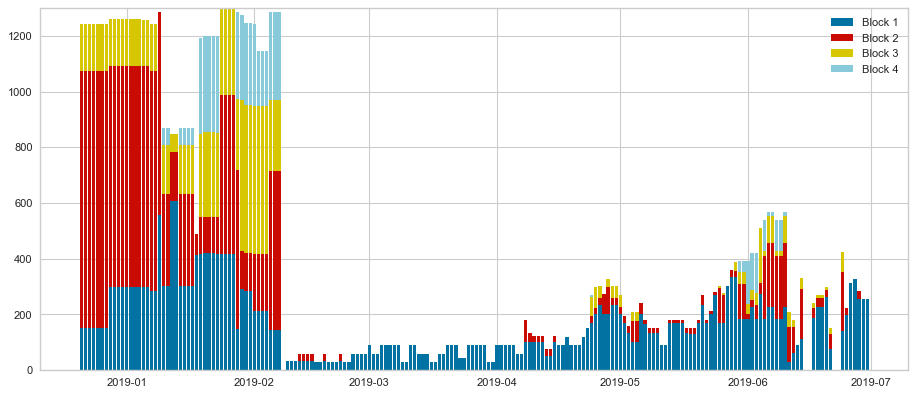

Hourly comparison: prediction vs. actual values
RMSE :13.84
MAE :8.09
R^2 :67.11
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.14583333333333334


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


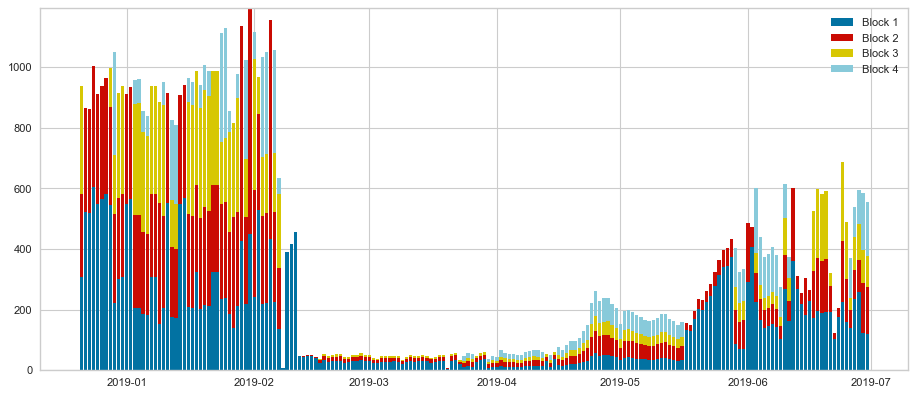

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


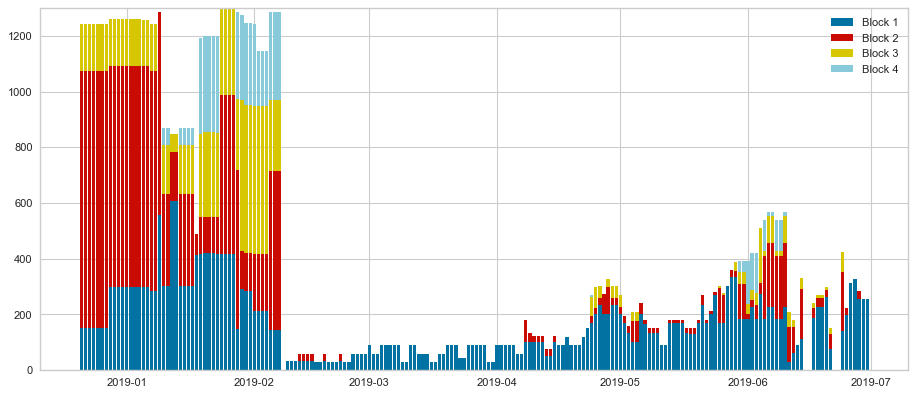

Hourly comparison: prediction vs. actual values
RMSE :13.07
MAE :8.16
R^2 :67.69
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 16 clusters **
Nb of clusters 15
Nb of centers 15, list:[120, 240, 512, 1109, 1386, 1273, 840, 960, 1070, 1084, 783, 1440, 95, 917, 81]
Number of centers: 15
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.22395833333333334


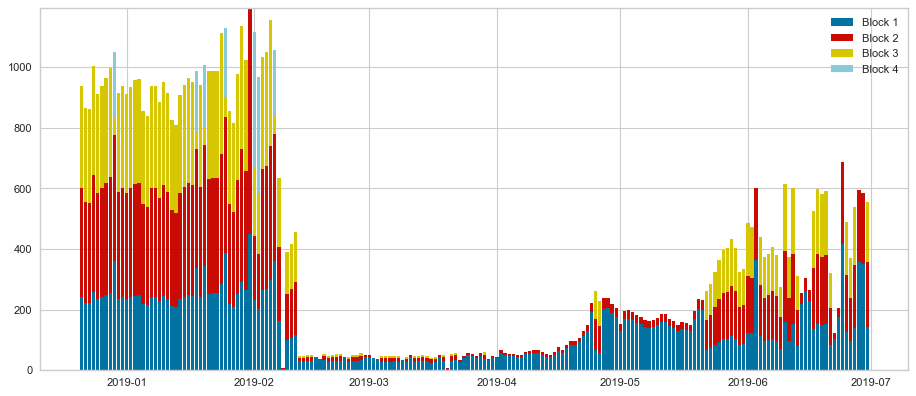

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


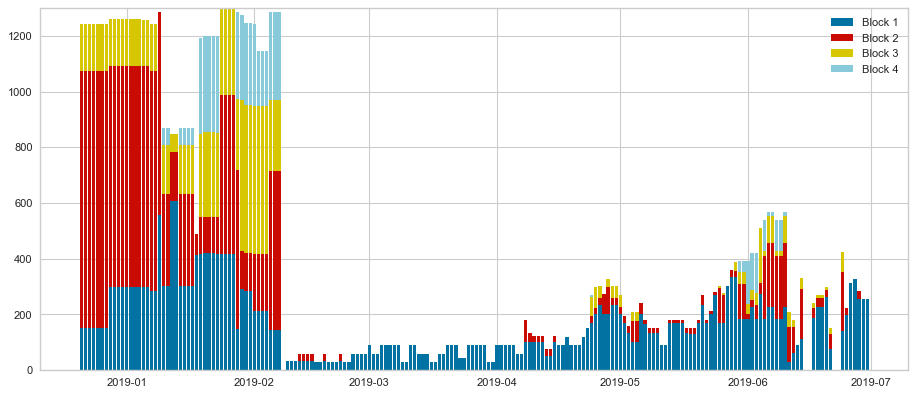

Hourly comparison: prediction vs. actual values
RMSE :13.57
MAE :8.15
R^2 :68.78
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.109375


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


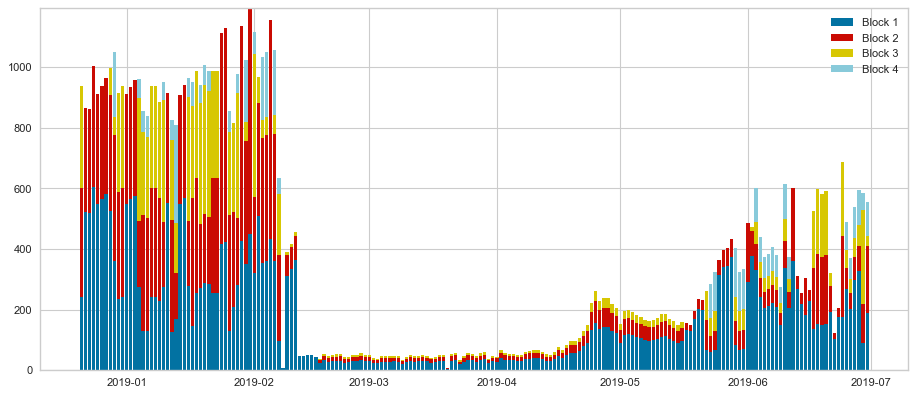

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


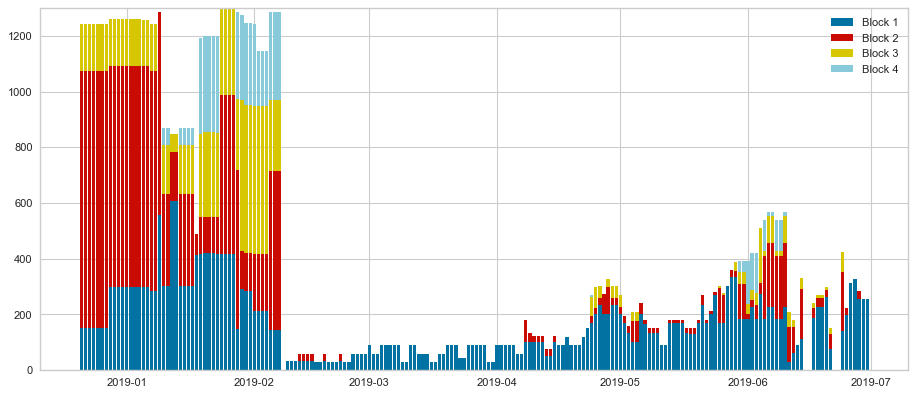

Hourly comparison: prediction vs. actual values
RMSE :13.25
MAE :7.85
R^2 :68.9
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 17 clusters **
Nb of clusters 16
Nb of centers 16, list:[113, 76, 512, 95, 1023, 223, 622, 783, 230, 60, 1243, 1348, 1665, 1109, 472, 1808]
Number of centers: 16
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.20833333333333334


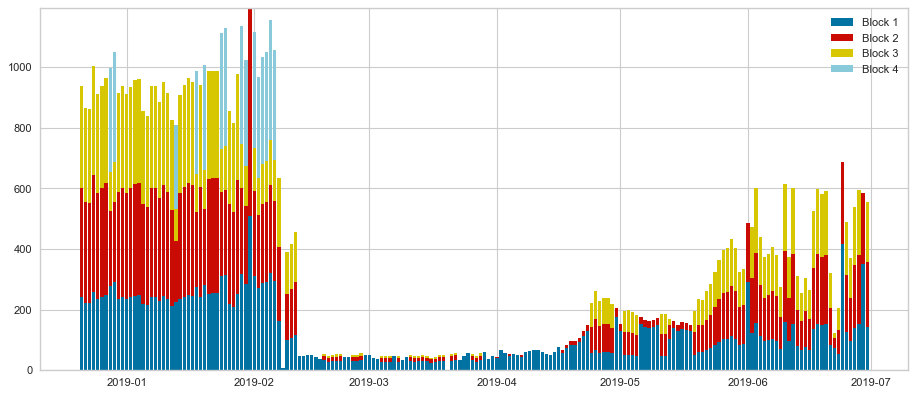

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


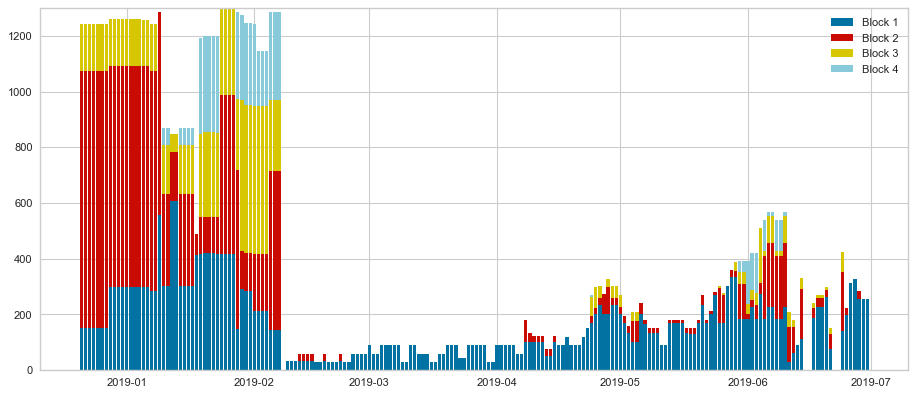

Hourly comparison: prediction vs. actual values
RMSE :13.34
MAE :8.21
R^2 :69.02
Daily comparison (max prod): prediction vs. actual values
RMSE :178.93
MAE :120.97
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.13020833333333334


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


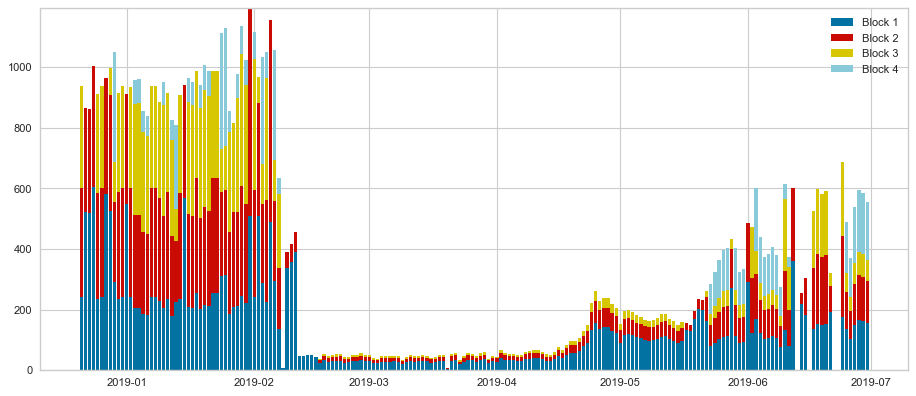

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


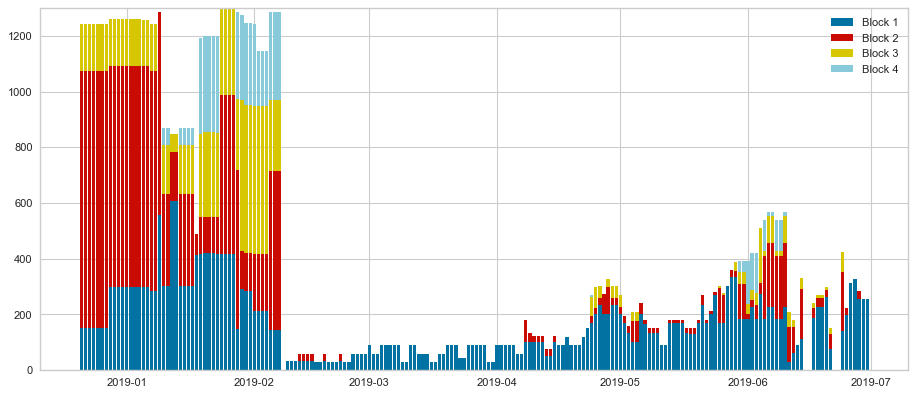

Hourly comparison: prediction vs. actual values
RMSE :12.52
MAE :7.48
R^2 :71.52
Daily comparison (max prod): prediction vs. actual values
RMSE :176.45
MAE :117.17
R^2 :85.41
************************************
** clustering Vector with 18 clusters **
Nb of clusters 17
Nb of centers 17, list:[230, 114, 1303, 517, 1420, 636, 742, 0, 954, 724, 1362, 1252, 1386, 622, 1105, 472, 1397]
Number of centers: 17
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.3385416666666667


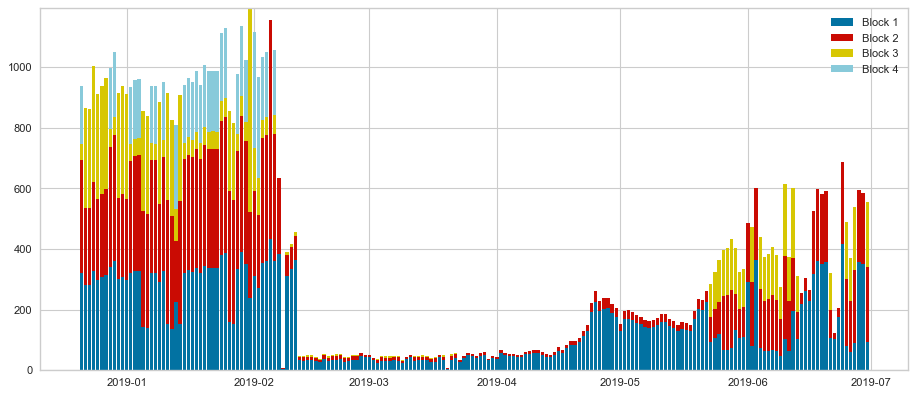

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


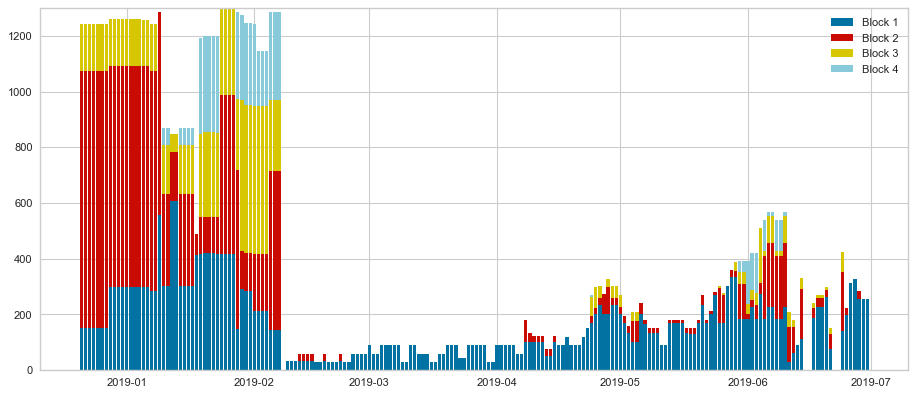

Hourly comparison: prediction vs. actual values
RMSE :13.99
MAE :8.2
R^2 :67.74
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.11979166666666667


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


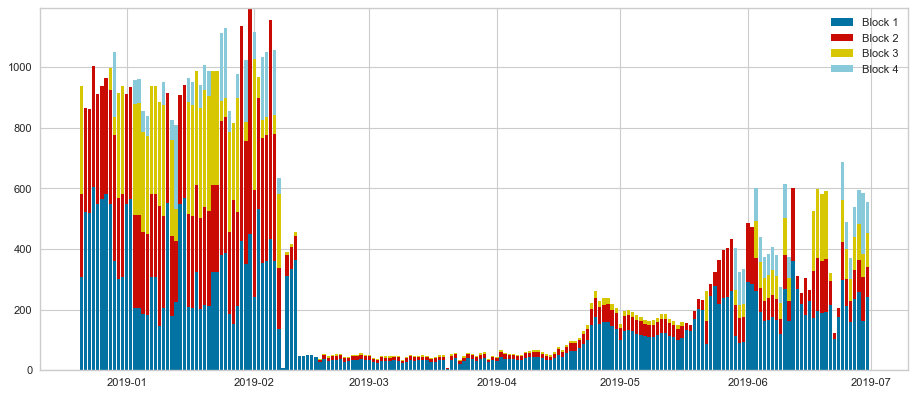

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


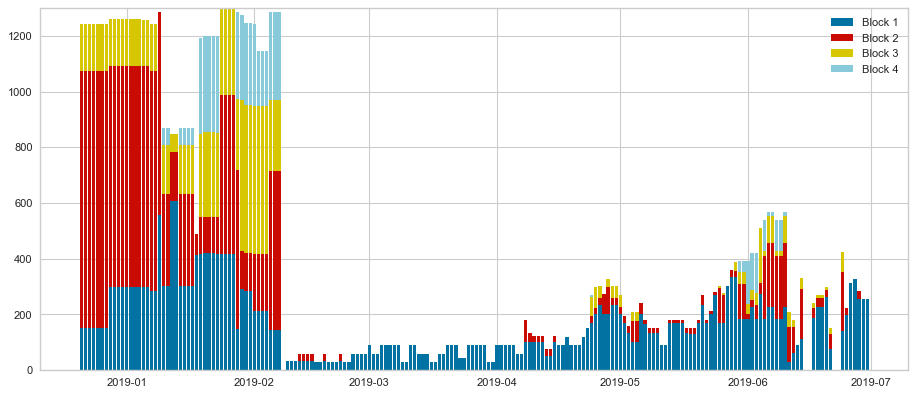

Hourly comparison: prediction vs. actual values
RMSE :13.21
MAE :7.69
R^2 :69.17
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 19 clusters **
Nb of clusters 18
Nb of centers 18, list:[501, 1348, 472, 114, 923, 622, 1745, 917, 512, 585, 1111, 1212, 230, 1397, 1187, 1604, 1665, 1414]
Number of centers: 18
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.18229166666666666


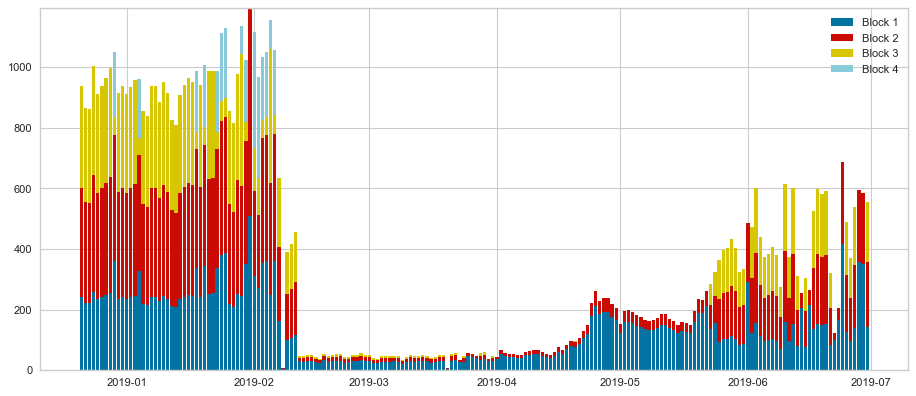

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


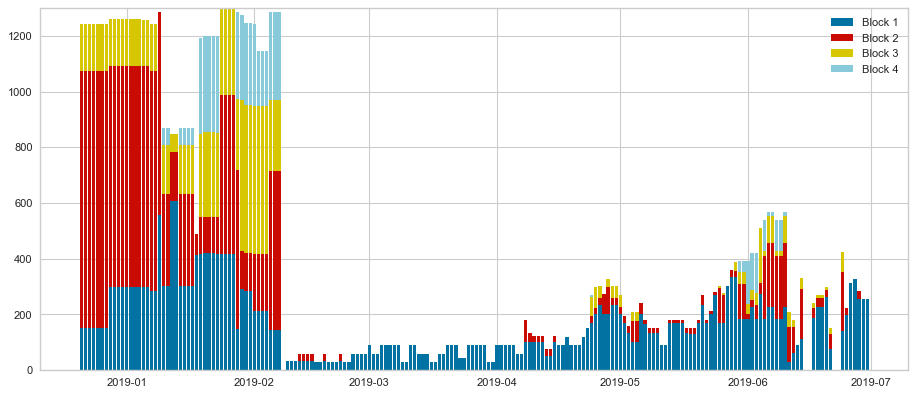

Hourly comparison: prediction vs. actual values
RMSE :13.17
MAE :7.99
R^2 :69.56
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.11458333333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


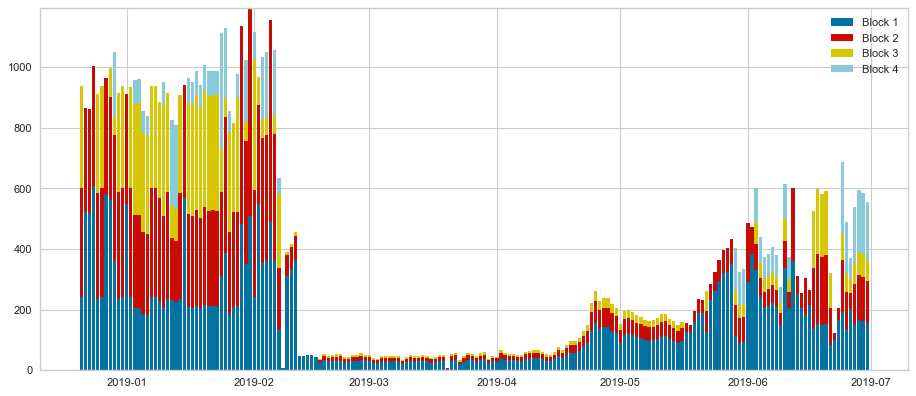

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


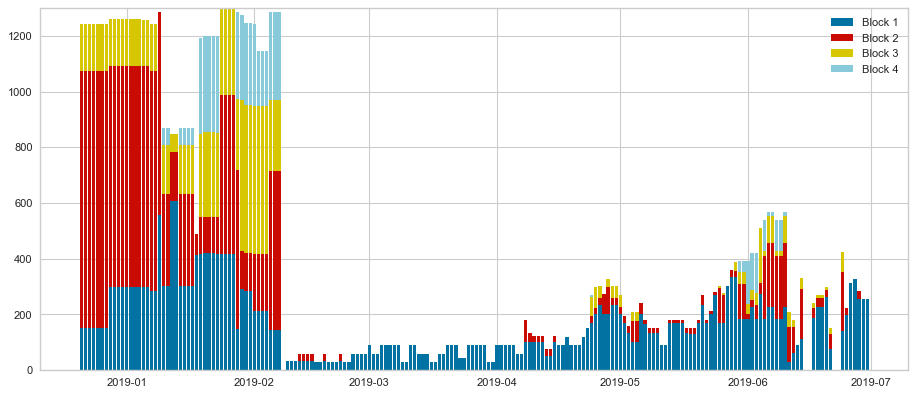

Hourly comparison: prediction vs. actual values
RMSE :12.91
MAE :7.79
R^2 :70.33
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 20 clusters **
Nb of clusters 19
Nb of centers 19, list:[1420, 230, 692, 395, 1109, 576, 622, 472, 0, 960, 657, 742, 9, 1386, 1440, 778, 1123, 1728, 1824]
Number of centers: 19
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.3125


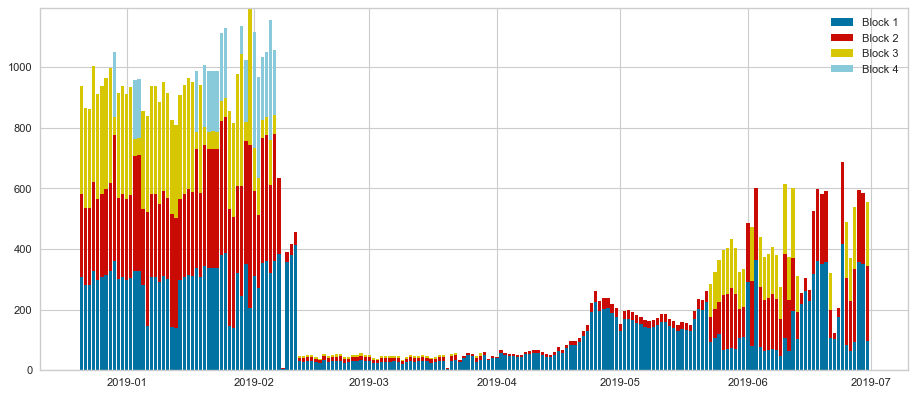

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


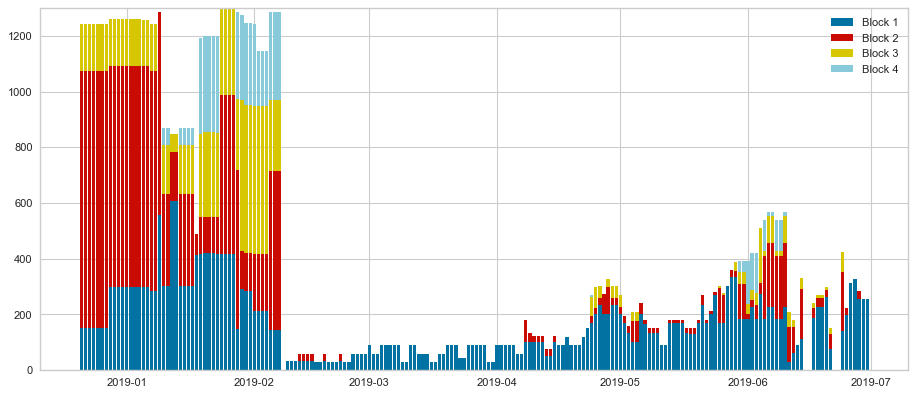

Hourly comparison: prediction vs. actual values
RMSE :13.96
MAE :8.21
R^2 :68.11
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.10416666666666667


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


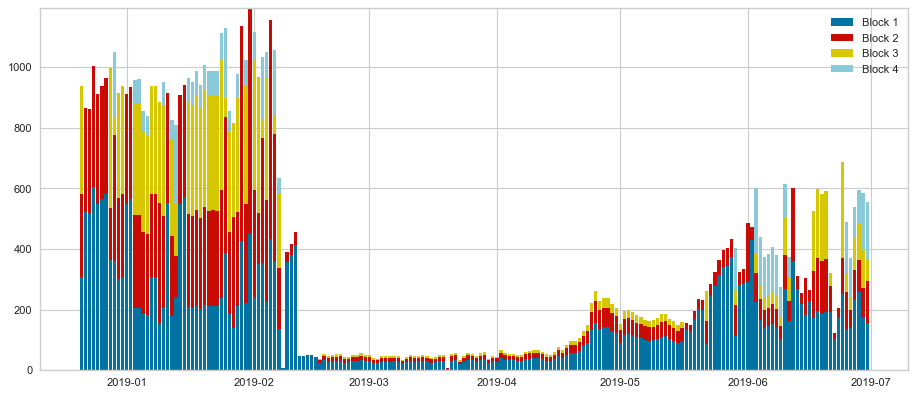

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


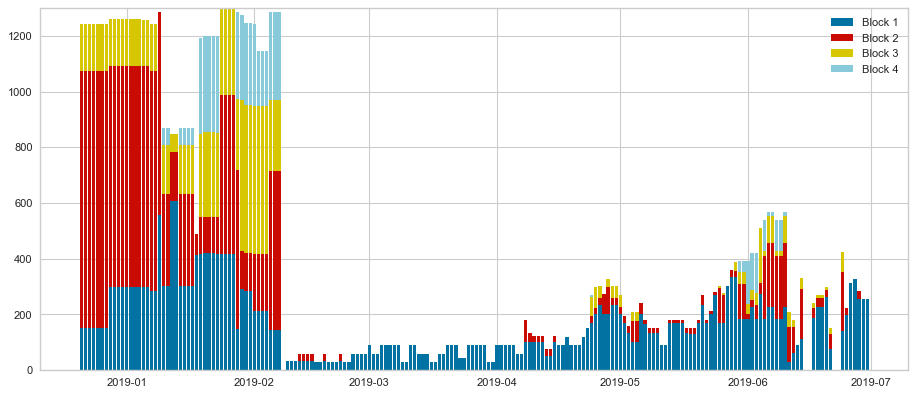

Hourly comparison: prediction vs. actual values
RMSE :13.89
MAE :7.95
R^2 :66.49
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 21 clusters **
Nb of clusters 20
Nb of centers 20, list:[114, 0, 273, 356, 1109, 95, 692, 728, 923, 910, 230, 1092, 1303, 1274, 1365, 1435, 792, 622, 1729, 1414]
Number of centers: 20
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.22395833333333334


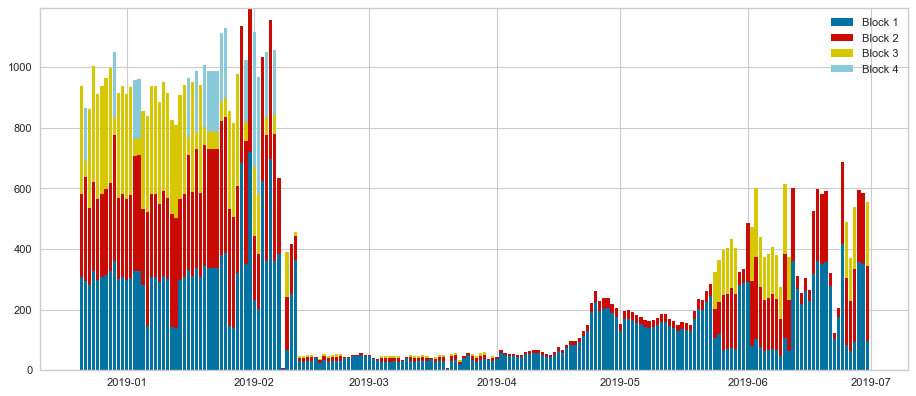

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


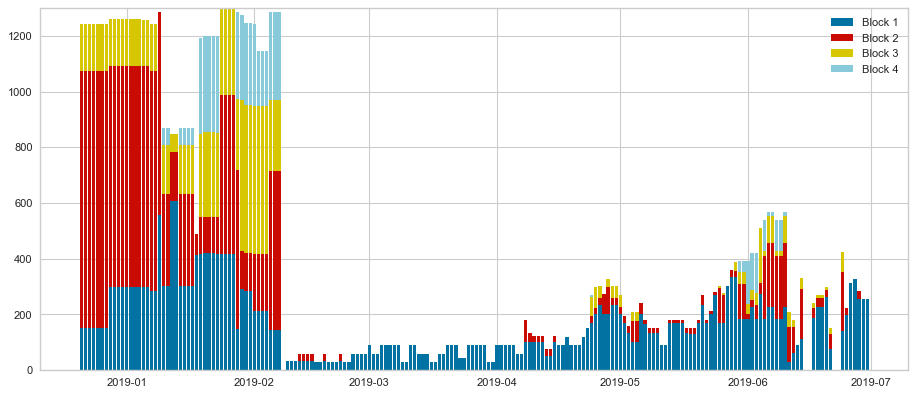

Hourly comparison: prediction vs. actual values
RMSE :13.62
MAE :7.94
R^2 :69.45
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.11979166666666667


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


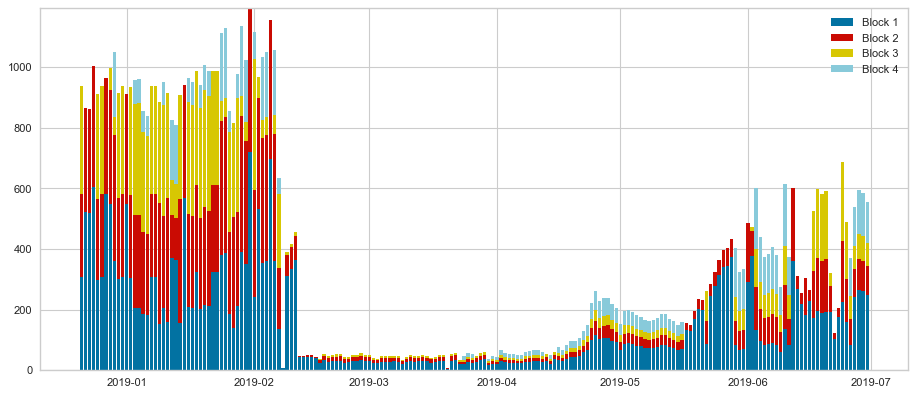

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


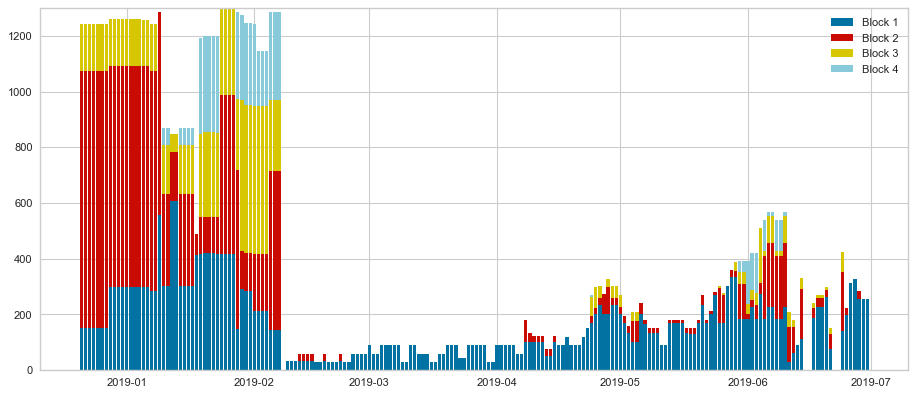

Hourly comparison: prediction vs. actual values
RMSE :13.59
MAE :8.38
R^2 :66.81
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 22 clusters **
Nb of clusters 21
Nb of centers 21, list:[907, 231, 284, 1386, 772, 1579, 1070, 181, 1362, 839, 497, 1044, 60, 1204, 1305, 1621, 792, 1423, 1656, 1732, 1414]
Number of centers: 21
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.3333333333333333


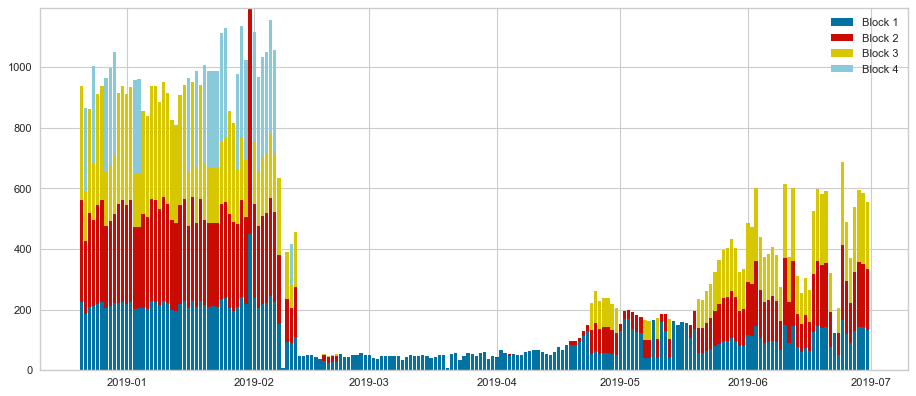

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


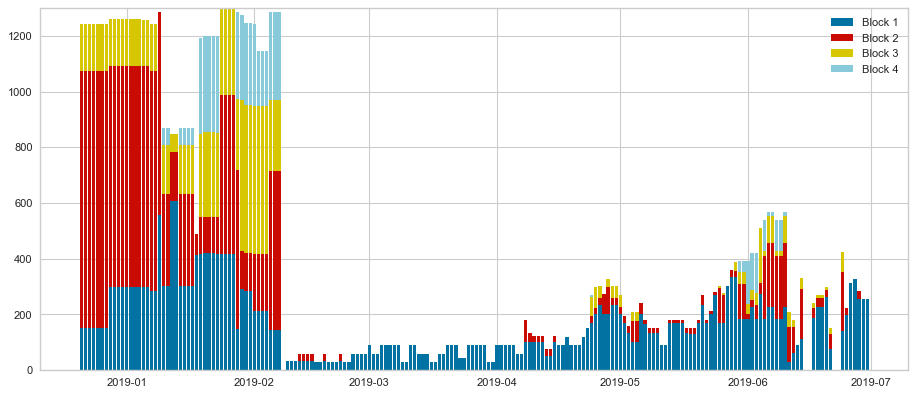

Hourly comparison: prediction vs. actual values
RMSE :13.71
MAE :8.22
R^2 :67.22
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.07291666666666667


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


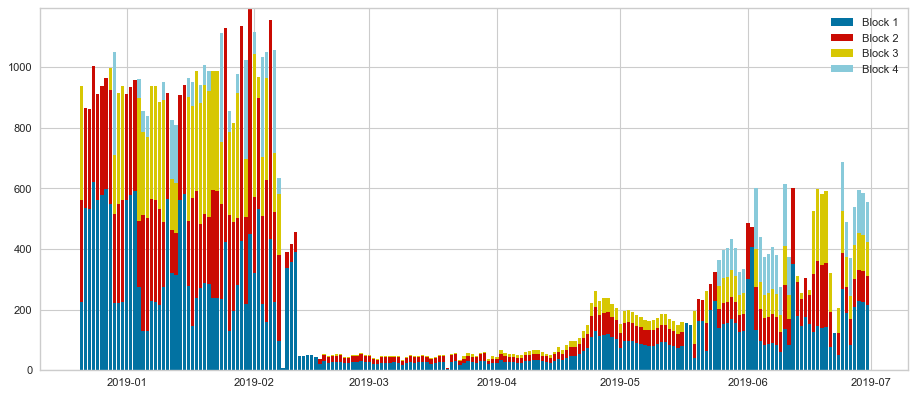

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


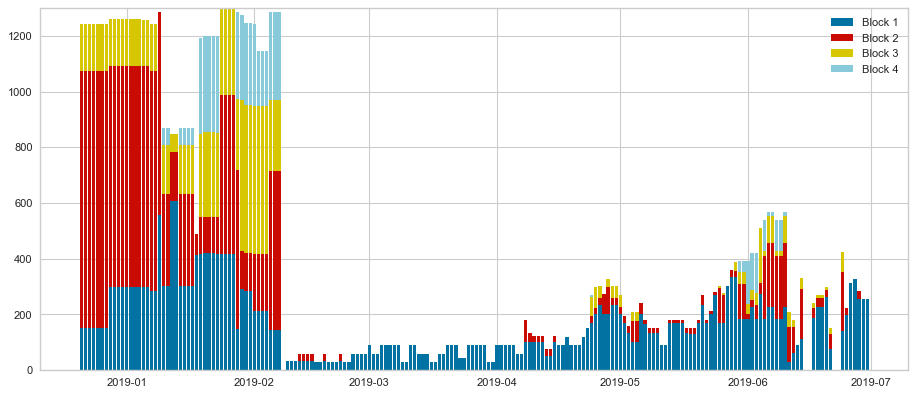

Hourly comparison: prediction vs. actual values
RMSE :13.81
MAE :7.88
R^2 :67.01
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 23 clusters **
Nb of clusters 22
Nb of centers 22, list:[95, 0, 153, 923, 114, 468, 657, 668, 792, 130, 913, 996, 622, 1386, 381, 1328, 81, 1261, 1596, 1656, 1759, 15]
Number of centers: 22
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.24479166666666666


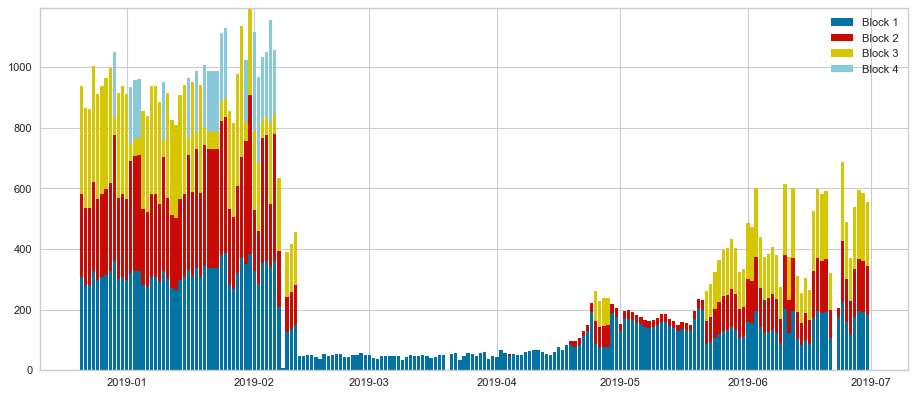

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


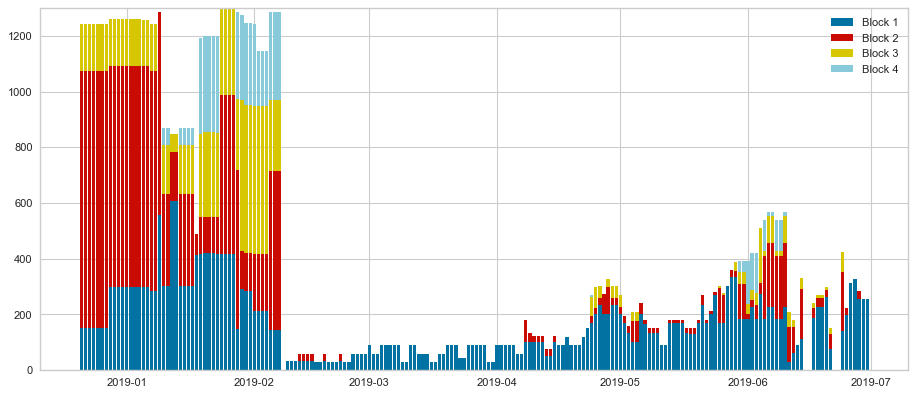

Hourly comparison: prediction vs. actual values
RMSE :13.21
MAE :7.53
R^2 :70.47
Daily comparison (max prod): prediction vs. actual values
RMSE :178.71
MAE :120.33
R^2 :85.04
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.08333333333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


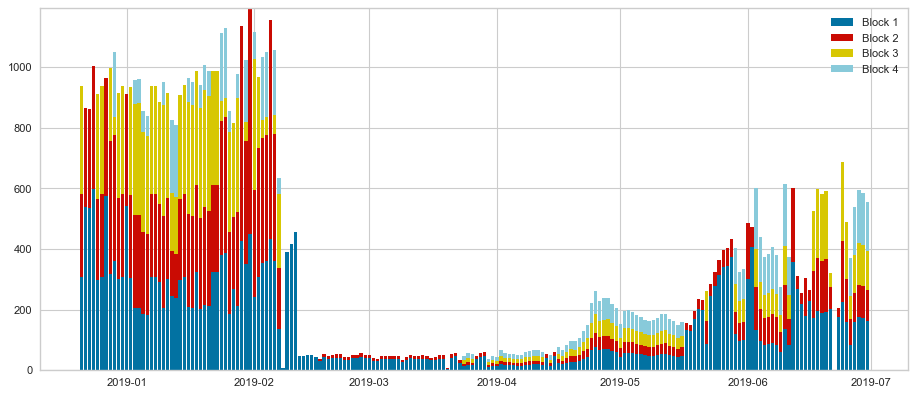

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


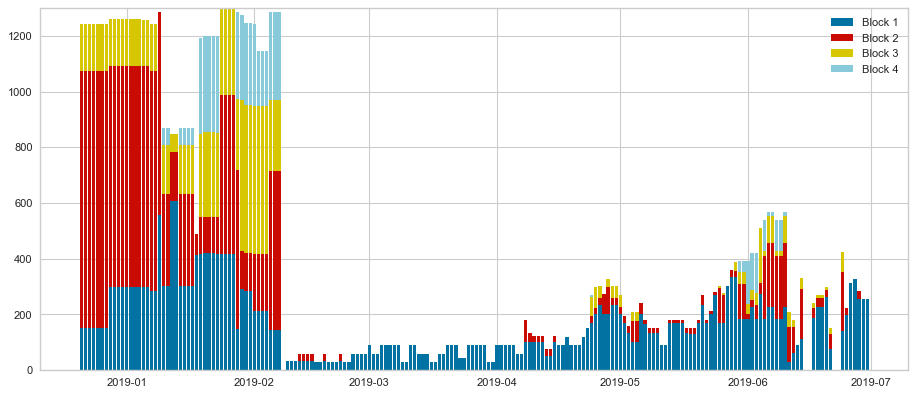

Hourly comparison: prediction vs. actual values
RMSE :13.28
MAE :8.08
R^2 :67.29
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Vector with 24 clusters **
Nb of clusters 23
Nb of centers 23, list:[1878, 114, 153, 1732, 974, 1109, 1362, 692, 1273, 792, 342, 960, 0, 1590, 1084, 668, 1386, 1440, 1322, 1414, 622, 1303, 1606]
Number of centers: 23
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.10416666666666667


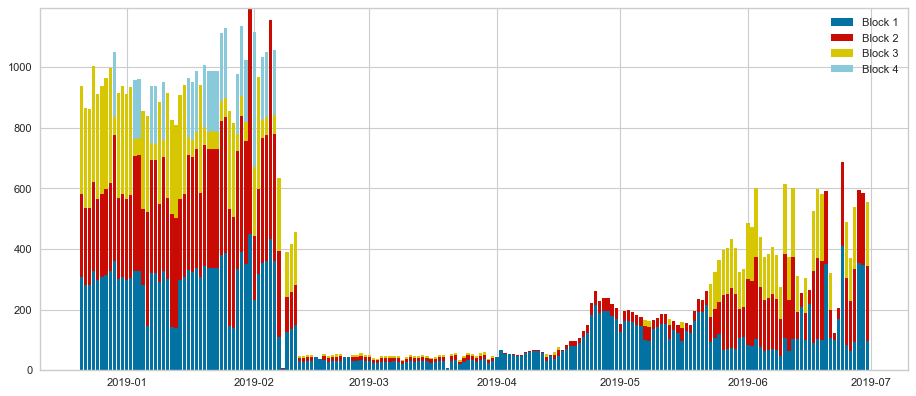

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


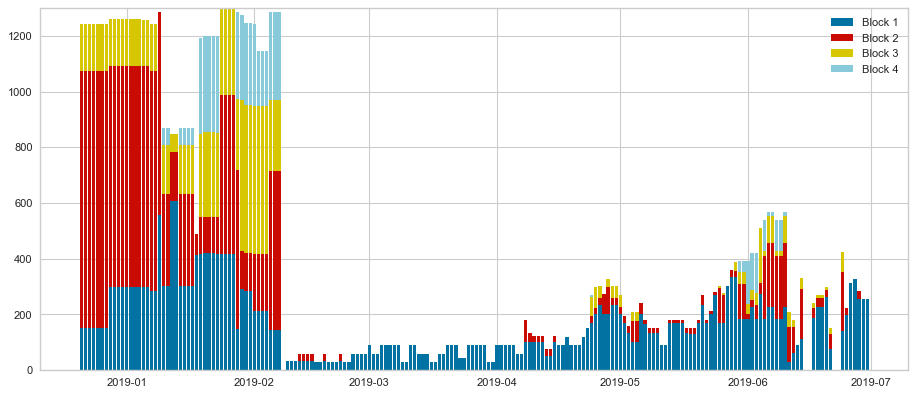

Hourly comparison: prediction vs. actual values
RMSE :13.67
MAE :8.11
R^2 :68.67
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.0625


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


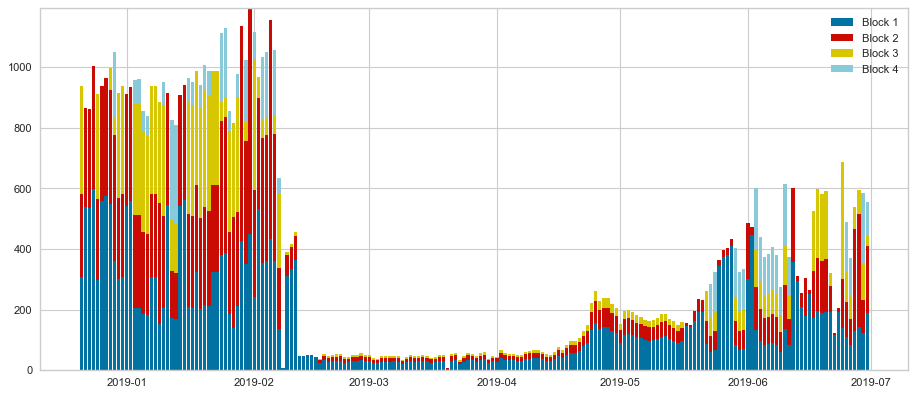

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


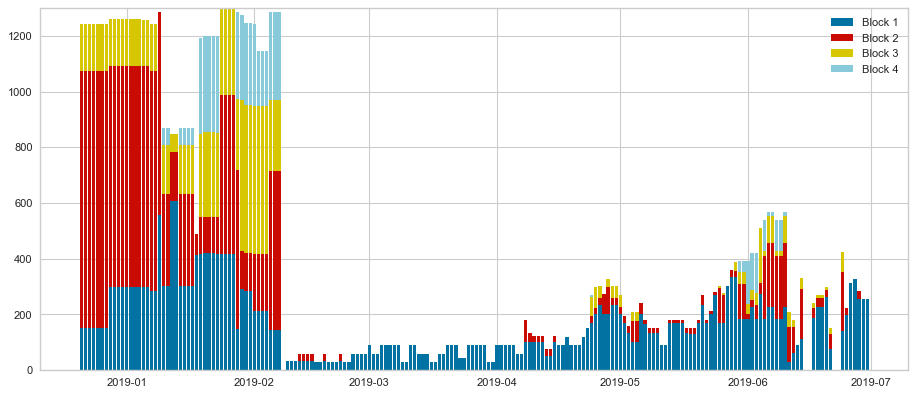

Hourly comparison: prediction vs. actual values
RMSE :13.07
MAE :7.78
R^2 :69.68
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 25 clusters **
Nb of clusters 24
Nb of centers 24, list:[95, 230, 134, 9, 395, 1853, 1252, 1732, 692, 472, 363, 924, 1001, 622, 792, 970, 400, 1386, 15, 1540, 1109, 1694, 1719, 81]
Number of centers: 24
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.3385416666666667


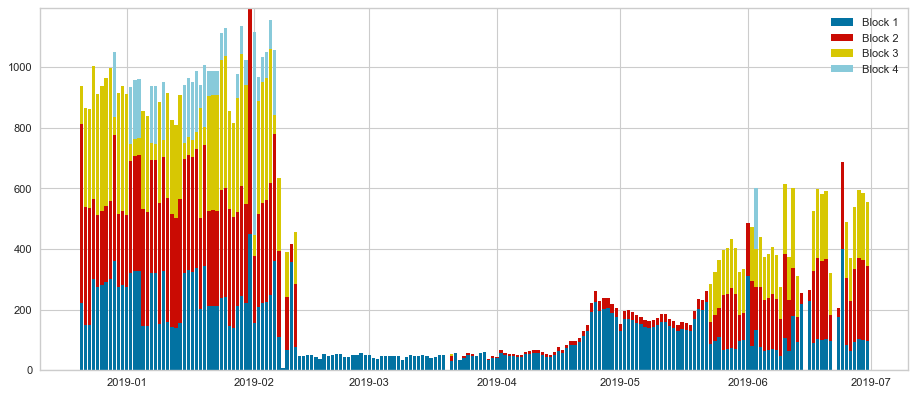

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


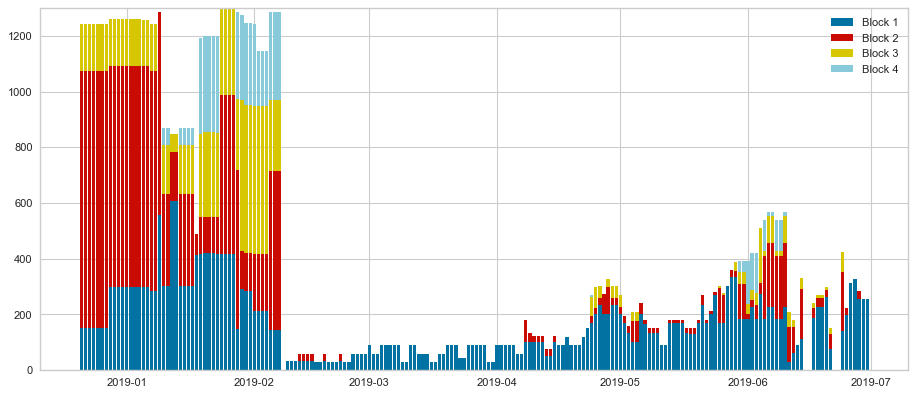

Hourly comparison: prediction vs. actual values
RMSE :12.9
MAE :7.45
R^2 :70.3
Daily comparison (max prod): prediction vs. actual values
RMSE :177.37
MAE :118.76
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.09895833333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


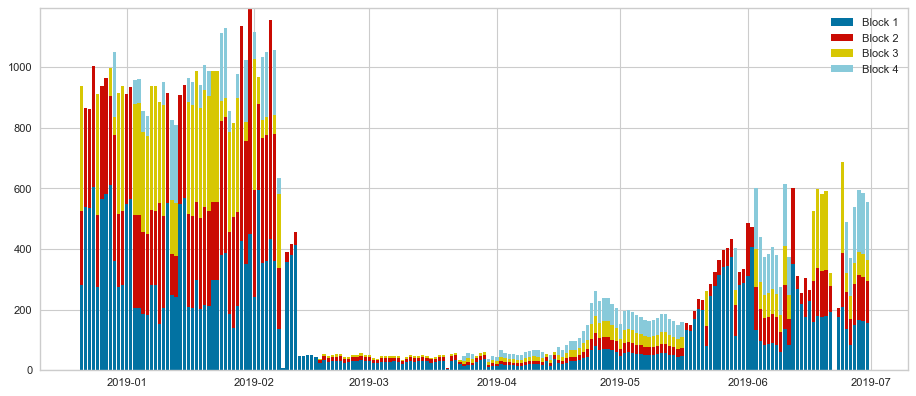

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


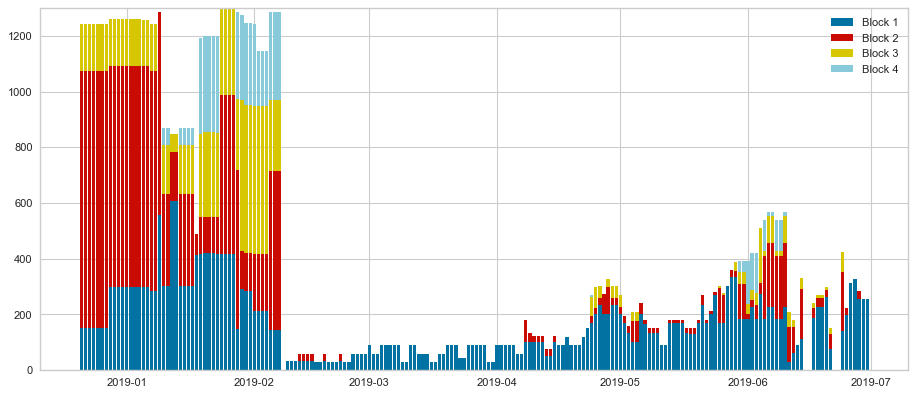

Hourly comparison: prediction vs. actual values
RMSE :13.86
MAE :8.63
R^2 :66.18
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Vector with 26 clusters **
Nb of clusters 25
Nb of centers 25, list:[108, 230, 1084, 181, 370, 1732, 1105, 668, 1303, 531, 778, 839, 962, 1029, 1110, 555, 451, 1386, 395, 742, 356, 1435, 1070, 1776, 853]
Number of centers: 25
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.3385416666666667


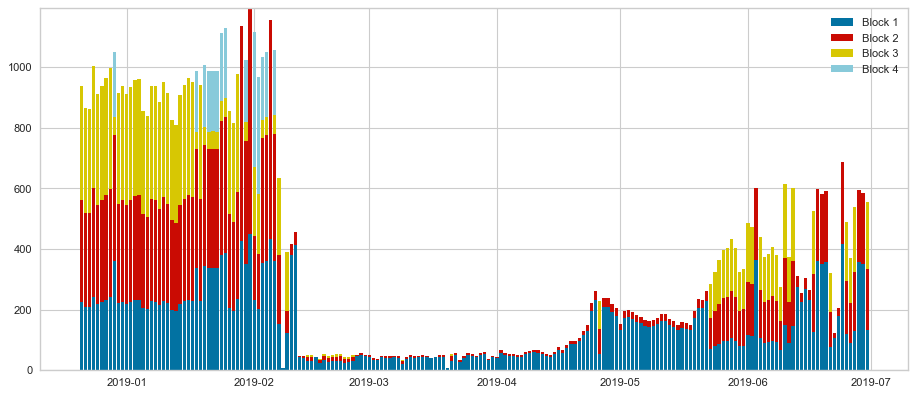

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


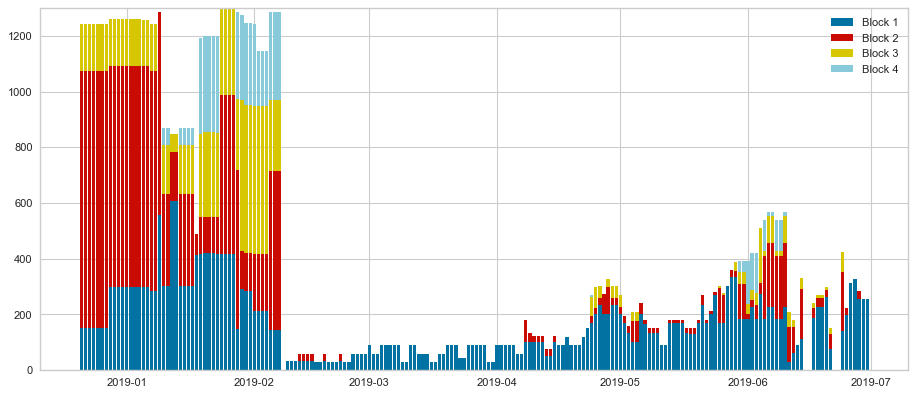

Hourly comparison: prediction vs. actual values
RMSE :13.22
MAE :7.84
R^2 :69.19
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.08333333333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


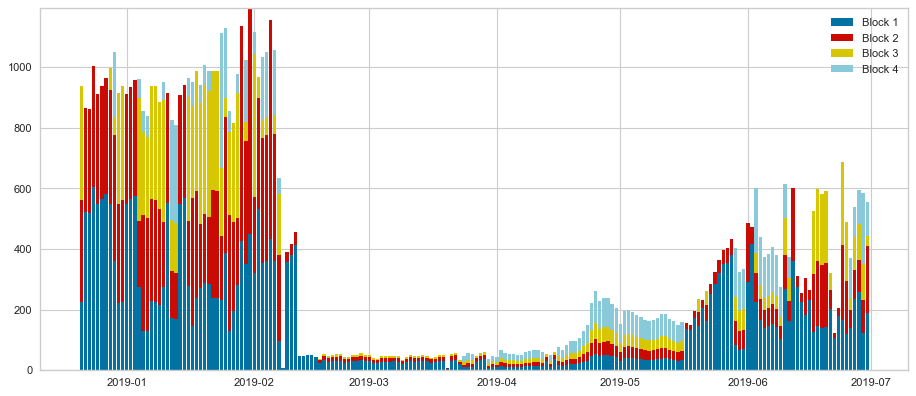

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


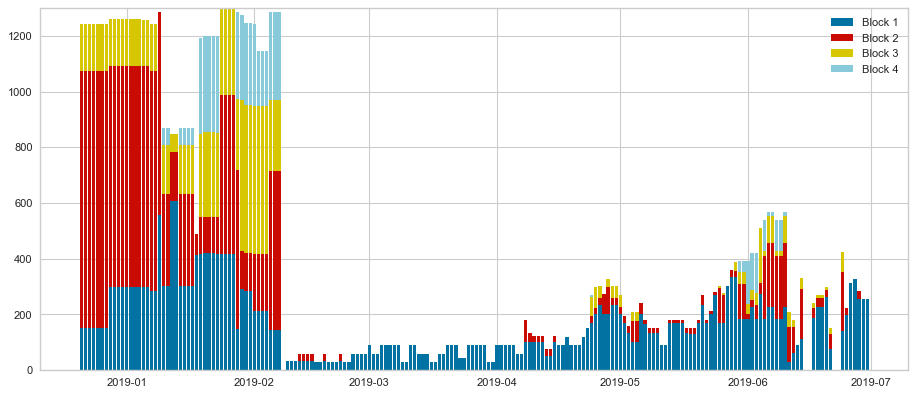

Hourly comparison: prediction vs. actual values
RMSE :13.57
MAE :8.28
R^2 :66.53
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 27 clusters **
Nb of clusters 26
Nb of centers 26, list:[907, 134, 114, 230, 355, 1109, 9, 568, 703, 622, 794, 0, 923, 994, 1745, 1878, 1207, 1278, 1386, 1606, 742, 77, 472, 650, 1775, 1846]
Number of centers: 26
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.15625


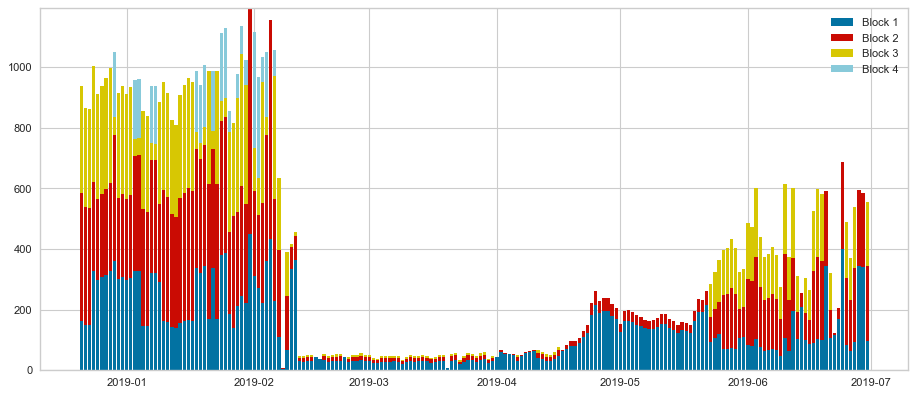

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


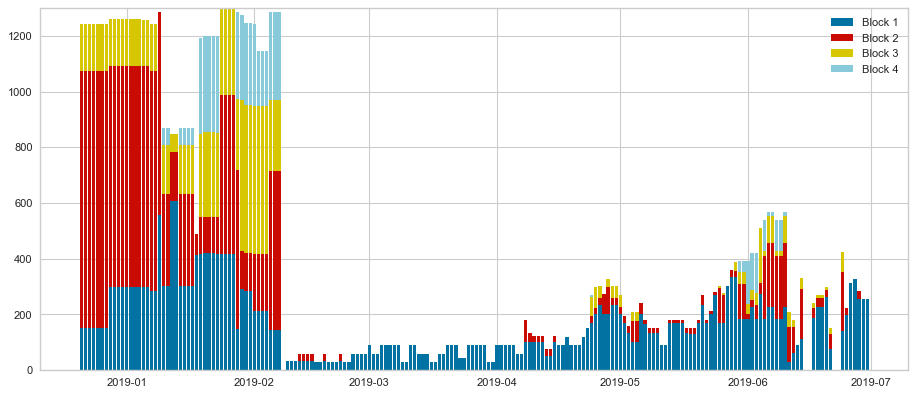

Hourly comparison: prediction vs. actual values
RMSE :13.15
MAE :7.91
R^2 :69.7
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.046875


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


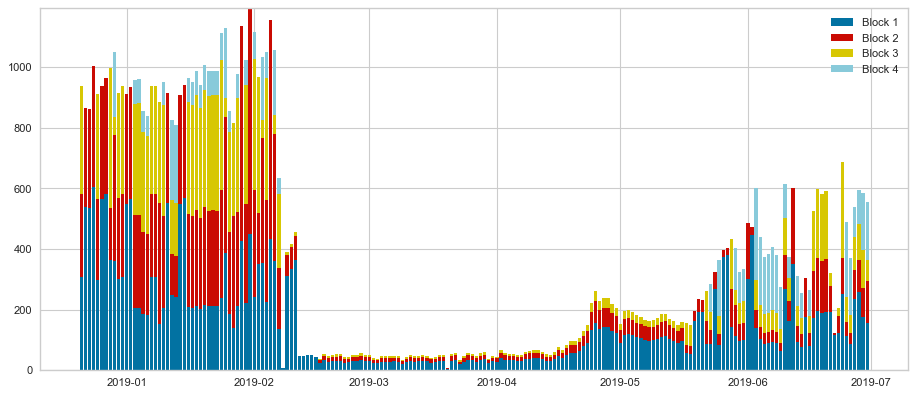

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


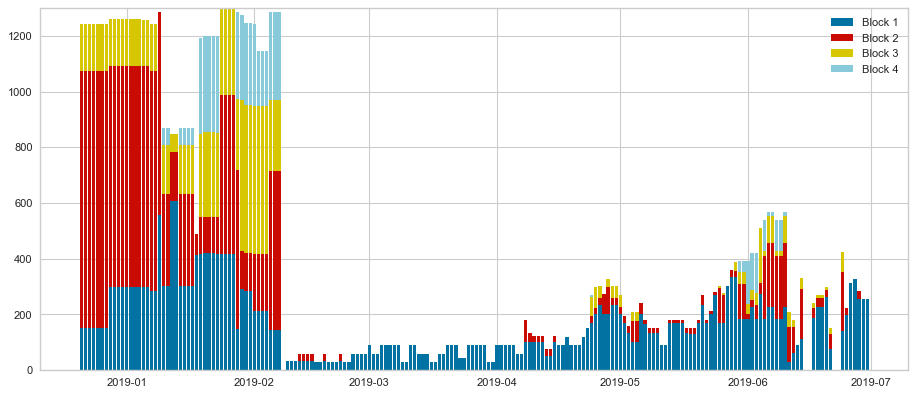

Hourly comparison: prediction vs. actual values
RMSE :12.91
MAE :7.77
R^2 :68.84
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 28 clusters **
Nb of clusters 27
Nb of centers 27, list:[1596, 231, 393, 272, 181, 732, 476, 489, 1070, 1367, 1303, 1204, 884, 952, 1020, 1088, 223, 615, 853, 1386, 1578, 778, 108, 1632, 1719, 668, 15]
Number of centers: 27
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.17708333333333334


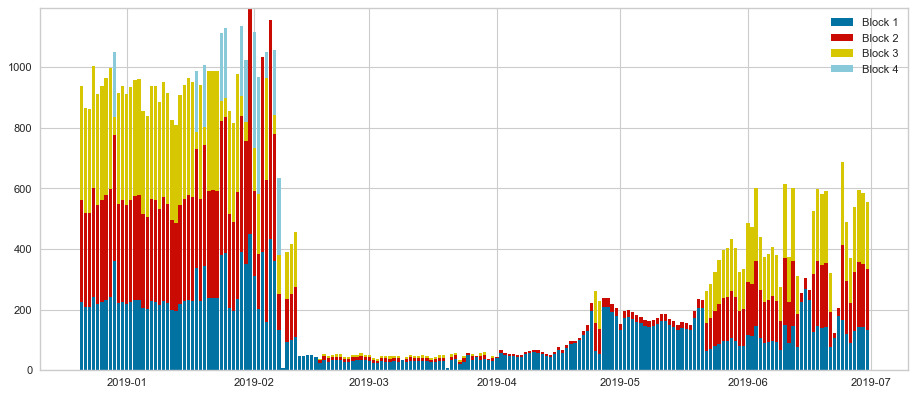

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


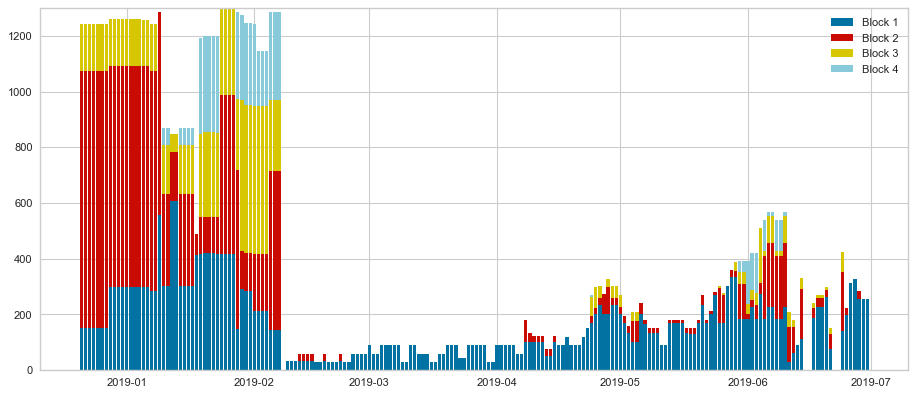

Hourly comparison: prediction vs. actual values
RMSE :13.06
MAE :7.74
R^2 :69.33
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.07291666666666667


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


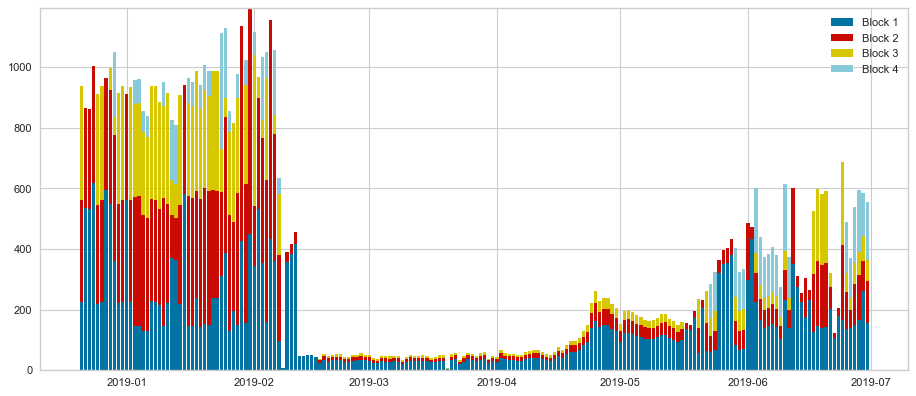

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


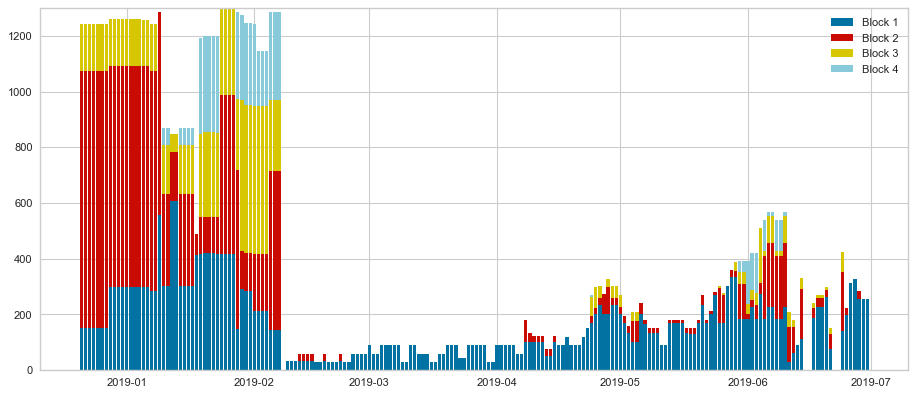

Hourly comparison: prediction vs. actual values
RMSE :13.55
MAE :7.97
R^2 :68.13
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 29 clusters **
Nb of clusters 28
Nb of centers 28, list:[1109, 1732, 356, 230, 497, 395, 907, 531, 367, 660, 181, 778, 622, 924, 742, 1362, 1196, 95, 1084, 1303, 1386, 1435, 1322, 1105, 472, 1719, 1782, 1414]
Number of centers: 28
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.18229166666666666


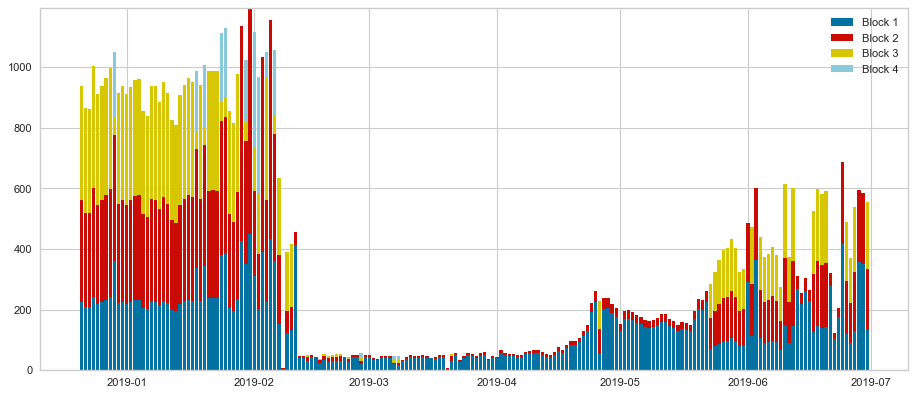

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


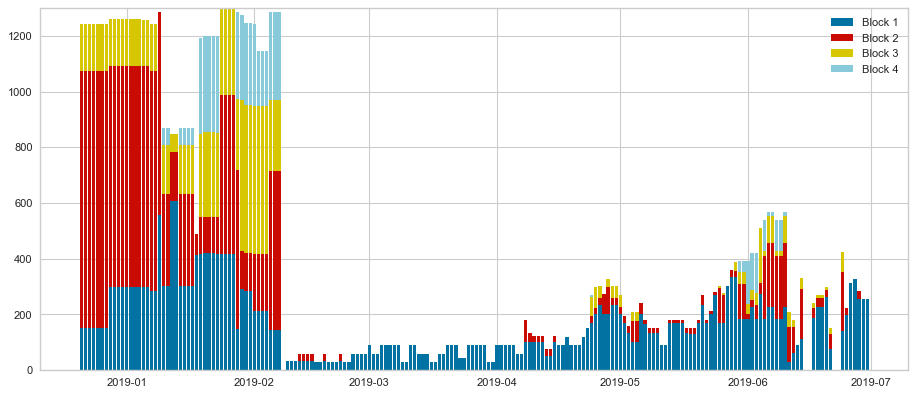

Hourly comparison: prediction vs. actual values
RMSE :13.1
MAE :7.75
R^2 :69.06
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.06770833333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


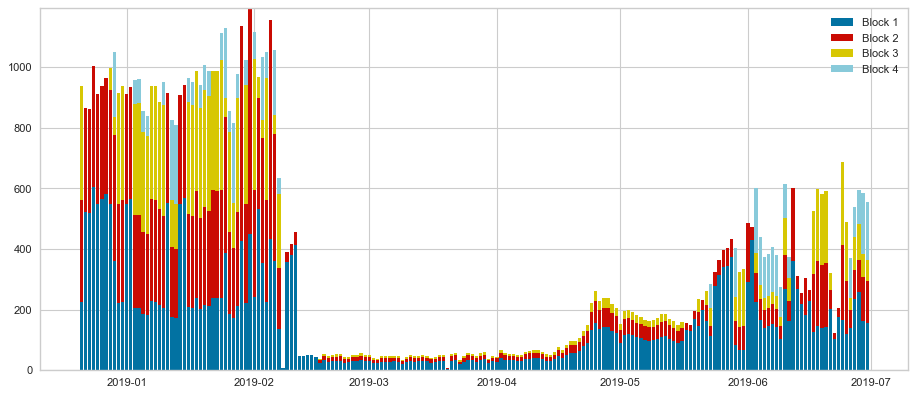

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


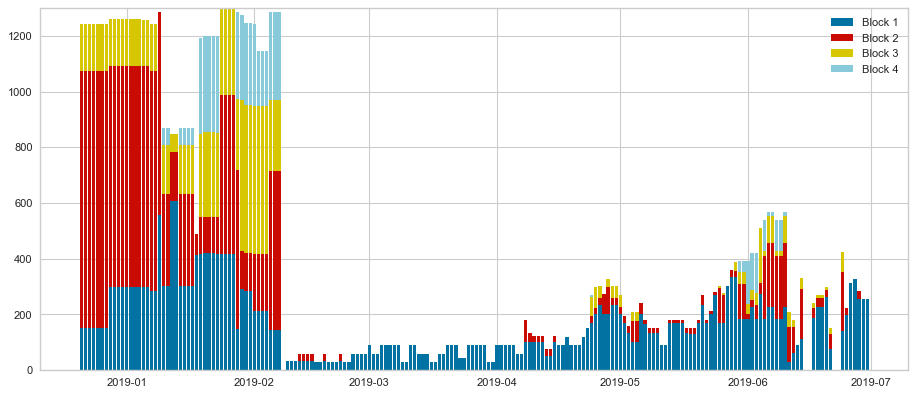

Hourly comparison: prediction vs. actual values
RMSE :13.23
MAE :7.73
R^2 :69.03
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 30 clusters **
Nb of clusters 29
Nb of centers 29, list:[615, 20, 907, 256, 320, 114, 657, 0, 576, 640, 724, 472, 1303, 356, 960, 1239, 9, 742, 1252, 622, 1386, 1109, 753, 778, 1451, 381, 1728, 1792, 108]
Number of centers: 29
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.21354166666666666


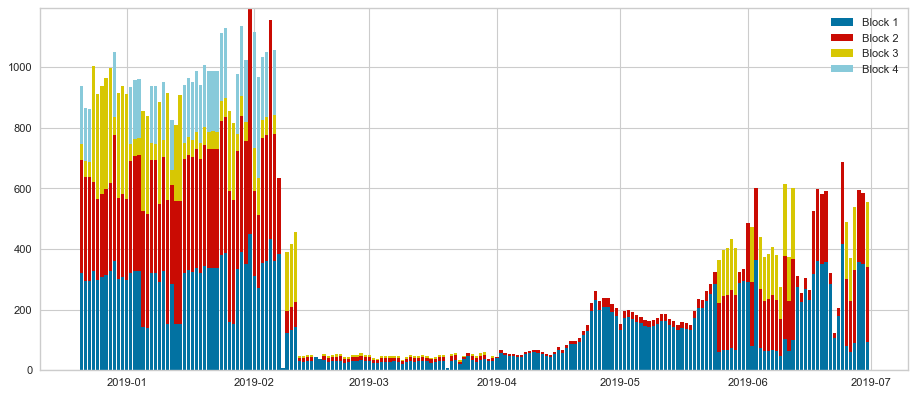

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


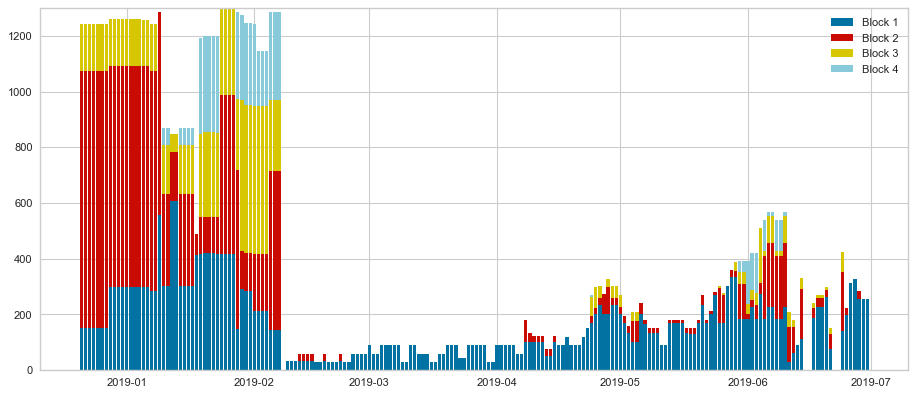

Hourly comparison: prediction vs. actual values
RMSE :13.84
MAE :8.09
R^2 :68.45
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.09895833333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


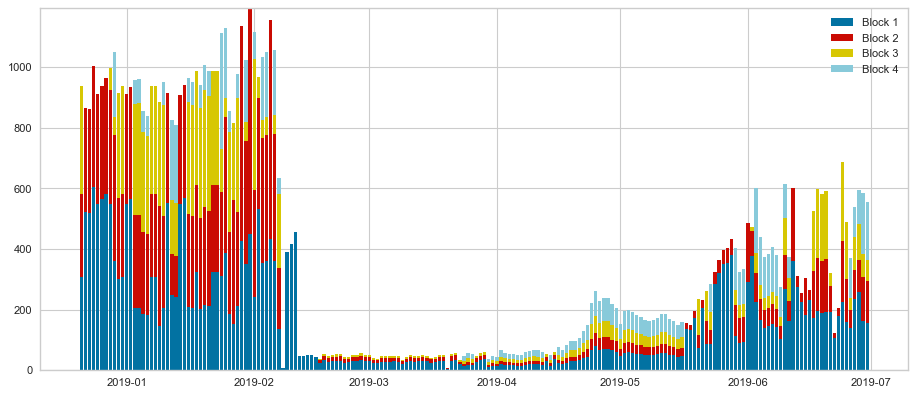

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


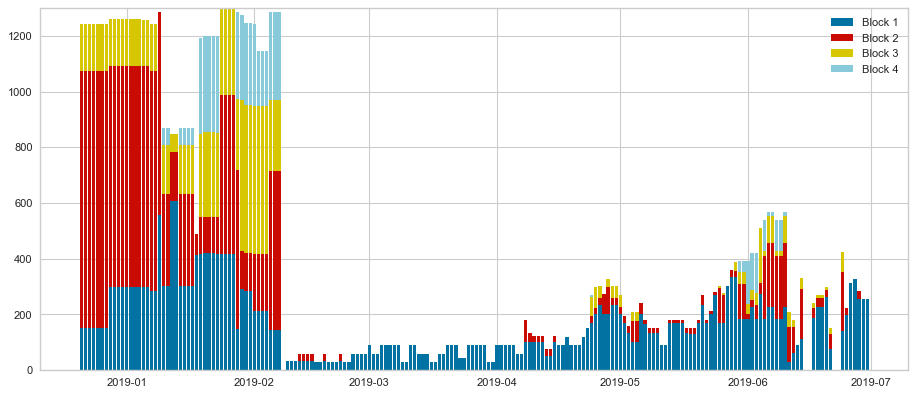

Hourly comparison: prediction vs. actual values
RMSE :13.3
MAE :8.26
R^2 :66.71
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 31 clusters **
Nb of clusters 30
Nb of centers 30, list:[395, 203, 186, 248, 497, 200, 772, 496, 853, 1386, 682, 744, 778, 622, 930, 992, 1054, 515, 1178, 1240, 1303, 1367, 1397, 1252, 1196, 1606, 472, 1736, 1798, 1860]
Number of centers: 30
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.20833333333333334


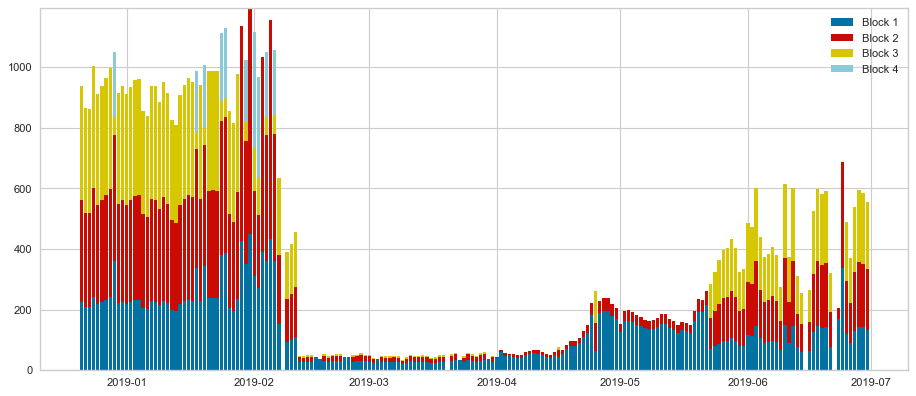

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


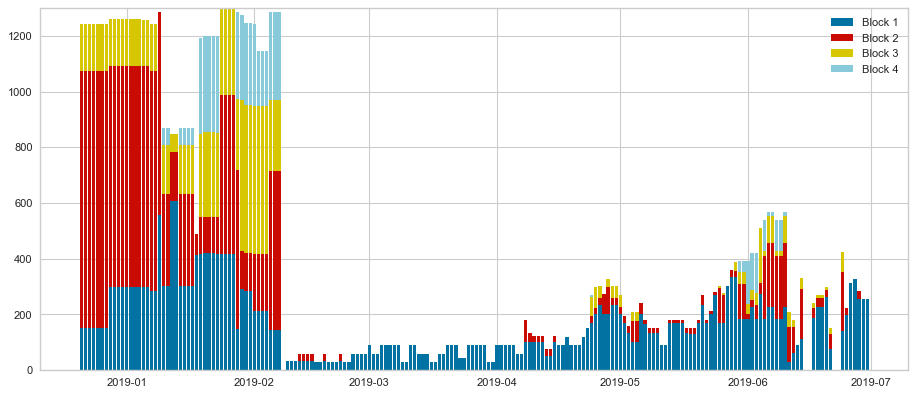

Hourly comparison: prediction vs. actual values
RMSE :12.85
MAE :7.52
R^2 :70.71
Daily comparison (max prod): prediction vs. actual values
RMSE :177.37
MAE :118.72
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.08854166666666667


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


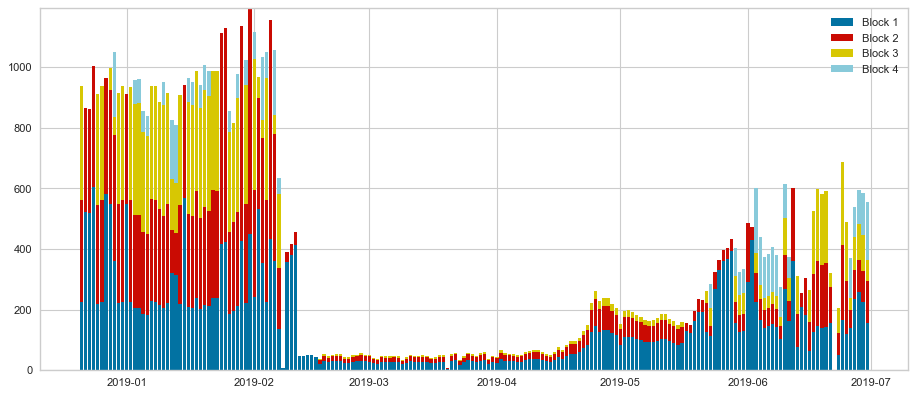

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


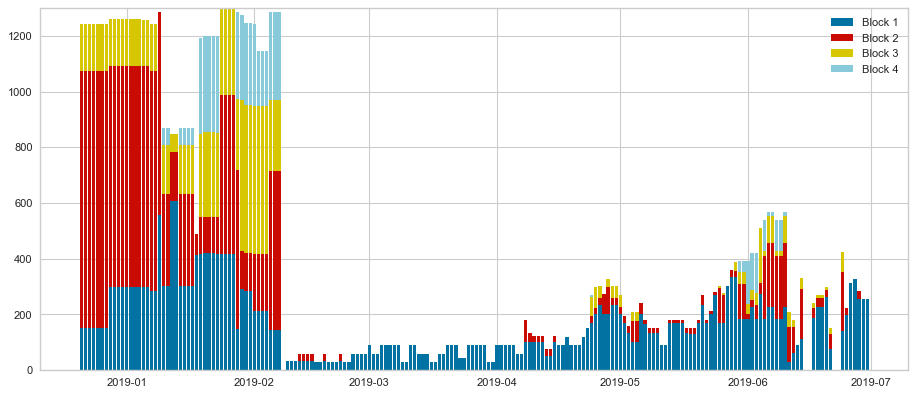

Hourly comparison: prediction vs. actual values
RMSE :13.68
MAE :7.68
R^2 :67.24
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Vector with 32 clusters **
Nb of clusters 31
Nb of centers 31, list:[396, 203, 134, 240, 181, 1362, 1084, 1109, 540, 615, 660, 531, 472, 840, 342, 960, 974, 1070, 459, 1197, 451, 1320, 1386, 1440, 381, 1434, 1590, 917, 1732, 81, 76]
Number of centers: 31
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.11979166666666667


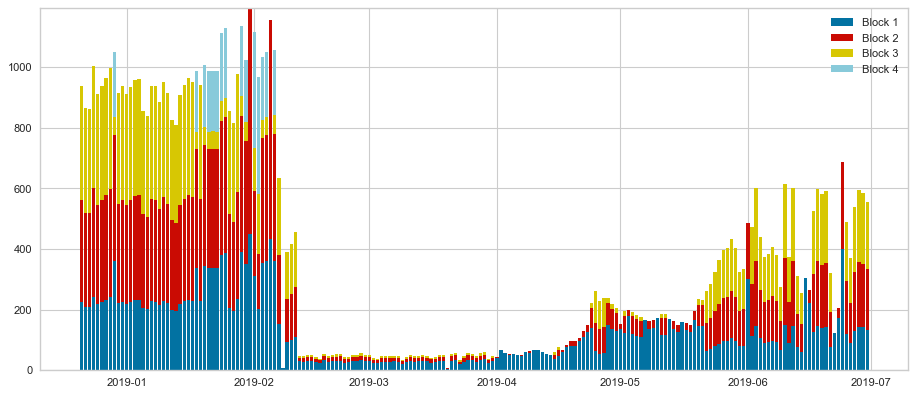

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


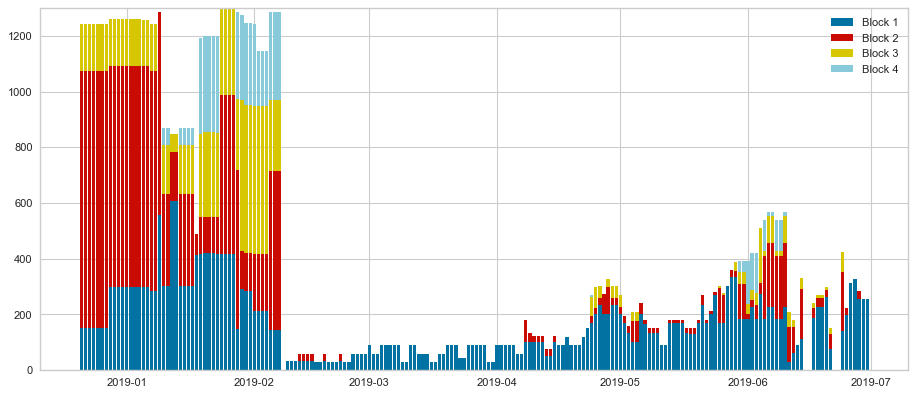

Hourly comparison: prediction vs. actual values
RMSE :13.28
MAE :7.85
R^2 :68.58
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.08333333333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


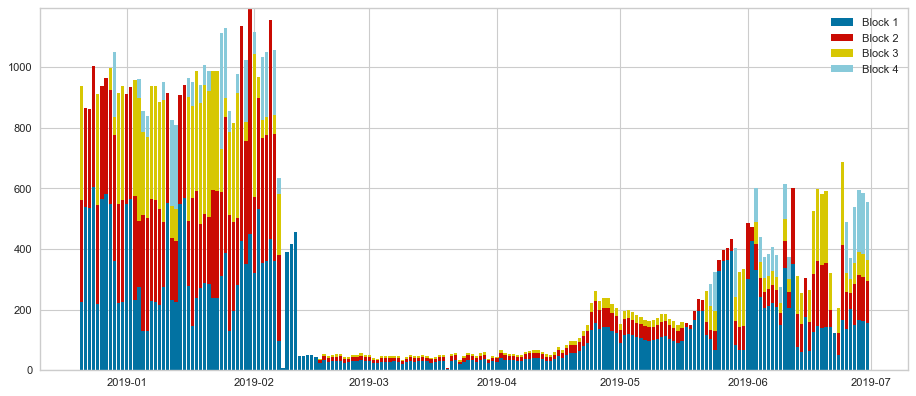

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


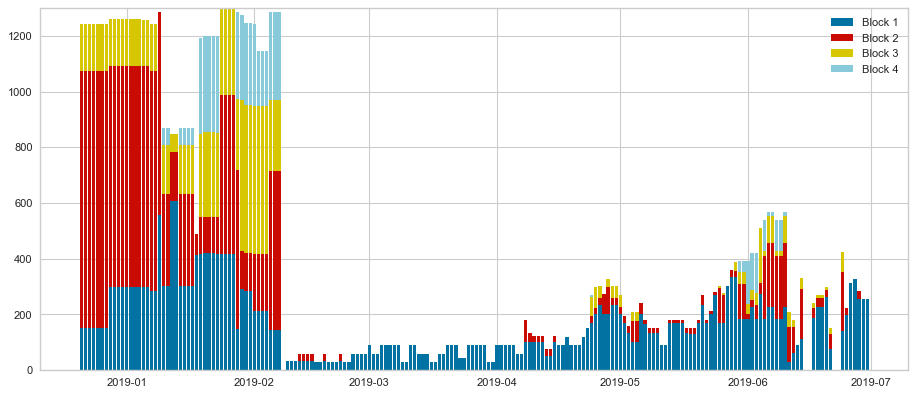

Hourly comparison: prediction vs. actual values
RMSE :12.86
MAE :7.76
R^2 :69.98
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 33 clusters **
Nb of clusters 32
Nb of centers 32, list:[203, 393, 280, 134, 0, 348, 34, 464, 1579, 580, 638, 724, 754, 812, 839, 928, 917, 1070, 778, 1745, 1204, 1276, 1386, 1621, 1450, 472, 1201, 1624, 742, 1303, 1817, 74]
Number of centers: 32
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.11458333333333333


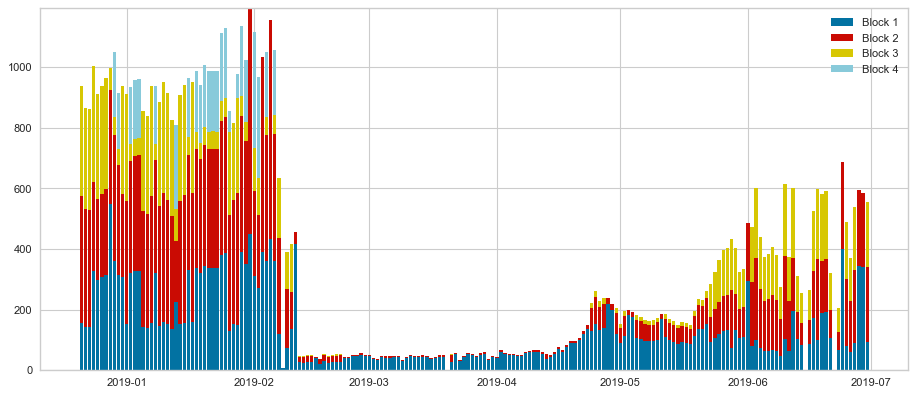

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


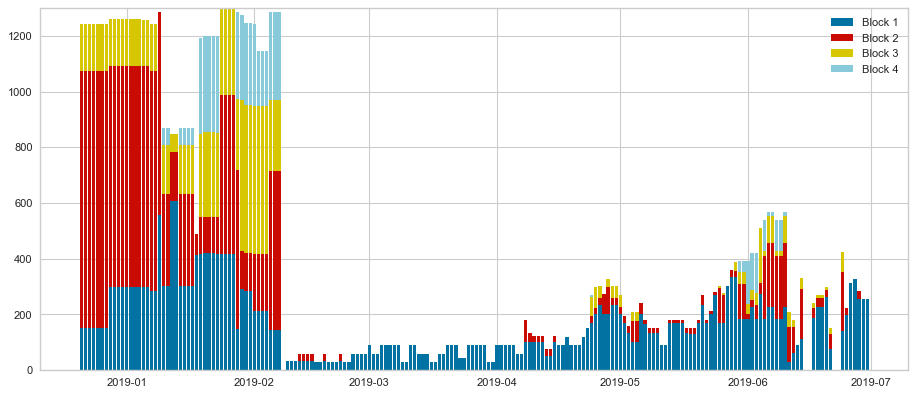

Hourly comparison: prediction vs. actual values
RMSE :13.17
MAE :8.04
R^2 :67.93
Daily comparison (max prod): prediction vs. actual values
RMSE :177.37
MAE :118.76
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.041666666666666664


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


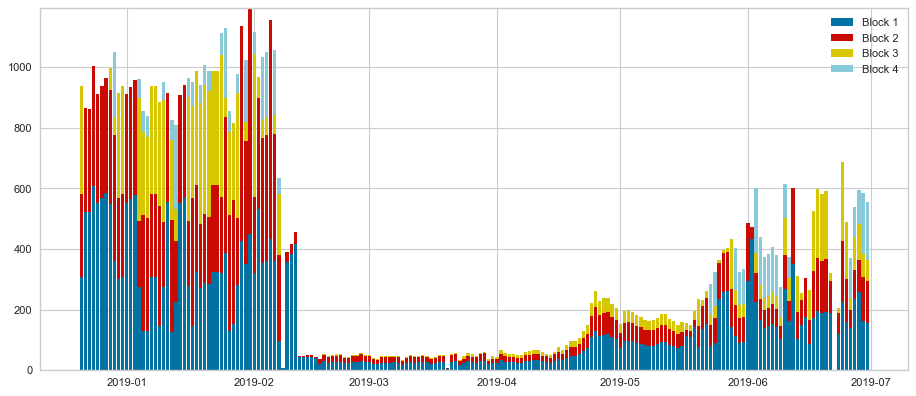

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


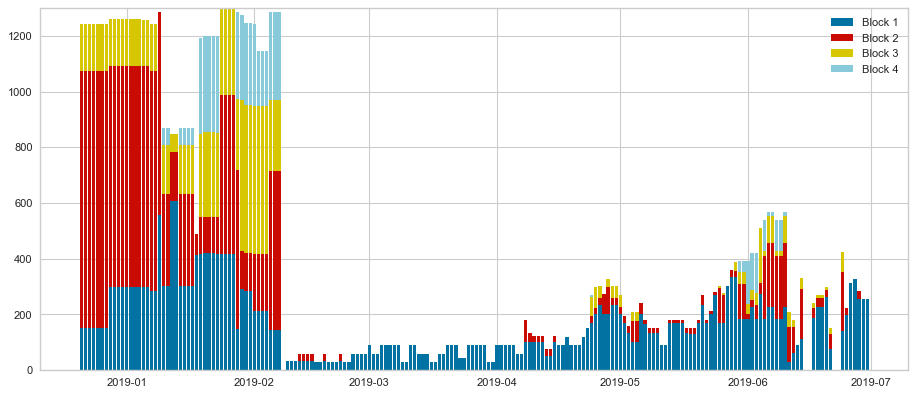

Hourly comparison: prediction vs. actual values
RMSE :13.35
MAE :7.7
R^2 :68.55
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Vector with 34 clusters **
Nb of clusters 33
Nb of centers 33, list:[0, 501, 231, 732, 1014, 336, 393, 692, 472, 560, 616, 668, 356, 1303, 622, 896, 952, 1008, 1745, 1596, 1176, 1219, 1288, 1386, 1400, 1578, 265, 794, 753, 742, 1722, 1397, 81]
Number of centers: 33
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.140625


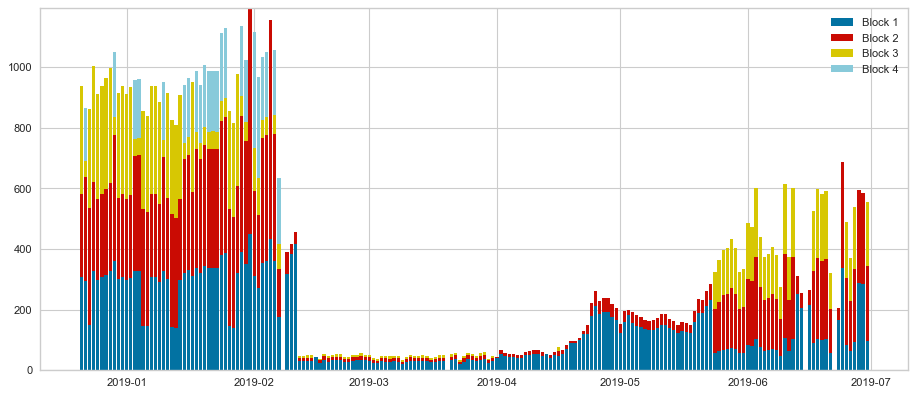

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


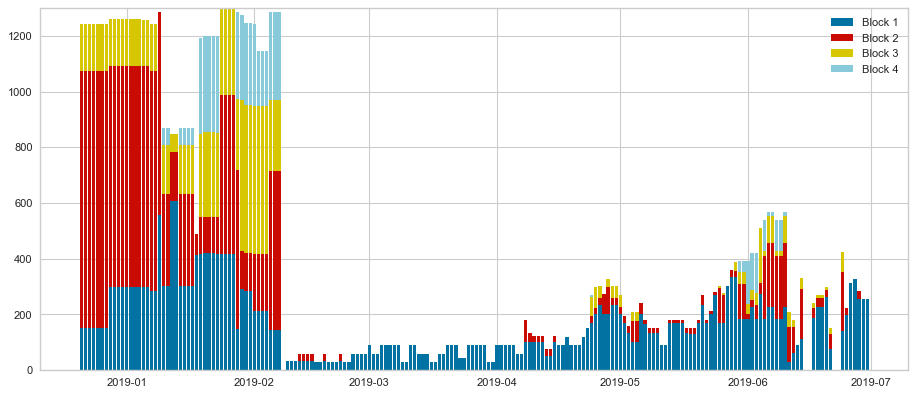

Hourly comparison: prediction vs. actual values
RMSE :13.15
MAE :7.78
R^2 :69.52
Daily comparison (max prod): prediction vs. actual values
RMSE :177.37
MAE :118.72
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.057291666666666664


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


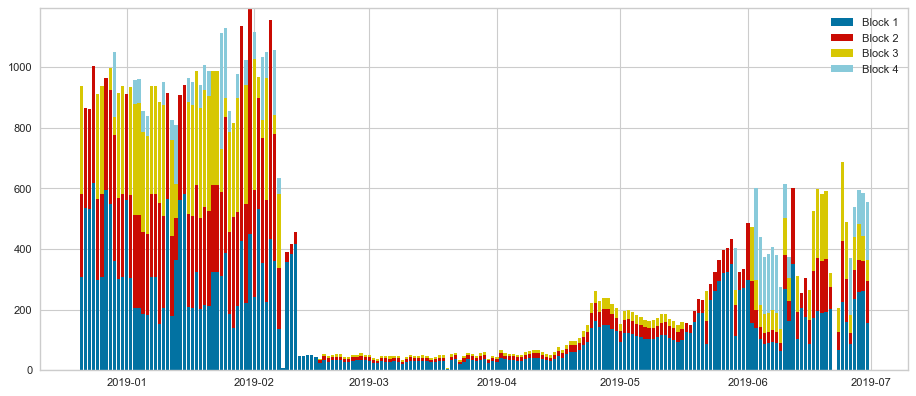

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


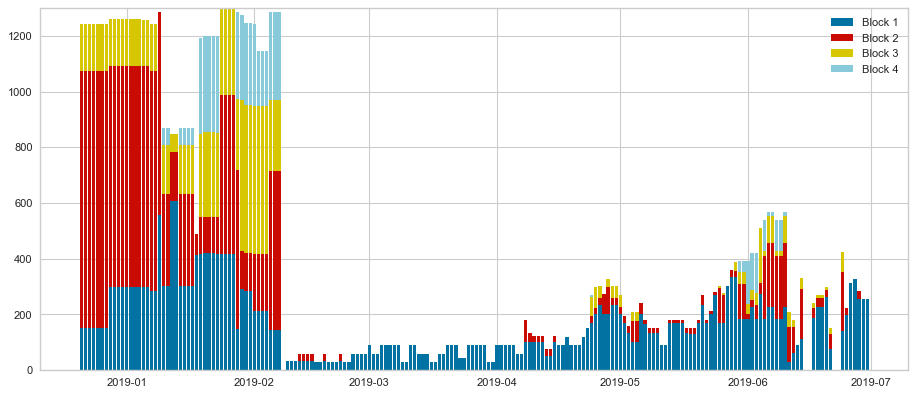

Hourly comparison: prediction vs. actual values
RMSE :12.71
MAE :7.58
R^2 :70.74
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Vector with 35 clusters **
Nb of clusters 34
Nb of centers 34, list:[1190, 508, 181, 1084, 275, 497, 395, 1596, 923, 753, 839, 660, 715, 770, 907, 1386, 230, 990, 1745, 1070, 778, 1210, 1265, 1320, 555, 130, 1521, 1540, 1595, 1630, 1705, 1722, 15, 78]
Number of centers: 34
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.2708333333333333


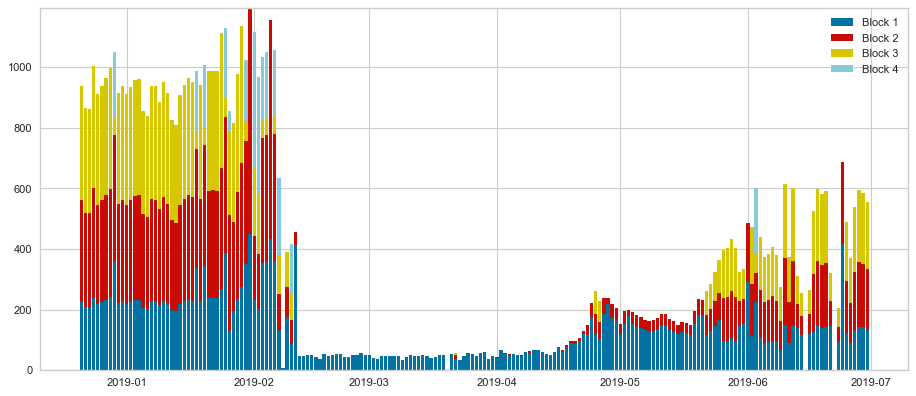

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


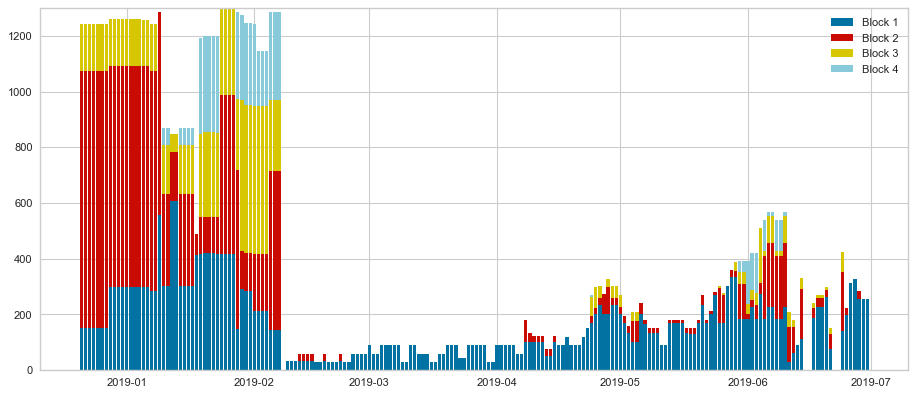

Hourly comparison: prediction vs. actual values
RMSE :12.89
MAE :7.5
R^2 :71.06
Daily comparison (max prod): prediction vs. actual values
RMSE :177.37
MAE :118.76
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.057291666666666664


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


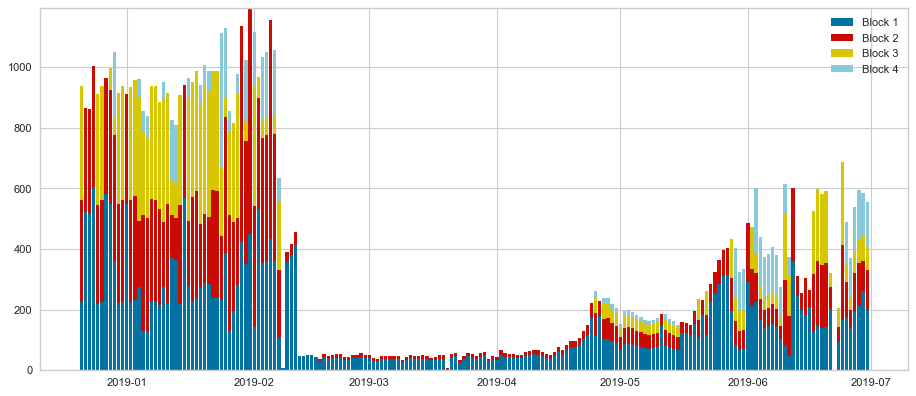

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


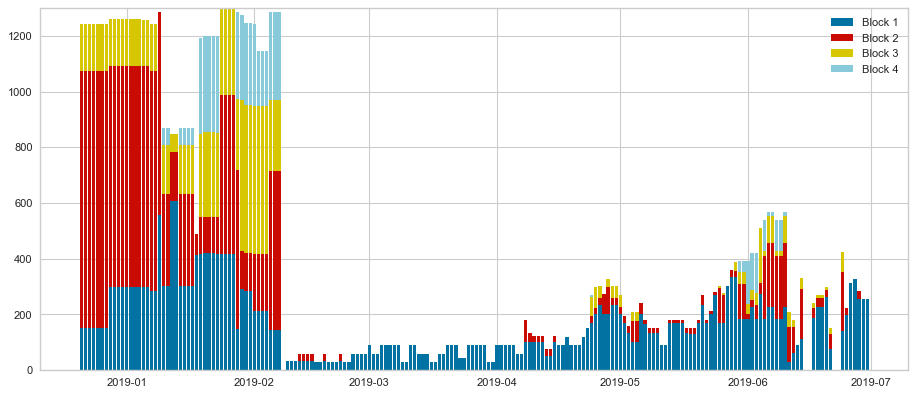

Hourly comparison: prediction vs. actual values
RMSE :13.8
MAE :7.76
R^2 :68.3
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Vector with 36 clusters **
Nb of clusters 35
Nb of centers 35, list:[907, 95, 230, 393, 265, 1732, 1204, 426, 477, 81, 583, 636, 1070, 742, 795, 0, 342, 954, 585, 724, 1113, 1166, 1219, 1273, 1303, 1386, 1838, 839, 753, 1590, 203, 1696, 1749, 15, 1904]
Number of centers: 35
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.22395833333333334


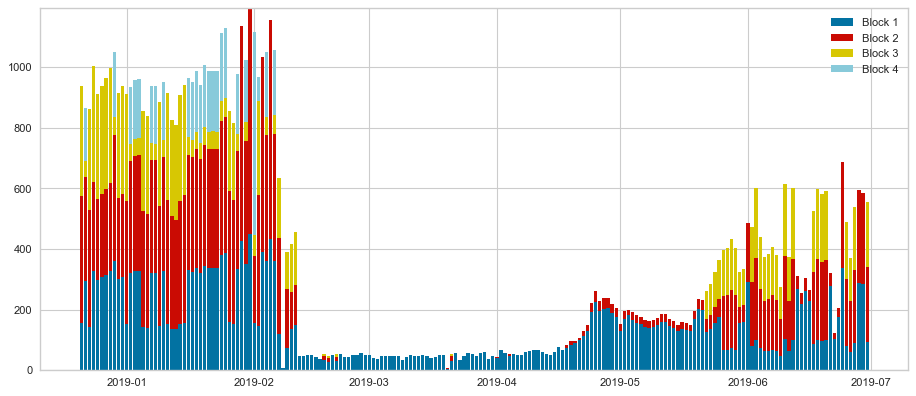

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


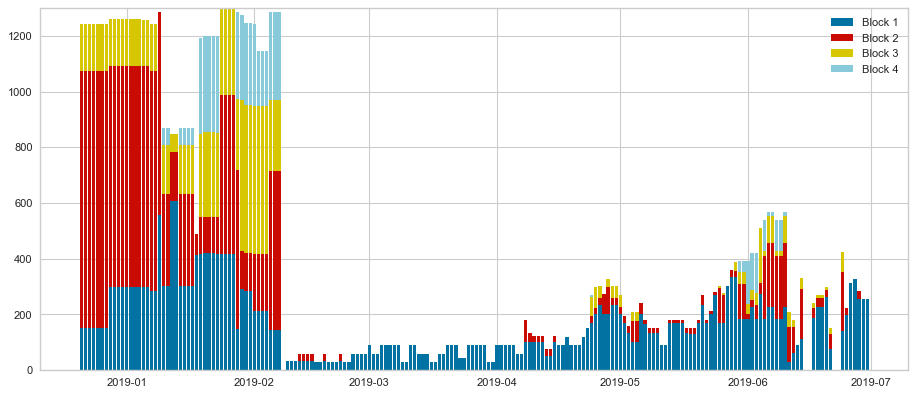

Hourly comparison: prediction vs. actual values
RMSE :13.47
MAE :7.62
R^2 :68.97
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.06770833333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


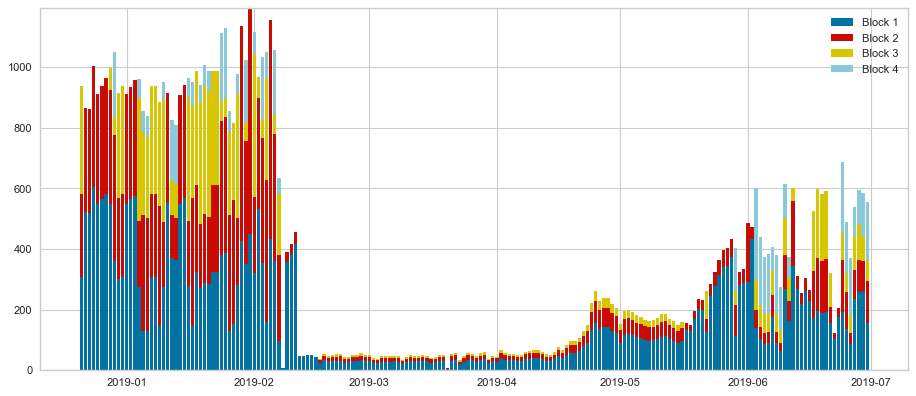

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


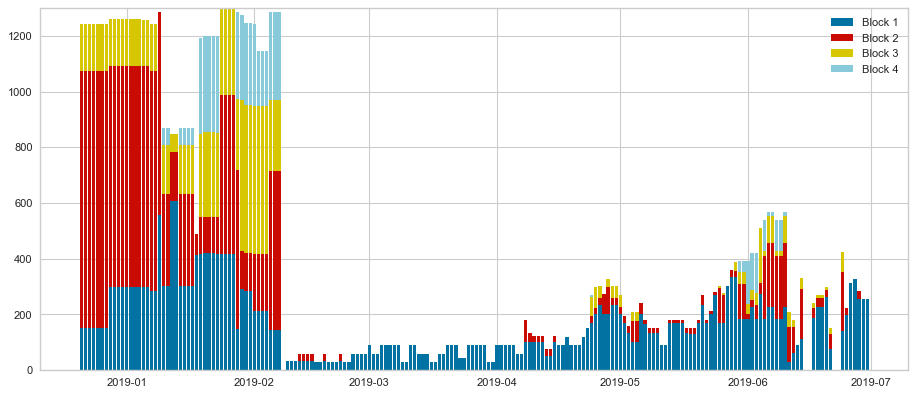

Hourly comparison: prediction vs. actual values
RMSE :13.58
MAE :7.92
R^2 :68.56
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 37 clusters **
Nb of clusters 36
Nb of centers 36, list:[907, 105, 231, 208, 1014, 923, 356, 396, 265, 1109, 572, 1070, 676, 753, 1252, 1303, 839, 342, 742, 181, 1092, 778, 1618, 497, 1732, 1386, 1404, 1435, 1504, 615, 1415, 381, 1719, 657, 1820, 1391]
Number of centers: 36
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.10416666666666667


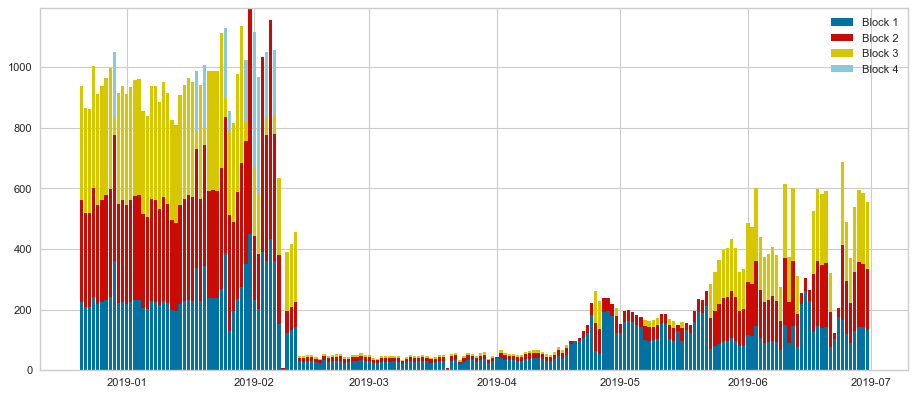

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


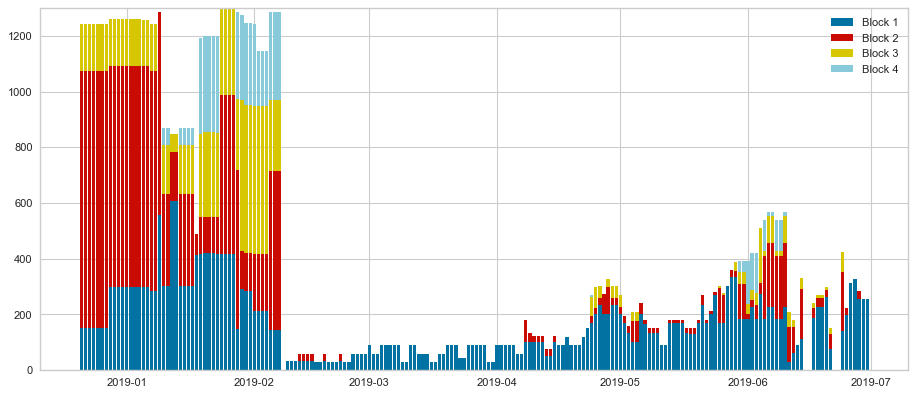

Hourly comparison: prediction vs. actual values
RMSE :13.02
MAE :7.71
R^2 :69.65
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.041666666666666664


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


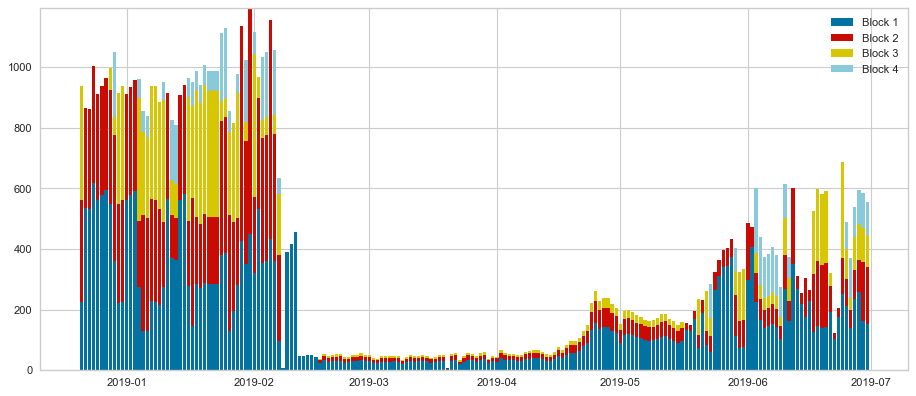

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


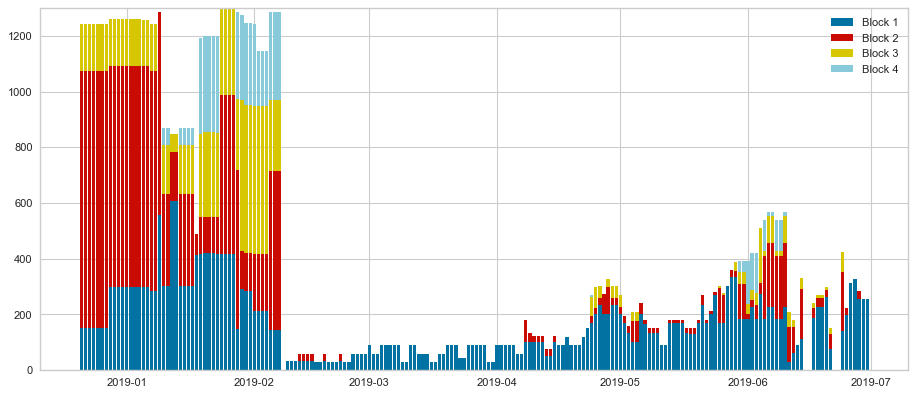

Hourly comparison: prediction vs. actual values
RMSE :13.47
MAE :7.97
R^2 :68.57
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 38 clusters **
Nb of clusters 37
Nb of centers 37, list:[203, 95, 150, 1219, 230, 293, 350, 29, 1109, 468, 1362, 1722, 881, 700, 315, 778, 850, 907, 950, 1000, 657, 1070, 1252, 1618, 1397, 1303, 1386, 356, 1451, 381, 1687, 1600, 641, 1719, 755, 1795, 555]
Number of centers: 37
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.19270833333333334


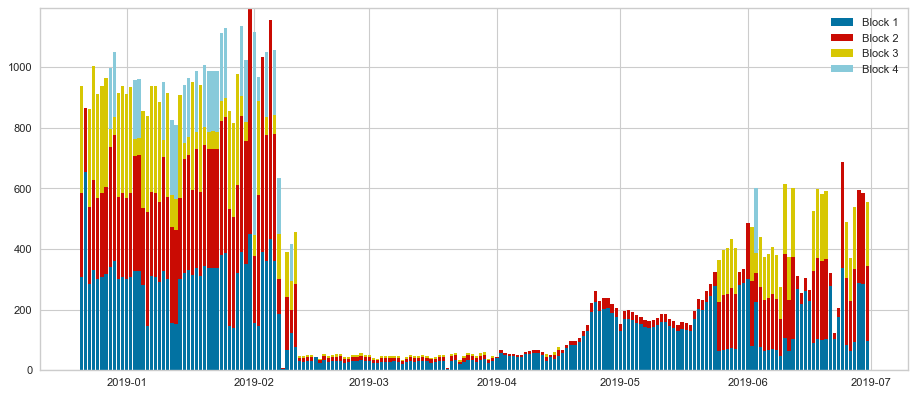

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


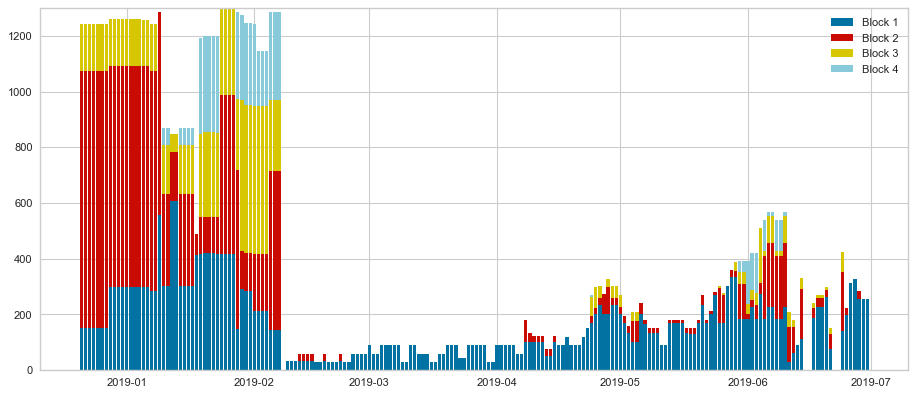

Hourly comparison: prediction vs. actual values
RMSE :13.53
MAE :7.9
R^2 :68.85
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.08854166666666667


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


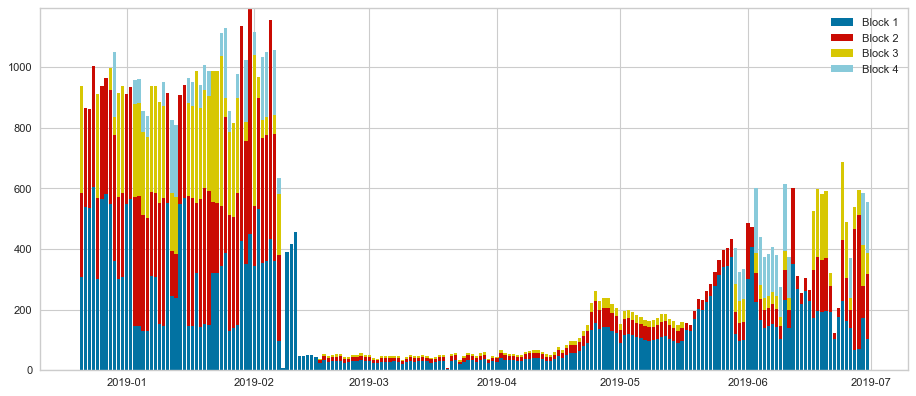

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


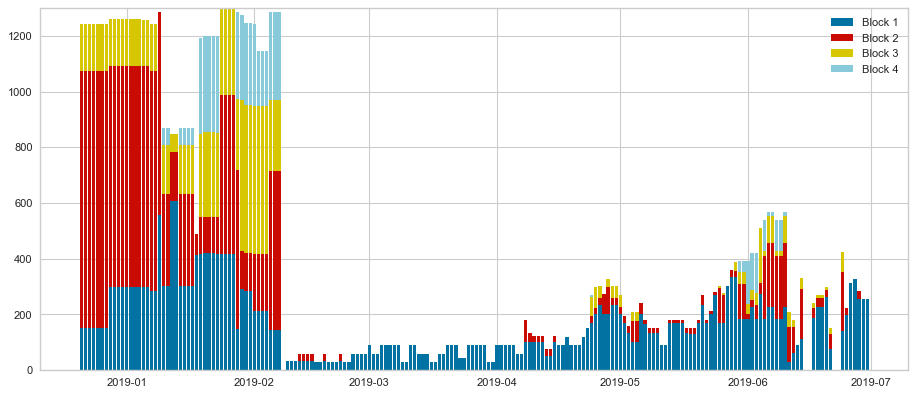

Hourly comparison: prediction vs. actual values
RMSE :13.81
MAE :8.03
R^2 :67.93
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 39 clusters **
Nb of clusters 38
Nb of centers 38, list:[203, 98, 147, 1192, 245, 0, 343, 29, 441, 497, 1618, 1759, 692, 657, 907, 784, 1303, 882, 1722, 980, 315, 1070, 377, 1176, 1348, 1252, 755, 1362, 1451, 1744, 1521, 778, 1109, 1666, 1719, 1767, 1813, 95]
Number of centers: 38
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.234375


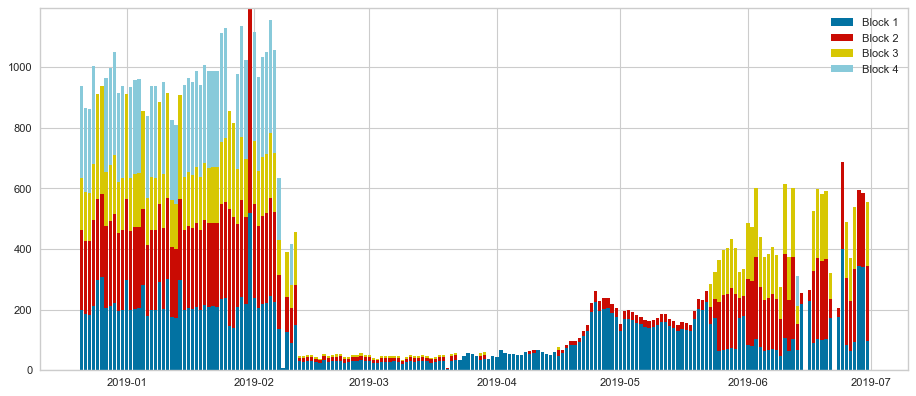

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


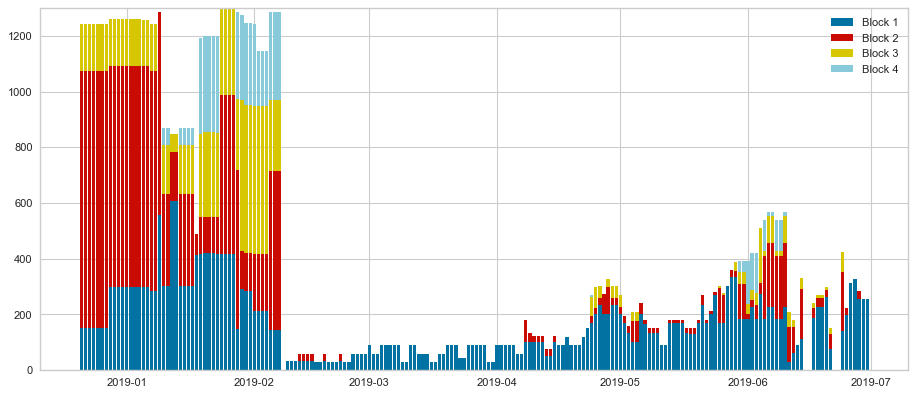

Hourly comparison: prediction vs. actual values
RMSE :13.94
MAE :7.87
R^2 :68.7
Daily comparison (max prod): prediction vs. actual values
RMSE :177.35
MAE :118.72
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.06770833333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


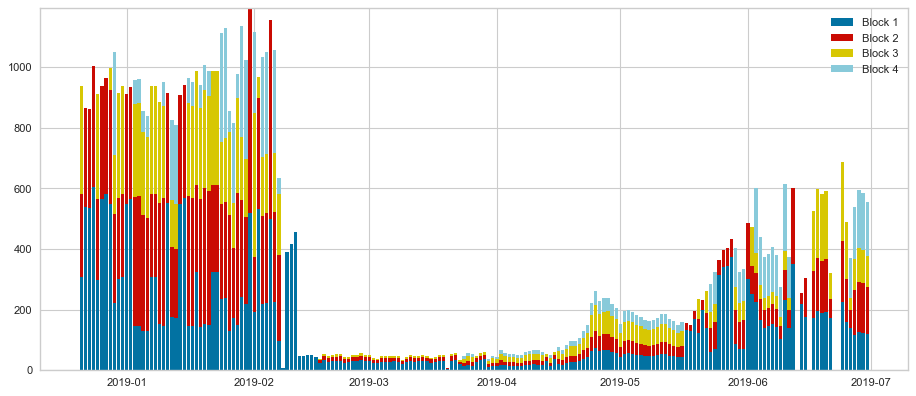

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


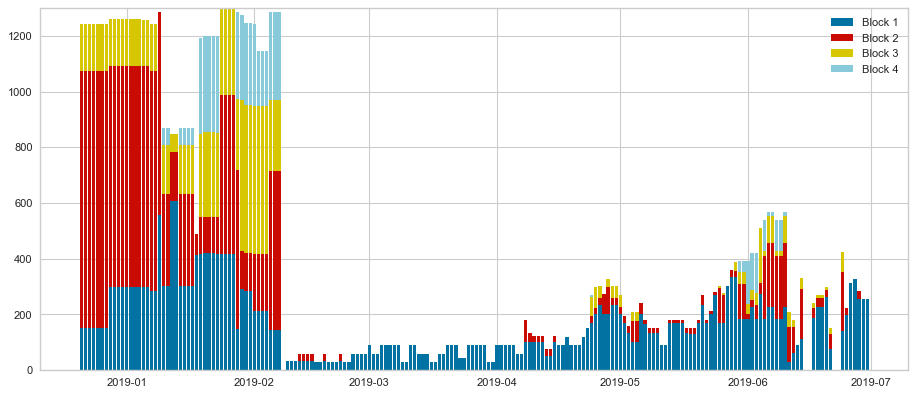

Hourly comparison: prediction vs. actual values
RMSE :12.98
MAE :7.52
R^2 :70.44
Daily comparison (max prod): prediction vs. actual values
RMSE :176.45
MAE :117.17
R^2 :85.41
************************************
** clustering Vector with 40 clusters **
Nb of clusters 39
Nb of centers 39, list:[203, 1414, 144, 615, 250, 293, 692, 393, 95, 480, 489, 1362, 624, 668, 531, 472, 265, 864, 912, 960, 1303, 657, 1665, 1154, 1618, 497, 315, 1348, 1621, 1440, 1252, 1536, 1105, 1632, 1261, 1728, 1776, 1824, 1451]
Number of centers: 39
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.19791666666666666


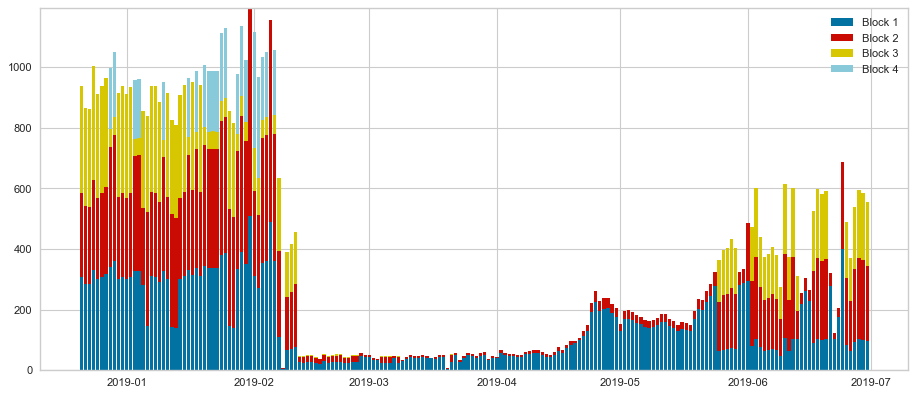

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


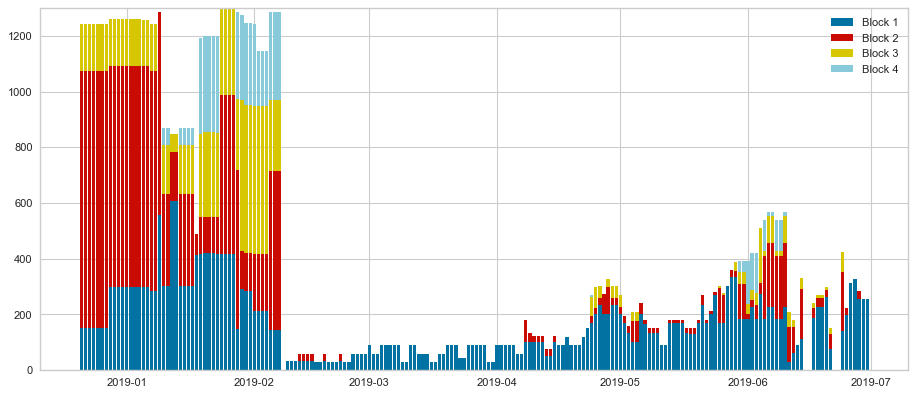

Hourly comparison: prediction vs. actual values
RMSE :13.53
MAE :7.97
R^2 :69.36
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.06770833333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


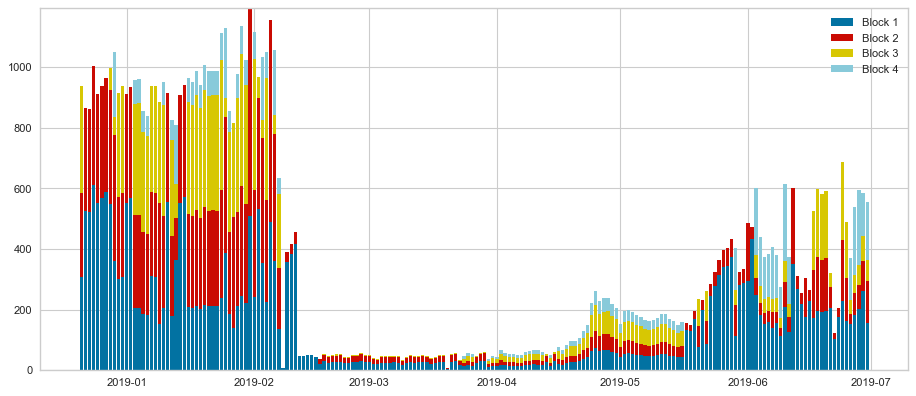

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


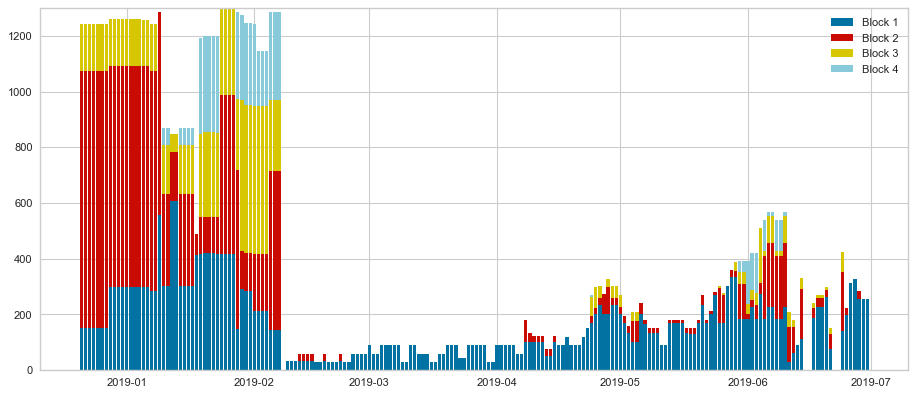

Hourly comparison: prediction vs. actual values
RMSE :12.69
MAE :7.37
R^2 :70.71
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 41 clusters **
Nb of clusters 40
Nb of centers 40, list:[1414, 76, 141, 188, 235, 974, 329, 342, 1618, 480, 367, 1386, 611, 658, 692, 1303, 794, 0, 893, 940, 1745, 1034, 1081, 395, 335, 1222, 1252, 742, 1363, 1105, 1435, 1504, 1084, 1621, 489, 1692, 1722, 1786, 615, 95]
Number of centers: 40
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.15104166666666666


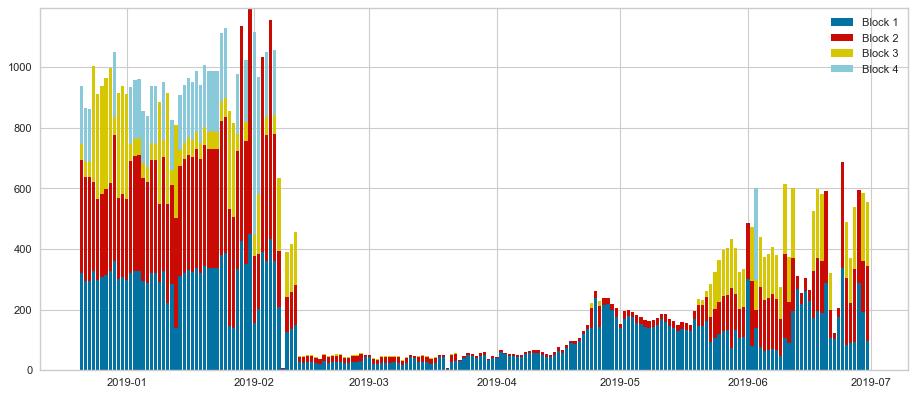

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


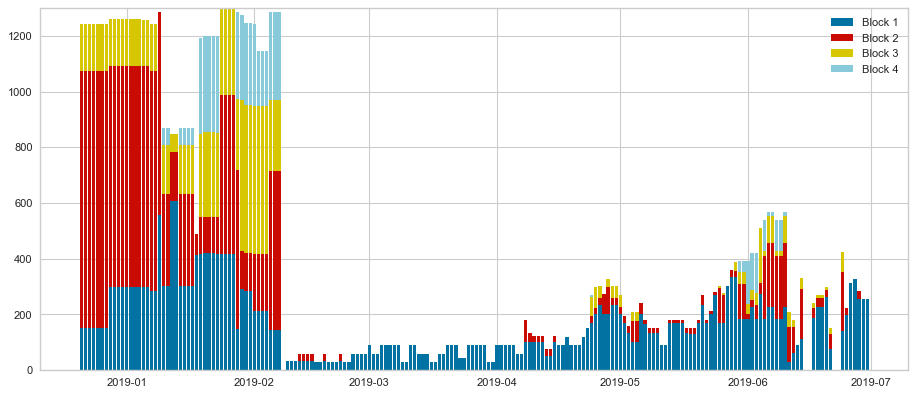

Hourly comparison: prediction vs. actual values
RMSE :13.46
MAE :7.91
R^2 :67.38
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.08854166666666667


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


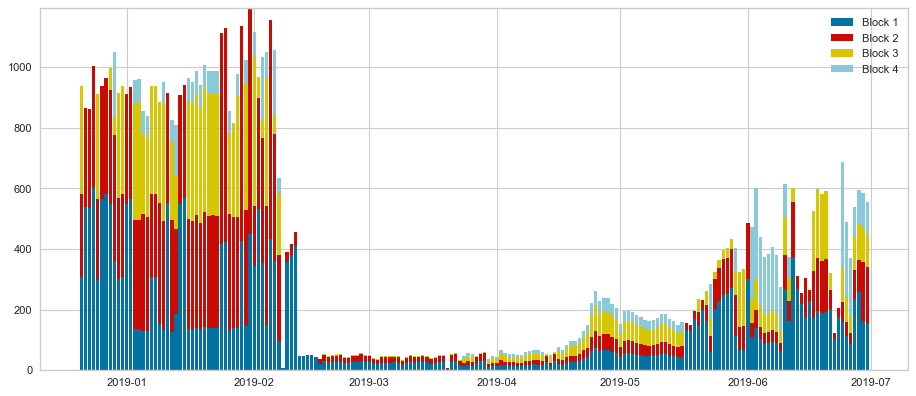

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


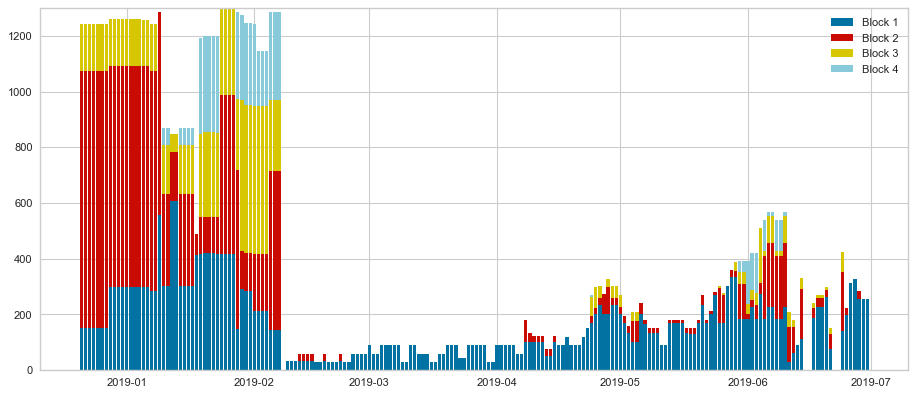

Hourly comparison: prediction vs. actual values
RMSE :12.22
MAE :7.05
R^2 :71.37
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 42 clusters **
Nb of clusters 41
Nb of centers 41, list:[1795, 20, 138, 0, 280, 772, 322, 1621, 395, 1596, 1084, 555, 1722, 356, 657, 732, 794, 204, 342, 742, 966, 1303, 692, 1665, 690, 1618, 1242, 1288, 1348, 1744, 1397, 753, 1745, 1545, 1451, 1656, 622, 1748, 1794, 95, 1252]
Number of centers: 41
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.16145833333333334


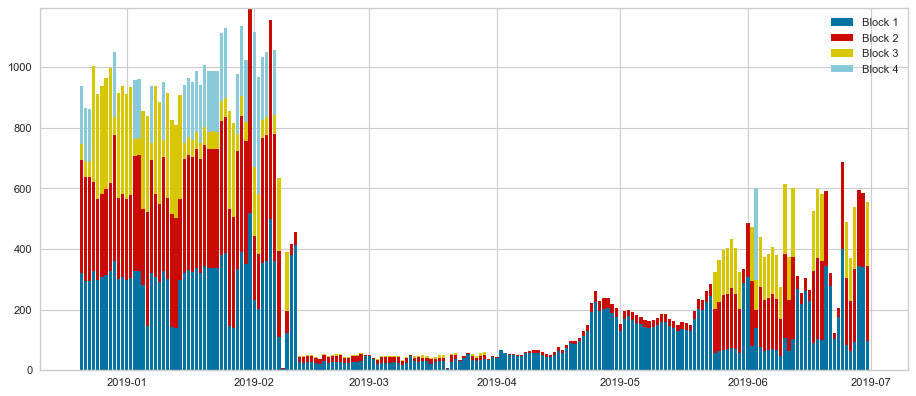

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


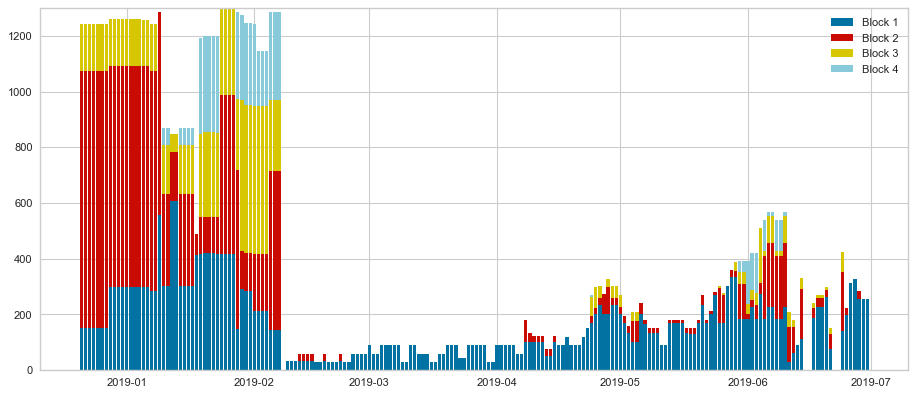

Hourly comparison: prediction vs. actual values
RMSE :13.67
MAE :7.96
R^2 :68.73
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.046875


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


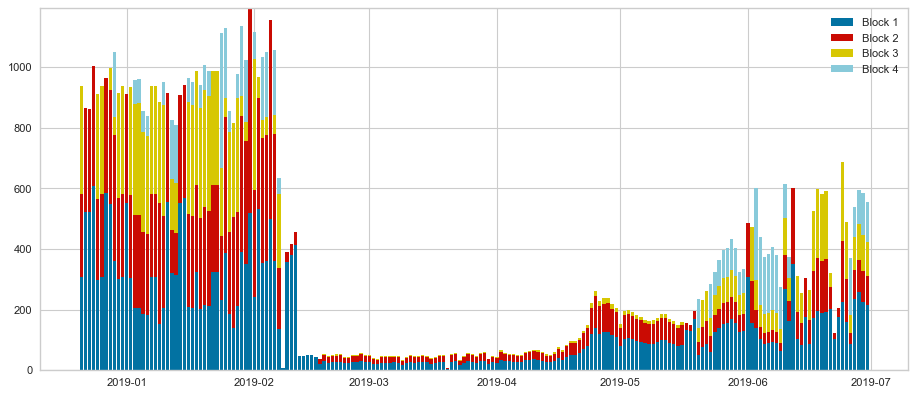

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


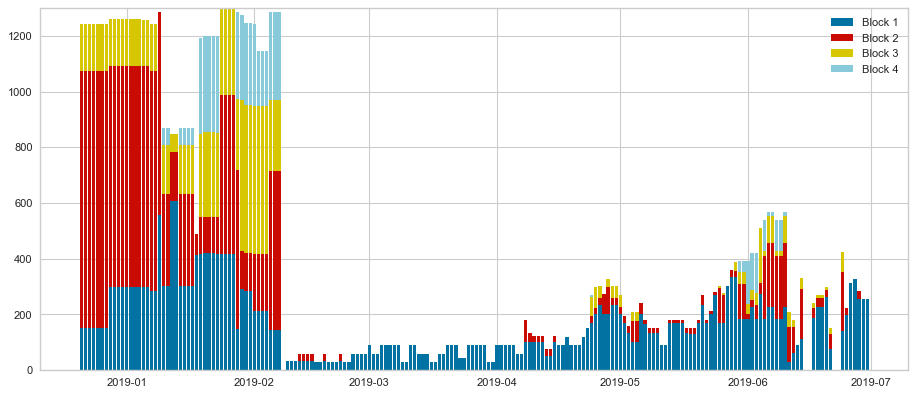

Hourly comparison: prediction vs. actual values
RMSE :14.04
MAE :7.95
R^2 :66.86
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 43 clusters **
Nb of clusters 42
Nb of centers 42, list:[732, 95, 772, 230, 29, 270, 315, 360, 405, 1187, 497, 531, 1759, 181, 675, 657, 472, 778, 855, 342, 945, 990, 1362, 1070, 377, 615, 1204, 1260, 1305, 1350, 1395, 1440, 1745, 1527, 1109, 1618, 1665, 1722, 742, 1800, 1845, 555]
Number of centers: 42
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.1875


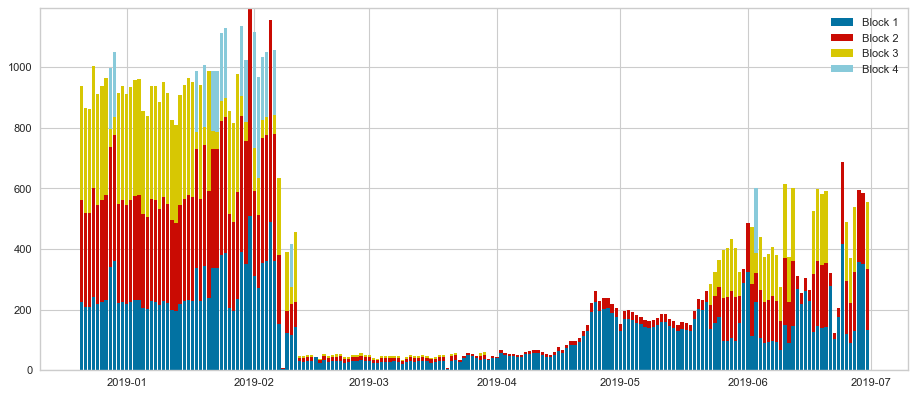

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


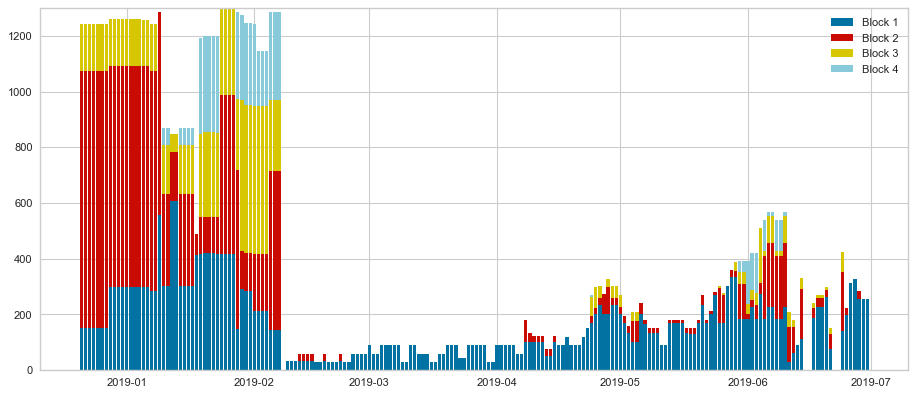

Hourly comparison: prediction vs. actual values
RMSE :13.18
MAE :7.69
R^2 :70.28
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.08333333333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


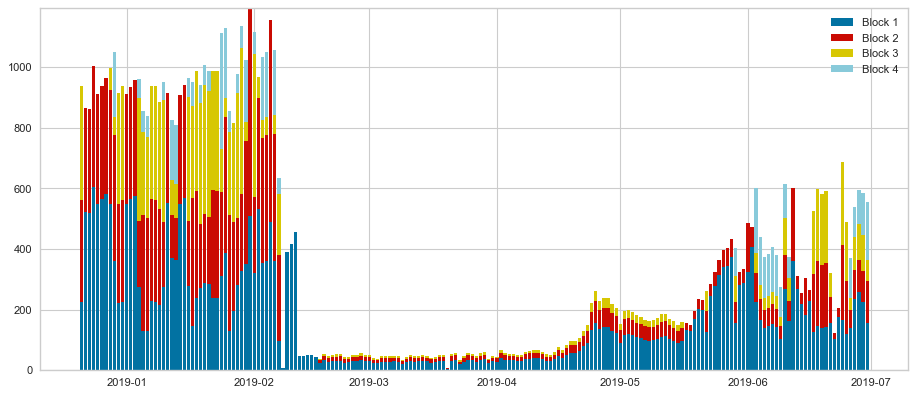

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


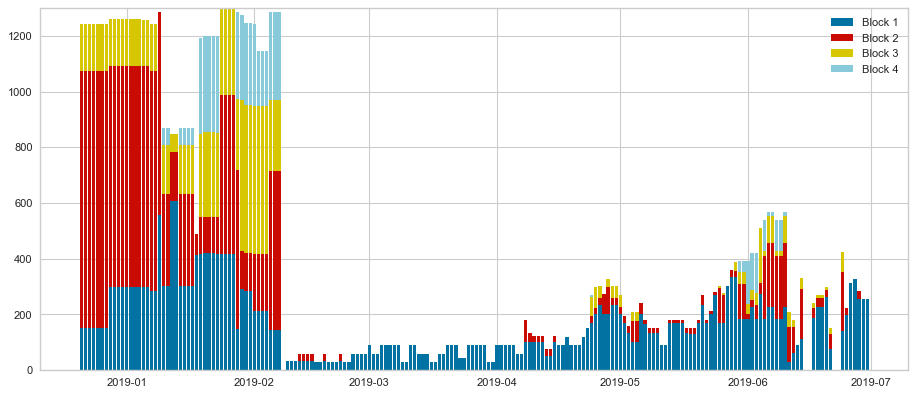

Hourly comparison: prediction vs. actual values
RMSE :13.54
MAE :7.94
R^2 :69.14
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 44 clusters **
Nb of clusters 43
Nb of centers 43, list:[734, 95, 335, 231, 1084, 1014, 1630, 352, 396, 1109, 381, 489, 572, 616, 678, 181, 748, 778, 853, 907, 924, 968, 1012, 1056, 622, 265, 1188, 1386, 1252, 1320, 1367, 66, 1446, 742, 1540, 1105, 130, 1525, 1719, 315, 1804, 1795, 1722]
Number of centers: 43
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.13541666666666666


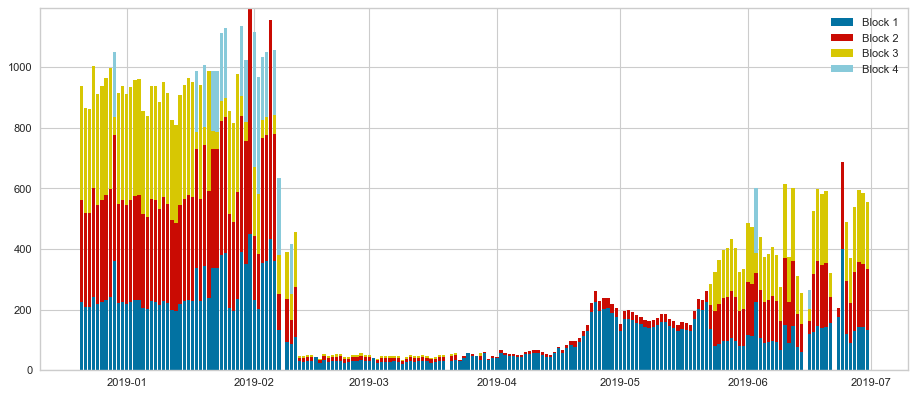

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


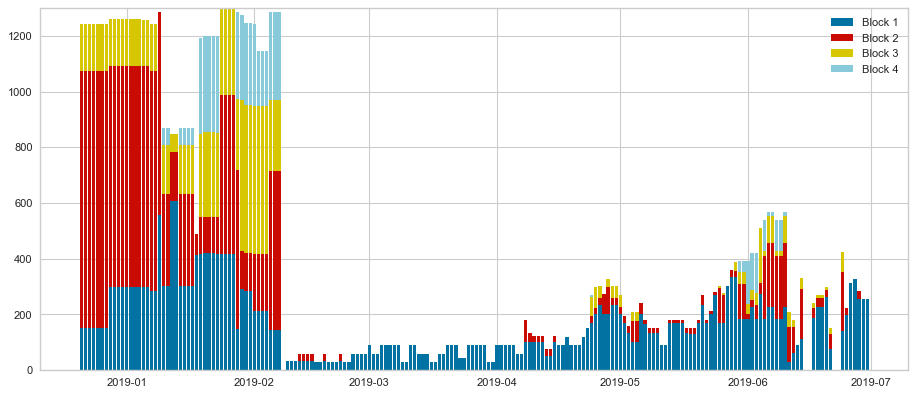

Hourly comparison: prediction vs. actual values
RMSE :12.81
MAE :7.53
R^2 :71.22
Daily comparison (max prod): prediction vs. actual values
RMSE :177.37
MAE :118.72
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.06770833333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


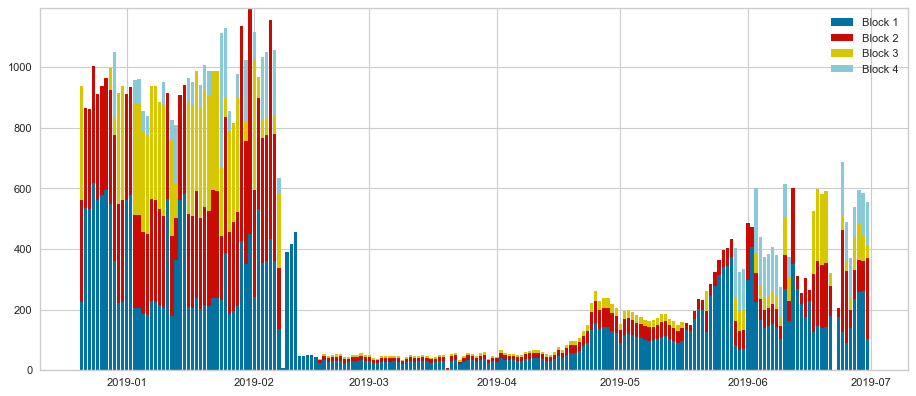

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


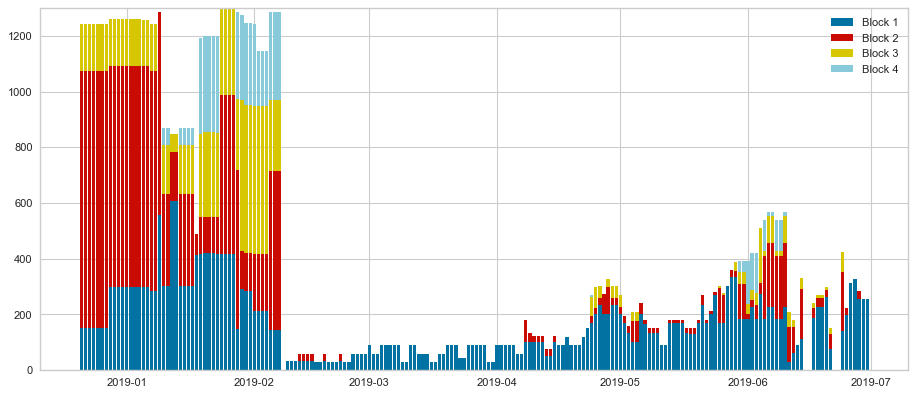

Hourly comparison: prediction vs. actual values
RMSE :13.33
MAE :7.78
R^2 :69.37
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Vector with 45 clusters **
Nb of clusters 44
Nb of centers 44, list:[34, 1556, 20, 231, 215, 1014, 293, 344, 393, 95, 480, 1105, 559, 839, 692, 690, 356, 9, 472, 860, 1722, 946, 742, 315, 1070, 1778, 555, 1204, 1247, 1473, 1386, 1376, 1397, 1451, 1504, 1548, 1591, 1634, 778, 1656, 1714, 1414, 657, 1303]
Number of centers: 44
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.20833333333333334


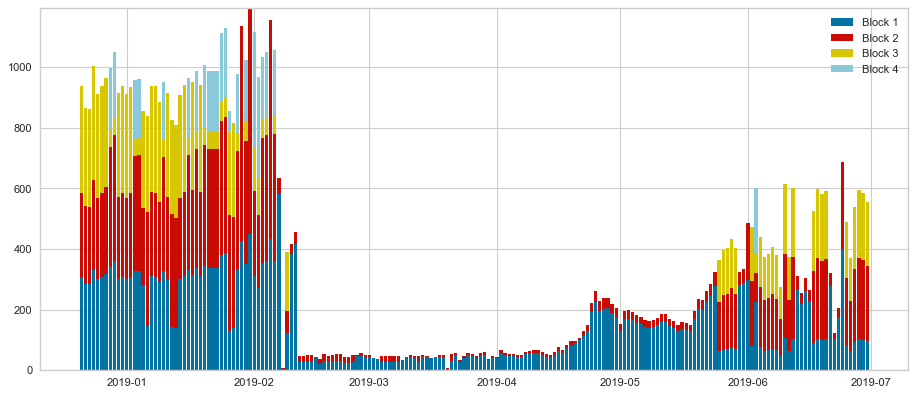

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


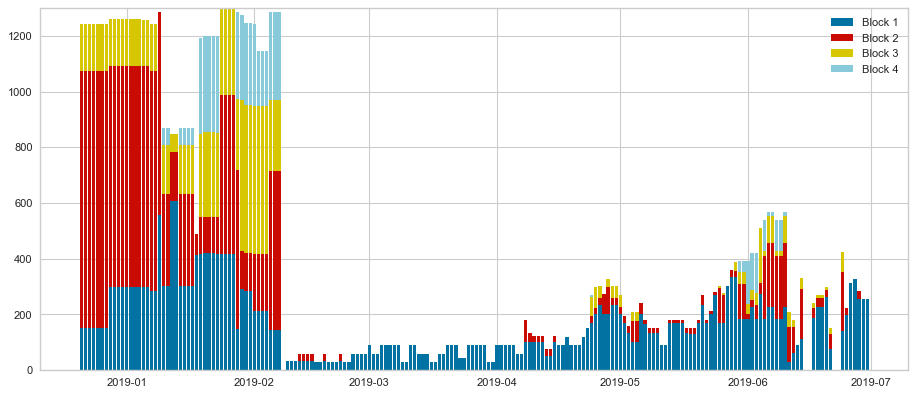

Hourly comparison: prediction vs. actual values
RMSE :13.49
MAE :7.88
R^2 :69.35
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.09375


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


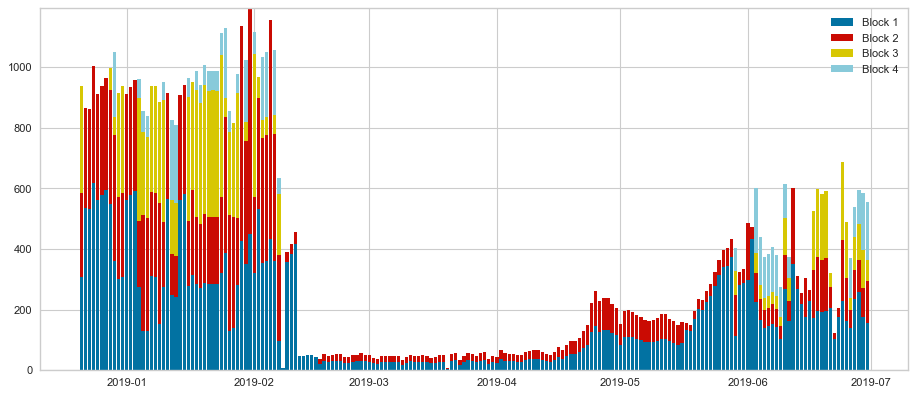

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


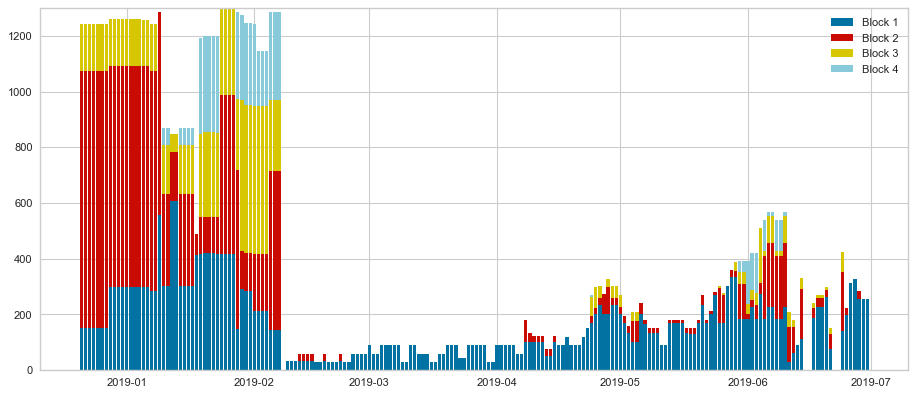

Hourly comparison: prediction vs. actual values
RMSE :15.18
MAE :8.37
R^2 :64.2
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 46 clusters **
Nb of clusters 45
Nb of centers 45, list:[29, 97, 114, 231, 210, 1014, 0, 336, 381, 772, 820, 9, 130, 315, 692, 668, 1070, 1745, 778, 840, 882, 924, 966, 1008, 657, 1092, 1326, 1176, 1204, 1260, 1303, 1348, 1744, 1415, 1665, 1618, 356, 1596, 769, 742, 1722, 1755, 1397, 1795, 555]
Number of centers: 45
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.125


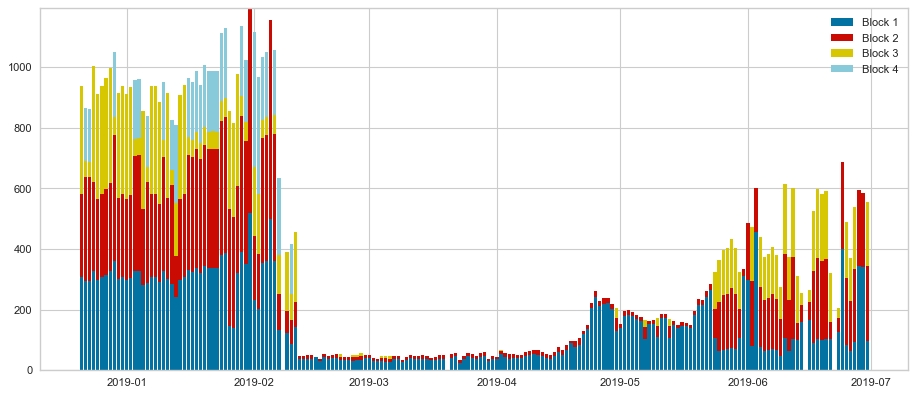

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


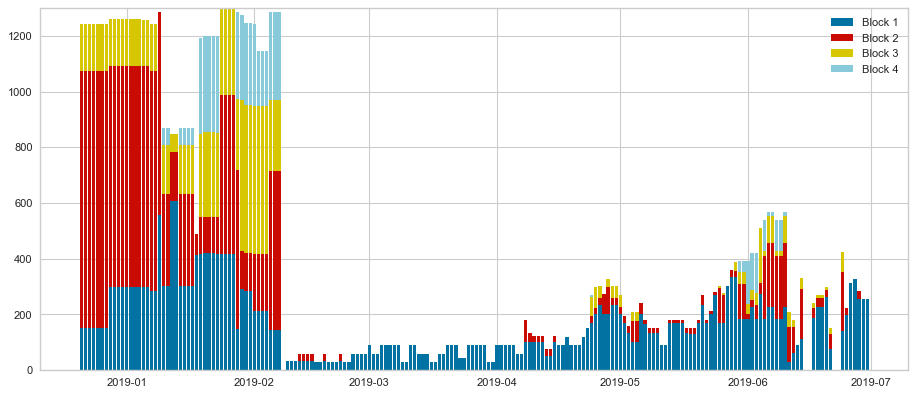

Hourly comparison: prediction vs. actual values
RMSE :14.19
MAE :8.23
R^2 :67.87
Daily comparison (max prod): prediction vs. actual values
RMSE :177.37
MAE :118.72
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.052083333333333336


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


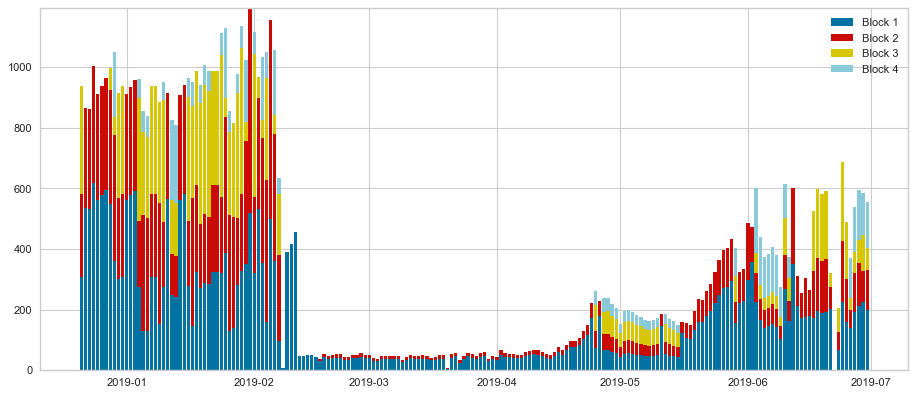

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


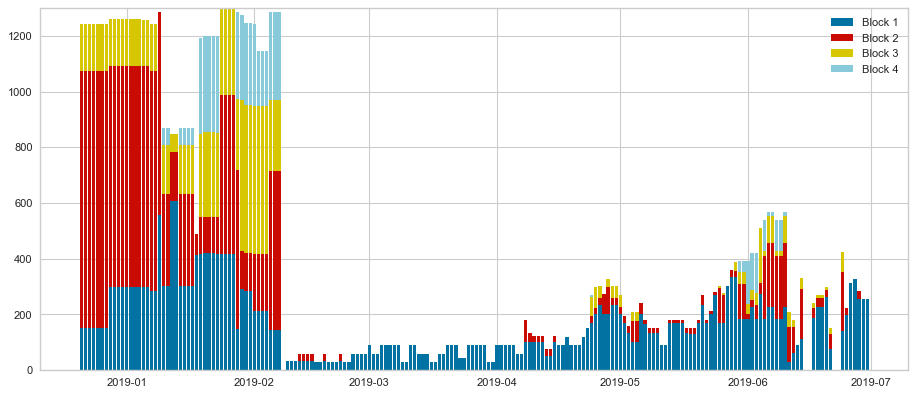

Hourly comparison: prediction vs. actual values
RMSE :12.64
MAE :7.35
R^2 :71.9
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Vector with 47 clusters **
Nb of clusters 46
Nb of centers 46, list:[41, 98, 125, 164, 29, 246, 287, 1303, 480, 501, 1204, 923, 533, 574, 615, 1702, 697, 738, 472, 907, 861, 356, 1187, 984, 1025, 1070, 1618, 778, 1395, 1230, 657, 342, 1744, 1621, 1604, 853, 1517, 367, 1105, 134, 881, 1722, 1714, 1804, 1414, 1630]
Number of centers: 46
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.21354166666666666


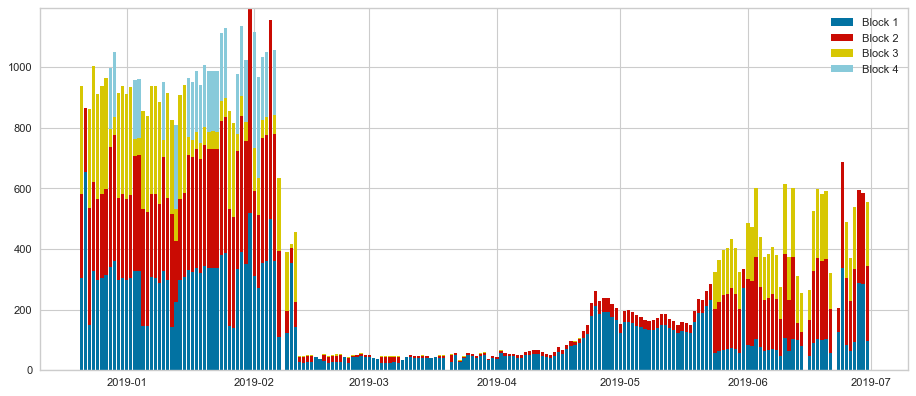

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


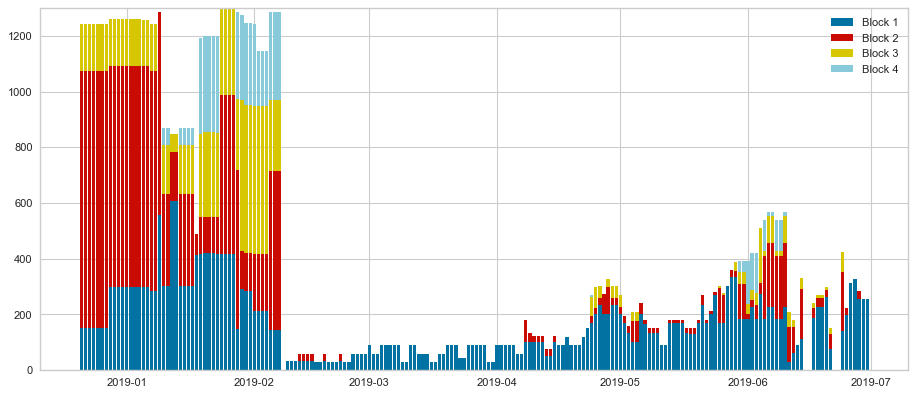

Hourly comparison: prediction vs. actual values
RMSE :13.1
MAE :7.86
R^2 :69.66
Daily comparison (max prod): prediction vs. actual values
RMSE :177.37
MAE :118.72
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.08333333333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


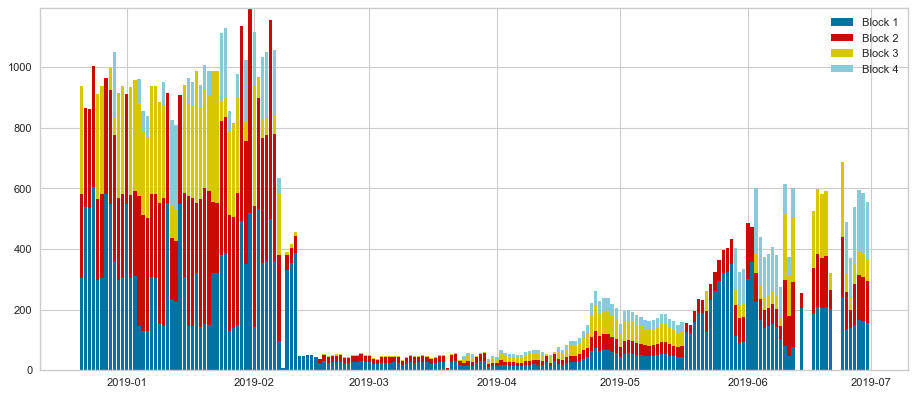

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


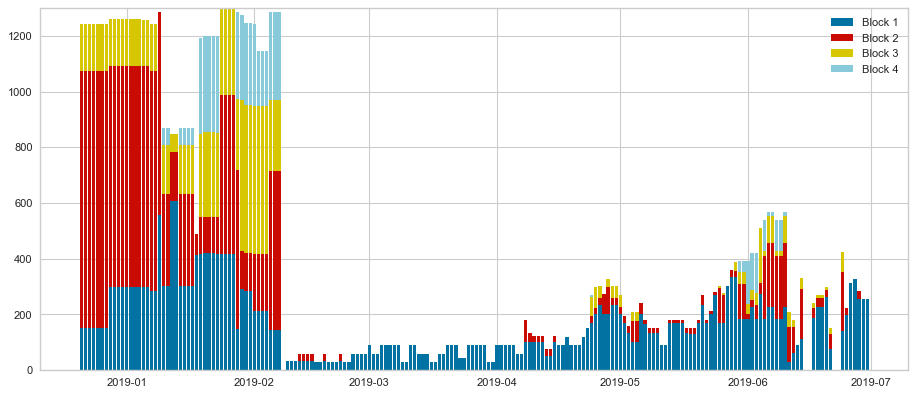

Hourly comparison: prediction vs. actual values
RMSE :12.36
MAE :7.14
R^2 :72.57
Daily comparison (max prod): prediction vs. actual values
RMSE :175.09
MAE :115.59
R^2 :85.64
************************************
** clustering Vector with 48 clusters **
Nb of clusters 47
Nb of centers 47, list:[734, 98, 125, 29, 342, 240, 280, 320, 360, 1310, 459, 1621, 1105, 560, 615, 692, 657, 1270, 760, 1687, 840, 880, 778, 960, 1000, 0, 1070, 1590, 1527, 468, 1240, 668, 1320, 1386, 1400, 1440, 742, 1204, 1560, 1600, 134, 1493, 1720, 1722, 1800, 1606, 71]
Number of centers: 47
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.171875


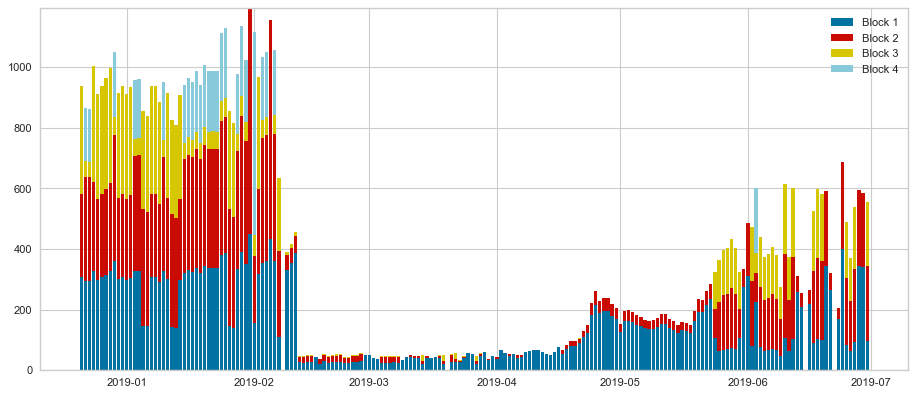

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


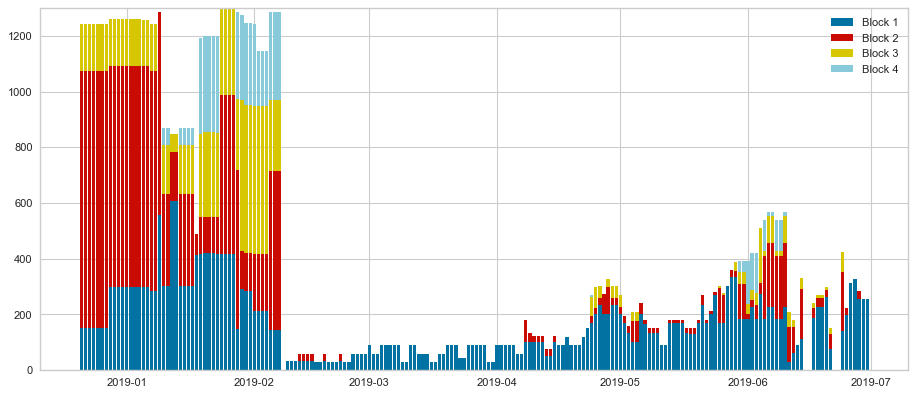

Hourly comparison: prediction vs. actual values
RMSE :13.82
MAE :7.99
R^2 :68.86
Daily comparison (max prod): prediction vs. actual values
RMSE :177.37
MAE :118.72
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.057291666666666664


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


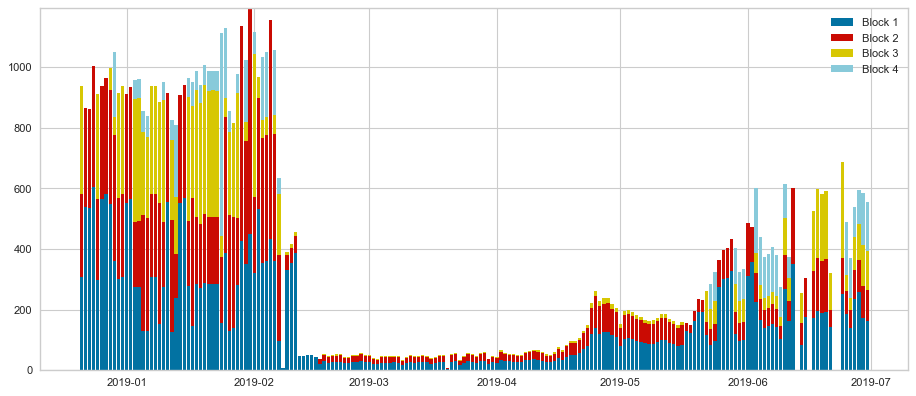

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


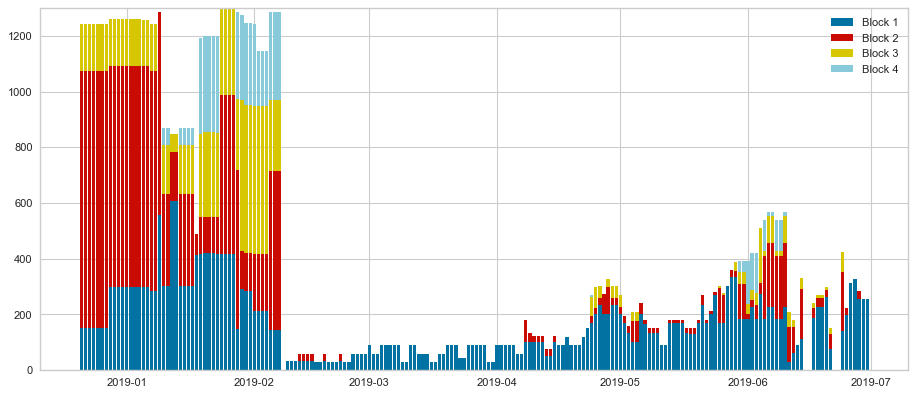

Hourly comparison: prediction vs. actual values
RMSE :13.8
MAE :7.71
R^2 :67.43
Daily comparison (max prod): prediction vs. actual values
RMSE :176.45
MAE :117.17
R^2 :85.41
************************************
** clustering Vector with 49 clusters **
Nb of clusters 48
Nb of centers 48, list:[734, 501, 203, 134, 907, 234, 273, 923, 1386, 29, 1187, 1618, 531, 130, 1303, 1070, 678, 181, 742, 772, 816, 858, 356, 342, 975, 1014, 1053, 1092, 1131, 1732, 1204, 641, 794, 381, 1365, 1404, 1435, 755, 1521, 1561, 1651, 769, 1687, 1719, 1755, 1795, 615, 1434]
Number of centers: 48
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.078125


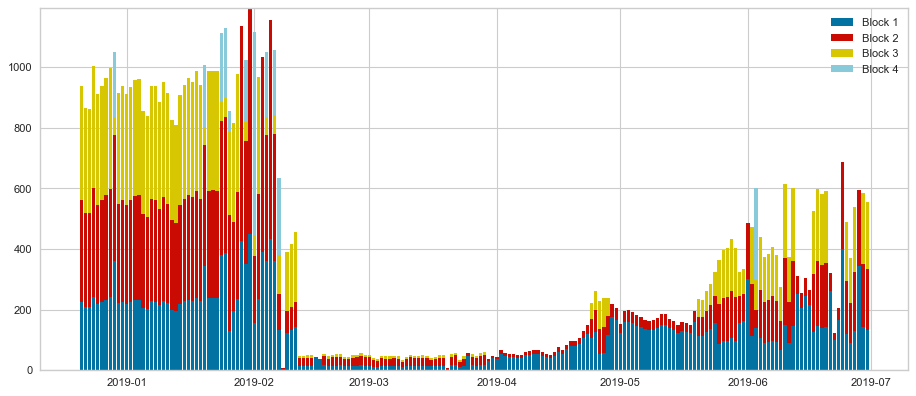

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


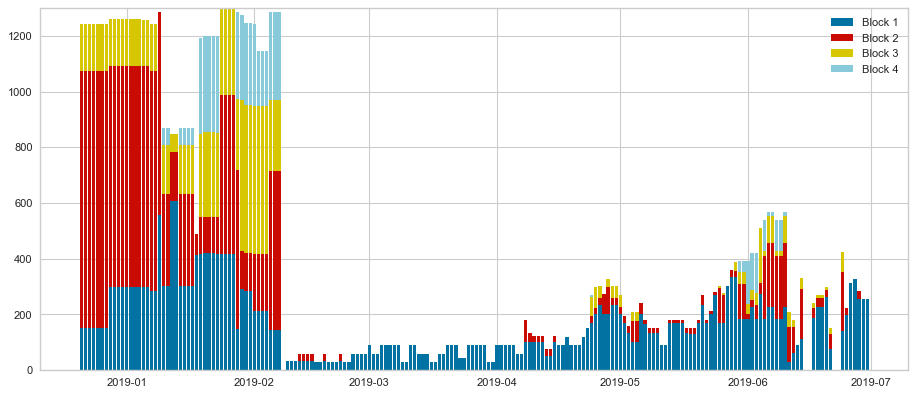

Hourly comparison: prediction vs. actual values
RMSE :12.7
MAE :7.54
R^2 :69.82
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.052083333333333336


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


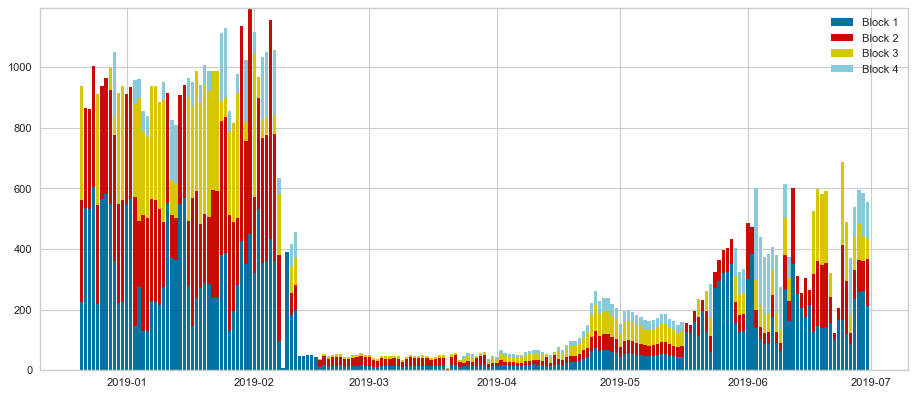

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


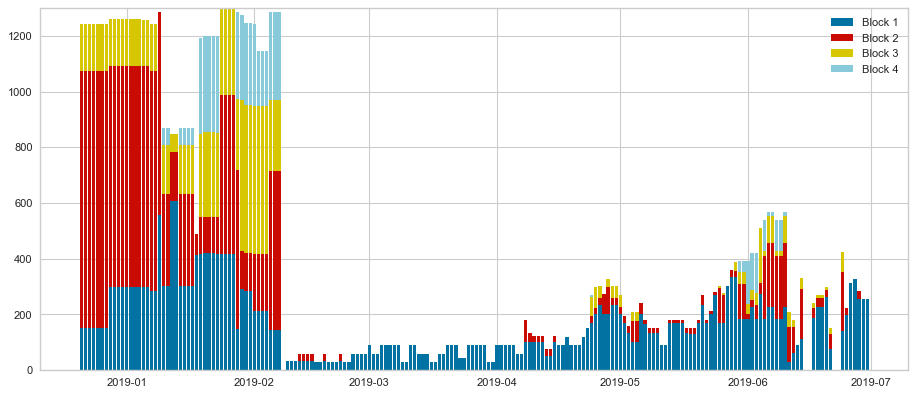

Hourly comparison: prediction vs. actual values
RMSE :12.76
MAE :7.6
R^2 :70.33
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 50 clusters **
Nb of clusters 49
Nb of centers 49, list:[38, 76, 114, 231, 769, 1606, 1127, 1084, 615, 381, 895, 265, 497, 532, 315, 622, 181, 657, 356, 760, 792, 753, 342, 912, 950, 742, 1026, 1064, 1568, 459, 1178, 1204, 1618, 1292, 1386, 555, 1406, 1414, 1719, 1521, 1192, 1109, 1634, 1273, 1722, 1303, 1786, 1824, 1868]
Number of centers: 49
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.11458333333333333


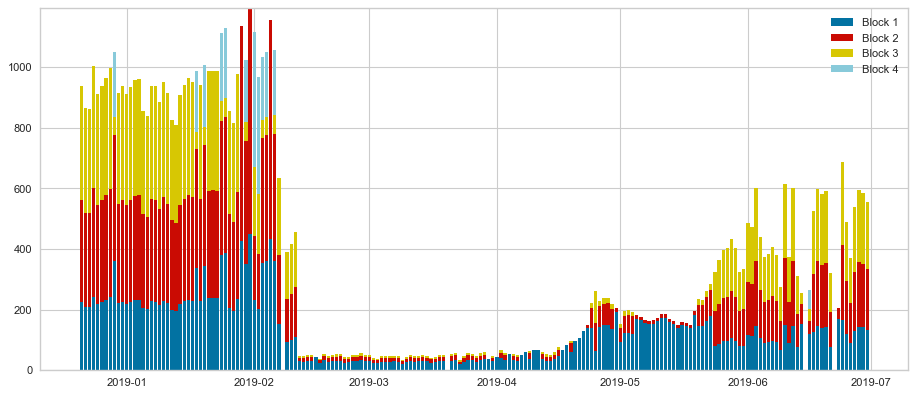

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


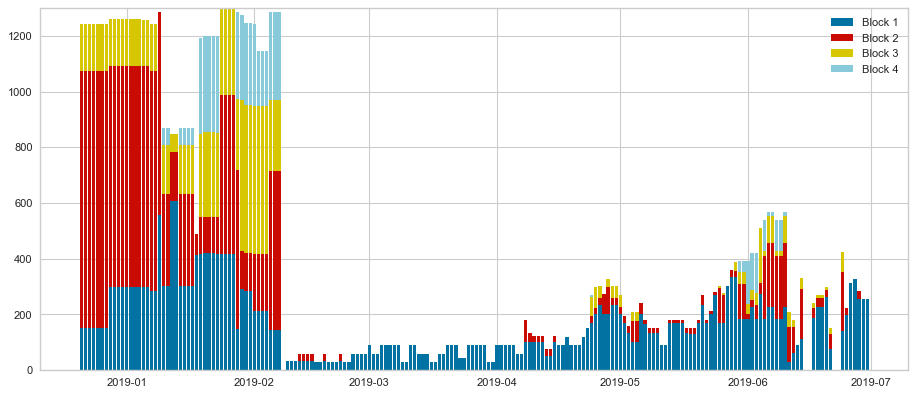

Hourly comparison: prediction vs. actual values
RMSE :12.64
MAE :7.46
R^2 :70.63
Daily comparison (max prod): prediction vs. actual values
RMSE :177.37
MAE :118.72
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.057291666666666664


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


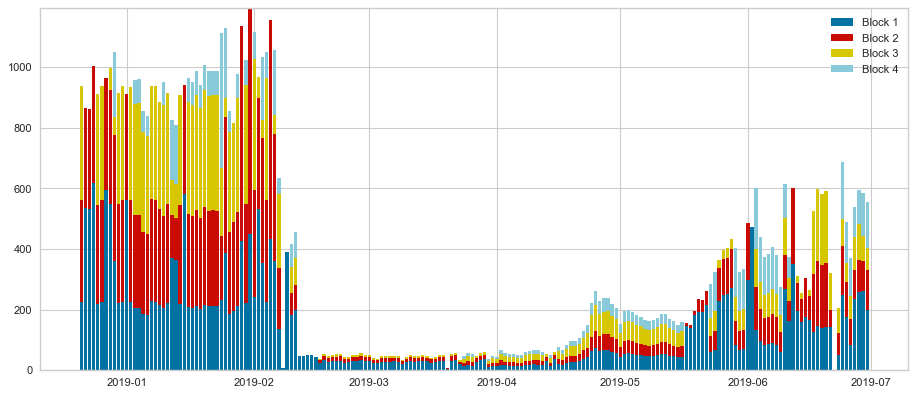

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


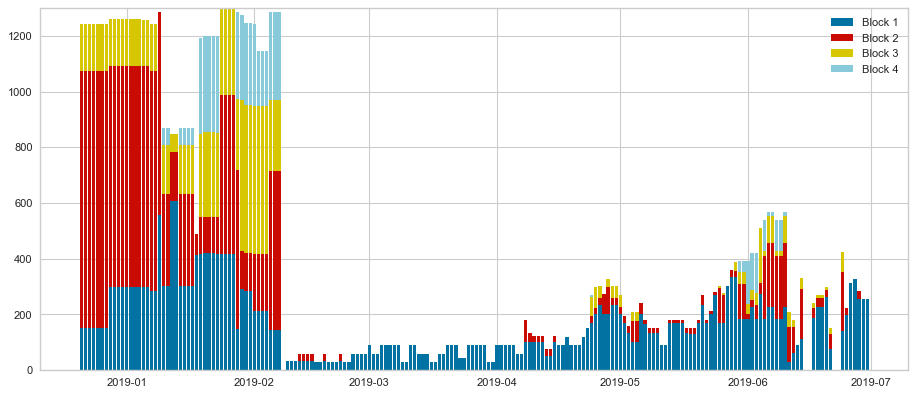

Hourly comparison: prediction vs. actual values
RMSE :12.17
MAE :7.27
R^2 :71.87
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Vector with 51 clusters **
Nb of clusters 50
Nb of centers 50, list:[38, 76, 114, 231, 769, 1606, 1127, 1084, 342, 381, 895, 265, 497, 532, 315, 622, 181, 657, 356, 760, 792, 753, 874, 912, 950, 742, 1026, 1064, 1568, 459, 1178, 1204, 1618, 1292, 1386, 555, 1406, 1414, 1719, 1521, 1192, 1109, 1634, 1273, 1722, 1303, 1786, 1824, 1868, 615]
Number of centers: 50
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.109375


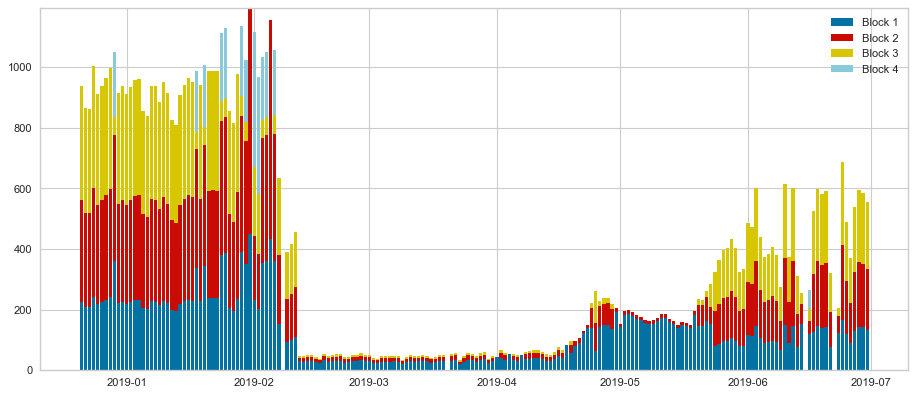

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


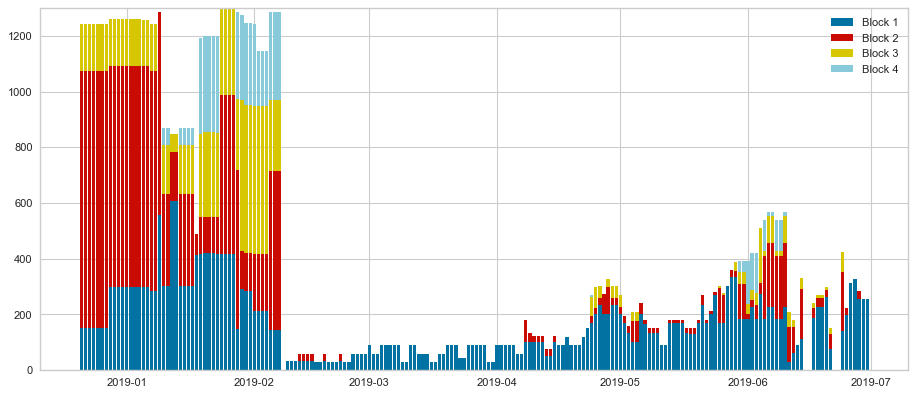

Hourly comparison: prediction vs. actual values
RMSE :12.61
MAE :7.32
R^2 :71.44
Daily comparison (max prod): prediction vs. actual values
RMSE :177.37
MAE :118.72
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.057291666666666664


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


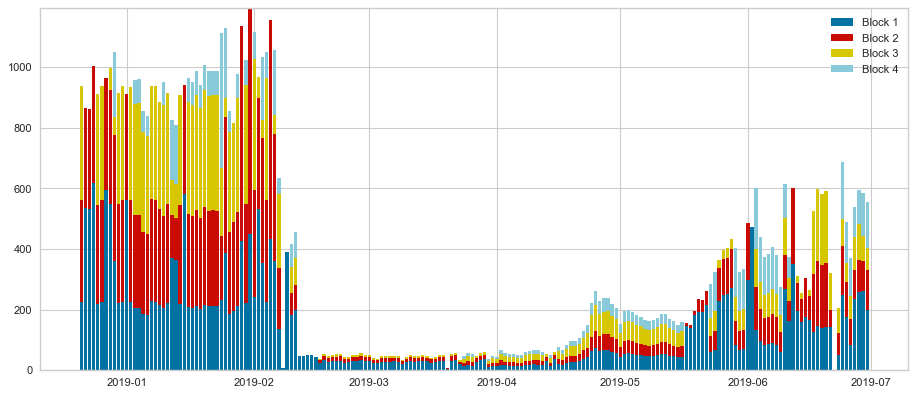

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


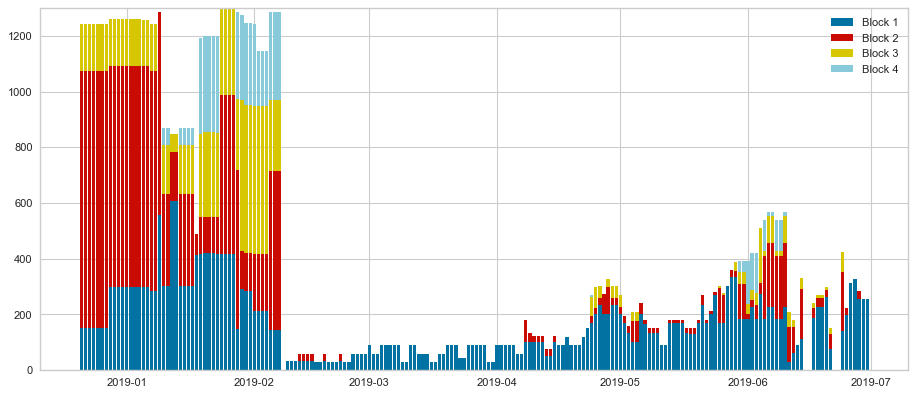

Hourly comparison: prediction vs. actual values
RMSE :12.17
MAE :7.27
R^2 :71.87
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Vector with 52 clusters **
Nb of clusters 51
Nb of centers 51, list:[29, 74, 108, 148, 185, 1084, 230, 161, 641, 1621, 732, 1192, 66, 1105, 555, 668, 629, 1303, 724, 531, 777, 794, 851, 839, 925, 962, 999, 315, 1070, 1110, 792, 1184, 615, 1258, 1732, 1348, 1362, 377, 1435, 742, 1517, 356, 1591, 1838, 1665, 1745, 1722, 1776, 1414, 1850, 917]
Number of centers: 51
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.17708333333333334


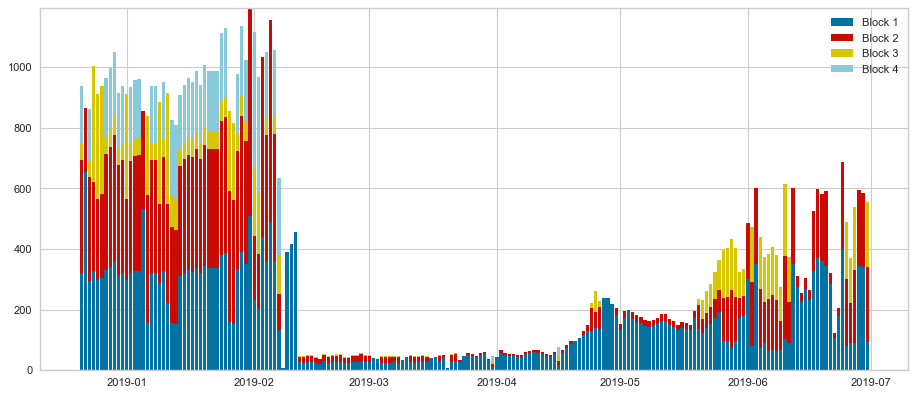

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


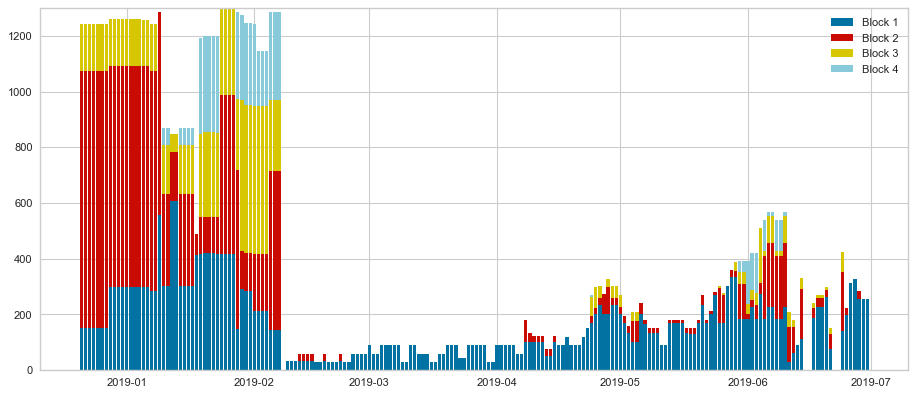

Hourly comparison: prediction vs. actual values
RMSE :13.73
MAE :7.86
R^2 :68.07
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.07291666666666667


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


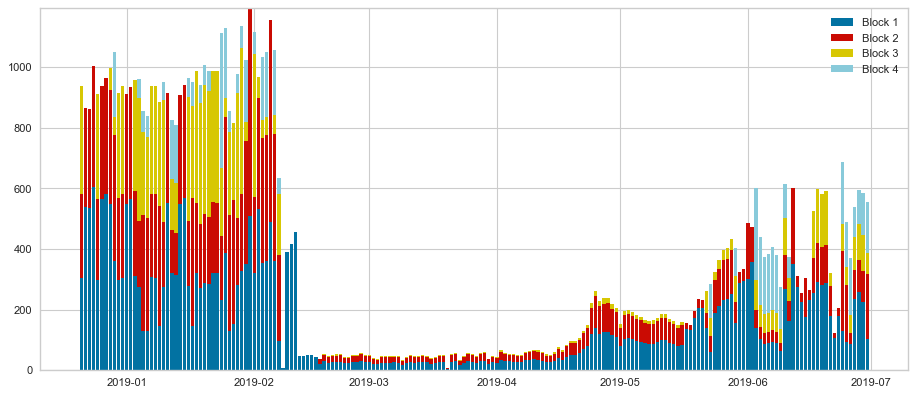

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


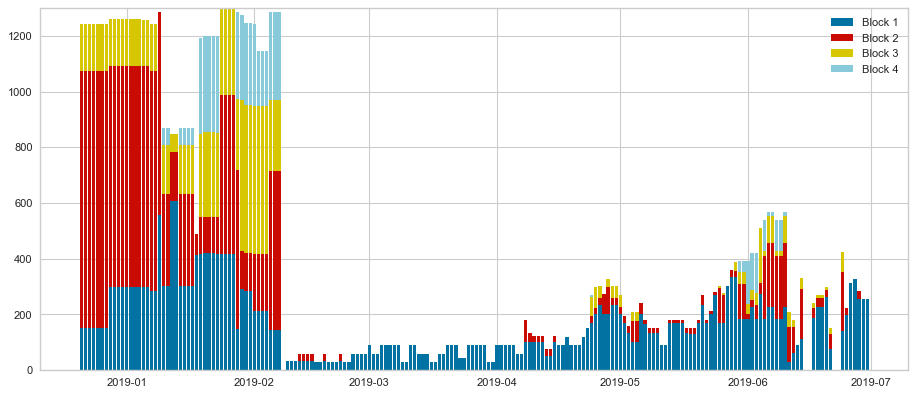

Hourly comparison: prediction vs. actual values
RMSE :14.31
MAE :8.08
R^2 :66.88
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
************************************
** clustering Vector with 53 clusters **
Nb of clusters 52
Nb of centers 52, list:[36, 72, 98, 144, 230, 216, 974, 161, 324, 360, 393, 95, 468, 923, 489, 576, 839, 692, 657, 531, 1745, 778, 204, 864, 342, 936, 615, 1303, 1044, 1070, 1621, 742, 426, 1224, 1260, 1732, 1386, 1368, 1404, 1440, 853, 1512, 1590, 1579, 1548, 1656, 1692, 1728, 668, 1800, 1435, 1838]
Number of centers: 52
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.17708333333333334


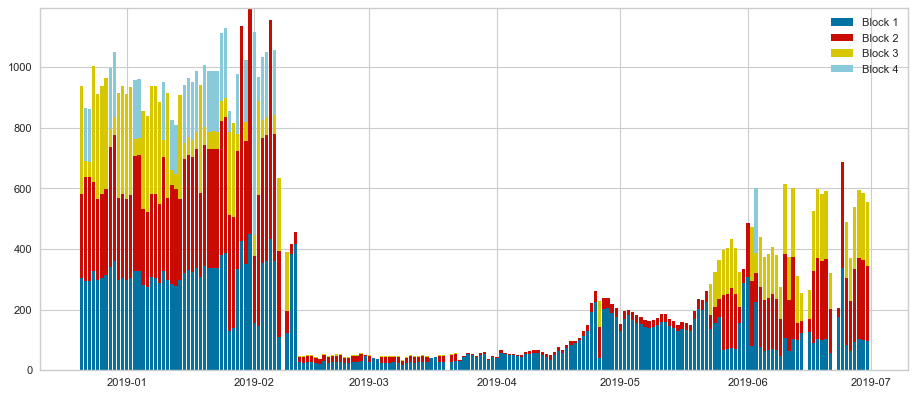

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


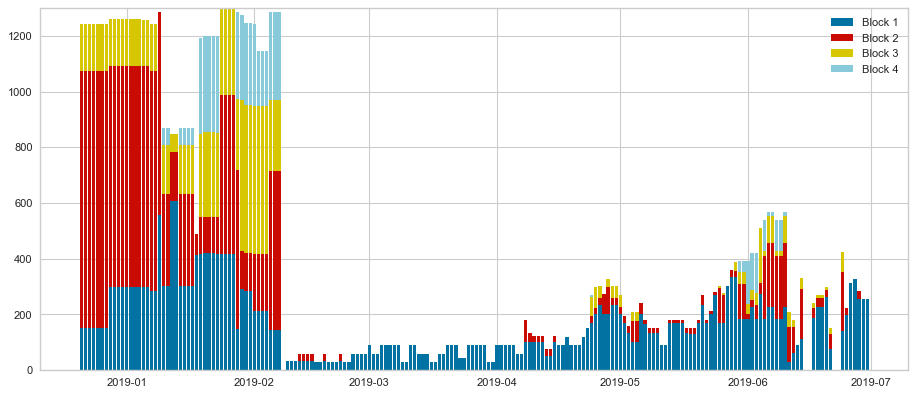

Hourly comparison: prediction vs. actual values
RMSE :13.2
MAE :7.74
R^2 :69.84
Daily comparison (max prod): prediction vs. actual values
RMSE :177.37
MAE :118.72
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.08333333333333333


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


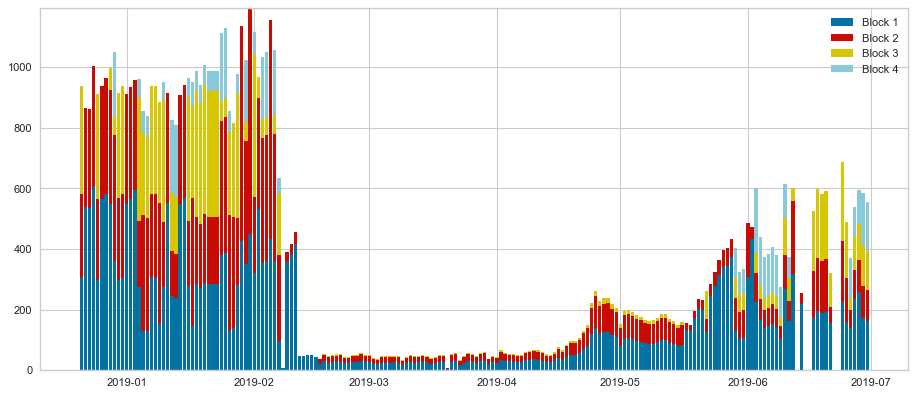

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


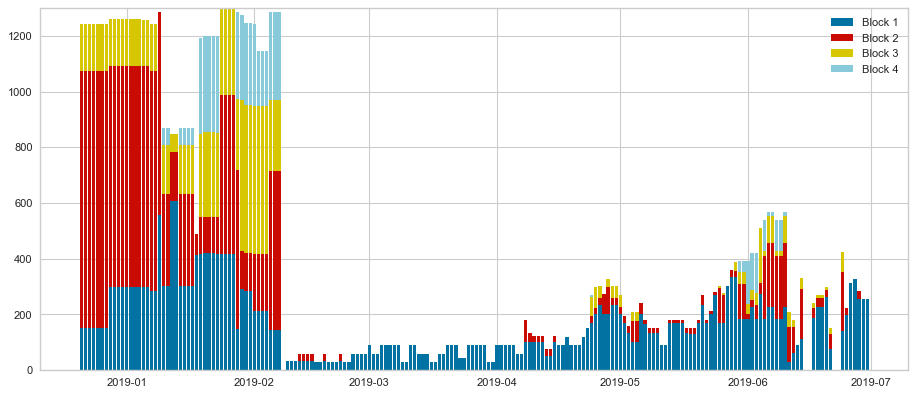

Hourly comparison: prediction vs. actual values
RMSE :14.39
MAE :7.95
R^2 :66.79
Daily comparison (max prod): prediction vs. actual values
RMSE :175.09
MAE :115.59
R^2 :85.64
************************************
** clustering Vector with 54 clusters **
Nb of clusters 53
Nb of centers 53, list:[36, 72, 1868, 144, 230, 216, 974, 161, 324, 360, 393, 106, 468, 923, 489, 576, 839, 692, 657, 531, 1745, 778, 204, 864, 342, 936, 615, 1303, 1044, 1070, 1621, 742, 426, 1224, 1260, 1732, 1386, 1368, 1404, 1440, 853, 1512, 1590, 1579, 1548, 1656, 1692, 1728, 668, 1800, 1435, 1838, 1908]
Number of centers: 53
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.15625


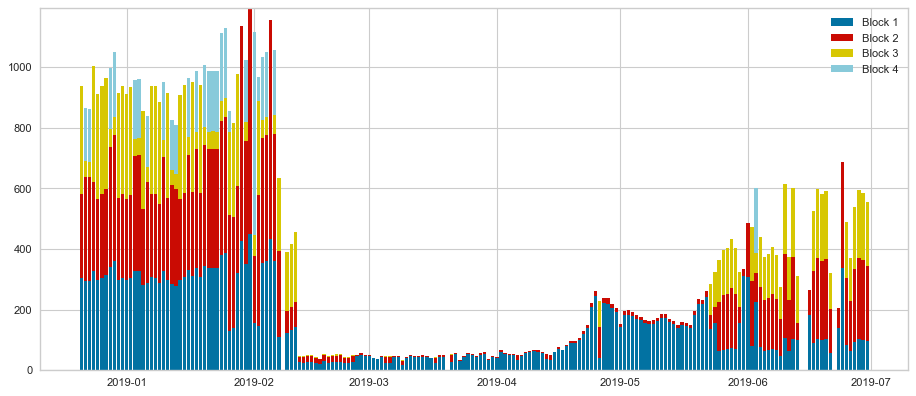

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


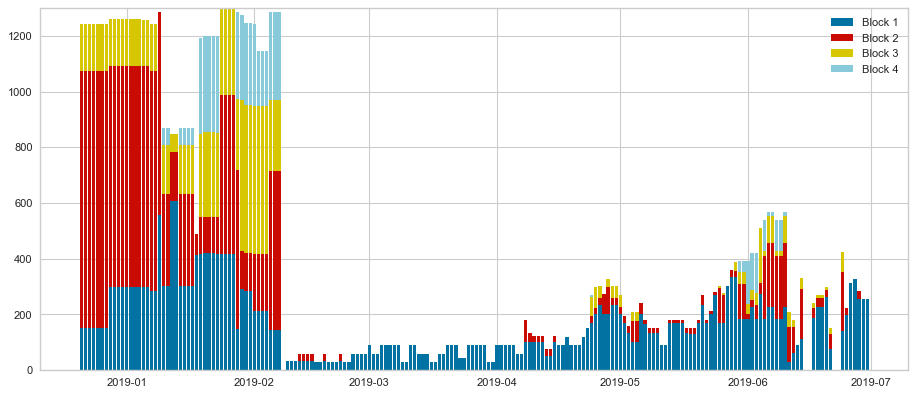

Hourly comparison: prediction vs. actual values
RMSE :13.17
MAE :7.62
R^2 :69.63
Daily comparison (max prod): prediction vs. actual values
RMSE :178.88
MAE :120.05
R^2 :85.01
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.046875


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


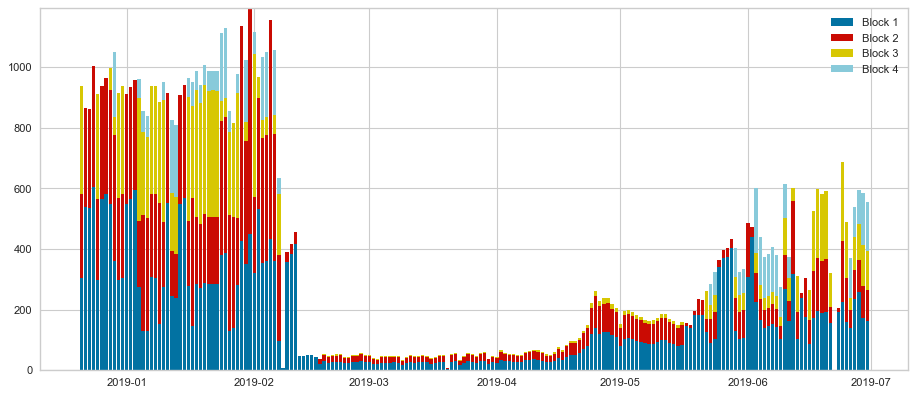

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


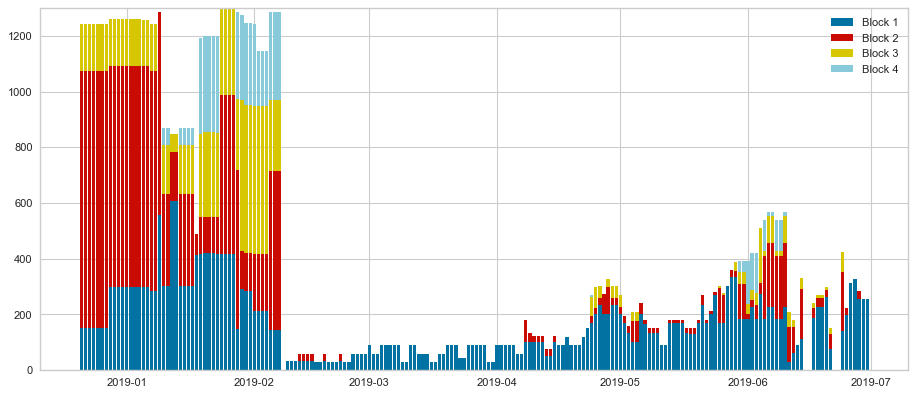

Hourly comparison: prediction vs. actual values
RMSE :14.45
MAE :8.14
R^2 :66.32
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Vector with 55 clusters **
Nb of clusters 54
Nb of centers 54, list:[35, 1410, 501, 140, 175, 210, 245, 280, 1732, 615, 393, 772, 265, 490, 497, 560, 1907, 630, 668, 724, 735, 770, 805, 1070, 342, 910, 945, 980, 1015, 657, 1085, 1590, 1154, 0, 1225, 1260, 1303, 1348, 1365, 895, 1435, 1665, 1506, 1540, 1621, 1606, 531, 881, 1719, 755, 1785, 1820, 1855, 356]
Number of centers: 54
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.140625


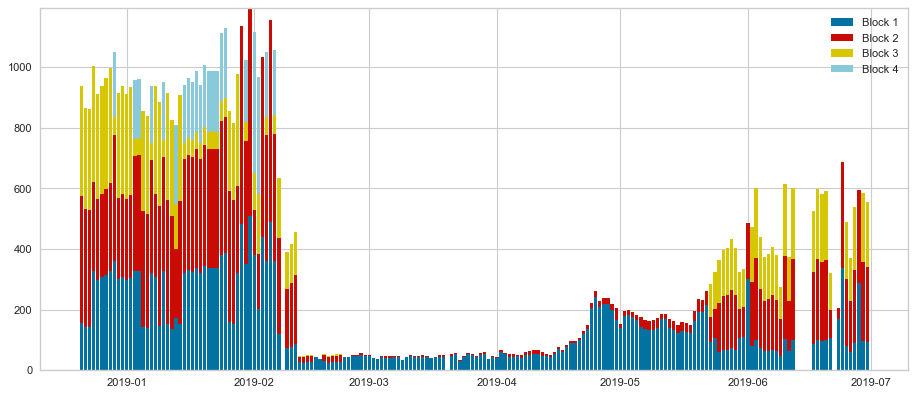

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


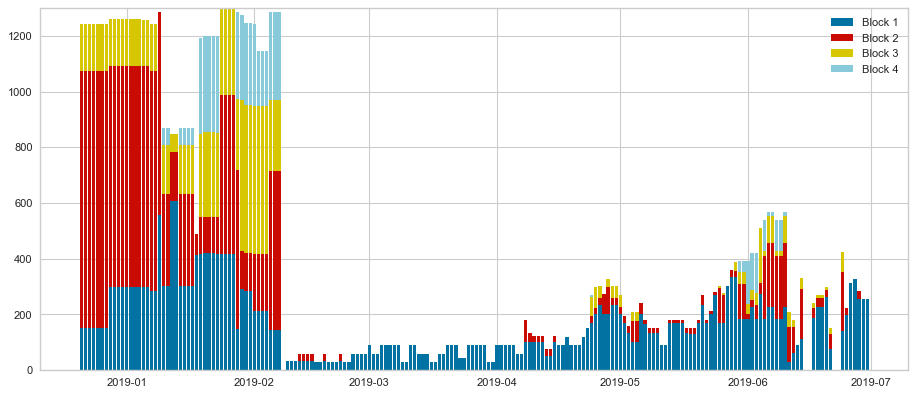

Hourly comparison: prediction vs. actual values
RMSE :13.27
MAE :7.93
R^2 :67.96
Daily comparison (max prod): prediction vs. actual values
RMSE :177.26
MAE :117.98
R^2 :85.28
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.036458333333333336


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


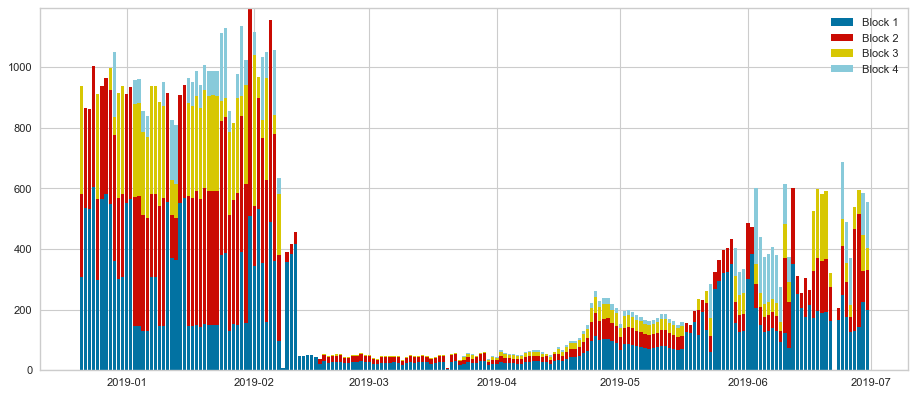

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


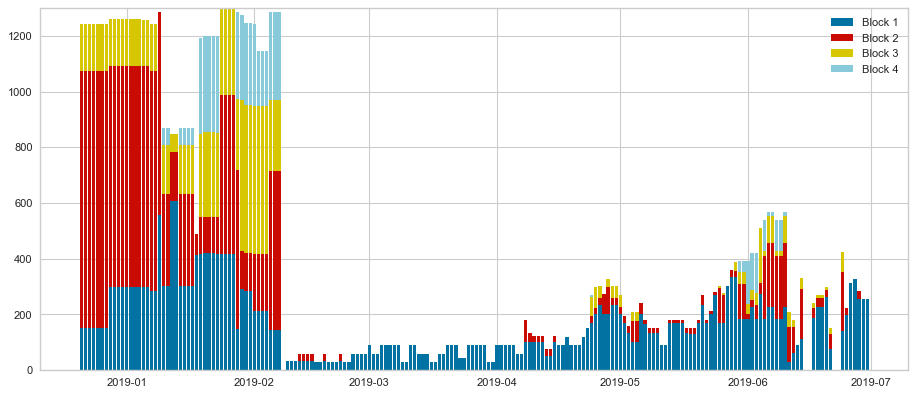

Hourly comparison: prediction vs. actual values
RMSE :13.47
MAE :7.77
R^2 :69.1
Daily comparison (max prod): prediction vs. actual values
RMSE :178.69
MAE :120.3
R^2 :85.04
************************************
** clustering Vector with 56 clusters **
Nb of clusters 55
Nb of centers 55, list:[114, 1596, 1868, 136, 907, 29, 238, 272, 1687, 340, 342, 203, 442, 769, 510, 531, 578, 1070, 692, 680, 714, 1303, 794, 816, 0, 839, 742, 952, 986, 974, 1054, 1088, 1618, 772, 1192, 1224, 1258, 853, 381, 1348, 1778, 1428, 1435, 792, 1527, 1545, 1621, 1632, 1666, 1719, 1734, 1768, 1802, 1420, 1127]
Number of centers: 55
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.13541666666666666


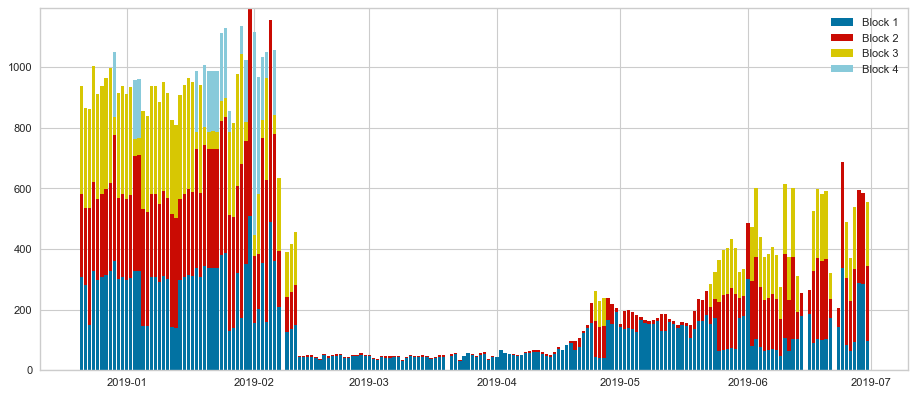

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


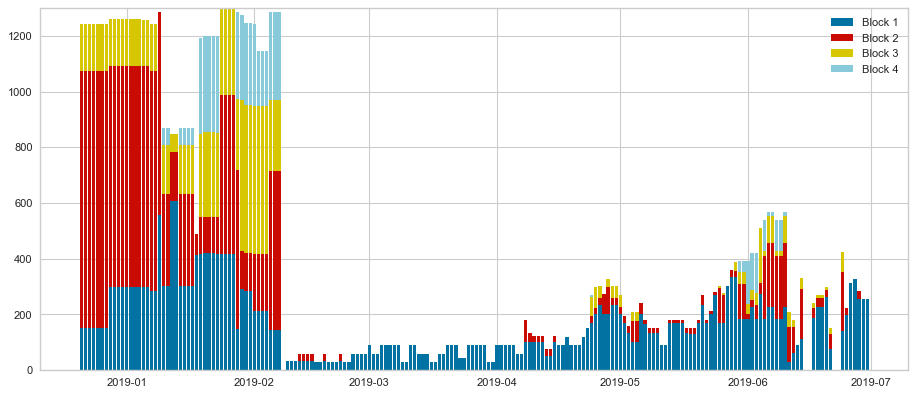

Hourly comparison: prediction vs. actual values
RMSE :12.82
MAE :7.44
R^2 :71.2
Daily comparison (max prod): prediction vs. actual values
RMSE :177.37
MAE :118.72
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.026041666666666668


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


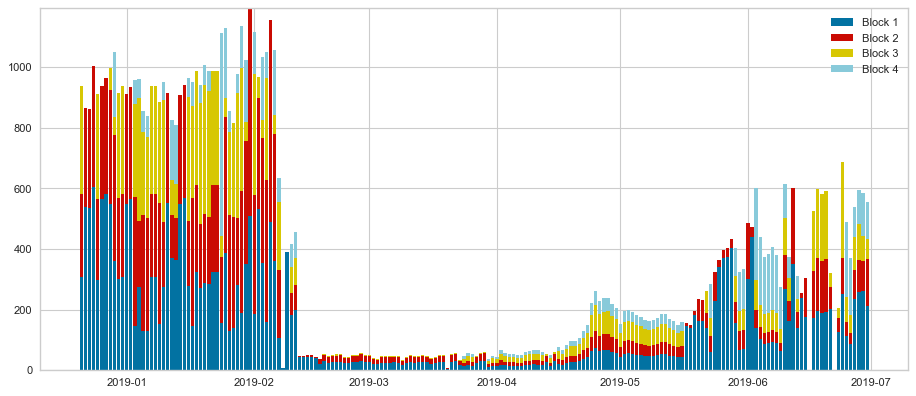

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


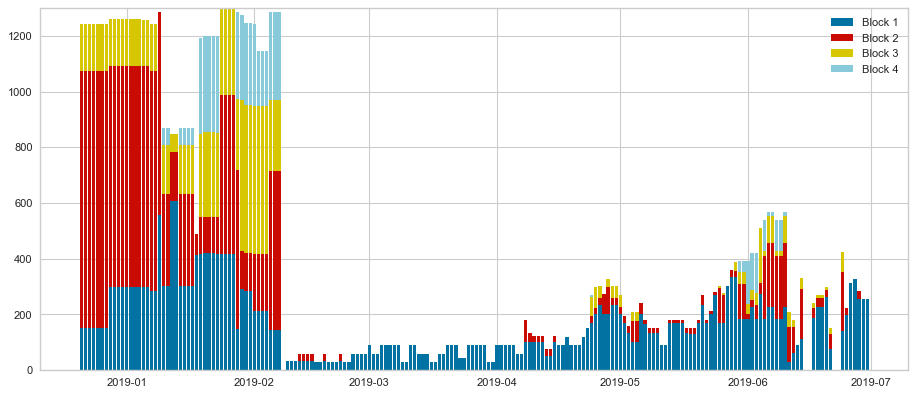

Hourly comparison: prediction vs. actual values
RMSE :12.71
MAE :7.41
R^2 :71.07
Daily comparison (max prod): prediction vs. actual values
RMSE :177.67
MAE :118.92
R^2 :85.21
************************************
** clustering Vector with 57 clusters **
Nb of clusters 56
Nb of centers 56, list:[203, 1596, 95, 136, 907, 29, 238, 272, 1687, 340, 342, 734, 442, 769, 510, 531, 578, 1070, 692, 680, 714, 1303, 794, 816, 0, 839, 742, 952, 986, 974, 1054, 1088, 1618, 772, 1192, 1224, 1258, 853, 381, 1348, 1778, 1838, 1397, 792, 1527, 77, 1621, 1632, 1666, 1719, 1734, 1768, 1802, 1435, 1127, 74]
Number of centers: 56
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.11979166666666667


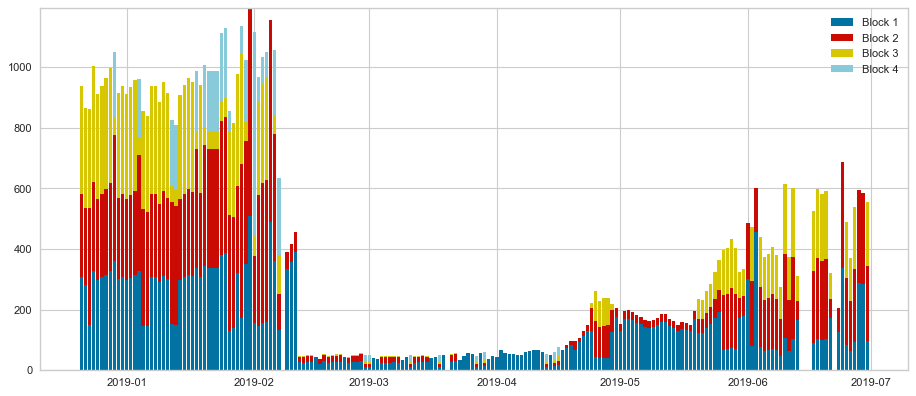

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


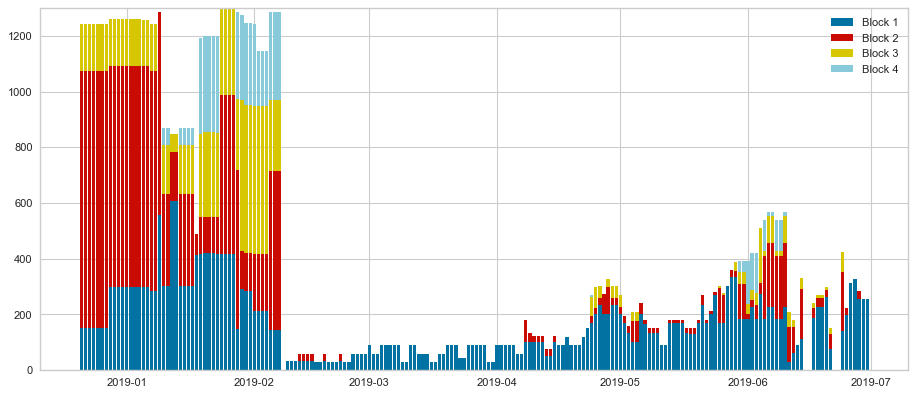

Hourly comparison: prediction vs. actual values
RMSE :13.34
MAE :7.63
R^2 :68.99
Daily comparison (max prod): prediction vs. actual values
RMSE :177.86
MAE :118.67
R^2 :85.18
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.046875


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


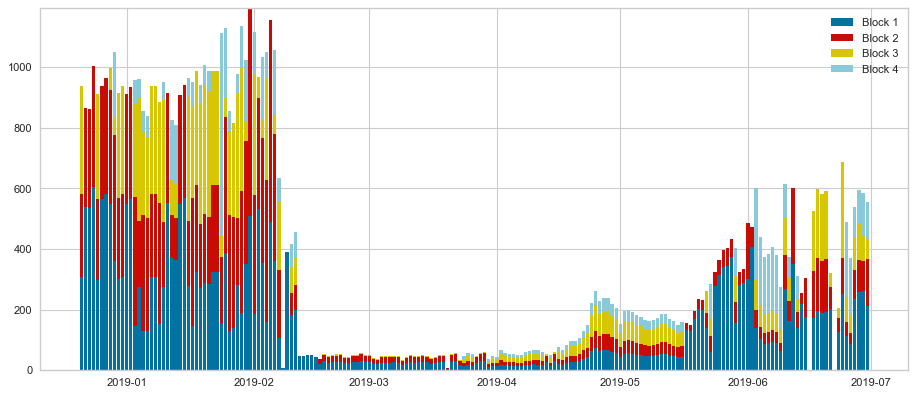

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


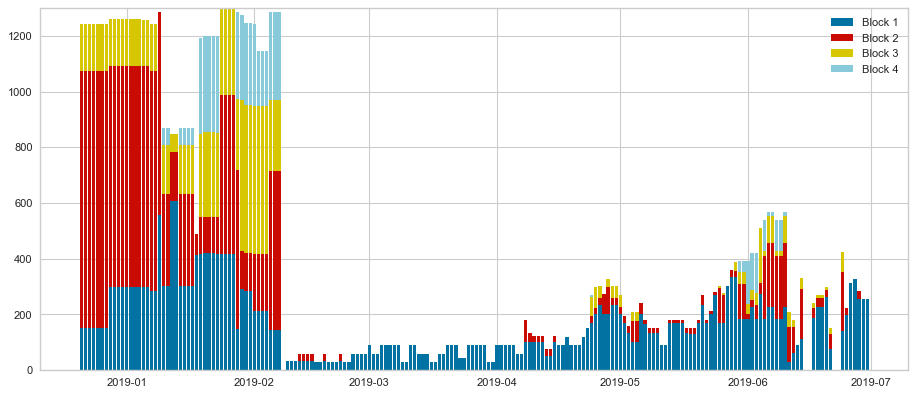

Hourly comparison: prediction vs. actual values
RMSE :12.94
MAE :7.52
R^2 :70.6
Daily comparison (max prod): prediction vs. actual values
RMSE :177.67
MAE :118.92
R^2 :85.21
************************************
** clustering Vector with 58 clusters **
Nb of clusters 57
Nb of centers 57, list:[29, 480, 99, 132, 0, 198, 134, 280, 286, 330, 356, 125, 445, 615, 495, 539, 561, 367, 1722, 678, 629, 726, 759, 794, 907, 1070, 891, 924, 957, 990, 1023, 1056, 1089, 1618, 1687, 1188, 1221, 1197, 1287, 1320, 1348, 1744, 1419, 1604, 1521, 1204, 772, 1105, 1621, 1630, 742, 1719, 1749, 1782, 1815, 1868, 106]
Number of centers: 57
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.171875


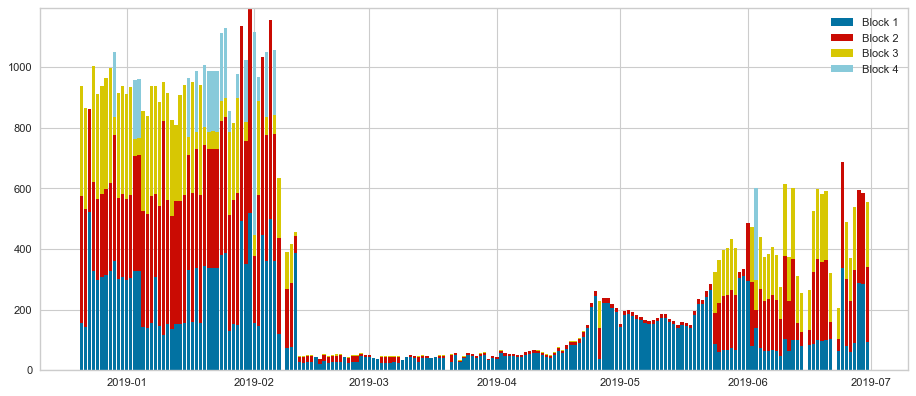

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


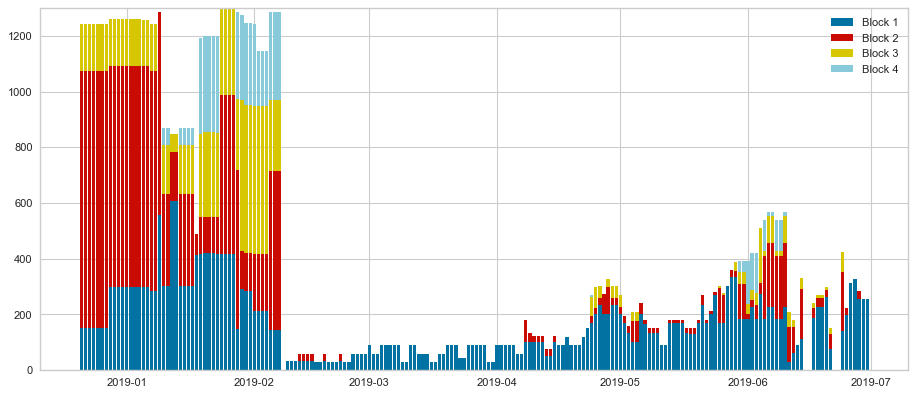

Hourly comparison: prediction vs. actual values
RMSE :12.99
MAE :7.8
R^2 :69.23
Daily comparison (max prod): prediction vs. actual values
RMSE :177.37
MAE :118.72
R^2 :85.26
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.057291666666666664


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


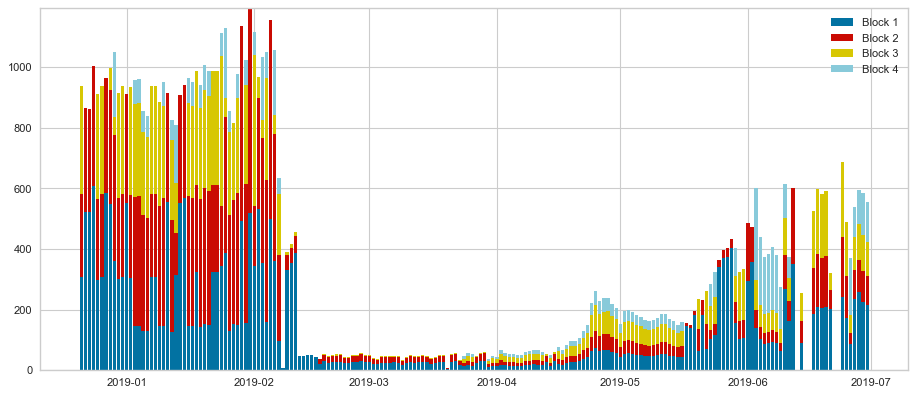

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


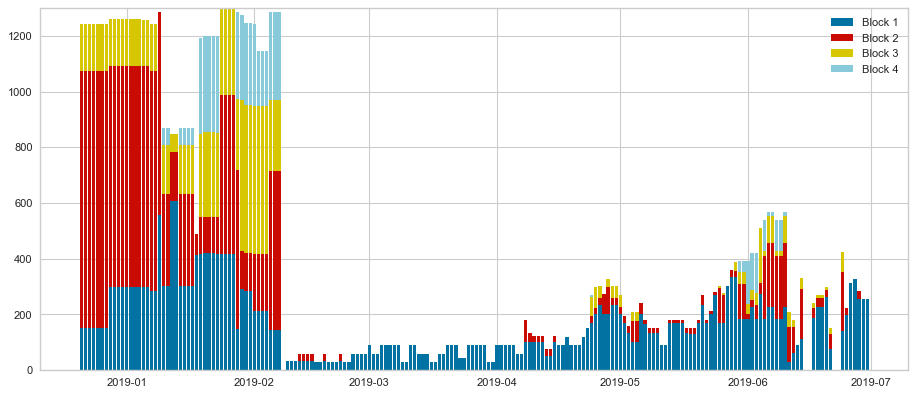

Hourly comparison: prediction vs. actual values
RMSE :12.41
MAE :7.17
R^2 :72.09
Daily comparison (max prod): prediction vs. actual values
RMSE :175.09
MAE :115.59
R^2 :85.64
************************************
** clustering Vector with 59 clusters **
Nb of clusters 58
Nb of centers 58, list:[388, 615, 96, 335, 401, 907, 204, 153, 293, 320, 352, 203, 396, 448, 1109, 181, 531, 576, 1070, 640, 668, 724, 736, 769, 807, 1303, 864, 356, 928, 960, 992, 1024, 657, 1088, 1590, 917, 1186, 1204, 9, 839, 974, 1744, 1376, 459, 1440, 853, 1504, 778, 1568, 81, 1632, 381, 1696, 1728, 1760, 1792, 1824, 1856]
Number of centers: 58
**** RF classification *****


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Result of classification with RF
**** accuracy ***** 0.21354166666666666


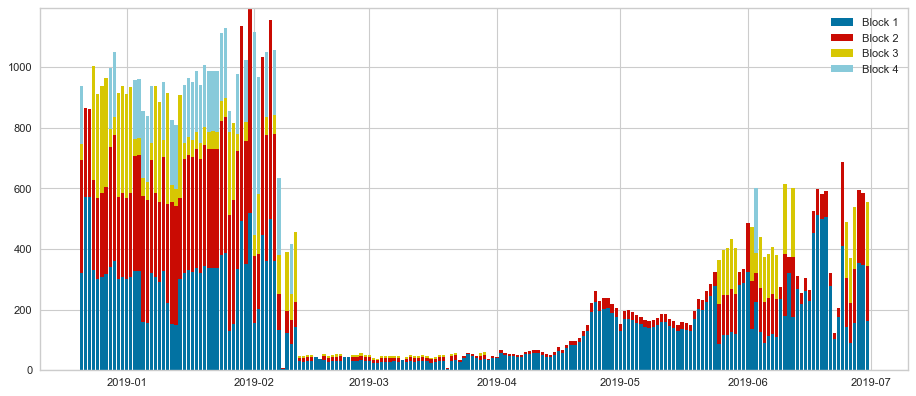

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


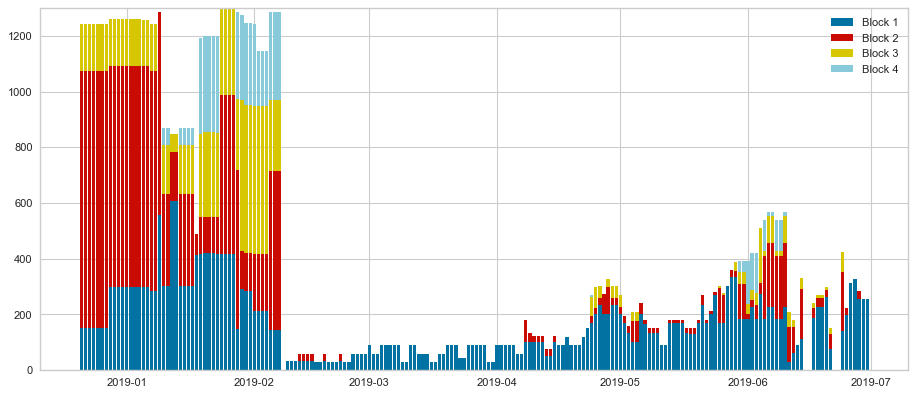

Hourly comparison: prediction vs. actual values
RMSE :14.47
MAE :8.12
R^2 :66.75
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0
**** kNN classification *****
Result of classification with kNN
**** accuracy ***** 0.10416666666666667


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


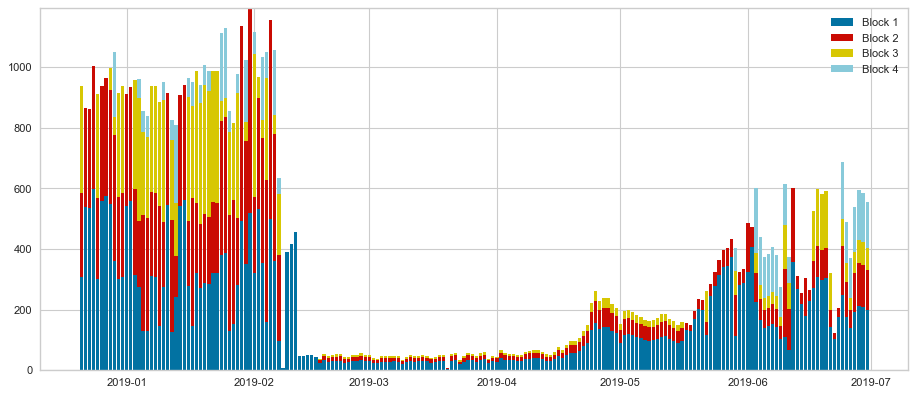

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


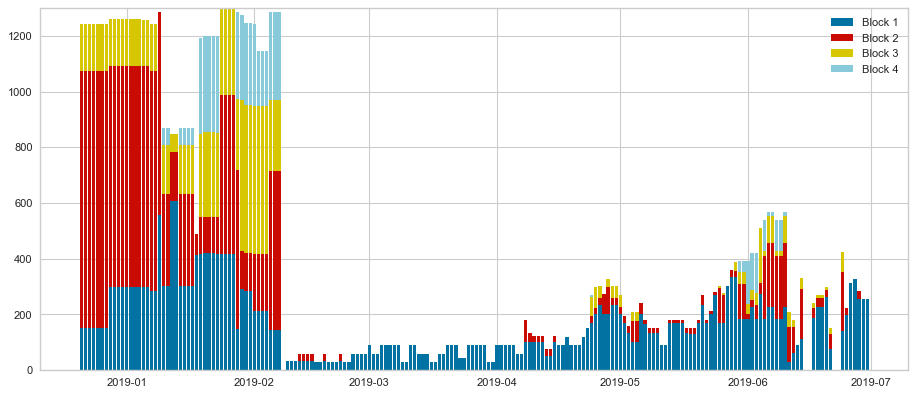

Hourly comparison: prediction vs. actual values
RMSE :13.57
MAE :7.95
R^2 :69.22
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0


In [170]:
# grid search to identify best number of clusters, from to 60

initialClusterNb = 5 #5  
finalCusterNb =  60 #60
stepNbCluster = 1
dfResult = pd.DataFrame(columns=["Algorithm", "NbClusters", "RMSE", "MAE", "R^2"])

# classification using Random Forest (500 trees)
RFmodel = RandomForestClassifier(n_estimators=1000)
# classification using k-NN (4 neighbours)
kNNmodel = KNeighborsClassifier(n_neighbors=4)

modelList = [RFmodel, kNNmodel]
modelNameList = ["RF", "kNN"]
targetTypes = ["Power-Nohours", "Vector"]

# resize power values before clustering
df_resizePower= df.copy()
for i in range (1,4+1):
    df_resizePower["PrioP"+str(i)] =  df_resizePower["PrioP"+str(i)]/df_resizePower["Max prod"]
# as there as some days with energy = 0, fill up NaN with 0
df_resizePower.replace(np.inf, np.nan, inplace=True)
df_resizePower.fillna(0,inplace=True)

# create the 24 hours vector columns in the dataframe, using the blocks definition
dfVector = get24hoursEnergyVector("PrioH", "PrioP", df_resizePower, "P")
for i in range(24):
    df_resizePower["P"+str(i)] =  dfVector["P"+str(i)]
    
for targetType in targetTypes:
    
    if targetType == "Vector":
        clusteringCols =  ['PrioH1','PrioH2','PrioH3','PrioH4', 'PrioP1','PrioP2','PrioP3','PrioP4']
    else:
        clusteringCols =  ['P'+str(i) for i in range(24)]
    
    for iNbCluster in range(initialClusterNb,finalCusterNb,stepNbCluster ):
        print("************************************")
        print("** clustering %s with %i clusters **" %(targetType,iNbCluster))
        
        # perform clustering
        df_cluster, centers = clusterCreation(iNbCluster, df_resizePower, clusteringCols, targetType)
        # copy the cluster allocation in the source dataframe
        df["cluster_id"] = df_cluster["cluster_id"]
        print("Number of centers:", len(centers))

        # create the centroid table, i.e. for each cluster ID the associated values
        dfCentroids = pd.DataFrame(index = [i for i in range(len(centers))], columns=["ClusterID"]+cols)
        for i in range(len(centers)): 
            dfCentroids.iloc[i]["ClusterID"] = centers[i]
            dfCentroids.iloc[i][cols] = df_resizePower.iloc[centers[i]][cols]
        #force index to ClusterID values
        dfCentroids.index = dfCentroids["ClusterID"]

        xTrain, xTest, yTrain, yTest, yBaseline =  GetDataSplit(df, fullRegressors, target_feature,[],0.9)
        # for the prediction part, replace the max energy with the forecasted value
        xTest["Max prod"] = df_MLPprediction["Prediction"]

        # performClassification and store results for reporting
        for index, row in clusterClassification(modelList, modelNameList, 
                                                xTrain, yTrain, xTest, yTest, df, dfCentroids, targetType).iterrows():
            dfResult = dfResult.append(row)


In [167]:
dfResult

,Algorithm,NbClusters,RMSE,MAE,R^2,Accuracy,Daily MAE,Daily R2,Daily RMSE,Target Type
NbClusters,,,,,,,,,,
4,RF,4,15.66,9.87,60.02,72.916667,120.93,85.00,178.91,Power-Nohours
4,kNN,4,15.00,9.53,60.35,72.916667,120.93,85.00,178.91,Power-Nohours
5,RF,5,14.48,8.03,66.53,71.875000,120.93,85.00,178.91,Power-Nohours
5,kNN,5,14.25,8.19,66.38,67.708333,120.93,85.00,178.91,Power-Nohours
6,RF,6,13.13,7.61,69.47,50.000000,120.93,85.00,178.91,Power-Nohours
6,kNN,6,13.57,7.83,68.74,54.687500,120.93,85.00,178.91,Power-Nohours
7,RF,7,12.86,7.53,70.89,45.312500,120.93,85.00,178.91,Power-Nohours
7,kNN,7,13.79,7.77,67.74,46.875000,120.93,85.00,178.91,Power-Nohours
8,RF,8,13.66,7.79,67.73,55.208333,120.93,85.00,178.91,Power-Nohours


In [172]:
dfResult.index = dfResult["NbClusters"]
dfResult["Accuracy"] = dfResult["Accuracy"]*100

In [173]:
dfResult[dfResult["Target Type"]=="Vector"].iloc[5:,].head(10)

,Algorithm,NbClusters,RMSE,MAE,R^2,Accuracy,Daily MAE,Daily R2,Daily RMSE,Target Type
NbClusters,,,,,,,,,,
6,kNN,6,13.51,8.46,66.09,41.145833,120.93,85.0,178.91,Vector
7,RF,7,13.90,9.34,64.76,42.708333,120.93,85.0,178.91,Vector
7,kNN,7,13.03,7.95,70.16,16.145833,120.93,85.0,178.91,Vector
8,RF,8,13.87,8.18,68.06,60.416667,120.93,85.0,178.91,Vector
8,kNN,8,14.58,8.51,65.28,53.645833,120.93,85.0,178.91,Vector
9,RF,9,13.64,8.72,65.84,48.958333,120.93,85.0,178.91,Vector
9,kNN,9,15.73,9.72,57.57,19.791667,120.93,85.0,178.91,Vector
10,RF,10,13.95,8.41,67.90,45.312500,120.93,85.0,178.91,Vector
10,kNN,10,12.88,7.92,66.91,16.145833,120.93,85.0,178.91,Vector


In [174]:
dfResult[dfResult["Target Type"]=="Power-Nohours"].iloc[3:,].head(10)

,Algorithm,NbClusters,RMSE,MAE,R^2,Accuracy,Daily MAE,Daily R2,Daily RMSE,Target Type
NbClusters,,,,,,,,,,
5,kNN,5,14.25,8.19,66.38,67.708333,120.93,85.0,178.91,Power-Nohours
6,RF,6,12.99,7.58,69.85,50.000000,120.93,85.0,178.91,Power-Nohours
6,kNN,6,13.57,7.83,68.74,54.687500,120.93,85.0,178.91,Power-Nohours
7,RF,7,13.18,7.54,70.15,45.833333,120.93,85.0,178.91,Power-Nohours
7,kNN,7,13.79,7.77,67.74,46.875000,120.93,85.0,178.91,Power-Nohours
8,RF,8,13.59,7.77,67.61,52.604167,120.93,85.0,178.91,Power-Nohours
8,kNN,8,14.26,8.08,66.15,55.208333,120.93,85.0,178.91,Power-Nohours
9,RF,9,13.85,7.75,65.65,53.645833,120.93,85.0,178.91,Power-Nohours
9,kNN,9,13.86,7.87,67.86,59.895833,120.93,85.0,178.91,Power-Nohours


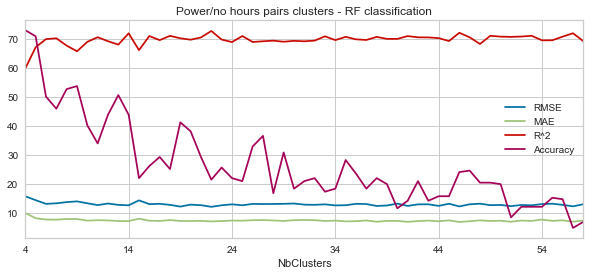

In [175]:
fig_size = plt.rcParams["figure.figsize"]  
fig_size[0] = 10
fig_size[1] = 4
dfResult[(dfResult["Algorithm"]=="RF")&(dfResult["Target Type"]=="Power-Nohours")][["RMSE","MAE","R^2","Accuracy"]].plot(title="Power/no hours pairs clusters - RF classification")
plt.legend()
plt.show()

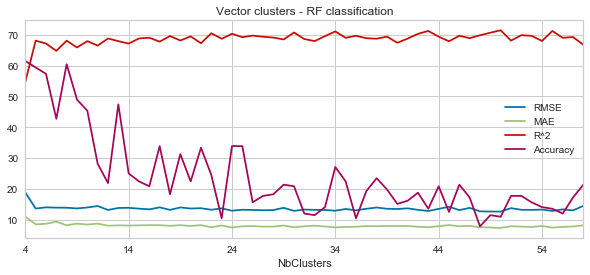

In [176]:
dfResult[(dfResult["Algorithm"]=="RF")&(dfResult["Target Type"]=="Vector")][["RMSE","MAE","R^2","Accuracy"]].plot(title="Vector clusters - RF classification")

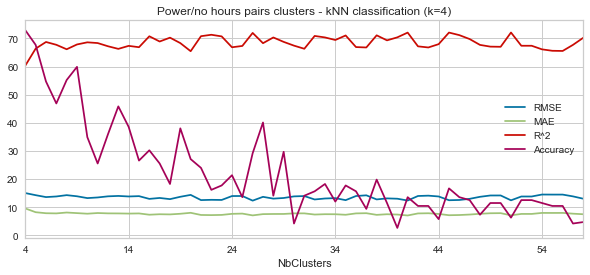

In [177]:
dfResult[(dfResult["Algorithm"]=="kNN")&(dfResult["Target Type"]=="Power-Nohours")][["RMSE","MAE","R^2","Accuracy"]].plot(title="Power/no hours pairs clusters - kNN classification (k=4)")

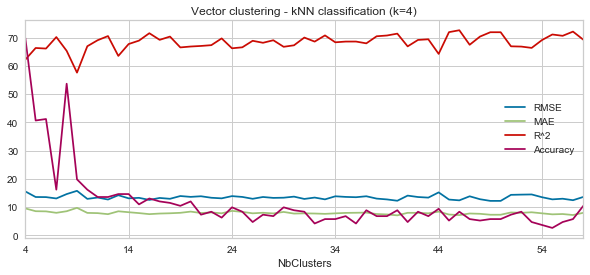

In [178]:
dfResult[(dfResult["Algorithm"]=="kNN")&(dfResult["Target Type"]=="Vector")][["RMSE","MAE","R^2","Accuracy"]].plot(title="Vector clustering - kNN classification (k=4)")

In [179]:
dfResult["R^2"].idxmax()

'22'

In [180]:
dfResult["R^2"].max()

72.66

In [181]:
dfResult[dfResult["Target Type"]=="Vector"]["R^2"].max()

72.57

In [182]:
dfResult[(dfResult["R^2"]>=dfResult["R^2"].max())]

,Algorithm,NbClusters,RMSE,MAE,R^2,Accuracy,Daily MAE,Daily R2,Daily RMSE,Target Type
NbClusters,,,,,,,,,,
22,RF,22,11.97,6.93,72.66,21.354167,120.19,85.22,177.59,Power-Nohours


In [183]:
dfResult["Accuracy"].max()

72.91666666666666

In [184]:
dfResult[(dfResult["Accuracy"]>dfResult["Accuracy"].max()-20)]

,Algorithm,NbClusters,RMSE,MAE,R^2,Accuracy,Daily MAE,Daily R2,Daily RMSE,Target Type
NbClusters,,,,,,,,,,
4,RF,4,15.60,9.85,59.75,72.916667,120.93,85.0,178.91,Power-Nohours
4,kNN,4,15.00,9.53,60.35,72.916667,120.93,85.0,178.91,Power-Nohours
5,RF,5,14.26,8.04,67.06,70.833333,120.93,85.0,178.91,Power-Nohours
5,kNN,5,14.25,8.19,66.38,67.708333,120.93,85.0,178.91,Power-Nohours
6,kNN,6,13.57,7.83,68.74,54.687500,120.93,85.0,178.91,Power-Nohours
8,kNN,8,14.26,8.08,66.15,55.208333,120.93,85.0,178.91,Power-Nohours
9,RF,9,13.85,7.75,65.65,53.645833,120.93,85.0,178.91,Power-Nohours
9,kNN,9,13.86,7.87,67.86,59.895833,120.93,85.0,178.91,Power-Nohours
4,RF,4,18.81,11.00,54.72,61.458333,120.93,85.0,178.91,Vector


In [185]:
dfResult[ (dfResult["NbClusters"]=="8")]

,Algorithm,NbClusters,RMSE,MAE,R^2,Accuracy,Daily MAE,Daily R2,Daily RMSE,Target Type
NbClusters,,,,,,,,,,
8,RF,8,13.59,7.77,67.61,52.604167,120.93,85.0,178.91,Power-Nohours
8,kNN,8,14.26,8.08,66.15,55.208333,120.93,85.0,178.91,Power-Nohours
8,RF,8,13.87,8.18,68.06,60.416667,120.93,85.0,178.91,Vector
8,kNN,8,14.58,8.51,65.28,53.645833,120.93,85.0,178.91,Vector


In [186]:
#Add column with algo and target concatenated
dfResult["AlgoTarget"] = dfResult["Target Type"]+" / "+dfResult["Algorithm"]

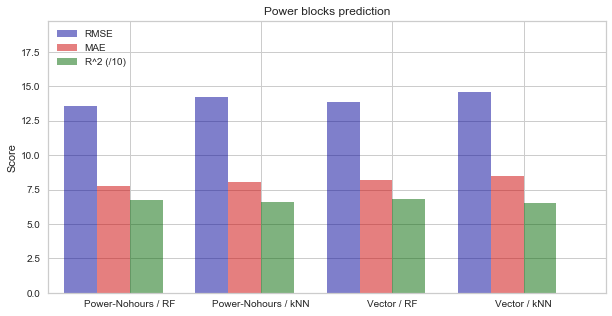

In [187]:
# Setting the positions and width for the bars
df_plot = dfResult[(dfResult["NbClusters"]=="8")].copy()
df_plot["R^2"] = df_plot["R^2"] / 10
pos = list(range(len(df_plot['AlgoTarget']))) 
width = 0.25 
colors = ['#000099', '#CC0000', '#006600']
colNames = ['RMSE','MAE','R^2']
# Plotting the bars
fig, ax = plt.subplots(figsize=(10,5))

iNbGroup = 0
# Create a bar with pre_score data,
# in position pos,
for colName, colColor in zip(colNames,colors):
    plt.bar([p + iNbGroup*width for p in pos],
            # data in column
            df_plot[colName], 
            # of width
            width, 
            # with alpha 0.5
            alpha=0.5, 
            # with color
            color=colColor, 
            # with label the first value in first_name
            label="") 
    iNbGroup += 1

#plot grid
ax.grid()

# Set the y axis label
ax.set_ylabel('Score')

# Set the chart's title
ax.set_title('Power blocks prediction')

# Set the position of the x ticks
ax.set_xticks([p + 1.5 * width for p in pos])

# Set the labels for the x ticks
ax.set_xticklabels(df_plot['AlgoTarget'])



# Setting the x-axis and y-axis limits
plt.xlim(min(pos)-width, max(pos)+width*4)
plt.ylim([0, max(df_plot['RMSE'] + df_plot['MAE'] + df_plot['R^2'])/1.5] )

# Adding the legend and showing the plot
plt.legend(['RMSE', 'MAE', 'R^2 (/10)'], loc='upper left')
plt.grid()
plt.show()

## Clustering results detailed analysis

Nb of clusters 8
Nb of centers 8, list:[114, 1609, 692, 1184, 230, 489, 1889, 622]


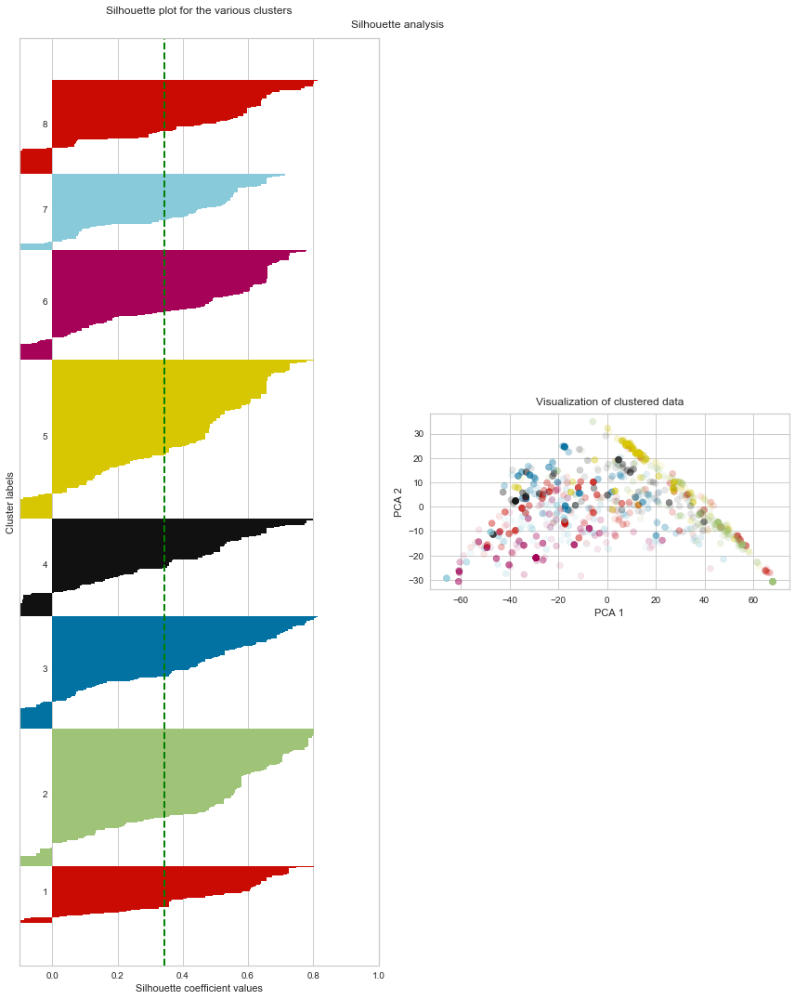

In [188]:
# Look into more details at the solution using 8 clusters

iNbClusters = 9 

cols =  ['PrioH1','PrioH2','PrioH3','PrioH4', 'PrioP1','PrioP2','PrioP3','PrioP4']

# resize power values before clustering
df_resizePower= df.copy()
for i in range (1,4+1):
    df_resizePower["PrioP"+str(i)] =  df_resizePower["PrioP"+str(i)]/df_resizePower["Max prod"]
df_resizePower.replace(np.inf, np.nan, inplace=True)
df_resizePower.fillna(0, inplace=True)

df_cluster, centers = clusterCreation(iNbClusters, df_resizePower, cols, plotSil = True)
iNbClustRes = len(centers)


Text(0.5, 1.0, 'Clusters distribution')

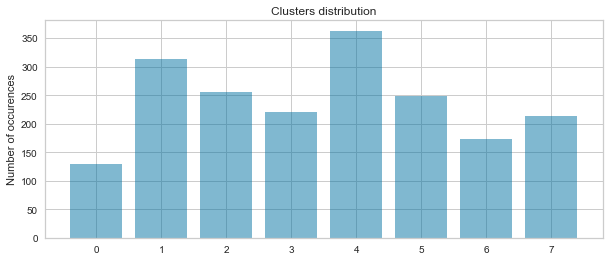

In [189]:
# plot distribution
fig_size = plt.rcParams["figure.figsize"]  
fig_size[0] = 10
fig_size[1] = 4

NbOfOccurences = [len(np.where(df_cluster["cluster_id"]==i)[0]) for i in range(iNbClustRes)]
plt.bar(np.arange(iNbClustRes), NbOfOccurences, align='center', alpha=0.5 )

plt.xticks(np.arange(iNbClustRes), np.arange(iNbClustRes))
plt.ylabel('Number of occurences')
plt.title('Clusters distribution')

Text(0.5, 1.0, 'Clusters distribution')

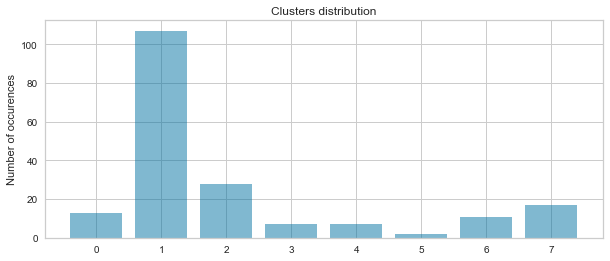

In [190]:
# same about test period
df_clustest= df_cluster.iloc[1917-192:,].copy()

NbOfOccurences = [len(np.where(df_clustest["cluster_id"]==i)[0]) for i in range(iNbClustRes)]
plt.bar(np.arange(iNbClustRes), NbOfOccurences, align='center', alpha=0.5 )

plt.xticks(np.arange(iNbClustRes), np.arange(iNbClustRes))
plt.ylabel('Number of occurences')
plt.title('Clusters distribution')


In [191]:
# print out details of the profiles, i.e. clusters centroids 
df_TypicalProfiles = pd.DataFrame(index=np.arange(iNbClustRes), columns = cols)

for i in np.arange(iNbClustRes):
    df_TypicalProfiles.iloc[i,][cols] = df_cluster.iloc[centers[i],][cols]

# round last column for pretty printing
df_TypicalProfiles[['PrioP1', 'PrioP2', 'PrioP3', 'PrioP4']] = \
            df_TypicalProfiles[['PrioP1', 'PrioP2', 'PrioP3', 'PrioP4']]. \
            apply(pd.to_numeric, errors='coerce').round(2)
        
df_TypicalProfiles

,PrioH1,PrioH2,PrioH3,PrioH4,PrioP1,PrioP2,PrioP3,PrioP4
0,12,3,1,0,0.07,0.06,0.03,0.00
1,3,1,0,0,0.31,0.07,0.00,0.00
2,2,6,8,0,0.09,0.08,0.05,0.00
3,5,4,10,0,0.10,0.05,0.03,0.00
4,8,8,0,0,0.08,0.05,0.00,0.00
5,3,5,4,4,0.08,0.07,0.06,0.05
6,4,2,2,10,0.11,0.06,0.05,0.03
7,3,5,8,8,0.07,0.06,0.05,0.01


In [192]:
len(df_TypicalProfiles.index)

8

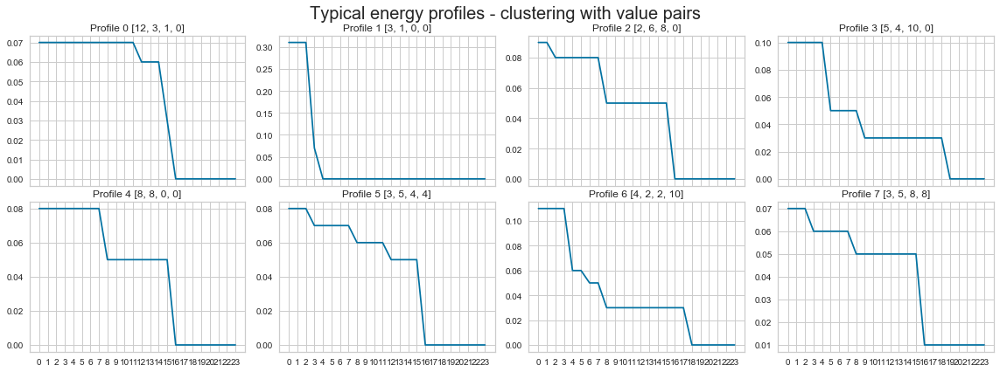

<Figure size 1152x432 with 0 Axes>

In [193]:
#turn blocks into 24 hours vectors
dfVect = get24hoursEnergyVector("PrioH", "PrioP", df_TypicalProfiles)

fig_size = plt.rcParams["figure.figsize"]  
fig_size[0] = 16
fig_size[1] = 6

nbcols = 4
nbrows = 2

fig, axes = plt.subplots(ncols=nbcols, nrows = nbrows, sharex=True)
fig.suptitle('Typical energy profiles - clustering with value pairs', size=20)
fig.tight_layout()
fig.subplots_adjust(top=0.9) 

# plot all profiles in the grid
plt.figure(0)
for i in range(nbrows): # rows
    for j in range(nbcols): # columns
        if (i*nbcols+j) < len(df_TypicalProfiles.index):
            axes.flat[i*nbcols+j].plot(dfVect.loc[i*nbcols+j,])   
            axes.flat[i*nbcols+j].xaxis.grid(True)
            axes.flat[i*nbcols+j].yaxis.grid(True)
            hoursLst = [int(df_TypicalProfiles.iloc[i*nbcols+j,]["PrioH"+str(k)]) for k in range(1,4+1)]
            axes.flat[i*nbcols+j].title.set_text('Profile '+str(i*nbcols+j)+" "+str(hoursLst))
plt.tight_layout()
plt.show()

In [194]:
df_cluster.head()

,PrioH1,PrioH2,PrioH3,PrioH4,PrioP1,PrioP2,PrioP3,PrioP4,cluster_id
Date,,,,,,,,,
2014-04-01,4.0,4.0,8.0,0.0,0.081782,0.073138,0.047540,0.0,2
2014-04-02,4.0,4.0,8.0,0.0,0.081782,0.073138,0.047540,0.0,2
2014-04-03,4.0,4.0,8.0,0.0,0.081782,0.073138,0.047540,0.0,2
2014-04-04,4.0,4.0,8.0,0.0,0.081782,0.073138,0.047540,0.0,2
2014-04-05,4.0,4.0,8.0,0.0,0.080882,0.073529,0.047794,0.0,2


In [195]:
# compute clustering error, i.e error if classification could reach a 100% accuracy in this case
# copy the centroid values as power values on the dataframe
for prefix in ["PrioP","PrioH"]:
            for iPair in range(1,4+1):
                res = np.zeros(len(df_cluster.index))
                for myIndex in range(len(df_cluster.index)):
                    indexInOrigDF = int(df_cluster.iloc[myIndex]["cluster_id"])
                    res[myIndex] = df_cluster.iloc[indexInOrigDF][prefix+str(iPair)]
                df_cluster[prefix+str(iPair)] = res

# resize power values
for i in range (1,4+1):
    df_cluster["PrioP"+str(i)] =  df_cluster["PrioP"+str(i)]*df_resizePower["Max prod"]  

In [196]:
df.shape

(1917, 30)

In [197]:
1917*24

46008

In [198]:
df_cluster.fillna(0, inplace=True)
df_cluster.isnull().values.any

<function ndarray.any>

In [199]:
RMSE, MAE, R2, DailyRMSE, DailyMAE, DailyR2 = hourlyErrorMeasure (df_cluster, df)  

df_error = pd.DataFrame(data = [[RMSE, MAE, R2, DailyRMSE, DailyMAE, DailyR2]], 
                                  columns = ["RMSE", "MAE", "R2", "Daily RMSE", "Daily MAE", "DailyR2"])
df_error

Hourly comparison: prediction vs. actual values
RMSE :15.92
MAE :9.49
R^2 :72.26
Daily comparison (max prod): prediction vs. actual values
RMSE :0.0
MAE :0.0
R^2 :100.0


,RMSE,MAE,R2,Daily RMSE,Daily MAE,DailyR2
0,15.92,9.49,72.26,0.0,0.0,100.0


In [200]:
# same analysis with vector representation ?

### Random forest classification variables importance scores

In [201]:
# add cluster allocation to our dataset
df["cluster_id"] = df_cluster["cluster_id"]

In [202]:
df.head()

,Date,Min prod,Inflow lake 1 [m3],Inflow lake 2 [m3],Inflow lake 3 [m3],Inflow lake 4 [m3],Vol lake 1 [%],Max lake 1 [1000m3],Availability plant 1 [%],Availability plant 2 [%],...,PrioP3,PrioH4,PrioP4,TotalAvailablePower,EnergyPair1,EnergyPair2,EnergyPair3,EnergyPair4,TotalNbHours,cluster_id
Date,,,,,,,,,,,,,,,,,,,,,
2014-04-01,2014-04-01,0.0,31.0,4.0,129.0,107.0,0.16467,30000.0,1.0,1.0,...,42.9,0.0,0.0,77.400,295.2,264.0,343.2,0.0,16.0,2
2014-04-02,2014-04-02,150.0,0.0,-14.0,148.0,116.0,0.15557,30000.0,1.0,1.0,...,42.9,0.0,0.0,77.400,295.2,264.0,343.2,0.0,16.0,2
2014-04-03,2014-04-03,150.0,10.0,6.0,132.0,118.0,0.14765,30000.0,1.0,1.0,...,42.9,0.0,0.0,59.125,295.2,264.0,343.2,0.0,16.0,2
2014-04-04,2014-04-04,150.0,19.0,6.0,150.0,118.0,0.13716,30000.0,1.0,1.0,...,42.9,0.0,0.0,58.050,295.2,264.0,343.2,0.0,16.0,2
2014-04-05,2014-04-05,180.0,41.0,15.0,148.0,124.0,0.13091,30000.0,1.0,1.0,...,42.9,0.0,0.0,77.400,290.4,264.0,343.2,0.0,16.0,2


In [203]:
def selectKImportance(model, X, k=5):
     return X[:,model.feature_importances_.argsort()[::-1][:k]]

In [204]:
# train RF model to extract its variables importance

target_feature = 'cluster_id'
regressors = ['Inflow lake 1 [m3]', \
           'Inflow lake 2 [m3]', 'Inflow lake 3 [m3]', 'Inflow lake 4 [m3]', \
           'Vol lake 1 [%]', 'Max lake 1 [1000m3]', 'Availability plant 1 [%]', \
           'Availability plant 2 [%]', 'Availability plant 3 [%]', \
           'Availability plant 4 [%]','Weekend','Max prod']

np.random.seed(42) # set seed for reproducibility

# split train and test
xTrain, xTest, yTrain, yTest, yBaseline =  GetDataSplit(df, regressors, target_feature,[],0.9)

# Forecast using Random Forest (1000 trees)
RFmodel = RandomForestClassifier(n_estimators=1000)

# Fit model with features and labels.
classifyModel = RFmodel.fit(xTrain, yTrain)

importances = classifyModel.feature_importances_
std = np.std([tree.feature_importances_ for tree in classifyModel.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(xTrain.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))  



Feature ranking:
1. feature 11 (0.240781)
2. feature 4 (0.156389)
3. feature 3 (0.107092)
4. feature 2 (0.103944)
5. feature 1 (0.095017)
6. feature 0 (0.087912)
7. feature 7 (0.070100)
8. feature 6 (0.044350)
9. feature 8 (0.028235)
10. feature 9 (0.026494)
11. feature 5 (0.025959)
12. feature 10 (0.013727)


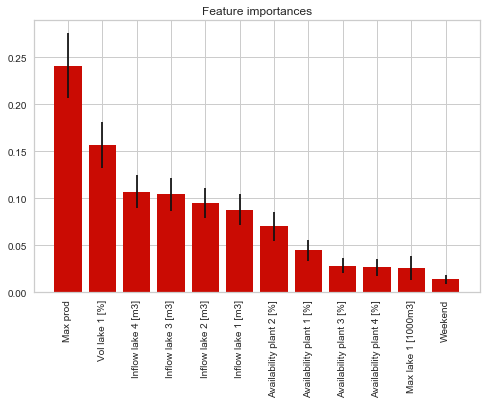

In [205]:
fig_size = plt.rcParams["figure.figsize"]  
fig_size[0] = 8
fig_size[1] = 5

# Plot the feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(range(xTrain.shape[1]), importances[indices],
       color="r", yerr=std[indices], align="center")
plt.xticks(range(xTrain.shape[1]), xTrain.columns[indices], rotation='vertical')
plt.xlim([-1, xTrain.shape[1]])
plt.show()

In [206]:
# perform prediction using the model
pred = RFmodel.predict(xTest)

report = classification_report(yTest, pred, output_dict=False)
print(report)

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        13
           1       0.97      0.92      0.94       107
           2       0.31      0.93      0.46        28
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         7
           5       0.00      0.00      0.00         2
           6       0.00      0.00      0.00        11
           7       0.00      0.00      0.00        17

    accuracy                           0.65       192
   macro avg       0.16      0.23      0.18       192
weighted avg       0.59      0.65      0.59       192



C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [207]:
iNbClustRes

8

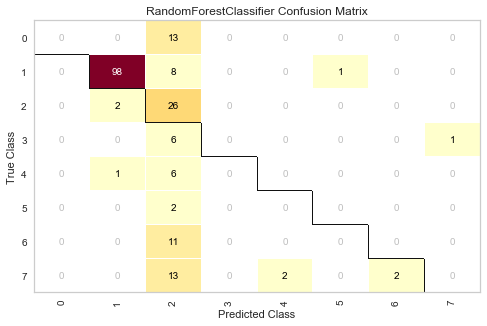

In [208]:
from yellowbrick.classifier import ConfusionMatrix

fig_size = plt.rcParams["figure.figsize"]  
fig_size[0] = 8
fig_size[1] = 5

# The ConfusionMatrix visualizer taxes a model
cm = ConfusionMatrix(RFmodel)

# Fit fits the passed model. This is unnecessary if you pass the visualizer a pre-fitted model
cm.fit(xTrain, yTrain)

# To create the ConfusionMatrix, we need some test data. Score runs predict() on the data
# and then creates the confusion_matrix from scikit-learn.
cm.score(xTest, yTest)

# How did we do?
cm.poof()


### Classification results detailed analysis - Vector representation

In [209]:
# Look into more details at the solution using 8 clusters using vector representation
df.head()

,Date,Min prod,Inflow lake 1 [m3],Inflow lake 2 [m3],Inflow lake 3 [m3],Inflow lake 4 [m3],Vol lake 1 [%],Max lake 1 [1000m3],Availability plant 1 [%],Availability plant 2 [%],...,PrioP3,PrioH4,PrioP4,TotalAvailablePower,EnergyPair1,EnergyPair2,EnergyPair3,EnergyPair4,TotalNbHours,cluster_id
Date,,,,,,,,,,,,,,,,,,,,,
2014-04-01,2014-04-01,0.0,31.0,4.0,129.0,107.0,0.16467,30000.0,1.0,1.0,...,42.9,0.0,0.0,77.400,295.2,264.0,343.2,0.0,16.0,2
2014-04-02,2014-04-02,150.0,0.0,-14.0,148.0,116.0,0.15557,30000.0,1.0,1.0,...,42.9,0.0,0.0,77.400,295.2,264.0,343.2,0.0,16.0,2
2014-04-03,2014-04-03,150.0,10.0,6.0,132.0,118.0,0.14765,30000.0,1.0,1.0,...,42.9,0.0,0.0,59.125,295.2,264.0,343.2,0.0,16.0,2
2014-04-04,2014-04-04,150.0,19.0,6.0,150.0,118.0,0.13716,30000.0,1.0,1.0,...,42.9,0.0,0.0,58.050,295.2,264.0,343.2,0.0,16.0,2
2014-04-05,2014-04-05,180.0,41.0,15.0,148.0,124.0,0.13091,30000.0,1.0,1.0,...,42.9,0.0,0.0,77.400,290.4,264.0,343.2,0.0,16.0,2


Nb of clusters 8
Nb of centers 8, list:[1885, 1590, 639, 290, 1065, 923, 1355, 710]


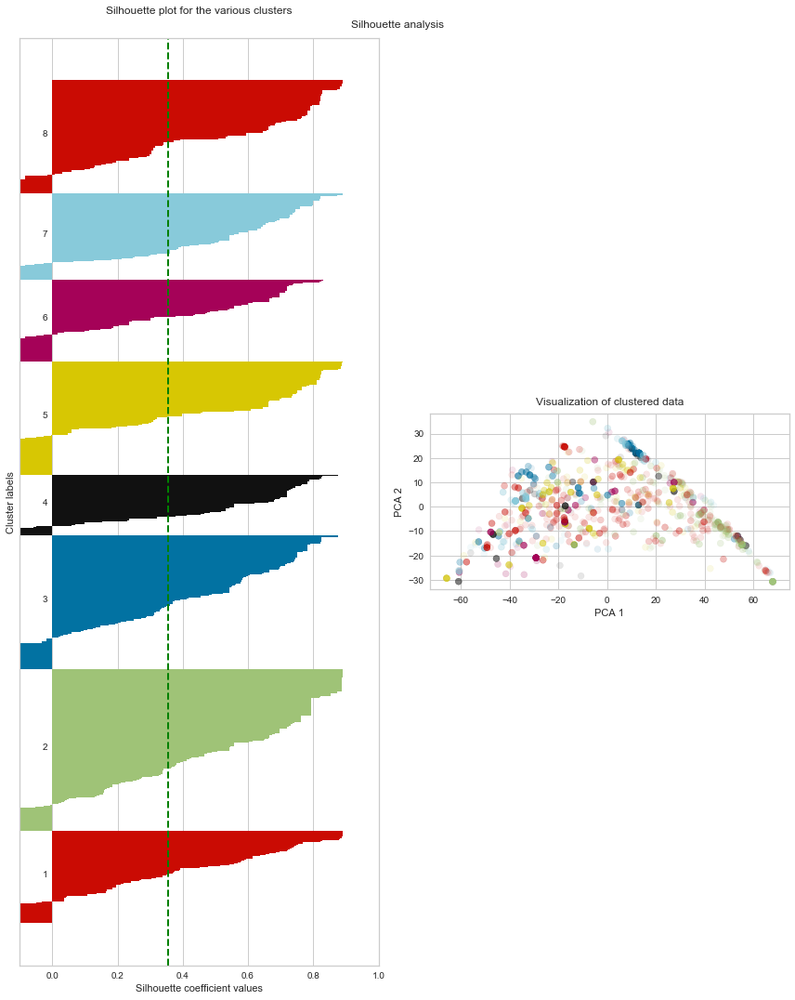

In [210]:
iNbClusters = 9 

df["cluster_id"] = 0

cols =  ['P'+str(i) for i in range(24)]

# resize power values before clustering
df_resizePower= df.copy()
for i in range (1,4+1):
    df_resizePower["PrioP"+str(i)] =  df_resizePower["PrioP"+str(i)]/df_resizePower["Max prod"]
df_resizePower.replace(np.inf, np.nan, inplace=True)
df_resizePower.fillna(0, inplace=True)

# create the 24 hours vector columns in the dataframe, using the blocks definition
dfVector = get24hoursEnergyVector("PrioH", "PrioP", df_resizePower, "P")
for i in range(24):
    df_resizePower["P"+str(i)] =  dfVector["P"+str(i)]
    
df_cluster, centers = clusterCreation(iNbClusters, df_resizePower, cols, targetType = "Vector", plotSil = True)
iNbClustRes = len(centers)

Text(0.5, 1.0, 'Clusters distribution')

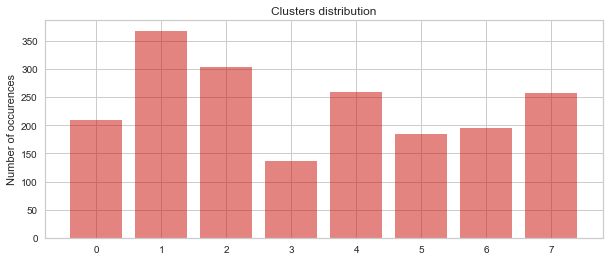

In [211]:
# plot distribution
fig_size = plt.rcParams["figure.figsize"]  
fig_size[0] = 10
fig_size[1] = 4

NbOfOccurences = [len(np.where(df_cluster["cluster_id"]==i)[0]) for i in range(iNbClustRes)]
plt.bar(np.arange(iNbClustRes), NbOfOccurences, align='center', color='r', alpha=0.5 )

plt.xticks(np.arange(iNbClustRes), np.arange(iNbClustRes))
plt.ylabel('Number of occurences')
plt.title('Clusters distribution')

Text(0.5, 1.0, 'Clusters distribution')

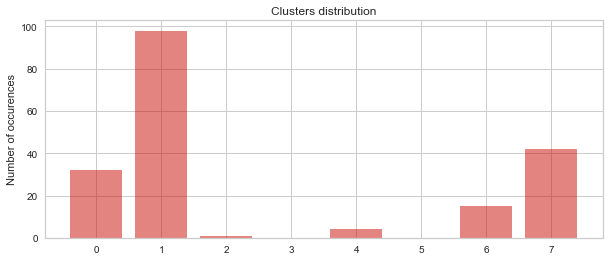

In [212]:
# same about test period
df_clustest= df_cluster.iloc[1917-192:,].copy()

NbOfOccurences = [len(np.where(df_clustest["cluster_id"]==i)[0]) for i in range(iNbClustRes)]
plt.bar(np.arange(iNbClustRes), NbOfOccurences, align='center', color='r', alpha=0.5 )

plt.xticks(np.arange(iNbClustRes), np.arange(iNbClustRes))
plt.ylabel('Number of occurences')
plt.title('Clusters distribution')

In [213]:
# print out details of the profiles, i.e. clusters centroids 
df_TypicalProfiles = pd.DataFrame(index=np.arange(iNbClustRes), columns = cols)

for i in np.arange(iNbClustRes):
    df_TypicalProfiles.iloc[i,][cols] = df_cluster.iloc[centers[i],][cols]

# round last column for pretty printing
df_TypicalProfiles = df_TypicalProfiles.apply(pd.to_numeric, errors='coerce').round(2)

df_TypicalProfiles

,P0,P1,P2,P3,P4,P5,P6,P7,P8,P9,...,P14,P15,P16,P17,P18,P19,P20,P21,P22,P23
0,0.12,0.12,0.12,0.12,0.07,0.07,0.07,0.07,0.07,0.05,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1,0.44,0.28,0.20,0.08,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,0.08,0.08,0.07,0.07,0.07,0.07,0.07,0.07,0.05,0.05,...,0.05,0.05,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
3,0.07,0.07,0.07,0.07,0.06,0.06,0.06,0.06,0.06,0.06,...,0.06,0.06,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
4,0.08,0.08,0.08,0.08,0.08,0.08,0.08,0.08,0.04,0.04,...,0.04,0.04,0.01,0.01,0.00,0.00,0.00,0.00,0.00,0.00
5,0.09,0.09,0.09,0.09,0.07,0.07,0.07,0.07,0.07,0.07,...,0.05,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
6,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.04,...,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04
7,0.08,0.08,0.07,0.07,0.07,0.07,0.07,0.04,0.04,0.04,...,0.04,0.04,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02


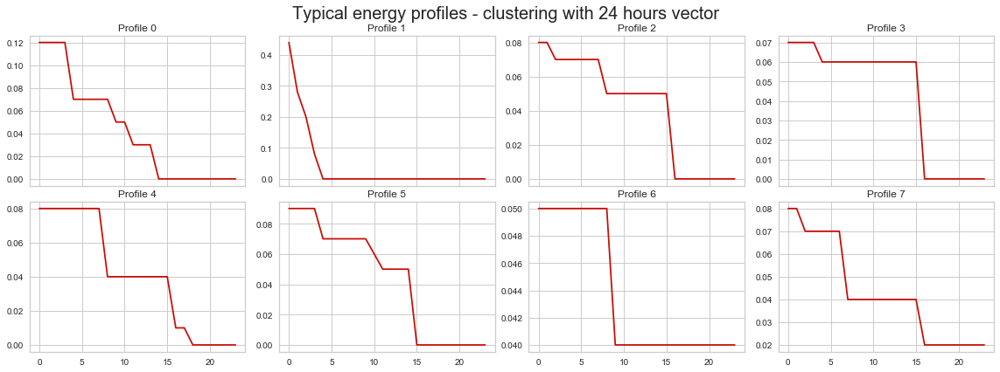

<Figure size 1152x432 with 0 Axes>

In [214]:
#turn blocks into 24 hours vectors
dfVect = df_TypicalProfiles 
dfVect.columns = [i for i in range(24)]

fig_size = plt.rcParams["figure.figsize"]  
fig_size[0] = 16
fig_size[1] = 6

nbcols = 4
nbrows = 2

fig, axes = plt.subplots(ncols=nbcols, nrows = nbrows, sharex=True)
fig.suptitle('Typical energy profiles - clustering with 24 hours vector', size=20)
fig.tight_layout()
fig.subplots_adjust(top=0.9) 

# plot all profiles in the grid
plt.figure(0)
for i in range(nbrows): # rows
    for j in range(nbcols): # columns
        if (i*nbcols+j) < len(df_TypicalProfiles.index):
            axes.flat[i*nbcols+j].plot(dfVect.loc[i*nbcols+j,], c='r')
            axes.flat[i*nbcols+j].xaxis.grid(True)
            axes.flat[i*nbcols+j].yaxis.grid(True)
            axes.flat[i*nbcols+j].title.set_text('Profile '+str(i*nbcols+j))
plt.tight_layout()
plt.show()


In [215]:
# compute clustering error, i.e error if classification could reach a 100% accuracy in this case
# copy the centroid values as power values on the dataframe
for prefix in ["PrioP","PrioH"]:
            for iPair in range(1,4+1):
                res = np.zeros(len(df_cluster.index))
                for myIndex in range(len(df_cluster.index)):
                    indexInOrigDF = int(df_cluster.iloc[myIndex]["cluster_id"])
                    res[myIndex] = df_resizePower.iloc[centers[indexInOrigDF]][prefix+str(iPair)]
                df_cluster[prefix+str(iPair)] = res

# resize power values
for i in range (1,4+1):
    df_cluster["PrioP"+str(i)] =   df_cluster["PrioP"+str(i)]*df["Max prod"]   
    
df_cluster.fillna(0, inplace=True)

In [216]:
df_cluster.head()

,P0,P1,P2,P3,P4,P5,P6,P7,P8,P9,...,P23,cluster_id,PrioP1,PrioP2,PrioP3,PrioP4,PrioH1,PrioH2,PrioH3,PrioH4
Date,,,,,,,,,,,,,,,,,,,,,
2014-04-01,0.081782,0.081782,0.081782,0.081782,0.073138,0.073138,0.073138,0.073138,0.047540,0.047540,...,0.0,2,75.099867,67.289481,43.557923,0.0,2.0,6.0,8.0,0.0
2014-04-02,0.081782,0.081782,0.081782,0.081782,0.073138,0.073138,0.073138,0.073138,0.047540,0.047540,...,0.0,2,75.099867,67.289481,43.557923,0.0,2.0,6.0,8.0,0.0
2014-04-03,0.081782,0.081782,0.081782,0.081782,0.073138,0.073138,0.073138,0.073138,0.047540,0.047540,...,0.0,2,75.099867,67.289481,43.557923,0.0,2.0,6.0,8.0,0.0
2014-04-04,0.081782,0.081782,0.081782,0.081782,0.073138,0.073138,0.073138,0.073138,0.047540,0.047540,...,0.0,2,75.099867,67.289481,43.557923,0.0,2.0,6.0,8.0,0.0
2014-04-05,0.080882,0.080882,0.080882,0.080882,0.073529,0.073529,0.073529,0.073529,0.047794,0.047794,...,0.0,2,74.700399,66.931558,43.326232,0.0,2.0,6.0,8.0,0.0


In [217]:
RMSE, MAE, R2, DailyRMSE, DailyMAE, DailyR2 = hourlyErrorMeasure (df_cluster, df)  

df_error = pd.DataFrame(data = [[RMSE, MAE, R2, DailyRMSE, DailyMAE, DailyR2]], 
                                  columns = ["RMSE", "MAE", "R2", "Daily RMSE", "Daily MAE", "DailyR2"])
df_error

Hourly comparison: prediction vs. actual values
RMSE :8.84
MAE :4.88
R^2 :89.55
Daily comparison (max prod): prediction vs. actual values
RMSE :0.0
MAE :0.0
R^2 :100.0


,RMSE,MAE,R2,Daily RMSE,Daily MAE,DailyR2
0,8.84,4.88,89.55,0.0,0.0,100.0


In [218]:
# classification problem with RF
# train RF model to extract its variables importance

target_feature = 'cluster_id'
regressors = ['Inflow lake 1 [m3]', \
           'Inflow lake 2 [m3]', 'Inflow lake 3 [m3]', 'Inflow lake 4 [m3]', \
           'Vol lake 1 [%]', 'Max lake 1 [1000m3]', 'Availability plant 1 [%]', \
           'Availability plant 2 [%]', 'Availability plant 3 [%]', \
           'Availability plant 4 [%]','Weekend','Max prod']

df["cluster_id"] = df_cluster["cluster_id"]

np.random.seed(42) # set seed for reproducibility

# split train and test
xTrain, xTest, yTrain, yTest, yBaseline =  GetDataSplit(df, regressors, target_feature,[],0.9)
xTest["Max prod"] = df_MLPprediction["Prediction"]

# Forecast using Random Forest (1000 trees)
RFmodel = RandomForestClassifier(n_estimators=1000)

# Fit model with features and labels.
classifyModel = RFmodel.fit(xTrain, yTrain)

importances = classifyModel.feature_importances_
std = np.std([tree.feature_importances_ for tree in classifyModel.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(xTrain.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

Feature ranking:
1. feature 11 (0.323884)
2. feature 4 (0.147991)
3. feature 2 (0.089369)
4. feature 3 (0.089342)
5. feature 1 (0.086067)
6. feature 0 (0.082316)
7. feature 7 (0.060660)
8. feature 6 (0.035298)
9. feature 9 (0.032499)
10. feature 5 (0.020621)
11. feature 8 (0.020273)
12. feature 10 (0.011680)


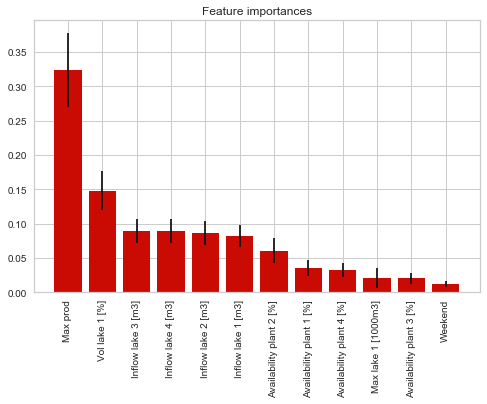

In [219]:
# Plot the scores as bars

fig_size = plt.rcParams["figure.figsize"]  
fig_size[0] = 8
fig_size[1] = 5

# Plot the feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(range(xTrain.shape[1]), importances[indices],
       color="r", yerr=std[indices], align="center")
plt.xticks(range(xTrain.shape[1]), xTrain.columns[indices], rotation='vertical')
plt.xlim([-1, xTrain.shape[1]])
plt.show()

In [220]:
# perform prediction using the model
pred = RFmodel.predict(xTest)

report = classification_report(yTest, pred, output_dict=False)
print(report)

              precision    recall  f1-score   support

           0       0.44      0.34      0.39        32
           1       0.87      0.88      0.87        98
           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         0
           4       0.08      0.50      0.14         4
           5       0.00      0.00      0.00         0
           6       0.60      0.20      0.30        15
           7       1.00      0.02      0.05        42

    accuracy                           0.54       192
   macro avg       0.37      0.24      0.22       192
weighted avg       0.78      0.54      0.55       192



C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


C:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


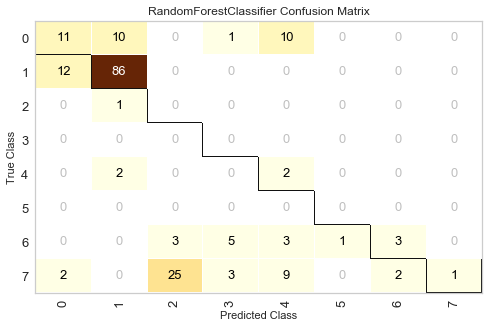

In [221]:
from yellowbrick.classifier import ConfusionMatrix

fig_size = plt.rcParams["figure.figsize"]  
fig_size[0] = 8
fig_size[1] = 5

# The ConfusionMatrix visualizer taxes a model
cm = ConfusionMatrix(RFmodel,fontsize=13, cmap='YlOrBr')

# Fit fits the passed model. This is unnecessary if you pass the visualizer a pre-fitted model
#cm.fit(xTrain, yTrain)

# To create the ConfusionMatrix, we need some test data. Score runs predict() on the data
# and then creates the confusion_matrix from scikit-learn.
cm.score(xTest, yTest)

# How did we do?
cm.poof()

In [222]:
# compute hourly error on the forecast
dfPref = pd.DataFrame(index=xTest.index, columns=cols)
dfPref["cluster_id"] = pred

# populate the power values
for prefix in ["PrioP","PrioH"]:
            for iPair in range(1,4+1):
                res = np.zeros(len(dfPref.index))
                for myIndex in range(len(dfPref.index)):
                    indexInOrigDF = int(dfPref.iloc[myIndex]["cluster_id"])
                    res[myIndex] = df_resizePower.iloc[centers[indexInOrigDF]][prefix+str(iPair)]
                dfPref[prefix+str(iPair)] = res

# resize power values with the predicted maximum energy (imported data)
for i in range (1,4+1):
    dfPref["PrioP"+str(i)] =  dfPref["PrioP"+str(i)]*df_MLPprediction["Prediction"]  
    
dfPref.fillna(0, inplace=True)


In [223]:
RMSE, MAE, R2, DailyRMSE, DailyMAE, DailyR2 = hourlyErrorMeasure (dfPref, df.iloc[1917-192:,])  

df_error = pd.DataFrame(data = [[RMSE, MAE, R2, DailyRMSE, DailyMAE, DailyR2]], 
                                  columns = ["RMSE", "MAE", "R2", "Daily RMSE", "Daily MAE", "DailyR2"])
df_error

Hourly comparison: prediction vs. actual values
RMSE :13.7
MAE :7.78
R^2 :67.7
Daily comparison (max prod): prediction vs. actual values
RMSE :178.91
MAE :120.93
R^2 :85.0


,RMSE,MAE,R2,Daily RMSE,Daily MAE,DailyR2
0,13.7,7.78,67.7,178.91,120.93,85.0


In [ ]:
# plot the predicted energy by block
plotEnergyBlocks(dfPref, "Block", "RF_8Clust_Vector")
# df.iloc[1917-192:,]

In [ ]:
# as a final experiment, we use the forecasted profile in its original magnitude 
# i.e. not resized towards the predicted maximum energy
# unfortunately it doesn't bring any improvement

# populate the power values
for prefix in ["PrioP","PrioH"]:
            for iPair in range(1,4+1):
                res = np.zeros(len(dfPref.index))
                for myIndex in range(len(dfPref.index)):
                    indexInOrigDF = int(dfPref.iloc[myIndex]["cluster_id"])
                    res[myIndex] = df.iloc[centers[indexInOrigDF]][prefix+str(iPair)]
                dfPref[prefix+str(iPair)] = res
    
dfPref.fillna(0, inplace=True)
                
RMSE, MAE, R2, DailyRMSE, DailyMAE, DailyR2 = hourlyErrorMeasure (dfPref, df.iloc[1917-192:,])  

df_error = pd.DataFrame(data = [[RMSE, MAE, R2, DailyRMSE, DailyMAE, DailyR2]], 
                                  columns = ["RMSE", "MAE", "R2", "Daily RMSE", "Daily MAE", "DailyR2"])
df_error

## Classification using MLP <a name='MLP' /> </a>

Here we try to beat the classification accuracy at C=8 clusters,using vector representation

In [692]:
df.head()

,Date,Min prod,Inflow lake 1 [m3],Inflow lake 2 [m3],Inflow lake 3 [m3],Inflow lake 4 [m3],Vol lake 1 [%],Max lake 1 [1000m3],Availability plant 1 [%],Availability plant 2 [%],...,PrioH3,PrioP3,PrioH4,PrioP4,EnergyPair1,EnergyPair2,EnergyPair3,EnergyPair4,TotalNbHours,cluster_id
Date,,,,,,,,,,,,,,,,,,,,,
2014-04-01,2014-04-01,0.0,31.0,4.0,129.0,107.0,0.16467,30000.0,1.0,1.0,...,8.0,42.9,0.0,0.0,295.2,264.0,343.2,0.0,16.0,2
2014-04-02,2014-04-02,150.0,0.0,-14.0,148.0,116.0,0.15557,30000.0,1.0,1.0,...,8.0,42.9,0.0,0.0,295.2,264.0,343.2,0.0,16.0,2
2014-04-03,2014-04-03,150.0,10.0,6.0,132.0,118.0,0.14765,30000.0,1.0,1.0,...,8.0,42.9,0.0,0.0,295.2,264.0,343.2,0.0,16.0,2
2014-04-04,2014-04-04,150.0,19.0,6.0,150.0,118.0,0.13716,30000.0,1.0,1.0,...,8.0,42.9,0.0,0.0,295.2,264.0,343.2,0.0,16.0,2
2014-04-05,2014-04-05,180.0,41.0,15.0,148.0,124.0,0.13091,30000.0,1.0,1.0,...,8.0,42.9,0.0,0.0,290.4,264.0,343.2,0.0,16.0,2


Nb of clusters 8
Nb of centers 8, list:[1885, 1590, 639, 290, 1065, 923, 1355, 710]


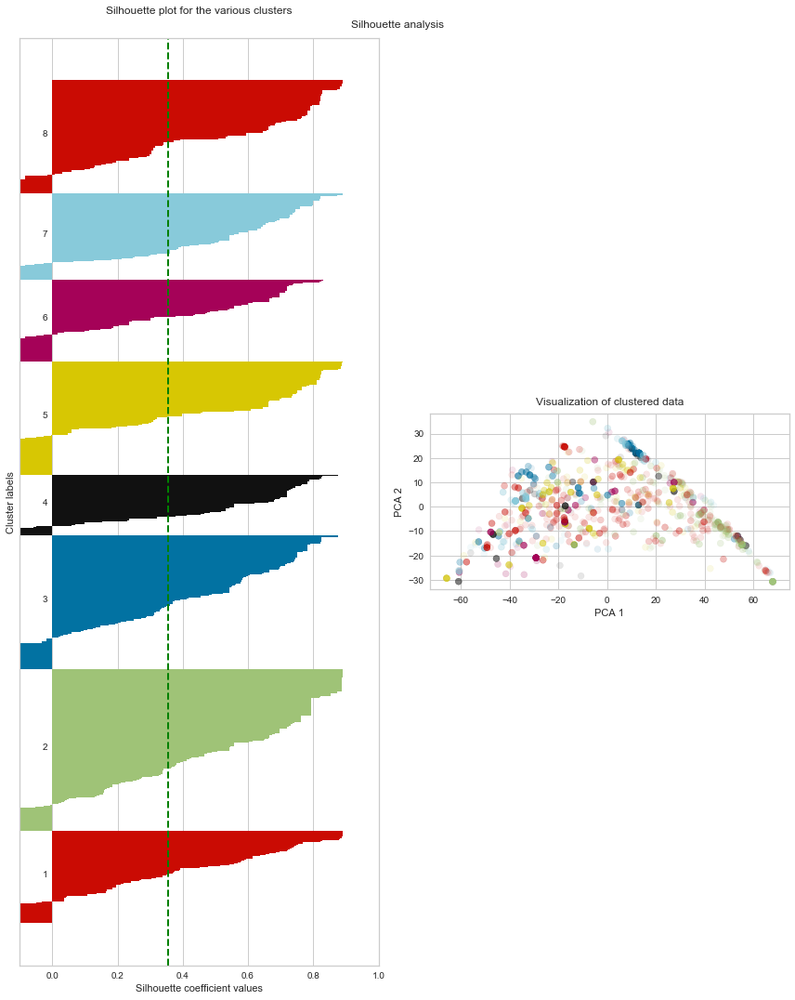

In [830]:
# Perform clustering with C=8

iNbClusters = 9 

df["cluster_id"] = 0

cols =  ['P'+str(i) for i in range(24)]

# resize power values before clustering
df_resizePower= df.copy()
for i in range (1,4+1):
    df_resizePower["PrioP"+str(i)] =  df_resizePower["PrioP"+str(i)]/df_resizePower["Max prod"]
df_resizePower.replace(np.inf, np.nan, inplace=True)
df_resizePower.fillna(0, inplace=True)

# create the 24 hours vector columns in the dataframe, using the blocks definition
dfVector = get24hoursEnergyVector("PrioH", "PrioP", df_resizePower, "P")
for i in range(24):
    df_resizePower["P"+str(i)] =  dfVector["P"+str(i)]
    
df_cluster, centers = clusterCreation(iNbClusters, df_resizePower, cols, targetType = "Vector", plotSil = True)
iNbClustRes = len(centers)


In [831]:
np.max(yTrain)

7

In [840]:
# define regression target and explainatory variables
target_feature = 'cluster_id'
regressors = ['Inflow lake 1 [m3]', \
           'Inflow lake 2 [m3]', 'Inflow lake 3 [m3]', 'Inflow lake 4 [m3]', \
           'Vol lake 1 [%]', 'Max lake 1 [1000m3]', 'Availability plant 1 [%]', \
           'Availability plant 2 [%]', 'Availability plant 3 [%]', \
           'Availability plant 4 [%]','Weekend','Max prod']

df["cluster_id"] = df_cluster["cluster_id"]

# implement mutli-output random forest
fullRegressors = regressors

xTrain, xTest, yTrain, yTest, yBaseline =  GetDataSplit(df, fullRegressors, target_feature,[],0.9)
# for the prediction part, replace the max energy with the forecasted value
xTest["Max prod"] = df_MLPprediction["Prediction"]

xTest.head()

,Inflow lake 1 [m3],Inflow lake 2 [m3],Inflow lake 3 [m3],Inflow lake 4 [m3],Vol lake 1 [%],Max lake 1 [1000m3],Availability plant 1 [%],Availability plant 2 [%],Availability plant 3 [%],Availability plant 4 [%],Weekend,Variante Prio
Date,,,,,,,,,,,,
2018-12-21,51.0,22.9,68.7,41.4,0.34519,30000.0,1.0,1.0,1.0,1.0,False,849.08440
2018-12-22,55.0,28.3,63.5,44.6,0.34262,30000.0,1.0,1.0,1.0,1.0,True,781.52800
2018-12-23,43.0,30.3,58.4,42.2,0.34089,30000.0,1.0,1.0,1.0,1.0,True,779.63550
2018-12-24,96.0,23.3,172.7,194.6,0.34020,30000.0,1.0,1.0,1.0,1.0,False,895.75410
2018-12-25,69.0,32.0,78.1,95.2,0.34089,30000.0,1.0,1.0,1.0,1.0,False,817.40027


In [841]:
xTrain.head()

,Inflow lake 1 [m3],Inflow lake 2 [m3],Inflow lake 3 [m3],Inflow lake 4 [m3],Vol lake 1 [%],Max lake 1 [1000m3],Availability plant 1 [%],Availability plant 2 [%],Availability plant 3 [%],Availability plant 4 [%],Weekend,Variante Prio
Date,,,,,,,,,,,,
2014-04-01,31.0,4.0,129.0,107.0,0.16467,30000.0,1.0,1.0,1.000000,1.0,False,902.4
2014-04-02,0.0,-14.0,148.0,116.0,0.15557,30000.0,1.0,1.0,1.000000,1.0,False,902.4
2014-04-03,10.0,6.0,132.0,118.0,0.14765,30000.0,1.0,1.0,0.291667,1.0,False,902.4
2014-04-04,19.0,6.0,150.0,118.0,0.13716,30000.0,1.0,1.0,0.250000,1.0,False,902.4
2014-04-05,41.0,15.0,148.0,124.0,0.13091,30000.0,1.0,1.0,1.000000,1.0,True,897.6


In [842]:
xTest.shape[1]

12

In [843]:
# scale the input data
from keras.utils import np_utils
from sklearn.preprocessing import MinMaxScaler

#standardizing the input feature
minMaxScaler  = MinMaxScaler()
xTrain_minmax = minMaxScaler.fit_transform(xTrain)
xTest_minmax  = minMaxScaler.transform(xTest)

xTrain_minmax = pd.DataFrame(xTrain_minmax)
xTest_minmax  = pd.DataFrame(xTest_minmax)

xTest_minmax.tail()

,0,1,2,3,4,5,6,7,8,9,10,11
187,0.400288,0.392445,1.000101,0.776782,0.657978,1.0,1.0,1.0,0.0,0.0,0.0,0.236045
188,0.560455,0.389297,1.083585,0.704936,0.679293,1.0,1.0,1.0,0.0,0.0,0.0,0.312101
189,0.575144,0.588667,0.858610,0.748903,0.701111,1.0,1.0,1.0,0.0,0.0,0.0,0.342295
190,0.525518,0.592865,0.822961,0.642687,0.721038,1.0,1.0,1.0,0.0,0.0,1.0,0.324422
191,0.497264,0.395593,1.050050,0.531718,0.739710,1.0,1.0,1.0,0.0,0.0,1.0,0.307139


In [844]:
xTrain_minmax.tail()

,0,1,2,3,4,5,6,7,8,9,10,11
1720,0.073157,0.525813,0.310574,0.251371,0.402665,1.0,1.0,0.978836,1.0,1.0,1.0,0.822239
1721,0.069700,0.530535,0.316012,0.241408,0.390645,1.0,1.0,1.000000,1.0,1.0,0.0,0.777984
1722,0.076901,0.523924,0.318127,0.247258,0.380045,1.0,1.0,1.000000,1.0,1.0,0.0,0.769803
1723,0.074021,0.528961,0.320544,0.243236,0.368899,1.0,1.0,1.000000,1.0,1.0,0.0,0.769803
1724,0.071141,0.528332,0.308258,0.239488,0.357918,1.0,1.0,1.000000,1.0,1.0,0.0,0.769803


In [860]:
def plotHystory(history):
    fig_size = plt.rcParams["figure.figsize"]  
    fig_size[0] = 8
    fig_size[1] = 4

    # summarize history for loss

    plt.plot(history.history['loss'])
    plt.plot(history.history['acc'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'])
    plt.show()

Epoch 1/100
1725/1725 [==============================] - 2s 936us/step - loss: 2.0746 - acc: 0.1780
Epoch 2/100
1725/1725 [==============================] - 0s 117us/step - loss: 2.0647 - acc: 0.2116
Epoch 3/100
1725/1725 [==============================] - 0s 148us/step - loss: 2.0515 - acc: 0.2209
Epoch 4/100
1725/1725 [==============================] - 0s 154us/step - loss: 2.0266 - acc: 0.2701
Epoch 5/100
1725/1725 [==============================] - 0s 157us/step - loss: 1.9880 - acc: 0.2470
Epoch 6/100
1725/1725 [==============================] - 0s 159us/step - loss: 1.9418 - acc: 0.2626
Epoch 7/100
1725/1725 [==============================] - 0s 128us/step - loss: 1.8945 - acc: 0.2899
Epoch 8/100
1725/1725 [==============================] - 0s 118us/step - loss: 1.8533 - acc: 0.3107
Epoch 9/100
1725/1725 [==============================] - 0s 118us/step - loss: 1.8194 - acc: 0.3200
Epoch 10/100
1725/1725 [==============================] - 0s 116us/step - loss: 1.7905 - acc: 0.3206

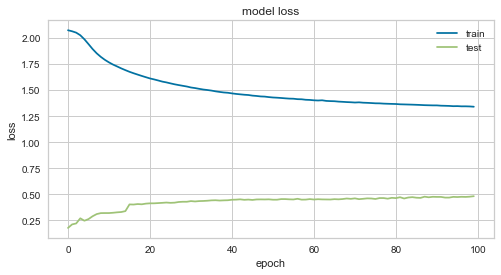

192/192 [==============================] - 1s 3ms/step
[1.4341383675734203, 0.5208333333333334]
Epoch 1/100
1725/1725 [==============================] - 2s 985us/step - loss: 2.0704 - acc: 0.1612
Epoch 2/100
1725/1725 [==============================] - 0s 125us/step - loss: 2.0555 - acc: 0.1757
Epoch 3/100
1725/1725 [==============================] - 0s 123us/step - loss: 2.0487 - acc: 0.1757
Epoch 4/100
1725/1725 [==============================] - 0s 124us/step - loss: 2.0374 - acc: 0.1797
Epoch 5/100
1725/1725 [==============================] - 0s 128us/step - loss: 2.0140 - acc: 0.2475
Epoch 6/100
1725/1725 [==============================] - 0s 127us/step - loss: 1.9757 - acc: 0.2516
Epoch 7/100
1725/1725 [==============================] - 0s 122us/step - loss: 1.9291 - acc: 0.2614
Epoch 8/100
1725/1725 [==============================] - 0s 123us/step - loss: 1.8830 - acc: 0.2951
Epoch 9/100
1725/1725 [==============================] - 0s 140us/step - loss: 1.8425 - acc: 0.3125
Epoc

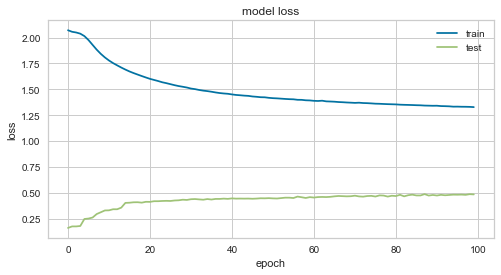

192/192 [==============================] - 1s 4ms/step
[1.492397407690684, 0.53125]
Epoch 1/100
1725/1725 [==============================] - 2s 1ms/step - loss: 2.0702 - acc: 0.1652
Epoch 2/100
1725/1725 [==============================] - ETA: 0s - loss: 2.0549 - acc: 0.175 - 0s 255us/step - loss: 2.0547 - acc: 0.1757
Epoch 3/100
1725/1725 [==============================] - 0s 249us/step - loss: 2.0493 - acc: 0.1757
Epoch 4/100
1725/1725 [==============================] - 0s 209us/step - loss: 2.0439 - acc: 0.1757
Epoch 5/100
1725/1725 [==============================] - 0s 184us/step - loss: 2.0339 - acc: 0.2220
Epoch 6/100
1725/1725 [==============================] - 0s 214us/step - loss: 2.0149 - acc: 0.2904
Epoch 7/100
1725/1725 [==============================] - 0s 192us/step - loss: 1.9821 - acc: 0.2614
Epoch 8/100
1725/1725 [==============================] - 0s 203us/step - loss: 1.9364 - acc: 0.2742 0s - loss: 1.9573 - acc: 
Epoch 9/100
1725/1725 [==============================]

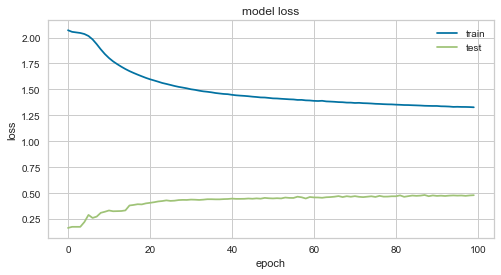

192/192 [==============================] - 1s 3ms/step
[1.4784801453351974, 0.5416666666666666]
Epoch 1/100
1725/1725 [==============================] - 2s 1ms/step - loss: 2.0704 - acc: 0.1525
Epoch 2/100
1725/1725 [==============================] - 0s 120us/step - loss: 2.0561 - acc: 0.1757
Epoch 3/100
1725/1725 [==============================] - 0s 134us/step - loss: 2.0505 - acc: 0.1757
Epoch 4/100
1725/1725 [==============================] - 0s 125us/step - loss: 2.0456 - acc: 0.1757
Epoch 5/100
1725/1725 [==============================] - 0s 119us/step - loss: 2.0341 - acc: 0.1971
Epoch 6/100
1725/1725 [==============================] - 0s 119us/step - loss: 2.0164 - acc: 0.2719
Epoch 7/100
1725/1725 [==============================] - 0s 119us/step - loss: 1.9852 - acc: 0.2180
Epoch 8/100
1725/1725 [==============================] - 0s 126us/step - loss: 1.9389 - acc: 0.2429
Epoch 9/100
1725/1725 [==============================] - 0s 124us/step - loss: 1.8834 - acc: 0.3049
Epoch 

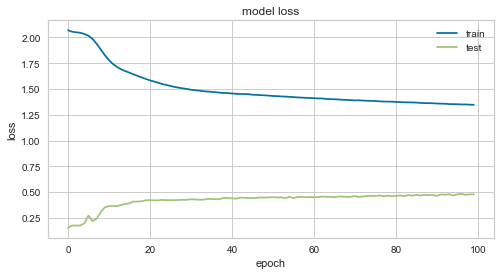

192/192 [==============================] - 1s 3ms/step
[1.3152372737725575, 0.5572916666666666]
Epoch 1/100
1725/1725 [==============================] - 2s 1ms/step - loss: 2.0707 - acc: 0.1658
Epoch 2/100
1725/1725 [==============================] - 0s 126us/step - loss: 2.0563 - acc: 0.1757
Epoch 3/100
1725/1725 [==============================] - 0s 123us/step - loss: 2.0494 - acc: 0.1757
Epoch 4/100
1725/1725 [==============================] - 0s 127us/step - loss: 2.0390 - acc: 0.1896
Epoch 5/100
1725/1725 [==============================] - 0s 128us/step - loss: 2.0170 - acc: 0.2719
Epoch 6/100
1725/1725 [==============================] - 0s 224us/step - loss: 1.9787 - acc: 0.2632
Epoch 7/100
1725/1725 [==============================] - 0s 116us/step - loss: 1.9297 - acc: 0.2736
Epoch 8/100
1725/1725 [==============================] - 0s 105us/step - loss: 1.8817 - acc: 0.3067
Epoch 9/100
1725/1725 [==============================] - 0s 106us/step - loss: 1.8401 - acc: 0.3241
Epoch 

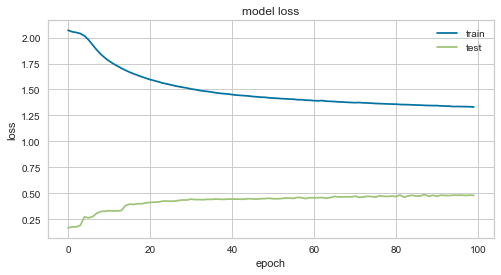

192/192 [==============================] - 1s 3ms/step
[1.4588437974452972, 0.53125]
Epoch 1/100
1725/1725 [==============================] - 2s 996us/step - loss: 2.0697 - acc: 0.1652
Epoch 2/100
1725/1725 [==============================] - 0s 130us/step - loss: 2.0515 - acc: 0.1757
Epoch 3/100
1725/1725 [==============================] - 0s 123us/step - loss: 2.0380 - acc: 0.1814
Epoch 4/100
1725/1725 [==============================] - 0s 126us/step - loss: 2.0130 - acc: 0.2893
Epoch 5/100
1725/1725 [==============================] - 0s 126us/step - loss: 1.9689 - acc: 0.2875
Epoch 6/100
1725/1725 [==============================] - 0s 127us/step - loss: 1.9138 - acc: 0.2928
Epoch 7/100
1725/1725 [==============================] - 0s 125us/step - loss: 1.8607 - acc: 0.3159
Epoch 8/100
1725/1725 [==============================] - 0s 125us/step - loss: 1.8179 - acc: 0.3246
Epoch 9/100
1725/1725 [==============================] - 0s 124us/step - loss: 1.7838 - acc: 0.3252
Epoch 10/100
17

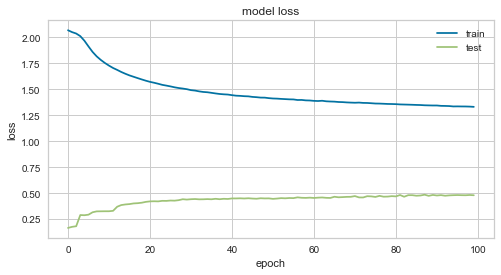

192/192 [==============================] - 1s 3ms/step
[1.4641552915175755, 0.5208333333333334]
Epoch 1/100
1725/1725 [==============================] - 2s 1ms/step - loss: 2.0679 - acc: 0.1826
Epoch 2/100
1725/1725 [==============================] - 0s 134us/step - loss: 2.0431 - acc: 0.2301
Epoch 3/100
1725/1725 [==============================] - 0s 134us/step - loss: 2.0105 - acc: 0.2806
Epoch 4/100
1725/1725 [==============================] - 0s 130us/step - loss: 1.9598 - acc: 0.2649
Epoch 5/100
1725/1725 [==============================] - 0s 130us/step - loss: 1.9002 - acc: 0.2858
Epoch 6/100
1725/1725 [==============================] - 0s 136us/step - loss: 1.8479 - acc: 0.3148
Epoch 7/100
1725/1725 [==============================] - 0s 140us/step - loss: 1.8054 - acc: 0.3223
Epoch 8/100
1725/1725 [==============================] - 0s 137us/step - loss: 1.7714 - acc: 0.3229
Epoch 9/100
1725/1725 [==============================] - 0s 129us/step - loss: 1.7442 - acc: 0.3235
Epoch 

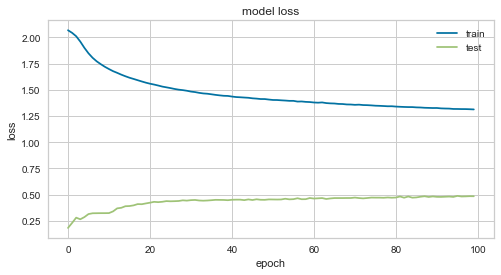

192/192 [==============================] - 1s 3ms/step
[1.4925110985835393, 0.5260416666666666]
Epoch 1/100
1725/1725 [==============================] - 2s 1ms/step - loss: 2.0699 - acc: 0.1583
Epoch 2/100
1725/1725 [==============================] - 0s 140us/step - loss: 2.0546 - acc: 0.1757 0s - loss: 2.0587 - acc: 0.16
Epoch 3/100
1725/1725 [==============================] - 0s 139us/step - loss: 2.0397 - acc: 0.1913
Epoch 4/100
1725/1725 [==============================] - 0s 134us/step - loss: 2.0064 - acc: 0.2881
Epoch 5/100
1725/1725 [==============================] - 0s 140us/step - loss: 1.9508 - acc: 0.2846
Epoch 6/100
1725/1725 [==============================] - 0s 171us/step - loss: 1.8896 - acc: 0.2962
Epoch 7/100
1725/1725 [==============================] - 0s 129us/step - loss: 1.8364 - acc: 0.3148
Epoch 8/100
1725/1725 [==============================] - 0s 164us/step - loss: 1.7956 - acc: 0.3206
Epoch 9/100
1725/1725 [==============================] - 0s 190us/step - los

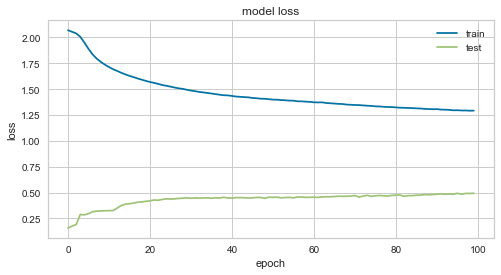

192/192 [==============================] - 1s 4ms/step
[1.3721368908882141, 0.5572916666666666]
Epoch 1/100
1725/1725 [==============================] - 2s 1ms/step - loss: 2.0696 - acc: 0.1675
Epoch 2/100
1725/1725 [==============================] - 0s 160us/step - loss: 2.0563 - acc: 0.1757
Epoch 3/100
1725/1725 [==============================] - 0s 149us/step - loss: 2.0523 - acc: 0.1757
Epoch 4/100
1725/1725 [==============================] - 0s 138us/step - loss: 2.0504 - acc: 0.1757
Epoch 5/100
1725/1725 [==============================] - 0s 140us/step - loss: 2.0487 - acc: 0.1757
Epoch 6/100
1725/1725 [==============================] - 0s 132us/step - loss: 2.0470 - acc: 0.1757
Epoch 7/100
1725/1725 [==============================] - 0s 196us/step - loss: 2.0441 - acc: 0.1745
Epoch 8/100
1725/1725 [==============================] - 0s 147us/step - loss: 2.0399 - acc: 0.1774ETA: 0s - loss: 2.0380 - acc: 0.1
Epoch 9/100
1725/1725 [==============================] - 0s 161us/step - 

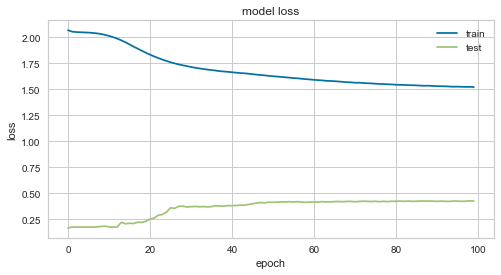

192/192 [==============================] - 1s 3ms/step
[1.5548841853936513, 0.46875]
Epoch 1/100
1725/1725 [==============================] - 2s 1ms/step - loss: 2.0701 - acc: 0.1658
Epoch 2/100
1725/1725 [==============================] - 0s 156us/step - loss: 2.0534 - acc: 0.1757
Epoch 3/100
1725/1725 [==============================] - 0s 146us/step - loss: 2.0492 - acc: 0.1757
Epoch 4/100
1725/1725 [==============================] - 0s 131us/step - loss: 2.0454 - acc: 0.1757
Epoch 5/100
1725/1725 [==============================] - 0s 136us/step - loss: 2.0407 - acc: 0.1757
Epoch 6/100
1725/1725 [==============================] - 0s 167us/step - loss: 2.0328 - acc: 0.1762
Epoch 7/100
1725/1725 [==============================] - 0s 142us/step - loss: 2.0191 - acc: 0.1786
Epoch 8/100
1725/1725 [==============================] - 0s 143us/step - loss: 1.9969 - acc: 0.1901
Epoch 9/100
1725/1725 [==============================] - 0s 157us/step - loss: 1.9659 - acc: 0.2557
Epoch 10/100
1725

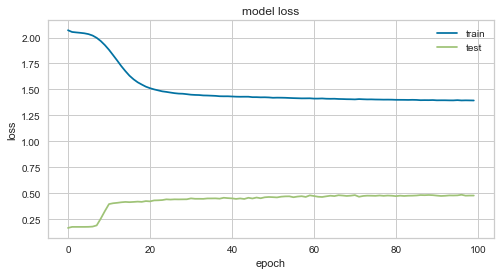

192/192 [==============================] - 1s 4ms/step
[1.341029221812884, 0.5729166666666666]
Epoch 1/100
1725/1725 [==============================] - 2s 1ms/step - loss: 2.0684 - acc: 0.1652
Epoch 2/100
1725/1725 [==============================] - 0s 140us/step - loss: 2.0537 - acc: 0.1757
Epoch 3/100
1725/1725 [==============================] - 0s 167us/step - loss: 2.0505 - acc: 0.1757
Epoch 4/100
1725/1725 [==============================] - 0s 168us/step - loss: 2.0491 - acc: 0.1757
Epoch 5/100
1725/1725 [==============================] - 0s 161us/step - loss: 2.0486 - acc: 0.1757
Epoch 6/100
1725/1725 [==============================] - 0s 154us/step - loss: 2.0479 - acc: 0.1757
Epoch 7/100
1725/1725 [==============================] - 0s 147us/step - loss: 2.0472 - acc: 0.1757
Epoch 8/100
1725/1725 [==============================] - 0s 159us/step - loss: 2.0463 - acc: 0.1774
Epoch 9/100
1725/1725 [==============================] - 0s 138us/step - loss: 2.0438 - acc: 0.1774
Epoch 1

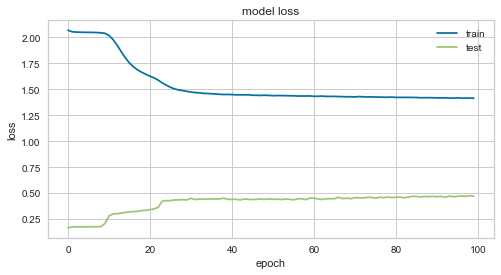

192/192 [==============================] - 1s 4ms/step
[1.2913735210895538, 0.5416666666666666]
Epoch 1/100
1725/1725 [==============================] - 2s 1ms/step - loss: 2.0716 - acc: 0.1548
Epoch 2/100
1725/1725 [==============================] - 0s 146us/step - loss: 2.0496 - acc: 0.1565
Epoch 3/100
1725/1725 [==============================] - 0s 137us/step - loss: 2.0209 - acc: 0.1745
Epoch 4/100
1725/1725 [==============================] - 0s 148us/step - loss: 1.9831 - acc: 0.1971
Epoch 5/100
1725/1725 [==============================] - 0s 138us/step - loss: 1.9376 - acc: 0.2122
Epoch 6/100
1725/1725 [==============================] - 0s 138us/step - loss: 1.8948 - acc: 0.2603
Epoch 7/100
1725/1725 [==============================] - 0s 141us/step - loss: 1.8537 - acc: 0.2817
Epoch 8/100
1725/1725 [==============================] - 0s 175us/step - loss: 1.8184 - acc: 0.3067
Epoch 9/100
1725/1725 [==============================] - 0s 209us/step - loss: 1.7896 - acc: 0.3177
Epoch 

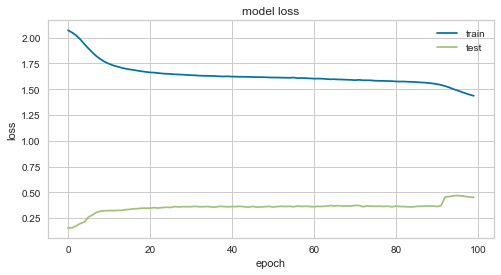

192/192 [==============================] - 1s 4ms/step
[1.0577514717976253, 0.5729166666666666]
Epoch 1/100
1725/1725 [==============================] - 2s 1ms/step - loss: 2.0683 - acc: 0.1722
Epoch 2/100
1725/1725 [==============================] - 0s 138us/step - loss: 2.0547 - acc: 0.1757
Epoch 3/100
1725/1725 [==============================] - 0s 138us/step - loss: 2.0510 - acc: 0.1757
Epoch 4/100
1725/1725 [==============================] - 0s 163us/step - loss: 2.0449 - acc: 0.1757
Epoch 5/100
1725/1725 [==============================] - 0s 154us/step - loss: 2.0254 - acc: 0.2267
Epoch 6/100
1725/1725 [==============================] - 0s 142us/step - loss: 1.9863 - acc: 0.2574
Epoch 7/100
1725/1725 [==============================] - 0s 144us/step - loss: 1.9343 - acc: 0.2643
Epoch 8/100
1725/1725 [==============================] - 0s 148us/step - loss: 1.8827 - acc: 0.3055
Epoch 9/100
1725/1725 [==============================] - 0s 146us/step - loss: 1.8385 - acc: 0.3264
Epoch 

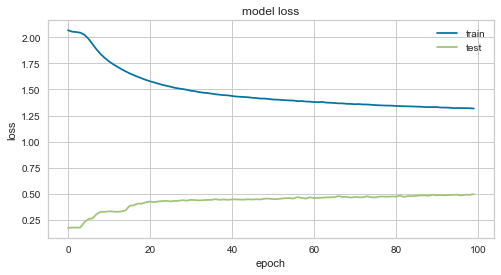

192/192 [==============================] - 1s 4ms/step
[1.5409947435061138, 0.5208333333333334]
Epoch 1/100
1725/1725 [==============================] - 2s 1ms/step - loss: 2.0664 - acc: 0.1768
Epoch 2/100
1725/1725 [==============================] - 0s 228us/step - loss: 2.0504 - acc: 0.1757
Epoch 3/100
1725/1725 [==============================] - 0s 213us/step - loss: 2.0450 - acc: 0.1757
Epoch 4/100
1725/1725 [==============================] - 0s 256us/step - loss: 2.0354 - acc: 0.1867
Epoch 5/100
1725/1725 [==============================] - 0s 215us/step - loss: 2.0124 - acc: 0.2707
Epoch 6/100
1725/1725 [==============================] - ETA: 0s - loss: 1.9796 - acc: 0.307 - 0s 199us/step - loss: 1.9726 - acc: 0.3101
Epoch 7/100
1725/1725 [==============================] - 0s 196us/step - loss: 1.9148 - acc: 0.3055
Epoch 8/100
1725/1725 [==============================] - 0s 205us/step - loss: 1.8487 - acc: 0.3391
Epoch 9/100
1725/1725 [==============================] - 0s 210us/st

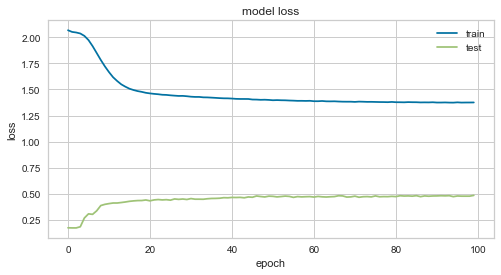

192/192 [==============================] - 1s 4ms/step
[1.2152166763941448, 0.6145833333333334]
Epoch 1/100
1725/1725 [==============================] - 2s 1ms/step - loss: 2.0683 - acc: 0.1757
Epoch 2/100
1725/1725 [==============================] - 0s 161us/step - loss: 2.0550 - acc: 0.1757
Epoch 3/100
1725/1725 [==============================] - 0s 149us/step - loss: 2.0516 - acc: 0.1757
Epoch 4/100
1725/1725 [==============================] - 0s 170us/step - loss: 2.0494 - acc: 0.1757
Epoch 5/100
1725/1725 [==============================] - 0s 196us/step - loss: 2.0476 - acc: 0.1757
Epoch 6/100
1725/1725 [==============================] - 0s 161us/step - loss: 2.0461 - acc: 0.1757
Epoch 7/100
1725/1725 [==============================] - 0s 158us/step - loss: 2.0438 - acc: 0.1739
Epoch 8/100
1725/1725 [==============================] - 0s 148us/step - loss: 2.0403 - acc: 0.1791
Epoch 9/100
1725/1725 [==============================] - 0s 143us/step - loss: 2.0355 - acc: 0.1797
Epoch 

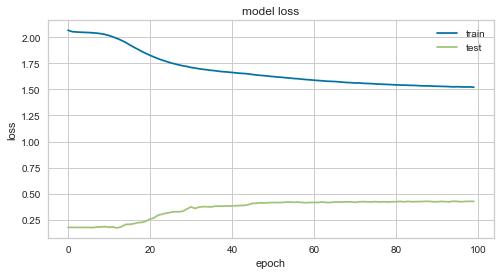

192/192 [==============================] - 1s 4ms/step
[1.562197168668111, 0.4739583333333333]
Epoch 1/100
1725/1725 [==============================] - 2s 1ms/step - loss: 2.0732 - acc: 0.1641
Epoch 2/100
1725/1725 [==============================] - 0s 146us/step - loss: 2.0487 - acc: 0.2412
Epoch 3/100
1725/1725 [==============================] - 0s 147us/step - loss: 1.9883 - acc: 0.2759
Epoch 4/100
1725/1725 [==============================] - 0s 151us/step - loss: 1.8994 - acc: 0.2957
Epoch 5/100
1725/1725 [==============================] - 0s 154us/step - loss: 1.8128 - acc: 0.3554
Epoch 6/100
1725/1725 [==============================] - 0s 171us/step - loss: 1.7434 - acc: 0.4000
Epoch 7/100
1725/1725 [==============================] - 0s 149us/step - loss: 1.6837 - acc: 0.4035
Epoch 8/100
1725/1725 [==============================] - 0s 152us/step - loss: 1.6324 - acc: 0.4104
Epoch 9/100
1725/1725 [==============================] - 0s 159us/step - loss: 1.5905 - acc: 0.4162
Epoch 1

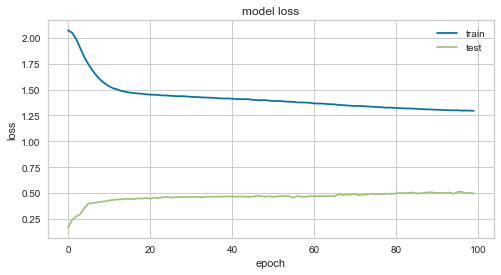

192/192 [==============================] - 1s 4ms/step
[1.3523400376240413, 0.5364583333333334]
Epoch 1/100
1725/1725 [==============================] - 2s 1ms/step - loss: 2.0664 - acc: 0.1774
Epoch 2/100
1725/1725 [==============================] - 0s 149us/step - loss: 2.0508 - acc: 0.1757
Epoch 3/100
1725/1725 [==============================] - 0s 142us/step - loss: 2.0456 - acc: 0.1757
Epoch 4/100
1725/1725 [==============================] - 0s 154us/step - loss: 2.0329 - acc: 0.1983
Epoch 5/100
1725/1725 [==============================] - 0s 146us/step - loss: 2.0048 - acc: 0.2794
Epoch 6/100
1725/1725 [==============================] - 0s 154us/step - loss: 1.9515 - acc: 0.3165
Epoch 7/100
1725/1725 [==============================] - 0s 161us/step - loss: 1.8715 - acc: 0.3739
Epoch 8/100
1725/1725 [==============================] - 0s 166us/step - loss: 1.7883 - acc: 0.4023
Epoch 9/100
1725/1725 [==============================] - 0s 156us/step - loss: 1.7146 - acc: 0.4116
Epoch 

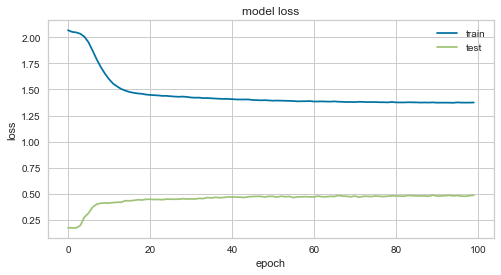

192/192 [==============================] - 1s 4ms/step
[1.245040237903595, 0.625]
Epoch 1/100
1725/1725 [==============================] - 2s 1ms/step - loss: 2.0679 - acc: 0.1693
Epoch 2/100
1725/1725 [==============================] - 0s 145us/step - loss: 2.0541 - acc: 0.1757
Epoch 3/100
1725/1725 [==============================] - 0s 157us/step - loss: 2.0488 - acc: 0.1757
Epoch 4/100
1725/1725 [==============================] - 0s 153us/step - loss: 2.0408 - acc: 0.1757
Epoch 5/100
1725/1725 [==============================] - 0s 156us/step - loss: 2.0231 - acc: 0.2139
Epoch 6/100
1725/1725 [==============================] - 0s 147us/step - loss: 1.9873 - acc: 0.2562
Epoch 7/100
1725/1725 [==============================] - 0s 145us/step - loss: 1.9370 - acc: 0.2516
Epoch 8/100
1725/1725 [==============================] - 0s 148us/step - loss: 1.8849 - acc: 0.2916
Epoch 9/100
1725/1725 [==============================] - 0s 147us/step - loss: 1.8394 - acc: 0.3217
Epoch 10/100
1725/17

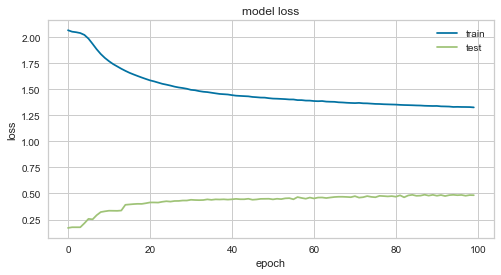

192/192 [==============================] - 1s 4ms/step
[1.448599209388097, 0.53125]
Epoch 1/100
1725/1725 [==============================] - 2s 1ms/step - loss: 2.0691 - acc: 0.1664
Epoch 2/100
1725/1725 [==============================] - 0s 148us/step - loss: 2.0553 - acc: 0.1757
Epoch 3/100
1725/1725 [==============================] - 0s 163us/step - loss: 2.0519 - acc: 0.1757
Epoch 4/100
1725/1725 [==============================] - 0s 151us/step - loss: 2.0498 - acc: 0.1757
Epoch 5/100
1725/1725 [==============================] - 0s 165us/step - loss: 2.0474 - acc: 0.1757
Epoch 6/100
1725/1725 [==============================] - 0s 164us/step - loss: 2.0454 - acc: 0.1757
Epoch 7/100
1725/1725 [==============================] - 0s 147us/step - loss: 2.0418 - acc: 0.1762
Epoch 8/100
1725/1725 [==============================] - 0s 162us/step - loss: 2.0339 - acc: 0.1809
Epoch 9/100
1725/1725 [==============================] - 0s 165us/step - loss: 2.0236 - acc: 0.1861
Epoch 10/100
1725/

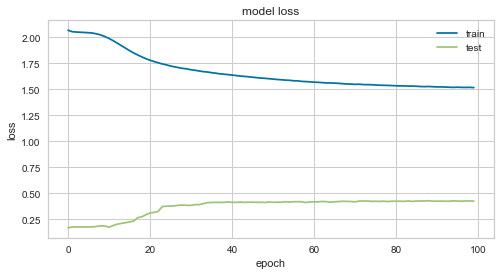

192/192 [==============================] - 1s 5ms/step
[1.5224147737026215, 0.4895833333333333]
Epoch 1/100
1725/1725 [==============================] - 2s 1ms/step - loss: 2.0718 - acc: 0.1571
Epoch 2/100
1725/1725 [==============================] - 0s 160us/step - loss: 2.0387 - acc: 0.1687
Epoch 3/100
1725/1725 [==============================] - 0s 170us/step - loss: 1.9841 - acc: 0.1913
Epoch 4/100
1725/1725 [==============================] - 0s 167us/step - loss: 1.9218 - acc: 0.2296
Epoch 5/100
1725/1725 [==============================] - 0s 158us/step - loss: 1.8642 - acc: 0.2765
Epoch 6/100
1725/1725 [==============================] - 0s 159us/step - loss: 1.8206 - acc: 0.3125
Epoch 7/100
1725/1725 [==============================] - 0s 165us/step - loss: 1.7869 - acc: 0.3194
Epoch 8/100
1725/1725 [==============================] - 0s 187us/step - loss: 1.7620 - acc: 0.3229
Epoch 9/100
1725/1725 [==============================] - 0s 149us/step - loss: 1.7432 - acc: 0.3241
Epoch 

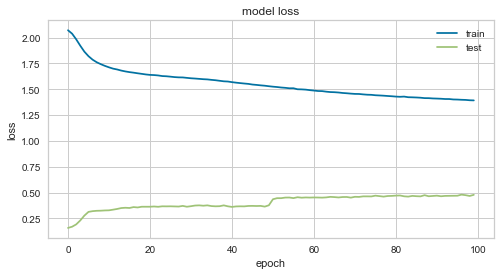

192/192 [==============================] - 1s 4ms/step
[1.240903116762638, 0.5104166666666666]


In [870]:
from keras import Sequential
from keras.layers import Dense, Dropout
from keras.optimizers import Adadelta

inputDimX = xTest.shape[1]
outputDimY = np.max(yTrain)+1

dfRes = pd.DataFrame(columns=["N1","N2","Accuracy"])

for neurons1 in range (5,10):
    for neurons2 in range(3,7):

        np.random.seed(42) # set seed for reproducibility

        classifier = Sequential()
        #First Hidden Layer
        classifier.add(Dense(neurons1, activation='relu', kernel_initializer='random_normal', input_dim= inputDimX))
        #Second  Hidden Layer
        #classifier.add(Dropout(0.2))
        classifier.add(Dense(neurons2, activation='relu', kernel_initializer='random_normal'))
        #Output Layer
        classifier.add(Dense(outputDimY, activation='softmax'))

        #Compiling the neural network
        classifier.compile(optimizer ="adam",loss='sparse_categorical_crossentropy', 
                           metrics =['accuracy'])
        #classifier.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

        #Fitting the data to the training dataset
        history = classifier.fit(xTrain_minmax,yTrain, batch_size=10, epochs=100)
        print("MLP %i %i:" %(neurons1, neurons2))
        plotHystory(history)
        accuracy = classifier.evaluate(
          xTest_minmax,
          yTest
        )
        print(accuracy)
        dfRes = dfRes.append({'N1':neurons1  , "N2": neurons2, "Accuracy": accuracy[1]} , ignore_index=True)

In [871]:
dfRes

,N1,N2,Accuracy
0,5.0,3.0,0.520833
1,5.0,4.0,0.531250
2,5.0,5.0,0.541667
3,5.0,6.0,0.557292
4,6.0,3.0,0.531250
5,6.0,4.0,0.520833
6,6.0,5.0,0.526042
7,6.0,6.0,0.557292
8,7.0,3.0,0.468750
9,7.0,4.0,0.572917


In [872]:
dfRes["Accuracy"].max()

0.625

Epoch 1/100
1725/1725 [==============================] - 9s 5ms/step - loss: 2.0664 - acc: 0.1774
Epoch 2/100
1725/1725 [==============================] - 1s 480us/step - loss: 2.0508 - acc: 0.1757
Epoch 3/100
1725/1725 [==============================] - 1s 615us/step - loss: 2.0456 - acc: 0.1757
Epoch 4/100
1725/1725 [==============================] - 1s 472us/step - loss: 2.0329 - acc: 0.1983
Epoch 5/100
1725/1725 [==============================] - 1s 497us/step - loss: 2.0047 - acc: 0.2794
Epoch 6/100
1725/1725 [==============================] - 1s 494us/step - loss: 1.9508 - acc: 0.3159
Epoch 7/100
1725/1725 [==============================] - 1s 475us/step - loss: 1.8690 - acc: 0.3739 0s - loss: 1.8705
Epoch 8/100
1725/1725 [==============================] - 1s 469us/step - loss: 1.7854 - acc: 0.4029
Epoch 9/100
1725/1725 [==============================] - 1s 472us/step - loss: 1.7128 - acc: 0.4116
Epoch 10/100
1725/1725 [==============================] - 1s 484us/step - loss: 1.65

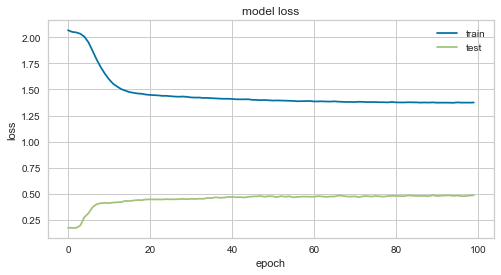

192/192 [==============================] - 4s 18ms/step
drop out 1 0.000000, drop out 2 0.000000, accuracy 0.630208
Epoch 1/100
1725/1725 [==============================] - 9s 5ms/step - loss: 2.0716 - acc: 0.1420
Epoch 2/100
1725/1725 [==============================] - 1s 368us/step - loss: 2.0569 - acc: 0.1496
Epoch 3/100
1725/1725 [==============================] - 1s 367us/step - loss: 2.0383 - acc: 0.1670
Epoch 4/100
1725/1725 [==============================] - 1s 371us/step - loss: 2.0193 - acc: 0.2348
Epoch 5/100
1725/1725 [==============================] - 1s 368us/step - loss: 1.9908 - acc: 0.2794
Epoch 6/100
1725/1725 [==============================] - 1s 387us/step - loss: 1.9541 - acc: 0.2997
Epoch 7/100
1725/1725 [==============================] - 1s 382us/step - loss: 1.8941 - acc: 0.3101
Epoch 8/100
1725/1725 [==============================] - 1s 420us/step - loss: 1.8356 - acc: 0.3101
Epoch 9/100
1725/1725 [==============================] - 1s 362us/step - loss: 1.7795 

1725/1725 [==============================] - 1s 455us/step - loss: 1.4525 - acc: 0.4267
Epoch 82/100
1725/1725 [==============================] - 1s 441us/step - loss: 1.4396 - acc: 0.4319
Epoch 83/100
1725/1725 [==============================] - 1s 428us/step - loss: 1.4524 - acc: 0.4272
Epoch 84/100
1725/1725 [==============================] - 1s 454us/step - loss: 1.4463 - acc: 0.4336
Epoch 85/100
1725/1725 [==============================] - 1s 444us/step - loss: 1.4480 - acc: 0.4232
Epoch 86/100
1725/1725 [==============================] - 1s 451us/step - loss: 1.4453 - acc: 0.4307
Epoch 87/100
1725/1725 [==============================] - 1s 589us/step - loss: 1.4462 - acc: 0.4272
Epoch 88/100
1725/1725 [==============================] - 1s 585us/step - loss: 1.4477 - acc: 0.4261
Epoch 89/100
1725/1725 [==============================] - 1s 560us/step - loss: 1.4526 - acc: 0.4336
Epoch 90/100
1725/1725 [==============================] - 1s 736us/step - loss: 1.4518 - acc: 0.4191
Epo

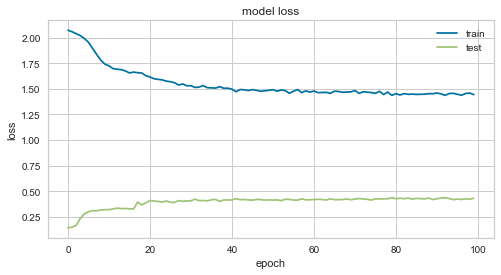

192/192 [==============================] - 3s 18ms/step
drop out 1 0.000000, drop out 2 0.100000, accuracy 0.609375
Epoch 1/100
1725/1725 [==============================] - 10s 6ms/step - loss: 2.0713 - acc: 0.1443
Epoch 2/100
1725/1725 [==============================] - 1s 494us/step - loss: 2.0550 - acc: 0.1530
Epoch 3/100
1725/1725 [==============================] - 1s 481us/step - loss: 2.0414 - acc: 0.1739
Epoch 4/100
1725/1725 [==============================] - 1s 480us/step - loss: 2.0219 - acc: 0.2267
Epoch 5/100
1725/1725 [==============================] - 1s 504us/step - loss: 1.9959 - acc: 0.2678
Epoch 6/100
1725/1725 [==============================] - 1s 497us/step - loss: 1.9570 - acc: 0.2899
Epoch 7/100
1725/1725 [==============================] - 1s 490us/step - loss: 1.9032 - acc: 0.2945
Epoch 8/100
1725/1725 [==============================] - 1s 462us/step - loss: 1.8603 - acc: 0.2910
Epoch 9/100
1725/1725 [==============================] - 1s 469us/step - loss: 1.8060

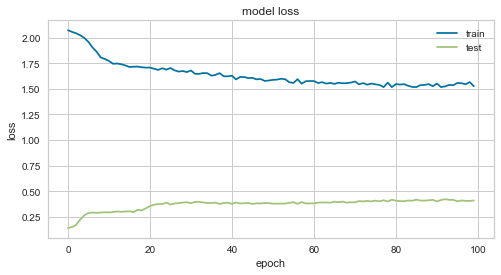

192/192 [==============================] - 3s 18ms/step
drop out 1 0.000000, drop out 2 0.200000, accuracy 0.593750
Epoch 1/100
1725/1725 [==============================] - 10s 6ms/step - loss: 2.0701 - acc: 0.1432
Epoch 2/100
1725/1725 [==============================] - 1s 494us/step - loss: 2.0548 - acc: 0.1467
Epoch 3/100
1725/1725 [==============================] - 1s 487us/step - loss: 2.0393 - acc: 0.1983
Epoch 4/100
1725/1725 [==============================] - 1s 472us/step - loss: 2.0206 - acc: 0.2359
Epoch 5/100
1725/1725 [==============================] - 1s 492us/step - loss: 2.0001 - acc: 0.2684
Epoch 6/100
1725/1725 [==============================] - 1s 460us/step - loss: 1.9751 - acc: 0.2974
Epoch 7/100
1725/1725 [==============================] - 1s 474us/step - loss: 1.9480 - acc: 0.3078
Epoch 8/100
1725/1725 [==============================] - 1s 476us/step - loss: 1.9211 - acc: 0.3119
Epoch 9/100
1725/1725 [==============================] - 1s 476us/step - loss: 1.8929

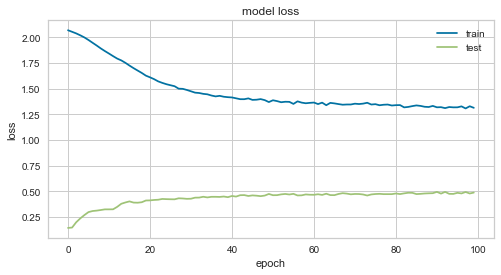

192/192 [==============================] - 4s 18ms/step
drop out 1 0.100000, drop out 2 0.000000, accuracy 0.562500
Epoch 1/100
1725/1725 [==============================] - 10s 6ms/step - loss: 2.0747 - acc: 0.1739
Epoch 2/100
1725/1725 [==============================] - 1s 516us/step - loss: 2.0664 - acc: 0.1757
Epoch 3/100
1725/1725 [==============================] - 1s 466us/step - loss: 2.0611 - acc: 0.1757
Epoch 4/100
1725/1725 [==============================] - 1s 484us/step - loss: 2.0575 - acc: 0.1757
Epoch 5/100
1725/1725 [==============================] - 1s 450us/step - loss: 2.0551 - acc: 0.1757
Epoch 6/100
1725/1725 [==============================] - 1s 630us/step - loss: 2.0535 - acc: 0.1757
Epoch 7/100
1725/1725 [==============================] - 1s 586us/step - loss: 2.0525 - acc: 0.1757
Epoch 8/100
1725/1725 [==============================] - 1s 515us/step - loss: 2.0518 - acc: 0.1757
Epoch 9/100
1725/1725 [==============================] - 1s 563us/step - loss: 2.0514

Epoch 81/100
1725/1725 [==============================] - 1s 483us/step - loss: 1.5961 - acc: 0.4064
Epoch 82/100
1725/1725 [==============================] - 1s 488us/step - loss: 1.5960 - acc: 0.4122
Epoch 83/100
1725/1725 [==============================] - 1s 477us/step - loss: 1.5973 - acc: 0.4017
Epoch 84/100
1725/1725 [==============================] - 1s 481us/step - loss: 1.5741 - acc: 0.4116
Epoch 85/100
1725/1725 [==============================] - 1s 597us/step - loss: 1.5827 - acc: 0.4035
Epoch 86/100
1725/1725 [==============================] - 1s 415us/step - loss: 1.5916 - acc: 0.4029
Epoch 87/100
1725/1725 [==============================] - 1s 513us/step - loss: 1.5903 - acc: 0.4052
Epoch 88/100
1725/1725 [==============================] - 1s 688us/step - loss: 1.5988 - acc: 0.4081
Epoch 89/100
1725/1725 [==============================] - 1s 504us/step - loss: 1.6118 - acc: 0.4058
Epoch 90/100
1725/1725 [==============================] - 1s 480us/step - loss: 1.5803 - ac

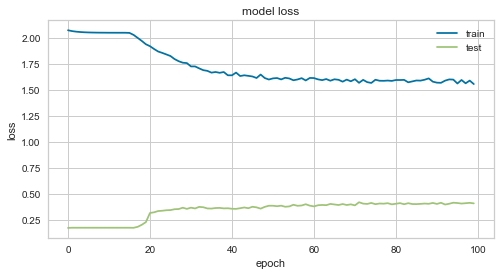

192/192 [==============================] - 4s 18ms/step
drop out 1 0.100000, drop out 2 0.100000, accuracy 0.583333
Epoch 1/100
1725/1725 [==============================] - 10s 6ms/step - loss: 2.0747 - acc: 0.1739
Epoch 2/100
1725/1725 [==============================] - 1s 652us/step - loss: 2.0664 - acc: 0.1757
Epoch 3/100
1725/1725 [==============================] - 1s 570us/step - loss: 2.0611 - acc: 0.1757
Epoch 4/100
1725/1725 [==============================] - 1s 742us/step - loss: 2.0575 - acc: 0.1757
Epoch 5/100
1725/1725 [==============================] - 1s 584us/step - loss: 2.0551 - acc: 0.1757
Epoch 6/100
1725/1725 [==============================] - 1s 516us/step - loss: 2.0535 - acc: 0.1757
Epoch 7/100
1725/1725 [==============================] - 1s 516us/step - loss: 2.0525 - acc: 0.1757
Epoch 8/100
1725/1725 [==============================] - 1s 512us/step - loss: 2.0518 - acc: 0.1757
Epoch 9/100
1725/1725 [==============================] - 1s 496us/step - loss: 2.0514

1725/1725 [==============================] - 1s 561us/step - loss: 1.6479 - acc: 0.3629
Epoch 82/100
1725/1725 [==============================] - 1s 508us/step - loss: 1.6199 - acc: 0.3728
Epoch 83/100
1725/1725 [==============================] - 1s 484us/step - loss: 1.6242 - acc: 0.3843
Epoch 84/100
1725/1725 [==============================] - 1s 626us/step - loss: 1.6260 - acc: 0.3849
Epoch 85/100
1725/1725 [==============================] - 1s 524us/step - loss: 1.6202 - acc: 0.3896
Epoch 86/100
1725/1725 [==============================] - 1s 505us/step - loss: 1.6324 - acc: 0.3716
Epoch 87/100
1725/1725 [==============================] - 1s 535us/step - loss: 1.6455 - acc: 0.3687
Epoch 88/100
1725/1725 [==============================] - 1s 495us/step - loss: 1.6108 - acc: 0.3901
Epoch 89/100
1725/1725 [==============================] - 1s 493us/step - loss: 1.6246 - acc: 0.3925
Epoch 90/100
1725/1725 [==============================] - 1s 491us/step - loss: 1.6191 - acc: 0.3913
Epo

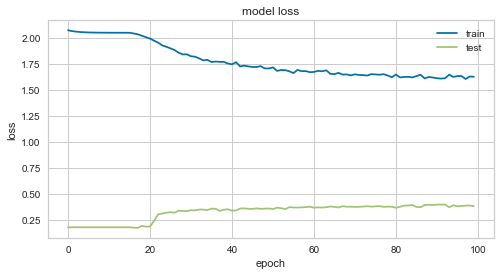

192/192 [==============================] - 4s 19ms/step
drop out 1 0.100000, drop out 2 0.200000, accuracy 0.515625
Epoch 1/100
1725/1725 [==============================] - 10s 6ms/step - loss: 2.0704 - acc: 0.1420
Epoch 2/100
1725/1725 [==============================] - 1s 510us/step - loss: 2.0470 - acc: 0.1612
Epoch 3/100
1725/1725 [==============================] - 1s 524us/step - loss: 2.0156 - acc: 0.2417
Epoch 4/100
1725/1725 [==============================] - 1s 488us/step - loss: 1.9736 - acc: 0.2649
Epoch 5/100
1725/1725 [==============================] - 1s 627us/step - loss: 1.9297 - acc: 0.2829
Epoch 6/100
1725/1725 [==============================] - 1s 497us/step - loss: 1.8795 - acc: 0.2910
Epoch 7/100
1725/1725 [==============================] - 1s 504us/step - loss: 1.8237 - acc: 0.3032
Epoch 8/100
1725/1725 [==============================] - 1s 510us/step - loss: 1.7937 - acc: 0.3090
Epoch 9/100
1725/1725 [==============================] - 1s 534us/step - loss: 1.7374

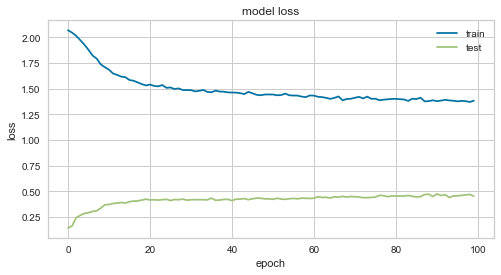

192/192 [==============================] - 4s 19ms/step
drop out 1 0.200000, drop out 2 0.000000, accuracy 0.567708
Epoch 1/100
1725/1725 [==============================] - 10s 6ms/step - loss: 2.0745 - acc: 0.1739
Epoch 2/100
1725/1725 [==============================] - 1s 516us/step - loss: 2.0647 - acc: 0.1745
Epoch 3/100
1725/1725 [==============================] - 1s 558us/step - loss: 2.0566 - acc: 0.1791
Epoch 4/100
1725/1725 [==============================] - 1s 545us/step - loss: 2.0515 - acc: 0.2023
Epoch 5/100
1725/1725 [==============================] - 1s 521us/step - loss: 2.0435 - acc: 0.2075
Epoch 6/100
1725/1725 [==============================] - 1s 542us/step - loss: 2.0308 - acc: 0.2180
Epoch 7/100
1725/1725 [==============================] - 1s 578us/step - loss: 2.0097 - acc: 0.2081
Epoch 8/100
1725/1725 [==============================] - 1s 526us/step - loss: 1.9931 - acc: 0.2232
Epoch 9/100
1725/1725 [==============================] - 1s 537us/step - loss: 1.9608

1725/1725 [==============================] - 1s 568us/step - loss: 1.7020 - acc: 0.3246
Epoch 82/100
1725/1725 [==============================] - 1s 451us/step - loss: 1.6902 - acc: 0.3270
Epoch 83/100
1725/1725 [==============================] - 1s 389us/step - loss: 1.6932 - acc: 0.3258
Epoch 84/100
1725/1725 [==============================] - 1s 647us/step - loss: 1.7019 - acc: 0.3229
Epoch 85/100
1725/1725 [==============================] - 1s 538us/step - loss: 1.6959 - acc: 0.3293
Epoch 86/100
1725/1725 [==============================] - 1s 474us/step - loss: 1.7033 - acc: 0.3281
Epoch 87/100
1725/1725 [==============================] - 1s 374us/step - loss: 1.6933 - acc: 0.3212
Epoch 88/100
1725/1725 [==============================] - 1s 375us/step - loss: 1.6926 - acc: 0.3200
Epoch 89/100
1725/1725 [==============================] - 1s 412us/step - loss: 1.6970 - acc: 0.3391
Epoch 90/100
1725/1725 [==============================] - 1s 461us/step - loss: 1.6977 - acc: 0.3258
Epo

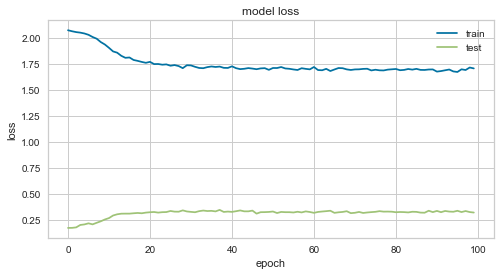

192/192 [==============================] - 4s 20ms/step
drop out 1 0.200000, drop out 2 0.100000, accuracy 0.510417
Epoch 1/100
1725/1725 [==============================] - 10s 6ms/step - loss: 2.0747 - acc: 0.1739
Epoch 2/100
1725/1725 [==============================] - 1s 408us/step - loss: 2.0664 - acc: 0.1757
Epoch 3/100
1725/1725 [==============================] - 1s 374us/step - loss: 2.0611 - acc: 0.1757
Epoch 4/100
1725/1725 [==============================] - 1s 384us/step - loss: 2.0575 - acc: 0.1757
Epoch 5/100
1725/1725 [==============================] - 1s 536us/step - loss: 2.0551 - acc: 0.1757
Epoch 6/100
1725/1725 [==============================] - 1s 419us/step - loss: 2.0535 - acc: 0.1757
Epoch 7/100
1725/1725 [==============================] - 1s 367us/step - loss: 2.0525 - acc: 0.1757
Epoch 8/100
1725/1725 [==============================] - 1s 363us/step - loss: 2.0518 - acc: 0.1757
Epoch 9/100
1725/1725 [==============================] - 1s 370us/step - loss: 2.0514

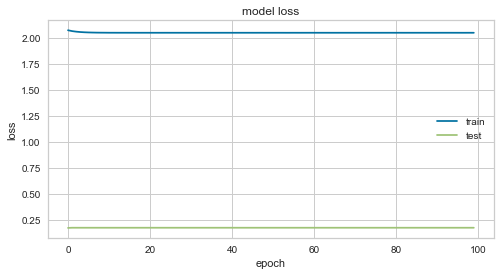

192/192 [==============================] - 4s 19ms/step
drop out 1 0.200000, drop out 2 0.200000, accuracy 0.005208


In [876]:
# build the winner architecture and make predictions

dfRes = pd.DataFrame(columns=["dropOut1","dropOut2","Accuracy"])
neurons1 = 9
neurons2 = 3

for dropOut1 in [i/10 for i in range(3)]:
    for dropOut2 in [i/10 for i in range(3)]:

        np.random.seed(42) # set seed for reproducibility

        classifier = Sequential()
        #First Hidden Layer
        classifier.add(Dense(neurons1, activation='relu', kernel_initializer='random_normal', input_dim= inputDimX))
        #Second  Hidden Layer
        if dropOut1 >0:
            classifier.add(Dropout(dropOut1))
        classifier.add(Dense(neurons2, activation='relu', kernel_initializer='random_normal'))
        if dropOut2 >0:
            classifier.add(Dropout(dropOut2))
        #Output Layer
        classifier.add(Dense(outputDimY, activation='softmax'))

        #Compiling the neural network
        classifier.compile(optimizer ="adam",loss='sparse_categorical_crossentropy', 
                           metrics =['accuracy'])
        #classifier.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

        #Fitting the data to the training dataset
        history = classifier.fit(xTrain_minmax,yTrain, batch_size=10, epochs=100)
        print("MLP %i %i:" %(neurons1, neurons2))
        plotHystory(history)
        accuracy = classifier.evaluate(
          xTest_minmax,
          yTest
        )
        print("drop out 1 %f, drop out 2 %f, accuracy %f" %(dropOut1, dropOut2, accuracy[1] ))
        dfRes = dfRes.append({'dropOut1':dropOut1  , "dropOut2": dropOut2, "Accuracy": accuracy[1]} , ignore_index=True)

In [877]:
dfRes["Accuracy"].max()

0.6302083333333334

Success!!! We have a new best classification model, beating the previous by 4%!

In [878]:
dfRes

,dropOut1,dropOut2,Accuracy
0,0.0,0.0,0.630208
1,0.0,0.1,0.609375
2,0.0,0.2,0.593750
3,0.1,0.0,0.562500
4,0.1,0.1,0.583333
5,0.1,0.2,0.515625
6,0.2,0.0,0.567708
7,0.2,0.1,0.510417
8,0.2,0.2,0.005208


Epoch 1/100
1725/1725 [==============================] - 11s 6ms/step - loss: 2.0664 - acc: 0.1774
Epoch 2/100
1725/1725 [==============================] - 1s 516us/step - loss: 2.0507 - acc: 0.1757
Epoch 3/100
1725/1725 [==============================] - 1s 531us/step - loss: 2.0464 - acc: 0.1757
Epoch 4/100
1725/1725 [==============================] - 1s 542us/step - loss: 2.0383 - acc: 0.1849
Epoch 5/100
1725/1725 [==============================] - 1s 505us/step - loss: 2.0095 - acc: 0.2638
Epoch 6/100
1725/1725 [==============================] - 1s 548us/step - loss: 1.9518 - acc: 0.3241
Epoch 7/100
1725/1725 [==============================] - 1s 549us/step - loss: 1.8704 - acc: 0.3832
Epoch 8/100
1725/1725 [==============================] - 1s 539us/step - loss: 1.7884 - acc: 0.4006
Epoch 9/100
1725/1725 [==============================] - 1s 509us/step - loss: 1.7180 - acc: 0.4104
Epoch 10/100
1725/1725 [==============================] - 1s 556us/step - loss: 1.6603 - acc: 0.4139


Epoch 82/100
1725/1725 [==============================] - 1s 537us/step - loss: 1.3763 - acc: 0.4794
Epoch 83/100
1725/1725 [==============================] - 1s 744us/step - loss: 1.3762 - acc: 0.4788
Epoch 84/100
1725/1725 [==============================] - 1s 736us/step - loss: 1.3776 - acc: 0.4881
Epoch 85/100
1725/1725 [==============================] - 1s 598us/step - loss: 1.3770 - acc: 0.4817
Epoch 86/100
1725/1725 [==============================] - 1s 668us/step - loss: 1.3764 - acc: 0.4858
Epoch 87/100
1725/1725 [==============================] - 1s 662us/step - loss: 1.3743 - acc: 0.4812
Epoch 88/100
1725/1725 [==============================] - 1s 499us/step - loss: 1.3753 - acc: 0.4829
Epoch 89/100
1725/1725 [==============================] - 1s 498us/step - loss: 1.3743 - acc: 0.4823
Epoch 90/100
1725/1725 [==============================] - 1s 504us/step - loss: 1.3761 - acc: 0.4881
Epoch 91/100
1725/1725 [==============================] - 1s 514us/step - loss: 1.3732 - ac

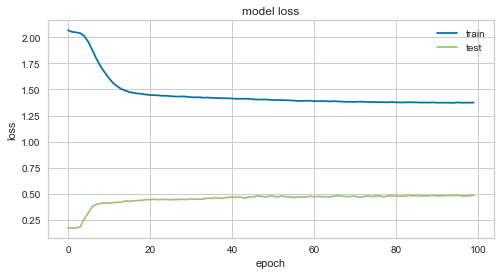

192/192 [==============================] - 4s 20ms/step
Accuracy: 0.6302083333333334


In [881]:
# train best model again
# build the winner architecture and make predictions

dfRes = pd.DataFrame(columns=["dropOut1","dropOut2","Accuracy"])
neurons1 = 9
neurons2 = 3

np.random.seed(42) # set seed for reproducibility

classifier = Sequential()
#First Hidden Layer
classifier.add(Dense(neurons1, activation='relu', kernel_initializer='random_normal', input_dim= inputDimX))
#Second  Hidden Layer
classifier.add(Dense(neurons2, activation='relu', kernel_initializer='random_normal'))
#Output Layer
classifier.add(Dense(outputDimY, activation='softmax'))

#Compiling the neural network
classifier.compile(optimizer ="adam",loss='sparse_categorical_crossentropy', 
                   metrics =['accuracy'])

#Fitting the data to the training dataset
history = classifier.fit(xTrain_minmax,yTrain, batch_size=10, epochs=100)

plotHystory(history)
accuracy = classifier.evaluate(
  xTest_minmax,
  yTest
)
print ("Accuracy:", accuracy[1])    


In [882]:
xPredict = classifier.predict(xTest_minmax)

In [883]:
xPredict.shape

(192, 8)

In [884]:
xPredict = pd.DataFrame(
    classifier.predict(xTest_minmax), index = xTest.index)
xPredict.round(2).head()

,0,1,2,3,4,5,6,7
Date,,,,,,,,
2018-12-21,0.05,0.0,0.32,0.12,0.21,0.18,0.00,0.12
2018-12-22,0.07,0.0,0.33,0.12,0.19,0.19,0.00,0.10
2018-12-23,0.08,0.0,0.33,0.12,0.19,0.19,0.00,0.10
2018-12-24,0.03,0.0,0.26,0.14,0.24,0.14,0.01,0.18
2018-12-25,0.06,0.0,0.31,0.12,0.21,0.18,0.00,0.11


In [885]:
xPrecdictClust = xPredict.apply(np.argmax, axis=1)

xPrecdictClust.head()

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:56: FutureWarning: 
The current behaviour of 'Series.argmax' is deprecated, use 'idxmax'
instead.
The behavior of 'argmax' will be corrected to return the positional
maximum in the future. For now, use 'series.values.argmax' or
'np.argmax(np.array(values))' to get the position of the maximum
row.
  return getattr(obj, method)(*args, **kwds)


Date
2018-12-21    2
2018-12-22    2
2018-12-23    2
2018-12-24    2
2018-12-25    2
dtype: int64

In [886]:
differences = [i for i in (xPrecdictClust-yTest)]

differences = np.asarray(differences)
print(differences)

[-5 -5 -5 -5 -5 -5 -5 -5 -5 -5 -5 -5 -5 -5 -5 -5 -5 -5 -5 -4 -5 -5 -5 -5
 -5 -5 -5 -5  2 -4 -4 -4 -4 -4  1  1 -4 -4 -2  1 -3  0  0 -3  0  0  1  1
 -2  0  0  0 -1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  1  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0 -4 -4  0  0  0  0  1  1  0  0  1  1  1  0  0  0  0  0  0  0
  0  0  0  0  0 -1 -1  0 -1 -1  0  0  0  0  0  0  0  0 -7  0  3  3  0  0
  0  0  0  0  7  0 -1 -1  0  0  0  0  0  0 -1  0  0  0  7  7  7  7  7  7]


In [887]:
dif0 = differences[differences==0]
len(dif0)/len(differences) # check accuracy number

0.6302083333333334

In [888]:
report = classification_report(yTest, xPrecdictClust)
print(report)

              precision    recall  f1-score   support

           0       0.64      0.56      0.60        32
           1       0.93      0.93      0.93        98
           2       0.00      0.00      0.00         1
           4       0.00      0.00      0.00         4
           6       0.00      0.00      0.00        15
           7       0.46      0.29      0.35        42

    accuracy                           0.63       192
   macro avg       0.34      0.30      0.31       192
weighted avg       0.68      0.63      0.65       192



C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [889]:
# Check classification metrics report
from sklearn.metrics import classification_report
report = classification_report(yTest, xPrecdictClust, output_dict=True)
display(report)
print("Precision: %s" %(round(report['accuracy'],2)))

{'0': {'precision': 0.6428571428571429,
  'recall': 0.5625,
  'f1-score': 0.6000000000000001,
  'support': 32},
 '1': {'precision': 0.9285714285714286,
  'recall': 0.9285714285714286,
  'f1-score': 0.9285714285714286,
  'support': 98},
 '2': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1},
 '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 4},
 '6': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15},
 '7': {'precision': 0.46153846153846156,
  'recall': 0.2857142857142857,
  'f1-score': 0.35294117647058826,
  'support': 42},
 'accuracy': 0.6302083333333334,
 'macro avg': {'precision': 0.3388278388278389,
  'recall': 0.2961309523809524,
  'f1-score': 0.3135854341736695,
  'support': 192},
 'weighted avg': {'precision': 0.682062728937729,
  'recall': 0.6302083333333334,
  'f1-score': 0.6511642156862746,
  'support': 192}}

Precision: 0.63


In [890]:
# compute error values
# compute hourly error on the forecast
dfPref = pd.DataFrame(index=xTest.index, columns=cols)
dfPref["cluster_id"] = xPrecdictClust

# populate the power values
for prefix in ["PrioP","PrioH"]:
            for iPair in range(1,4+1):
                res = np.zeros(len(dfPref.index))
                for myIndex in range(len(dfPref.index)):
                    indexInOrigDF = int(dfPref.iloc[myIndex]["cluster_id"])
                    res[myIndex] = df_resizePower.iloc[centers[indexInOrigDF]][prefix+str(iPair)]
                dfPref[prefix+str(iPair)] = res

# resize power values with the predicted maximum energy (imported data)
for i in range (1,4+1):
    dfPref["PrioP"+str(i)] =  dfPref["PrioP"+str(i)]*df_MLPprediction["Prediction"]  
    
dfPref.fillna(0, inplace=True)

RMSE, MAE, R2, DailyRMSE, DailyMAE, DailyR2 = hourlyErrorMeasure (dfPref, df.iloc[1917-192:,])  

df_error = pd.DataFrame(data = [[RMSE, MAE, R2, DailyRMSE, DailyMAE, DailyR2]], 
                                  columns = ["RMSE", "MAE", "R2", "Daily RMSE", "Daily MAE", "DailyR2"])
df_error

Hourly comparison: prediction vs. actual values
RMSE :14.19
MAE :7.94
R^2 :62.27
Daily comparison (max prod): prediction vs. actual values
RMSE :205.33
MAE :143.04
R^2 :80.25


,RMSE,MAE,R2,Daily RMSE,Daily MAE,DailyR2
0,14.19,7.94,62.27,205.33,143.04,80.25
